jupyter nbconvert --to html rl.ipynb

In [1]:
import pfrl
from pfrl.utils import clip_l2_grad_norm_
import torch
import numpy as np
import pandas as pd
import pickle
from tqdm import tqdm
import time
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy import stats
from itertools import combinations
from environments.mc_model.mc_environment_deep import MonteCarloEnvDeep as environment

In [ ]:
#Utils (left here for inspection)
def up_pickle(name, agent, type, file):
    name_2 = agent + '/' + agent + '_' + type + '_' + name
    name_string = 'rl_hse/' + name_2
    with open(name_string, 'wb') as f:
        pickle.dump(file, f)
    return None

def down_pickle(name, agent, type):
    name_2 = agent + '/' + agent + '_' + type + '_' + name
    name_string = 'rl_hse/' + name_2
    with open(name_string, 'rb') as f:
        file = pickle.load(f)
    return file

def torch_numpy(input):
    listok = []
    for x in input[0]:
        listok.append(x.cpu().detach().numpy())
    return np.array(listok)[:, 0]

a2c_l = lambda x: [item for sublist in x for item in sublist]
a2c_l_adv = lambda x: [item[0] for sublist in x for item in sublist]

def plot_graph(series, title, q1=0.25, q2=0.75, s1=15, s2=5, skip = False):
    if skip:
        series = [b for b in series if b]        
    x = range(len(series))
    min_len = np.min([len(i) for i in series])
    series = [i[-min_len:] for i in series]   
    arr_series = np.array(series)
    if len(arr_series.shape) == 3:
        arr_series = np.squeeze(arr_series)
    y = np.mean(np.array(series), axis = 1)
    yerr0 = np.quantile(np.array(series), q1, axis = 1)
    yerr1 = np.quantile(np.array(series), q2, axis = 1)
    figure(figsize=(s1, s2))
    plt.plot(x, y, color='black', label = 'mean')
    plt.fill_between(x, yerr0, yerr1, color='C0', alpha=0.3)
    plt.title(title)
    plt.xlabel("# episode")
    plt.ylabel(f"plotted - q:{q1}, mean, q:{q2}")
    plt.legend(loc="upper right")

def plot_rs(series, title, s1=15, s2=5):
    x = range(len(series))
    figure(figsize=(s1, s2))
    plt.plot(x, series, color='C0', label = 'reward')
    plt.title(title)
    plt.xlabel("# episode")
    plt.legend(loc="upper right")

def plot_hist(series, bins = 10, sci = False):
    plt.hist(series, bins = bins)
    plt.xlabel('Reward')
    plt.title("Histogram of agent's final rewards")
    if sci:
        plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

def test_agent(agent, env):
    n_test_episodes = 100
    max_episode_len = 10000
    with agent.eval_mode():
        for i in tqdm(range(1, n_test_episodes + 1)):
            obs = env.reset()
            R = 0
            t = 0
            temp = []
            while True:
                action = agent.act(obs)
                obs, reward, done, _ = env.step(action)
                temp.append(reward)
                R += reward
                t += 1
                reset = t == max_episode_len
                if done or reset:
                    agent.observe(obs, reward, done, reset)
                    break
                agent.observe(obs, reward, done, reset)
            l1_r.append(temp)
            l2_r.append(R)
    
    print('done')

In [3]:
def results(agent, listok):
    
    res = [[i] + down_pickle('l2_r.pkl', agent, i) for i in listok]

    # random sample
    rd = [['rd'] + list(stats.norm.rvs(loc=0, scale=136, size=100, random_state=33))]

    res += rd
    
    for i in res:
        print(f'{i[0]} mean is {np.mean(i[1:])}')

    print('='*33)

    print('H0: 2 independent samples have identical average values')

    print('='*33)
    
    def ttest_run(c1, c2): # https://stackoverflow.com/questions/60265435/t-test-in-python-for-multiple-group-comparisons
        cat1, cat2 = c1[1:], c2[1:]
        results = stats.ttest_ind(cat1, cat2, equal_var=False)
        df = pd.DataFrame({'categ1': c1[0],
                           'categ2': c2[0],
                           'tstat': results.statistic,
                           'pvalue': results.pvalue}, 
                           index = [0])    
        return df
    
    df_list = [ttest_run(i, j) for i, j in combinations(res, 2)]
    
    final_df = pd.concat(df_list, ignore_index = True)
    
    return final_df

In [1]:
def train_agent(agent, env, train_function):
    n_train_episodes = 500
    max_episode_len = 10000
    for i in tqdm(range(1, n_train_episodes + 1)):
        obs = env.reset()
        R = 0
        t = 0
        temp = []
        while True:
            action = agent.act(obs)
            obs, reward, done, _ = env.step(action)
            temp.append(reward)
            R += reward
            t += 1
            reset = t == max_episode_len
            if done or reset:
                train_function(temp, R)
                agent.observe(obs, reward, done, reset)
                break
            agent.observe(obs, reward, done, reset)
    
    print('done')

def train_reinforce(temp, R):
    r1, r2, r3 = agent.reward_sequences[0], torch_numpy(agent.log_prob_sequences), torch_numpy(agent.entropy_sequences)
    r1_list.append(r1)
    r2_list.append(r2)
    r3_list.append(r3)
    r4_list.append(R)

def train_ddqn(temp, R):
    r1, r2 = list(agent.q_record), list(agent.loss_record)
    r1_list.append(r1)
    r2_list.append(r2)
    r3_list.append(temp)
    r4_list.append(R)

def train_a2c(temp, R):
    r1, r2, r3 = a2c_l(agent.log_prob_sequences), a2c_l(agent.entropy_sequences), a2c_l_adv(agent.advantages_sequences)
    r6, r7 = a2c_l_adv(agent.value_loss_sequences), a2c_l_adv(agent.action_loss_sequences)
    r1_list.append(r1)
    r2_list.append(r2)
    r3_list.append(r3)
    r4_list.append(temp)
    r5_list.append(R)
    r6_list.append(r6)
    r7_list.append(r7)
    agent.log_prob_sequences, agent.entropy_sequences, agent.advantages_sequences, agent.value_loss_sequences, agent.action_loss_sequences = [], [], [], [], []

def train_ppo(temp, R):
    r1, r2, r3, r4 = list(agent.value_record), list(agent.entropy_record), list(agent.value_loss_record), list(agent.policy_loss_record)
    r1_list.append(r1)
    r2_list.append(r2)
    r3_list.append(r3)
    r4_list.append(r4)
    r5_list.append(temp)
    r6_list.append(R)
    agent.value_record = collections.deque(maxlen=1000)
    agent.entropy_record = collections.deque(maxlen=1000)
    agent.value_loss_record = collections.deque(maxlen=1000)
    agent.policy_loss_record = collections.deque(maxlen=1000)

In [5]:
def return_reinforce(lr, LN):
    if LN:
        policy = torch.nn.Sequential(
                torch.nn.Linear(env.observation_space.low.size, 32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, 32, bias=False),
                torch.nn.LayerNorm(32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, 32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, 32, bias=False),
                torch.nn.LayerNorm(32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, env.action_space.n),
                pfrl.policies.SoftmaxCategoricalHead(),
            )
    elif not LN:
        policy = torch.nn.Sequential(
                torch.nn.Linear(env.observation_space.low.size, 32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, 32, bias=False),
                # torch.nn.LayerNorm(32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, 32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, 32, bias=False),
                # torch.nn.LayerNorm(32),
                torch.nn.ReLU(),
                torch.nn.Linear(32, env.action_space.n),
                pfrl.policies.SoftmaxCategoricalHead(),
            )

    optimizer = torch.optim.Adam(policy.parameters(), lr=lr)
    phi = lambda x: x.astype(np.float32, copy=False)
    bs_size = 1
    
    agent = pfrl.agents.REINFORCE(
        policy,
        optimizer,
        beta=1e-4,
        batchsize=bs_size,
        max_grad_norm=1000,
        phi=phi,
        gpu=-1,
    )

    return agent

In [6]:
def return_ddqn(lr, LN):
    if LN:
        q_func = torch.nn.Sequential(
        torch.nn.Linear(env.observation_space.low.size, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, env.action_space.n),
        pfrl.q_functions.DiscreteActionValueHead(),
    )
    elif not LN:
        q_func = torch.nn.Sequential(
        torch.nn.Linear(env.observation_space.low.size, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        # torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        # torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, env.action_space.n),
        pfrl.q_functions.DiscreteActionValueHead(),
    )

    optimizer = torch.optim.Adam(q_func.parameters(), lr=lr)
    
    gamma = 0.9
    explorer = pfrl.explorers.Boltzmann(T=0.8)
    replay_buffer = pfrl.replay_buffers.PrioritizedReplayBuffer(capacity=10 ** 6)
    phi = lambda x: x.astype(np.float32, copy=False)
    gpu = -1
    
    agent = pfrl.agents.DoubleDQN(
        q_func,
        optimizer,
        replay_buffer,
        gamma,
        explorer,
        replay_start_size=10000,
        target_update_interval=1000,
        max_grad_norm = 1000,
        phi=phi,
        gpu=gpu,
    )

    return agent

In [7]:
class A2C_mod(pfrl.agents.A2C):

    def __init__(self, *args, **kwargs): 
        super().__init__(*args, **kwargs)
        self.log_prob_sequences = []
        self.entropy_sequences = []
        self.advantages_sequences = []
        self.value_loss_sequences = []
        self.action_loss_sequences = []

    def update(self):
        with torch.no_grad():
            _, next_value = self.model(self.states[-1])
            next_value = next_value[:, 0]

        self._compute_returns(next_value)
        pout, values = self.model(self.states[:-1].reshape(-1, *self.obs_shape))

        actions = self.actions.reshape(-1, *self.action_shape)
        dist_entropy_temp = pout.entropy()
        dist_entropy = dist_entropy_temp.mean()
        action_log_probs = pout.log_prob(actions)

        self.log_prob_sequences.append(action_log_probs.cpu().detach().tolist())
        self.entropy_sequences.append(dist_entropy_temp.cpu().detach().tolist())

        values = values.reshape((self.update_steps, self.num_processes))
        action_log_probs = action_log_probs.reshape(
            (self.update_steps, self.num_processes)
        )
        advantages = self.returns[:-1] - values
        value_loss_temp = (advantages * advantages)
        action_loss_temp = -(advantages.detach() * action_log_probs)
        value_loss = value_loss_temp.mean()
        action_loss = action_loss_temp.mean()

        self.value_loss_sequences.append(value_loss_temp.cpu().detach().tolist())
        self.action_loss_sequences.append(action_loss_temp.cpu().detach().tolist())

        
        self.advantages_sequences.append(advantages.cpu().detach().tolist())

        self.optimizer.zero_grad()

        (
            value_loss * self.v_loss_coef
            + action_loss * self.pi_loss_coef
            - dist_entropy * self.entropy_coeff
        ).backward()

        if self.max_grad_norm is not None:
            clip_l2_grad_norm_(self.model.parameters(), self.max_grad_norm)
        self.optimizer.step()
        self.states[0] = self.states[-1]

        self.t_start = self.t

        # Update stats
        self.average_actor_loss += (1 - self.average_actor_loss_decay) * (
            float(action_loss) - self.average_actor_loss
        )
        self.average_value += (1 - self.average_value_decay) * (
            float(value_loss) - self.average_value
        )
        self.average_entropy += (1 - self.average_entropy_decay) * (
            float(dist_entropy) - self.average_entropy
        )

In [8]:
def return_a2c(gae_bool):
    model = torch.nn.Sequential(
        torch.nn.Linear(env.observation_space.low.size, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32),
            pfrl.nn.Branched(
                
            torch.nn.Sequential(
                torch.nn.Linear(32, env.action_space.n),
                pfrl.policies.SoftmaxCategoricalHead(),),

            torch.nn.Sequential(
                torch.nn.Linear(32, 16),
                torch.nn.ReLU(),   
                torch.nn.Linear(16, 1)
            )
        )
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    
    gamma = 0.9
    phi = lambda x: x.astype(np.float32, copy=False)
    gpu = -1

    agent = A2C_mod(
        model,
        optimizer,
        gamma,
        num_processes=1,
        use_gae=gae_bool,
        max_grad_norm = 1000,
        phi=phi,
        gpu=gpu,)

    return agent

# Динамика среды

In [14]:
env = environment(T=3000)

Среда была взята из статьи 2022 года Reinforcement Learning for
Market Making от Simon Carlsson и August Regnell.

Вектор состояния среды состоит из запасов агента, текущего шага, bid-ask спрэда и уровней цен в стакане ($\{\delta, 2 \delta, \ldots, 20 \delta\}$):

![title](state_image.png)

На рынке допустимы следующие типы заявок: лимитный ордер на покупку (LB), лимитный ордер на продажу (LS),
отменить ордер на покупку (CB), отменить ордер на продажу (CS), рыночный ордер на покупку (MB) и рыночный ордер на продажу
(MS).

Пусть $x=(p_{x}$, $\omega$$_x$, $t_{x}, \tau_{x})$ будет заявкой, состоящей из цены, объема (положительный - заявка на продажу), времени отправки и типа заявки. $\boldsymbol{e}_{p_{x} / \delta}$ будет 20-мерным единичным вектором с 1-ой на $\left(p_{x} / \delta\right)$ -ой координате.

Тогда переходы марковой среды, описывающие динамику стакана заявок, будут введены следующим образом:
	
![title](dynamics.png)

$p_{L}(\cdot)$ и $p_{M}(\cdot)$ обозначают распределения объемов лимитных и рыночных заявок:


\begin{align}
	p_{L}(|\omega|) & \propto\left(\exp \left(\gamma_{L}\right)-1\right) \exp \left(-\gamma_{L}|\omega|\right),\notag\\
	p_{M}(|\omega|) & \propto\left(\exp \left(\gamma_{M}\right)-1\right) \exp \left(-\gamma_{M}|\omega|\right).
\end{align}

Примеры генерации случайности в среде:

def geom_dist_probs(alpha, k=10):

        """
        Computes k first probabilities for discrete exponential with parameter alpha

        Parameters
        ----------
        alpha : float
            parameter for the distribution to sample from
        k : int
            number of probabilities

        Returns
        -------
        list of k first probabilities
        """

        
        return (np.exp(alpha) - 1) * np.exp(-alpha * np.arange(1, k + 1))



rates["lo size"] = 0.5667

rates["mo size"] = 0.4955

rates["lo probs"] = self.geom_dist_probs(rates["lo size"], k=self.num_levels)

rates["mo probs"] = self.geom_dist_probs(rates["mo size"], k=self.num_levels)

ts = np.random.exponential(1 / np.array(list(self.current_rates.values())))

ri = np.argmin(ts)


Действие агента представляет собой глубину (не более 5) заявки от лучших bid (в сторону увеличения цены) и ask (в сторону снижения цены). Размер заявки агента равняется 5.

Награда агента определяется как прирост наличности и ликвидационной стоимости запасов.

# Гипотезы

H0: DDQN будет показывать результат не хуже остальных моделей на основе идеи Канторовича ((1.12) --> (1.13)).

H0: в дилемме смещения-дисперсии для данной задачи нужно выбирать модель с низкой волатильностью.

# Обучение агентов

Источник среды:
https://github.com/KodAgge/Reinforcement-Learning-for-Market-Making/blob/main/README.md

<center>
  
| Strategy &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; | &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; Average reward   &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; | Standard deviation of reward  |
| :-----------          | :-----------:             | :-----------:                 |
| Q-learning            |                   |                               |
| - *best single run*   | 3.65              | 5.95                          |
| - *mean strategy*     | -0.37             | 0.37                          |
| DDQN                  |                   |                               |
| - *best single run*   | 4.80              | 3.63                          |
| - *mean strategy*     | 4.03              | 3.15                          |
| Benchmarks            |                   |                               |
| - *constant*          | 0.34              | 0.71                          |
| - *random*            | 0.05              | 0.71                          |

</center>

Необходимо учитывать разницу в архитектуре модели и построении эксперимента

# Random agent

In [153]:
l1_r, l2_r = [], []

n_test_episodes = 100
max_episode_len = 10000
for i in tqdm(range(1, n_test_episodes + 1)):
    obs = env.reset()
    R = 0
    t = 0
    temp = []
    while True:
        action = np.random.choice(25)
        obs, reward, done, _ = env.step(action)
        temp.append(reward)
        R += reward
        t += 1
        reset = t == max_episode_len
        if done or reset:
            break

    l1_r.append(temp)
    l2_r.append(R)

  3%|▎         | 3/100 [00:15<08:22,  5.18s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


  8%|▊         | 8/100 [00:42<08:17,  5.41s/it]

[[10028     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1


 20%|██        | 20/100 [01:51<07:55,  5.95s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 30%|███       | 30/100 [02:47<06:44,  5.77s/it]

[[10034     0     0     0     0     0     0     0     0     0    14]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 44%|████▍     | 44/100 [04:11<05:24,  5.80s/it]

[[9949    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 45%|████▌     | 45/100 [04:16<05:15,  5.74s/it]

[[9947    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 60%|██████    | 60/100 [05:43<03:55,  5.89s/it]

[[9949    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 66%|██████▌   | 66/100 [06:16<03:11,  5.63s/it]

[[10006     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 73/100 [06:58<02:40,  5.96s/it]

[[9989    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 77%|███████▋  | 77/100 [07:21<02:14,  5.84s/it]

[[9995    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 91%|█████████ | 91/100 [08:39<00:51,  5.68s/it]

[[9961    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


100%|██████████| 100/100 [09:30<00:00,  5.70s/it]


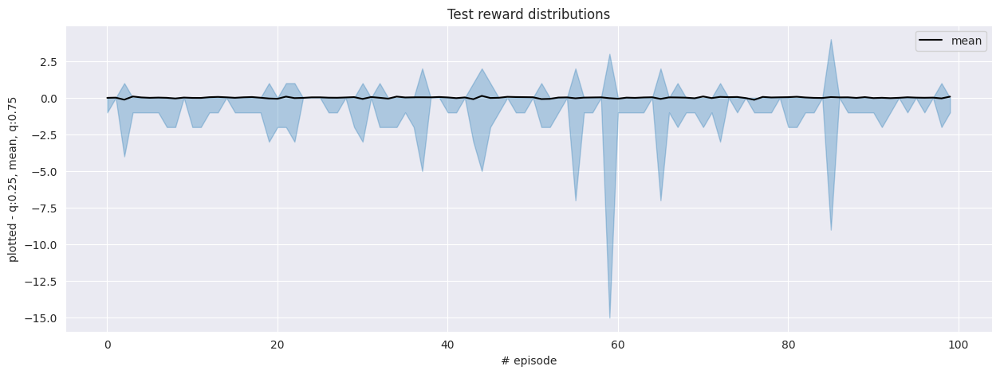

In [154]:
plot_graph(l1_r, 'Test reward distributions')

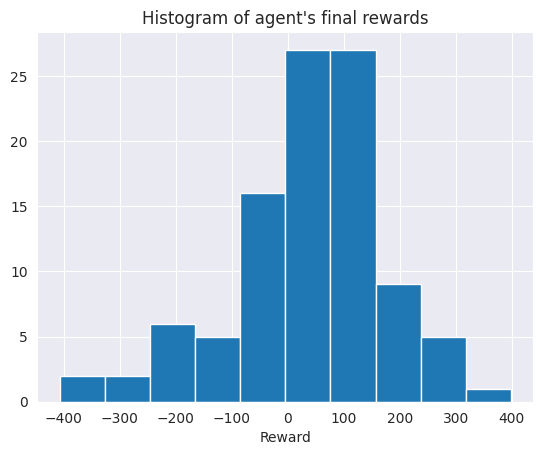

In [155]:
plot_hist(l2_r)

In [157]:
np.mean(l2_r), np.std(l2_r)

(34.79, 136.2057484102635)

In [162]:
rvs2 = stats.norm.rvs(loc=0, scale=round(np.std(l2_r)), size=100)
stats.ttest_ind(l2_r, rvs2)

TtestResult(statistic=1.7165406902149034, pvalue=0.08762702463122904, df=198.0)

# Reinforce

In [3]:
agent_str = 'reinforce'

In [16]:
%%capture
!mkdir -p "rl_hse/$agent_str"

## V1

In [17]:
type = 'v1'

- Adam learning rate = 1e-3
- LayerNorm: yes

In [18]:
agent = return_reinforce(1e-3, True)

In [19]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_reinforce)


  0%|          | 0/500 [00:00<?, ?it/s]


  0%|          | 1/500 [00:09<1:18:25,  9.43s/it]


  0%|          | 2/500 [00:18<1:16:34,  9.23s/it]


  1%|          | 3/500 [00:27<1:16:42,  9.26s/it]

[[10024     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



  1%|          | 4/500 [00:36<1:16:15,  9.22s/it]

[[9997    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  1%|          | 5/500 [00:46<1:15:51,  9.20s/it]

[[10015     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



  1%|          | 6/500 [00:55<1:16:17,  9.27s/it]


  1%|▏         | 7/500 [01:04<1:15:13,  9.15s/it]


  2%|▏         | 8/500 [01:13<1:14:55,  9.14s/it]


  2%|▏         | 9/500 [01:22<1:14:35,  9.12s/it]


  2%|▏         | 10/500 [01:31<1:14:52,  9.17s/it]


  2%|▏         | 11/500 [01:41<1:14:53,  9.19s/it]


  2%|▏         | 12/500 [01:50<1:14:45,  9.19s/it]


  3%|▎         | 13/500 [01:59<1:14:20,  9.16s/it]


  3%|▎         | 14/500 [02:08<1:14:38,  9.21s/it]


  3%|▎         | 15/500 [02:17<1:14:03,  9.16s/it]


  3%|▎         | 16/500 [02:26<1:13:56,  9.17s/it]


  3%|▎         | 17/500 [02:36<1:13:54,  9.18s/it]

[[10042     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



  4%|▎         | 18/500 [02:45<1:14:32,  9.28s/it]


  4%|▍         | 19/500 [02:54<1:13:28,  9.16s/it]


  4%|▍         | 20/500 [03:03<1:13:09,  9.14s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



  4%|▍         | 21/500 [03:12<1:13:20,  9.19s/it]


  4%|▍         | 22/500 [03:22<1:12:45,  9.13s/it]


  5%|▍         | 23/500 [03:31<1:13:17,  9.22s/it]


  5%|▍         | 24/500 [03:40<1:12:44,  9.17s/it]


  5%|▌         | 25/500 [03:50<1:13:27,  9.28s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  5%|▌         | 26/500 [03:59<1:13:03,  9.25s/it]


  5%|▌         | 27/500 [04:08<1:12:56,  9.25s/it]


  6%|▌         | 28/500 [04:17<1:12:18,  9.19s/it]


  6%|▌         | 29/500 [04:26<1:12:11,  9.20s/it]


  6%|▌         | 30/500 [04:35<1:12:06,  9.21s/it]


  6%|▌         | 31/500 [04:45<1:12:43,  9.30s/it]


  6%|▋         | 32/500 [04:54<1:12:29,  9.29s/it]


  7%|▋         | 33/500 [05:04<1:12:24,  9.30s/it]


  7%|▋         | 34/500 [05:13<1:11:48,  9.25s/it]

[[9994    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  7%|▋         | 35/500 [05:22<1:11:36,  9.24s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1



  7%|▋         | 36/500 [05:32<1:12:22,  9.36s/it]


  7%|▋         | 37/500 [05:41<1:12:29,  9.40s/it]


  8%|▊         | 38/500 [05:51<1:13:56,  9.60s/it]


  8%|▊         | 39/500 [06:00<1:12:21,  9.42s/it]


  8%|▊         | 40/500 [06:09<1:11:18,  9.30s/it]


  8%|▊         | 41/500 [06:18<1:10:11,  9.18s/it]


  8%|▊         | 42/500 [06:27<1:09:58,  9.17s/it]


  9%|▊         | 43/500 [06:36<1:09:31,  9.13s/it]


  9%|▉         | 44/500 [06:45<1:09:26,  9.14s/it]

[[9933    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  9%|▉         | 45/500 [06:55<1:09:29,  9.16s/it]

[[10012     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



  9%|▉         | 46/500 [07:04<1:09:48,  9.23s/it]


  9%|▉         | 47/500 [07:13<1:09:00,  9.14s/it]


 10%|▉         | 48/500 [07:22<1:08:50,  9.14s/it]


 10%|▉         | 49/500 [07:31<1:08:38,  9.13s/it]


 10%|█         | 50/500 [07:40<1:08:22,  9.12s/it]


 10%|█         | 51/500 [07:49<1:07:54,  9.07s/it]


 10%|█         | 52/500 [07:58<1:08:09,  9.13s/it]


 11%|█         | 53/500 [08:08<1:08:22,  9.18s/it]


 11%|█         | 54/500 [08:17<1:07:52,  9.13s/it]


 11%|█         | 55/500 [08:26<1:07:54,  9.16s/it]


 11%|█         | 56/500 [08:35<1:07:47,  9.16s/it]


 11%|█▏        | 57/500 [08:44<1:07:49,  9.19s/it]


 12%|█▏        | 58/500 [08:53<1:07:22,  9.14s/it]


 12%|█▏        | 59/500 [09:03<1:07:44,  9.22s/it]


 12%|█▏        | 60/500 [09:12<1:06:58,  9.13s/it]


 12%|█▏        | 61/500 [09:21<1:07:07,  9.17s/it]


 12%|█▏        | 62/500 [09:30<1:06:31,  9.11s/it]


 13%|█▎        | 63/500 [09:39<1:06:44,  9.16s/it]


 13%|█▎        | 64/500 [09:48<1:06:19,  9.13s/it]


 13%|█▎        | 65/500 [09:58<1:06:27,  9.17s/it]

[[9977    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 13%|█▎        | 66/500 [10:07<1:06:19,  9.17s/it]


 13%|█▎        | 67/500 [10:16<1:06:31,  9.22s/it]


 14%|█▎        | 68/500 [10:25<1:06:03,  9.18s/it]


 14%|█▍        | 69/500 [10:34<1:05:23,  9.10s/it]


 14%|█▍        | 70/500 [10:43<1:05:44,  9.17s/it]

[[9969    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 14%|█▍        | 71/500 [10:53<1:05:38,  9.18s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 14%|█▍        | 72/500 [11:02<1:06:25,  9.31s/it]

[[9972    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 15%|█▍        | 73/500 [11:11<1:05:51,  9.25s/it]


 15%|█▍        | 74/500 [11:21<1:05:36,  9.24s/it]


 15%|█▌        | 75/500 [11:30<1:04:56,  9.17s/it]


 15%|█▌        | 76/500 [11:39<1:04:32,  9.13s/it]


 15%|█▌        | 77/500 [11:48<1:04:12,  9.11s/it]


 16%|█▌        | 78/500 [11:57<1:04:03,  9.11s/it]


 16%|█▌        | 79/500 [12:06<1:03:50,  9.10s/it]


 16%|█▌        | 80/500 [12:15<1:04:31,  9.22s/it]


 16%|█▌        | 81/500 [12:25<1:04:15,  9.20s/it]


 16%|█▋        | 82/500 [12:34<1:04:22,  9.24s/it]


 17%|█▋        | 83/500 [12:43<1:03:56,  9.20s/it]


 17%|█▋        | 84/500 [12:52<1:03:47,  9.20s/it]


 17%|█▋        | 85/500 [13:01<1:03:14,  9.14s/it]


 17%|█▋        | 86/500 [13:10<1:02:58,  9.13s/it]


 17%|█▋        | 87/500 [13:20<1:03:21,  9.20s/it]

[[9960    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 18%|█▊        | 88/500 [13:29<1:03:28,  9.24s/it]


 18%|█▊        | 89/500 [13:38<1:03:08,  9.22s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1
[[9973    0    0    0    0    0    0    0    0    0    0]
 [  -4    0    0    0   -1   -1   -1   -1   -1   -1   -1]]
0
-1



 18%|█▊        | 90/500 [13:47<1:02:41,  9.18s/it]

[[9997    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 18%|█▊        | 91/500 [13:57<1:02:47,  9.21s/it]


 18%|█▊        | 92/500 [14:06<1:02:41,  9.22s/it]


 19%|█▊        | 93/500 [14:15<1:02:46,  9.25s/it]


 19%|█▉        | 94/500 [14:24<1:02:28,  9.23s/it]


 19%|█▉        | 95/500 [14:33<1:02:12,  9.22s/it]

[[10021     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 19%|█▉        | 96/500 [14:43<1:01:50,  9.19s/it]


 19%|█▉        | 97/500 [14:52<1:01:57,  9.23s/it]


 20%|█▉        | 98/500 [15:01<1:01:36,  9.20s/it]


 20%|█▉        | 99/500 [15:10<1:01:33,  9.21s/it]

[[9952    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 20%|██        | 100/500 [15:20<1:01:37,  9.24s/it]


 20%|██        | 101/500 [15:29<1:01:36,  9.26s/it]


 20%|██        | 102/500 [15:38<1:01:47,  9.32s/it]


 21%|██        | 103/500 [15:47<1:01:12,  9.25s/it]

[[10009     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 21%|██        | 104/500 [15:57<1:01:03,  9.25s/it]

[[10003     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 21%|██        | 105/500 [16:06<1:00:59,  9.26s/it]

[[10045     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 21%|██        | 106/500 [16:15<1:01:02,  9.30s/it]


 21%|██▏       | 107/500 [16:25<1:00:38,  9.26s/it]


 22%|██▏       | 108/500 [16:34<1:01:02,  9.34s/it]


 22%|██▏       | 109/500 [16:43<1:00:29,  9.28s/it]


 22%|██▏       | 110/500 [16:52<59:57,  9.22s/it]  

[[9971    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4



 22%|██▏       | 111/500 [17:02<59:57,  9.25s/it]


 22%|██▏       | 112/500 [17:11<1:00:04,  9.29s/it]


 23%|██▎       | 113/500 [17:20<59:34,  9.24s/it]  


 23%|██▎       | 114/500 [17:29<59:33,  9.26s/it]


 23%|██▎       | 115/500 [17:39<59:25,  9.26s/it]


 23%|██▎       | 116/500 [17:48<59:10,  9.25s/it]


 23%|██▎       | 117/500 [17:57<58:56,  9.23s/it]


 24%|██▎       | 118/500 [18:06<58:49,  9.24s/it]


 24%|██▍       | 119/500 [18:16<58:39,  9.24s/it]


 24%|██▍       | 120/500 [18:25<57:57,  9.15s/it]

[[9966    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 24%|██▍       | 121/500 [18:34<58:13,  9.22s/it]

[[10005     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 24%|██▍       | 122/500 [18:43<58:16,  9.25s/it]


 25%|██▍       | 123/500 [18:53<58:14,  9.27s/it]


 25%|██▍       | 124/500 [19:02<57:41,  9.20s/it]


 25%|██▌       | 125/500 [19:11<58:18,  9.33s/it]


 25%|██▌       | 126/500 [19:20<57:46,  9.27s/it]


 25%|██▌       | 127/500 [19:30<57:54,  9.31s/it]


 26%|██▌       | 128/500 [19:39<58:01,  9.36s/it]


 26%|██▌       | 129/500 [19:49<58:36,  9.48s/it]


 26%|██▌       | 130/500 [19:58<58:01,  9.41s/it]


 26%|██▌       | 131/500 [20:08<57:56,  9.42s/it]


 26%|██▋       | 132/500 [20:17<57:48,  9.43s/it]


 27%|██▋       | 133/500 [20:26<57:16,  9.36s/it]


 27%|██▋       | 134/500 [20:36<57:28,  9.42s/it]


 27%|██▋       | 135/500 [20:45<56:59,  9.37s/it]


 27%|██▋       | 136/500 [20:54<56:34,  9.33s/it]

[[9984    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 27%|██▋       | 137/500 [21:04<56:33,  9.35s/it]


 28%|██▊       | 138/500 [21:13<56:23,  9.35s/it]


 28%|██▊       | 139/500 [21:22<56:00,  9.31s/it]

[[9966    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 28%|██▊       | 140/500 [21:32<56:03,  9.34s/it]

[[9945    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 28%|██▊       | 141/500 [21:41<55:40,  9.31s/it]

[[9963    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 28%|██▊       | 142/500 [21:50<55:41,  9.33s/it]


 29%|██▊       | 143/500 [21:59<55:03,  9.25s/it]

[[10010     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 29%|██▉       | 144/500 [22:09<56:03,  9.45s/it]


 29%|██▉       | 145/500 [22:18<55:22,  9.36s/it]


 29%|██▉       | 146/500 [22:28<55:26,  9.40s/it]


 29%|██▉       | 147/500 [22:37<54:47,  9.31s/it]


 30%|██▉       | 148/500 [22:46<54:40,  9.32s/it]

[[9944    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 30%|██▉       | 149/500 [22:56<54:40,  9.35s/it]


 30%|███       | 150/500 [23:05<54:49,  9.40s/it]


 30%|███       | 151/500 [23:14<54:14,  9.33s/it]


 30%|███       | 152/500 [23:24<54:12,  9.35s/it]


 31%|███       | 153/500 [23:33<54:01,  9.34s/it]


 31%|███       | 154/500 [23:42<53:16,  9.24s/it]


 31%|███       | 155/500 [23:52<53:21,  9.28s/it]


 31%|███       | 156/500 [24:01<53:18,  9.30s/it]


 31%|███▏      | 157/500 [24:10<53:11,  9.31s/it]

[[10030     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 32%|███▏      | 158/500 [24:19<52:53,  9.28s/it]

[[10005     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 32%|███▏      | 159/500 [24:29<52:53,  9.31s/it]


 32%|███▏      | 160/500 [24:38<52:38,  9.29s/it]


 32%|███▏      | 161/500 [24:48<52:55,  9.37s/it]


 32%|███▏      | 162/500 [24:57<52:44,  9.36s/it]


 33%|███▎      | 163/500 [25:06<52:35,  9.36s/it]


 33%|███▎      | 164/500 [25:16<52:20,  9.35s/it]


 33%|███▎      | 165/500 [25:25<52:26,  9.39s/it]


 33%|███▎      | 166/500 [25:35<53:00,  9.52s/it]


 33%|███▎      | 167/500 [25:44<52:27,  9.45s/it]


 34%|███▎      | 168/500 [25:53<51:51,  9.37s/it]

[[9953    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 34%|███▍      | 169/500 [26:03<51:42,  9.37s/it]


 34%|███▍      | 170/500 [26:12<51:42,  9.40s/it]

[[10020     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 34%|███▍      | 171/500 [26:22<51:34,  9.41s/it]


 34%|███▍      | 172/500 [26:31<51:14,  9.37s/it]

[[10034     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 35%|███▍      | 173/500 [26:40<51:05,  9.37s/it]

[[9959    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 35%|███▍      | 174/500 [26:50<51:07,  9.41s/it]

[[10006     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 35%|███▌      | 175/500 [26:59<50:45,  9.37s/it]

[[9997    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6



 35%|███▌      | 176/500 [27:09<50:58,  9.44s/it]


 35%|███▌      | 177/500 [27:18<50:27,  9.37s/it]

[[9988    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 36%|███▌      | 178/500 [27:27<50:14,  9.36s/it]


 36%|███▌      | 179/500 [27:37<49:48,  9.31s/it]


 36%|███▌      | 180/500 [27:46<50:06,  9.40s/it]


 36%|███▌      | 181/500 [27:55<49:49,  9.37s/it]


 36%|███▋      | 182/500 [28:05<50:01,  9.44s/it]


 37%|███▋      | 183/500 [28:14<49:36,  9.39s/it]


 37%|███▋      | 184/500 [28:24<49:30,  9.40s/it]


 37%|███▋      | 185/500 [28:33<49:45,  9.48s/it]

[[10024     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 37%|███▋      | 186/500 [28:43<50:08,  9.58s/it]

[[9999    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 37%|███▋      | 187/500 [28:53<50:14,  9.63s/it]

[[9946    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 38%|███▊      | 188/500 [29:02<49:39,  9.55s/it]

[[9997    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 38%|███▊      | 189/500 [29:12<49:32,  9.56s/it]


 38%|███▊      | 190/500 [29:21<48:50,  9.45s/it]


 38%|███▊      | 191/500 [29:30<48:31,  9.42s/it]


 38%|███▊      | 192/500 [29:40<48:02,  9.36s/it]


 39%|███▊      | 193/500 [29:49<48:04,  9.40s/it]


 39%|███▉      | 194/500 [29:58<47:41,  9.35s/it]


 39%|███▉      | 195/500 [30:08<47:21,  9.32s/it]


 39%|███▉      | 196/500 [30:17<47:08,  9.30s/it]


 39%|███▉      | 197/500 [30:26<47:18,  9.37s/it]


 40%|███▉      | 198/500 [30:36<46:49,  9.30s/it]

[[9979    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3



 40%|███▉      | 199/500 [30:45<47:06,  9.39s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 40%|████      | 200/500 [30:55<47:17,  9.46s/it]

[[10033     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 40%|████      | 201/500 [31:04<46:42,  9.37s/it]


 40%|████      | 202/500 [31:13<46:16,  9.32s/it]


 41%|████      | 203/500 [31:22<45:51,  9.27s/it]


 41%|████      | 204/500 [31:32<46:05,  9.34s/it]


 41%|████      | 205/500 [31:41<45:54,  9.34s/it]


 41%|████      | 206/500 [31:51<45:53,  9.36s/it]


 41%|████▏     | 207/500 [32:00<45:57,  9.41s/it]


 42%|████▏     | 208/500 [32:10<45:52,  9.43s/it]

[[9978    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 42%|████▏     | 209/500 [32:19<45:29,  9.38s/it]


 42%|████▏     | 210/500 [32:28<45:22,  9.39s/it]


 42%|████▏     | 211/500 [32:38<45:05,  9.36s/it]


 42%|████▏     | 212/500 [32:47<45:01,  9.38s/it]


 43%|████▎     | 213/500 [32:56<44:29,  9.30s/it]


 43%|████▎     | 214/500 [33:06<44:57,  9.43s/it]

[[9957    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 43%|████▎     | 215/500 [33:15<44:52,  9.45s/it]


 43%|████▎     | 216/500 [33:25<44:43,  9.45s/it]


 43%|████▎     | 217/500 [33:34<44:33,  9.45s/it]


 44%|████▎     | 218/500 [33:43<44:01,  9.37s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 44%|████▍     | 219/500 [33:53<43:39,  9.32s/it]


 44%|████▍     | 220/500 [34:02<43:21,  9.29s/it]


 44%|████▍     | 221/500 [34:11<43:14,  9.30s/it]


 44%|████▍     | 222/500 [34:20<42:49,  9.24s/it]


 45%|████▍     | 223/500 [34:29<42:33,  9.22s/it]

[[10020     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 45%|████▍     | 224/500 [34:39<42:35,  9.26s/it]


 45%|████▌     | 225/500 [34:48<42:18,  9.23s/it]


 45%|████▌     | 226/500 [34:57<41:56,  9.18s/it]


 45%|████▌     | 227/500 [35:06<42:10,  9.27s/it]


 46%|████▌     | 228/500 [35:16<41:54,  9.24s/it]


 46%|████▌     | 229/500 [35:25<41:59,  9.30s/it]


 46%|████▌     | 230/500 [35:34<41:30,  9.22s/it]


 46%|████▌     | 231/500 [35:44<41:48,  9.32s/it]

[[9979    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 46%|████▋     | 232/500 [35:53<41:34,  9.31s/it]

[[9964    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 47%|████▋     | 233/500 [36:02<41:37,  9.35s/it]

[[9960    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 47%|████▋     | 234/500 [36:12<41:41,  9.40s/it]


 47%|████▋     | 235/500 [36:21<41:26,  9.38s/it]


 47%|████▋     | 236/500 [36:31<41:16,  9.38s/it]


 47%|████▋     | 237/500 [36:40<41:05,  9.38s/it]


 48%|████▊     | 238/500 [36:49<41:05,  9.41s/it]


 48%|████▊     | 239/500 [36:59<40:42,  9.36s/it]


 48%|████▊     | 240/500 [37:08<40:49,  9.42s/it]

[[9952    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 48%|████▊     | 241/500 [37:18<40:55,  9.48s/it]


 48%|████▊     | 242/500 [37:27<40:45,  9.48s/it]


 49%|████▊     | 243/500 [37:37<40:26,  9.44s/it]


 49%|████▉     | 244/500 [37:46<40:19,  9.45s/it]


 49%|████▉     | 245/500 [37:55<39:57,  9.40s/it]

[[10008     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 49%|████▉     | 246/500 [38:05<39:39,  9.37s/it]


 49%|████▉     | 247/500 [38:14<39:28,  9.36s/it]


 50%|████▉     | 248/500 [38:23<39:01,  9.29s/it]

[[9991    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 50%|████▉     | 249/500 [38:33<39:08,  9.36s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 50%|█████     | 250/500 [38:42<38:42,  9.29s/it]


 50%|█████     | 251/500 [38:51<38:39,  9.31s/it]


 50%|█████     | 252/500 [39:00<38:23,  9.29s/it]


 51%|█████     | 253/500 [39:10<38:12,  9.28s/it]


 51%|█████     | 254/500 [39:19<37:43,  9.20s/it]


 51%|█████     | 255/500 [39:28<37:50,  9.27s/it]


 51%|█████     | 256/500 [39:37<37:19,  9.18s/it]


 51%|█████▏    | 257/500 [39:46<37:10,  9.18s/it]


 52%|█████▏    | 258/500 [39:55<36:48,  9.13s/it]


 52%|█████▏    | 259/500 [40:05<36:53,  9.18s/it]


 52%|█████▏    | 260/500 [40:14<36:37,  9.16s/it]

[[9942    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 52%|█████▏    | 261/500 [40:23<36:42,  9.21s/it]


 52%|█████▏    | 262/500 [40:32<36:37,  9.23s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 53%|█████▎    | 263/500 [40:42<36:38,  9.27s/it]


 53%|█████▎    | 264/500 [40:51<36:23,  9.25s/it]


 53%|█████▎    | 265/500 [41:00<36:27,  9.31s/it]

[[9951    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 53%|█████▎    | 266/500 [41:10<36:39,  9.40s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 53%|█████▎    | 267/500 [41:19<36:26,  9.39s/it]


 54%|█████▎    | 268/500 [41:29<36:07,  9.34s/it]


 54%|█████▍    | 269/500 [41:38<35:53,  9.32s/it]


 54%|█████▍    | 270/500 [41:47<35:37,  9.29s/it]

[[10012     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 54%|█████▍    | 271/500 [41:56<35:22,  9.27s/it]


 54%|█████▍    | 272/500 [42:06<35:29,  9.34s/it]

[[9998    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 55%|█████▍    | 273/500 [42:15<35:09,  9.29s/it]

[[9946    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 55%|█████▍    | 274/500 [42:24<34:50,  9.25s/it]


 55%|█████▌    | 275/500 [42:33<34:23,  9.17s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 55%|█████▌    | 276/500 [42:42<34:23,  9.21s/it]


 55%|█████▌    | 277/500 [42:52<34:12,  9.20s/it]


 56%|█████▌    | 278/500 [43:01<34:01,  9.20s/it]


 56%|█████▌    | 279/500 [43:10<34:12,  9.29s/it]


 56%|█████▌    | 280/500 [43:20<34:01,  9.28s/it]


 56%|█████▌    | 281/500 [43:29<33:43,  9.24s/it]


 56%|█████▋    | 282/500 [43:38<33:31,  9.23s/it]


 57%|█████▋    | 283/500 [43:47<33:33,  9.28s/it]

[[10011     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 57%|█████▋    | 284/500 [43:57<33:31,  9.31s/it]


 57%|█████▋    | 285/500 [44:06<33:15,  9.28s/it]


 57%|█████▋    | 286/500 [44:15<32:59,  9.25s/it]


 57%|█████▋    | 287/500 [44:24<32:43,  9.22s/it]


 58%|█████▊    | 288/500 [44:33<32:37,  9.23s/it]


 58%|█████▊    | 289/500 [44:43<32:34,  9.26s/it]

[[9938    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 58%|█████▊    | 290/500 [44:52<32:19,  9.24s/it]


 58%|█████▊    | 291/500 [45:01<32:14,  9.26s/it]


 58%|█████▊    | 292/500 [45:10<31:56,  9.21s/it]

[[9976    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5



 59%|█████▊    | 293/500 [45:20<32:17,  9.36s/it]


 59%|█████▉    | 294/500 [45:29<32:00,  9.32s/it]


 59%|█████▉    | 295/500 [45:39<32:01,  9.37s/it]


 59%|█████▉    | 296/500 [45:48<31:40,  9.32s/it]


 59%|█████▉    | 297/500 [45:57<31:29,  9.31s/it]


 60%|█████▉    | 298/500 [46:06<31:09,  9.26s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 60%|█████▉    | 299/500 [46:16<31:05,  9.28s/it]


 60%|██████    | 300/500 [46:25<30:45,  9.23s/it]


 60%|██████    | 301/500 [46:34<30:24,  9.17s/it]


 60%|██████    | 302/500 [46:43<30:27,  9.23s/it]


 61%|██████    | 303/500 [46:52<30:13,  9.20s/it]


 61%|██████    | 304/500 [47:02<30:01,  9.19s/it]

[[9980    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 61%|██████    | 305/500 [47:11<29:48,  9.17s/it]


 61%|██████    | 306/500 [47:20<29:41,  9.19s/it]


 61%|██████▏   | 307/500 [47:29<29:29,  9.17s/it]

[[9973    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 62%|██████▏   | 308/500 [47:39<29:44,  9.29s/it]


 62%|██████▏   | 309/500 [47:48<29:26,  9.25s/it]


 62%|██████▏   | 310/500 [47:57<29:22,  9.28s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 62%|██████▏   | 311/500 [48:06<29:12,  9.27s/it]

[[9991    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5



 62%|██████▏   | 312/500 [48:16<29:05,  9.29s/it]

[[10004     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 63%|██████▎   | 313/500 [48:25<28:57,  9.29s/it]


 63%|██████▎   | 314/500 [48:34<28:33,  9.21s/it]


 63%|██████▎   | 315/500 [48:43<28:34,  9.27s/it]


 63%|██████▎   | 316/500 [48:52<28:11,  9.19s/it]

[[10018     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1



 63%|██████▎   | 317/500 [49:02<28:40,  9.40s/it]


 64%|██████▎   | 318/500 [49:12<28:19,  9.34s/it]


 64%|██████▍   | 319/500 [49:21<28:10,  9.34s/it]


 64%|██████▍   | 320/500 [49:30<27:55,  9.31s/it]


 64%|██████▍   | 321/500 [49:40<27:50,  9.33s/it]


 64%|██████▍   | 322/500 [49:49<27:31,  9.28s/it]


 65%|██████▍   | 323/500 [49:58<27:16,  9.25s/it]

[[9992    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 65%|██████▍   | 324/500 [50:07<27:15,  9.29s/it]


 65%|██████▌   | 325/500 [50:17<27:04,  9.28s/it]


 65%|██████▌   | 326/500 [50:25<26:35,  9.17s/it]


 65%|██████▌   | 327/500 [50:34<26:09,  9.07s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 66%|██████▌   | 328/500 [50:44<26:20,  9.19s/it]


 66%|██████▌   | 329/500 [50:53<26:13,  9.20s/it]

[[10037     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1



 66%|██████▌   | 330/500 [51:02<26:16,  9.28s/it]


 66%|██████▌   | 331/500 [51:12<25:58,  9.22s/it]


 66%|██████▋   | 332/500 [51:21<25:47,  9.21s/it]


 67%|██████▋   | 333/500 [51:30<25:29,  9.16s/it]


 67%|██████▋   | 334/500 [51:39<25:26,  9.20s/it]


 67%|██████▋   | 335/500 [51:48<25:13,  9.17s/it]

[[9997    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 67%|██████▋   | 336/500 [51:58<25:30,  9.33s/it]


 67%|██████▋   | 337/500 [52:07<25:02,  9.22s/it]


 68%|██████▊   | 338/500 [52:16<24:56,  9.24s/it]


 68%|██████▊   | 339/500 [52:25<24:30,  9.13s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 68%|██████▊   | 340/500 [52:35<24:41,  9.26s/it]

[[9944    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 68%|██████▊   | 341/500 [52:44<24:24,  9.21s/it]


 68%|██████▊   | 342/500 [52:53<24:18,  9.23s/it]


 69%|██████▊   | 343/500 [53:02<24:01,  9.18s/it]


 69%|██████▉   | 344/500 [53:11<23:54,  9.20s/it]


 69%|██████▉   | 345/500 [53:20<23:43,  9.18s/it]


 69%|██████▉   | 346/500 [53:29<23:32,  9.17s/it]


 69%|██████▉   | 347/500 [53:39<23:23,  9.18s/it]


 70%|██████▉   | 348/500 [53:48<23:02,  9.09s/it]


 70%|██████▉   | 349/500 [53:57<22:57,  9.12s/it]


 70%|███████   | 350/500 [54:06<22:34,  9.03s/it]


 70%|███████   | 351/500 [54:15<22:23,  9.01s/it]

[[10019     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 70%|███████   | 352/500 [54:23<22:08,  8.98s/it]


 71%|███████   | 353/500 [54:33<22:06,  9.02s/it]


 71%|███████   | 354/500 [54:41<21:52,  8.99s/it]


 71%|███████   | 355/500 [54:51<21:49,  9.03s/it]


 71%|███████   | 356/500 [55:00<21:36,  9.00s/it]


 71%|███████▏  | 357/500 [55:09<21:29,  9.02s/it]


 72%|███████▏  | 358/500 [55:17<21:07,  8.93s/it]

[[10016     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 72%|███████▏  | 359/500 [55:27<21:26,  9.13s/it]


 72%|███████▏  | 360/500 [55:36<21:13,  9.10s/it]


 72%|███████▏  | 361/500 [55:45<21:13,  9.16s/it]


 72%|███████▏  | 362/500 [55:54<20:57,  9.11s/it]


 73%|███████▎  | 363/500 [56:03<20:50,  9.13s/it]


 73%|███████▎  | 364/500 [56:12<20:37,  9.10s/it]


 73%|███████▎  | 365/500 [56:21<20:22,  9.06s/it]

[[10010     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 73%|███████▎  | 366/500 [56:31<20:24,  9.14s/it]


 73%|███████▎  | 367/500 [56:40<20:22,  9.19s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 74%|███████▎  | 368/500 [56:50<20:25,  9.28s/it]


 74%|███████▍  | 369/500 [56:59<20:03,  9.19s/it]


 74%|███████▍  | 370/500 [57:08<19:57,  9.21s/it]


 74%|███████▍  | 371/500 [57:17<19:35,  9.11s/it]


 74%|███████▍  | 372/500 [57:26<19:33,  9.16s/it]


 75%|███████▍  | 373/500 [57:35<19:17,  9.11s/it]


 75%|███████▍  | 374/500 [57:44<19:09,  9.13s/it]

[[9945    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 75%|███████▌  | 375/500 [57:53<19:08,  9.19s/it]


 75%|███████▌  | 376/500 [58:03<19:00,  9.20s/it]


 75%|███████▌  | 377/500 [58:12<18:40,  9.11s/it]


 76%|███████▌  | 378/500 [58:21<18:30,  9.11s/it]


 76%|███████▌  | 379/500 [58:30<18:18,  9.07s/it]


 76%|███████▌  | 380/500 [58:39<18:19,  9.16s/it]


 76%|███████▌  | 381/500 [58:48<18:06,  9.13s/it]


 76%|███████▋  | 382/500 [58:57<17:54,  9.11s/it]

[[10010     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 77%|███████▋  | 383/500 [59:07<17:55,  9.19s/it]


 77%|███████▋  | 384/500 [59:16<17:47,  9.20s/it]


 77%|███████▋  | 385/500 [59:25<17:36,  9.19s/it]


 77%|███████▋  | 386/500 [59:34<17:31,  9.22s/it]


 77%|███████▋  | 387/500 [59:44<17:26,  9.26s/it]


 78%|███████▊  | 388/500 [59:53<17:16,  9.25s/it]


 78%|███████▊  | 389/500 [1:00:02<17:07,  9.26s/it]


 78%|███████▊  | 390/500 [1:00:11<16:55,  9.23s/it]


 78%|███████▊  | 391/500 [1:00:20<16:46,  9.24s/it]


 78%|███████▊  | 392/500 [1:00:29<16:29,  9.16s/it]


 79%|███████▊  | 393/500 [1:00:39<16:26,  9.22s/it]

[[9990    0    0    0    0    0    0    0    0    0   14]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 79%|███████▉  | 394/500 [1:00:48<16:23,  9.28s/it]


 79%|███████▉  | 395/500 [1:00:57<16:07,  9.21s/it]


 79%|███████▉  | 396/500 [1:01:06<15:55,  9.18s/it]


 79%|███████▉  | 397/500 [1:01:16<15:48,  9.21s/it]


 80%|███████▉  | 398/500 [1:01:25<15:34,  9.16s/it]


 80%|███████▉  | 399/500 [1:01:34<15:18,  9.09s/it]


 80%|████████  | 400/500 [1:01:43<15:10,  9.11s/it]


 80%|████████  | 401/500 [1:01:52<15:02,  9.12s/it]


 80%|████████  | 402/500 [1:02:01<14:58,  9.17s/it]


 81%|████████  | 403/500 [1:02:10<14:41,  9.09s/it]


 81%|████████  | 404/500 [1:02:20<14:40,  9.17s/it]


 81%|████████  | 405/500 [1:02:28<14:24,  9.10s/it]


 81%|████████  | 406/500 [1:02:38<14:16,  9.11s/it]


 81%|████████▏ | 407/500 [1:02:47<14:05,  9.10s/it]


 82%|████████▏ | 408/500 [1:02:56<14:00,  9.14s/it]


 82%|████████▏ | 409/500 [1:03:05<13:43,  9.05s/it]


 82%|████████▏ | 410/500 [1:03:14<13:40,  9.11s/it]


 82%|████████▏ | 411/500 [1:03:23<13:33,  9.15s/it]


 82%|████████▏ | 412/500 [1:03:32<13:28,  9.18s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 83%|████████▎ | 413/500 [1:03:41<13:14,  9.13s/it]


 83%|████████▎ | 414/500 [1:03:51<13:07,  9.16s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 83%|████████▎ | 415/500 [1:04:00<13:09,  9.28s/it]


 83%|████████▎ | 416/500 [1:04:10<12:58,  9.27s/it]


 83%|████████▎ | 417/500 [1:04:19<12:50,  9.29s/it]


 84%|████████▎ | 418/500 [1:04:28<12:37,  9.24s/it]


 84%|████████▍ | 419/500 [1:04:37<12:30,  9.26s/it]


 84%|████████▍ | 420/500 [1:04:46<12:19,  9.24s/it]

[[9966    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 84%|████████▍ | 421/500 [1:04:56<12:10,  9.25s/it]


 84%|████████▍ | 422/500 [1:05:05<12:00,  9.23s/it]


 85%|████████▍ | 423/500 [1:05:14<11:52,  9.26s/it]


 85%|████████▍ | 424/500 [1:05:23<11:40,  9.21s/it]


 85%|████████▌ | 425/500 [1:05:33<11:38,  9.31s/it]


 85%|████████▌ | 426/500 [1:05:42<11:29,  9.31s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



 85%|████████▌ | 427/500 [1:05:52<11:25,  9.39s/it]


 86%|████████▌ | 428/500 [1:06:01<11:09,  9.29s/it]


 86%|████████▌ | 429/500 [1:06:10<10:57,  9.26s/it]


 86%|████████▌ | 430/500 [1:06:19<10:46,  9.23s/it]


 86%|████████▌ | 431/500 [1:06:28<10:34,  9.20s/it]


 86%|████████▋ | 432/500 [1:06:38<10:34,  9.33s/it]


 87%|████████▋ | 433/500 [1:06:47<10:21,  9.28s/it]

[[10001     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 87%|████████▋ | 434/500 [1:06:56<10:13,  9.29s/it]


 87%|████████▋ | 435/500 [1:07:06<10:01,  9.26s/it]


 87%|████████▋ | 436/500 [1:07:15<09:52,  9.26s/it]


 87%|████████▋ | 437/500 [1:07:24<09:42,  9.25s/it]


 88%|████████▊ | 438/500 [1:07:33<09:32,  9.23s/it]


 88%|████████▊ | 439/500 [1:07:42<09:19,  9.17s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 88%|████████▊ | 440/500 [1:07:52<09:12,  9.21s/it]


 88%|████████▊ | 441/500 [1:08:01<08:59,  9.14s/it]


 88%|████████▊ | 442/500 [1:08:10<08:57,  9.27s/it]


 89%|████████▊ | 443/500 [1:08:19<08:46,  9.24s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 89%|████████▉ | 444/500 [1:08:29<08:41,  9.32s/it]

[[9998    0    0    0    0    0    0    0    0    0   14]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 89%|████████▉ | 445/500 [1:08:38<08:36,  9.39s/it]


 89%|████████▉ | 446/500 [1:08:48<08:27,  9.40s/it]


 89%|████████▉ | 447/500 [1:08:57<08:12,  9.29s/it]

[[9985    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 90%|████████▉ | 448/500 [1:09:06<08:04,  9.32s/it]

[[10011     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 90%|████████▉ | 449/500 [1:09:16<07:53,  9.29s/it]


 90%|█████████ | 450/500 [1:09:25<07:42,  9.26s/it]


 90%|█████████ | 451/500 [1:09:34<07:33,  9.25s/it]

[[9952    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 90%|█████████ | 452/500 [1:09:43<07:26,  9.31s/it]


 91%|█████████ | 453/500 [1:09:53<07:18,  9.33s/it]


 91%|█████████ | 454/500 [1:10:02<07:05,  9.25s/it]


 91%|█████████ | 455/500 [1:10:11<06:55,  9.23s/it]


 91%|█████████ | 456/500 [1:10:20<06:42,  9.14s/it]


 91%|█████████▏| 457/500 [1:10:29<06:34,  9.19s/it]


 92%|█████████▏| 458/500 [1:10:38<06:22,  9.11s/it]


 92%|█████████▏| 459/500 [1:10:47<06:13,  9.12s/it]


 92%|█████████▏| 460/500 [1:10:56<06:03,  9.10s/it]


 92%|█████████▏| 461/500 [1:11:06<05:56,  9.15s/it]


 92%|█████████▏| 462/500 [1:11:15<05:45,  9.09s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 93%|█████████▎| 463/500 [1:11:24<05:38,  9.15s/it]


 93%|█████████▎| 464/500 [1:11:33<05:27,  9.09s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 93%|█████████▎| 465/500 [1:11:42<05:21,  9.20s/it]


 93%|█████████▎| 466/500 [1:11:51<05:11,  9.17s/it]

[[9992    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 93%|█████████▎| 467/500 [1:12:00<05:02,  9.16s/it]

[[9932    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 94%|█████████▎| 468/500 [1:12:10<04:53,  9.18s/it]


 94%|█████████▍| 469/500 [1:12:19<04:42,  9.13s/it]


 94%|█████████▍| 470/500 [1:12:28<04:34,  9.15s/it]


 94%|█████████▍| 471/500 [1:12:37<04:27,  9.21s/it]

[[10018     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 94%|█████████▍| 472/500 [1:12:47<04:19,  9.27s/it]


 95%|█████████▍| 473/500 [1:12:56<04:09,  9.26s/it]


 95%|█████████▍| 474/500 [1:13:05<04:01,  9.29s/it]


 95%|█████████▌| 475/500 [1:13:14<03:50,  9.22s/it]


 95%|█████████▌| 476/500 [1:13:24<03:42,  9.26s/it]


 95%|█████████▌| 477/500 [1:13:33<03:34,  9.34s/it]


 96%|█████████▌| 478/500 [1:13:43<03:26,  9.37s/it]


 96%|█████████▌| 479/500 [1:13:52<03:14,  9.25s/it]


 96%|█████████▌| 480/500 [1:14:01<03:05,  9.26s/it]


 96%|█████████▌| 481/500 [1:14:10<02:55,  9.23s/it]


 96%|█████████▋| 482/500 [1:14:19<02:46,  9.28s/it]

[[9953    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 97%|█████████▋| 483/500 [1:14:29<02:36,  9.23s/it]


 97%|█████████▋| 484/500 [1:14:38<02:27,  9.21s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 97%|█████████▋| 485/500 [1:14:47<02:19,  9.32s/it]


 97%|█████████▋| 486/500 [1:14:57<02:10,  9.30s/it]


 97%|█████████▋| 487/500 [1:15:06<02:02,  9.42s/it]


 98%|█████████▊| 488/500 [1:15:16<01:52,  9.38s/it]


 98%|█████████▊| 489/500 [1:15:25<01:43,  9.42s/it]


 98%|█████████▊| 490/500 [1:15:34<01:33,  9.33s/it]


 98%|█████████▊| 491/500 [1:15:44<01:24,  9.39s/it]


 98%|█████████▊| 492/500 [1:15:53<01:14,  9.32s/it]


 99%|█████████▊| 493/500 [1:16:02<01:05,  9.31s/it]


 99%|█████████▉| 494/500 [1:16:11<00:55,  9.26s/it]


 99%|█████████▉| 495/500 [1:16:21<00:46,  9.33s/it]


 99%|█████████▉| 496/500 [1:16:30<00:37,  9.29s/it]


 99%|█████████▉| 497/500 [1:16:39<00:28,  9.34s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



100%|█████████▉| 498/500 [1:16:49<00:18,  9.37s/it]


100%|█████████▉| 499/500 [1:16:58<00:09,  9.34s/it]


100%|██████████| 500/500 [1:17:07<00:00,  9.31s/it]


100%|██████████| 500/500 [1:17:07<00:00,  9.26s/it]

done


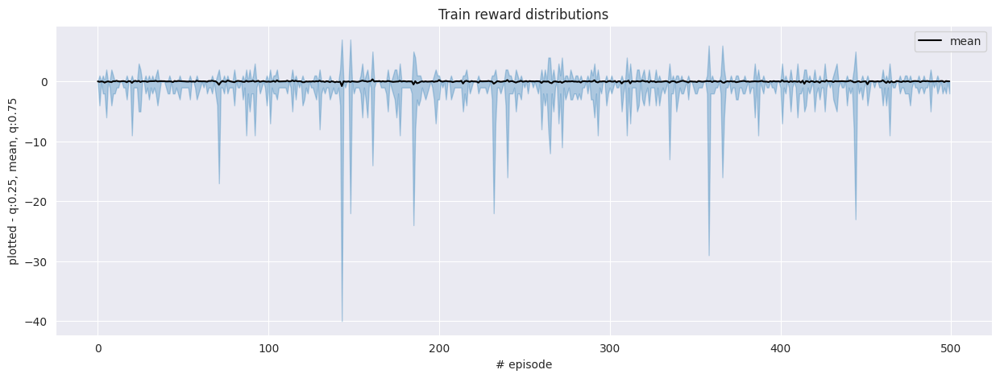

In [20]:
plot_graph(r1_list, 'Train reward distributions')

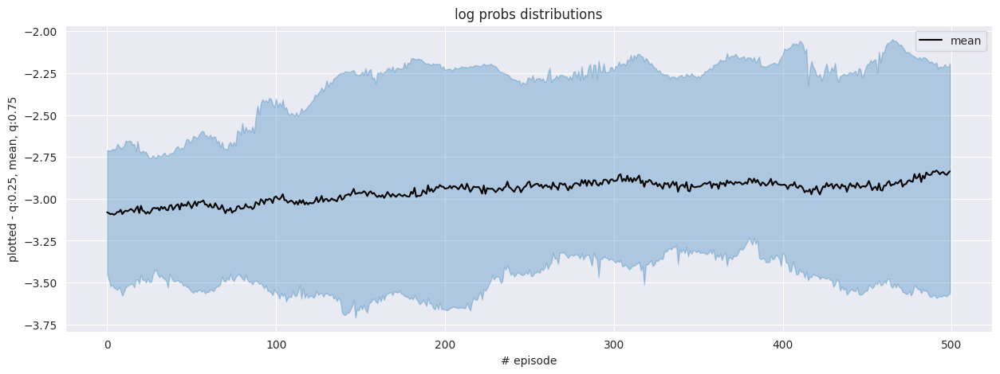

In [21]:
plot_graph(r2_list, 'log probs distributions')

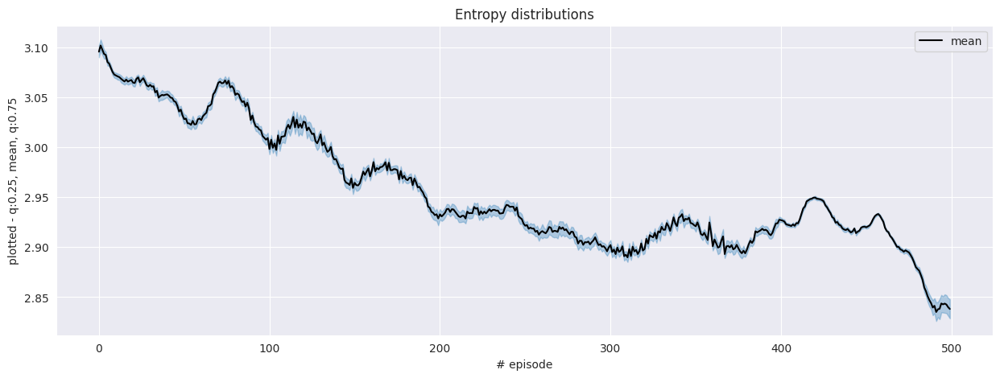

In [22]:
plot_graph(r3_list, 'Entropy distributions')

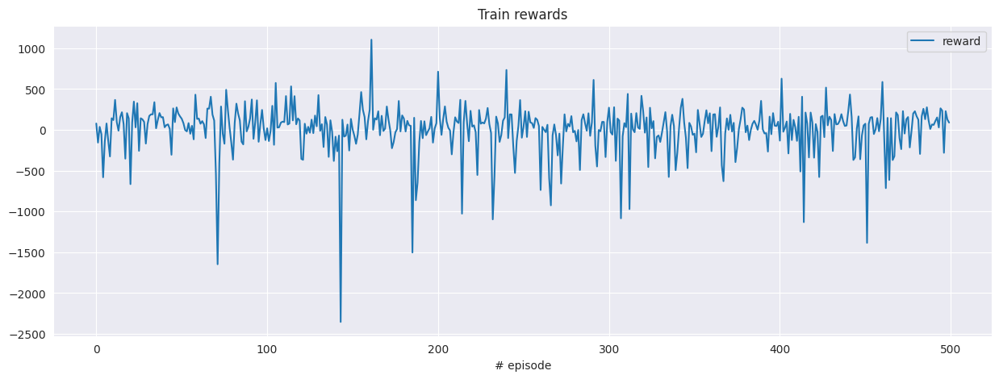

In [23]:
plot_rs(r4_list, 'Train rewards')

In [24]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [25]:
l1_r, l2_r = [], []

test_agent(agent, env)


  0%|          | 0/100 [00:00<?, ?it/s]


  1%|          | 1/100 [00:06<10:55,  6.62s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1



  2%|▏         | 2/100 [00:12<10:30,  6.43s/it]


  3%|▎         | 3/100 [00:19<10:16,  6.35s/it]


  4%|▍         | 4/100 [00:25<10:09,  6.34s/it]


  5%|▌         | 5/100 [00:31<10:04,  6.36s/it]


  6%|▌         | 6/100 [00:38<10:03,  6.42s/it]


  7%|▋         | 7/100 [00:44<09:55,  6.40s/it]


  8%|▊         | 8/100 [00:51<09:50,  6.42s/it]


  9%|▉         | 9/100 [00:57<09:44,  6.42s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 10%|█         | 10/100 [01:04<09:38,  6.43s/it]


 11%|█         | 11/100 [01:10<09:34,  6.45s/it]


 12%|█▏        | 12/100 [01:17<09:29,  6.47s/it]

[[9997    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 13%|█▎        | 13/100 [01:23<09:19,  6.43s/it]


 14%|█▍        | 14/100 [01:29<09:14,  6.44s/it]


 15%|█▌        | 15/100 [01:36<09:09,  6.47s/it]


 16%|█▌        | 16/100 [01:42<08:59,  6.43s/it]


 17%|█▋        | 17/100 [01:49<08:49,  6.38s/it]


 18%|█▊        | 18/100 [01:55<08:43,  6.38s/it]


 19%|█▉        | 19/100 [02:01<08:35,  6.37s/it]


 20%|██        | 20/100 [02:08<08:26,  6.33s/it]


 21%|██        | 21/100 [02:14<08:27,  6.42s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 22%|██▏       | 22/100 [02:21<08:23,  6.45s/it]


 23%|██▎       | 23/100 [02:27<08:16,  6.45s/it]


 24%|██▍       | 24/100 [02:33<08:07,  6.41s/it]


 25%|██▌       | 25/100 [02:40<08:01,  6.42s/it]


 26%|██▌       | 26/100 [02:46<07:56,  6.44s/it]


 27%|██▋       | 27/100 [02:53<07:48,  6.42s/it]


 28%|██▊       | 28/100 [02:59<07:39,  6.38s/it]


 29%|██▉       | 29/100 [03:06<07:35,  6.42s/it]


 30%|███       | 30/100 [03:12<07:31,  6.45s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4



 31%|███       | 31/100 [03:18<07:22,  6.42s/it]


 32%|███▏      | 32/100 [03:25<07:17,  6.43s/it]


 33%|███▎      | 33/100 [03:31<07:12,  6.46s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3



 34%|███▍      | 34/100 [03:38<07:06,  6.46s/it]


 35%|███▌      | 35/100 [03:44<06:57,  6.43s/it]


 36%|███▌      | 36/100 [03:51<06:51,  6.43s/it]


 37%|███▋      | 37/100 [03:57<06:41,  6.37s/it]


 38%|███▊      | 38/100 [04:03<06:38,  6.42s/it]


 39%|███▉      | 39/100 [04:10<06:32,  6.44s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 40%|████      | 40/100 [04:16<06:23,  6.38s/it]


 41%|████      | 41/100 [04:22<06:15,  6.36s/it]


 42%|████▏     | 42/100 [04:29<06:06,  6.32s/it]


 43%|████▎     | 43/100 [04:35<06:04,  6.40s/it]


 44%|████▍     | 44/100 [04:42<05:58,  6.40s/it]


 45%|████▌     | 45/100 [04:48<05:53,  6.42s/it]


 46%|████▌     | 46/100 [04:55<05:45,  6.41s/it]


 47%|████▋     | 47/100 [05:01<05:39,  6.42s/it]


 48%|████▊     | 48/100 [05:08<05:35,  6.46s/it]


 49%|████▉     | 49/100 [05:14<05:27,  6.42s/it]


 50%|█████     | 50/100 [05:20<05:24,  6.49s/it]

[[9922    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 51%|█████     | 51/100 [05:27<05:17,  6.48s/it]

[[9937    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 52%|█████▏    | 52/100 [05:33<05:10,  6.48s/it]


 53%|█████▎    | 53/100 [05:40<05:05,  6.49s/it]


 54%|█████▍    | 54/100 [05:46<04:57,  6.48s/it]


 55%|█████▌    | 55/100 [05:53<04:52,  6.50s/it]


 56%|█████▌    | 56/100 [05:59<04:43,  6.45s/it]


 57%|█████▋    | 57/100 [06:06<04:38,  6.47s/it]


 58%|█████▊    | 58/100 [06:12<04:29,  6.42s/it]


 59%|█████▉    | 59/100 [06:18<04:22,  6.40s/it]


 60%|██████    | 60/100 [06:25<04:17,  6.44s/it]


 61%|██████    | 61/100 [06:31<04:10,  6.42s/it]


 62%|██████▏   | 62/100 [06:38<04:02,  6.38s/it]


 63%|██████▎   | 63/100 [06:44<03:56,  6.40s/it]


 64%|██████▍   | 64/100 [06:51<03:51,  6.42s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-11



 65%|██████▌   | 65/100 [06:57<03:47,  6.50s/it]

[[9993    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 66%|██████▌   | 66/100 [07:04<03:39,  6.45s/it]


 67%|██████▋   | 67/100 [07:10<03:32,  6.43s/it]


 68%|██████▊   | 68/100 [07:16<03:26,  6.44s/it]


 69%|██████▉   | 69/100 [07:23<03:19,  6.42s/it]


 70%|███████   | 70/100 [07:29<03:12,  6.42s/it]


 71%|███████   | 71/100 [07:36<03:05,  6.40s/it]


 72%|███████▏  | 72/100 [07:42<02:57,  6.34s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 73%|███████▎  | 73/100 [07:48<02:51,  6.36s/it]


 74%|███████▍  | 74/100 [07:54<02:44,  6.33s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 75%|███████▌  | 75/100 [08:01<02:39,  6.38s/it]


 76%|███████▌  | 76/100 [08:07<02:32,  6.35s/it]


 77%|███████▋  | 77/100 [08:14<02:26,  6.36s/it]


 78%|███████▊  | 78/100 [08:20<02:20,  6.38s/it]


 79%|███████▉  | 79/100 [08:26<02:12,  6.33s/it]


 80%|████████  | 80/100 [08:33<02:07,  6.36s/it]


 81%|████████  | 81/100 [08:39<02:01,  6.37s/it]


 82%|████████▏ | 82/100 [08:45<01:54,  6.38s/it]


 83%|████████▎ | 83/100 [08:52<01:48,  6.39s/it]


 84%|████████▍ | 84/100 [08:58<01:41,  6.36s/it]


 85%|████████▌ | 85/100 [09:04<01:35,  6.35s/it]


 86%|████████▌ | 86/100 [09:11<01:28,  6.35s/it]


 87%|████████▋ | 87/100 [09:17<01:22,  6.36s/it]


 88%|████████▊ | 88/100 [09:24<01:16,  6.41s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 89%|████████▉ | 89/100 [09:31<01:11,  6.52s/it]

[[10000     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 90%|█████████ | 90/100 [09:37<01:05,  6.52s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 91%|█████████ | 91/100 [09:43<00:57,  6.43s/it]

[[9923    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 92%|█████████▏| 92/100 [09:50<00:51,  6.38s/it]


 93%|█████████▎| 93/100 [09:56<00:44,  6.37s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 94%|█████████▍| 94/100 [10:02<00:38,  6.37s/it]


 95%|█████████▌| 95/100 [10:09<00:32,  6.40s/it]


 96%|█████████▌| 96/100 [10:15<00:25,  6.38s/it]


 97%|█████████▋| 97/100 [10:22<00:19,  6.40s/it]


 98%|█████████▊| 98/100 [10:28<00:12,  6.40s/it]


 99%|█████████▉| 99/100 [10:34<00:06,  6.41s/it]


100%|██████████| 100/100 [10:41<00:00,  6.45s/it]


100%|██████████| 100/100 [10:41<00:00,  6.41s/it]

done


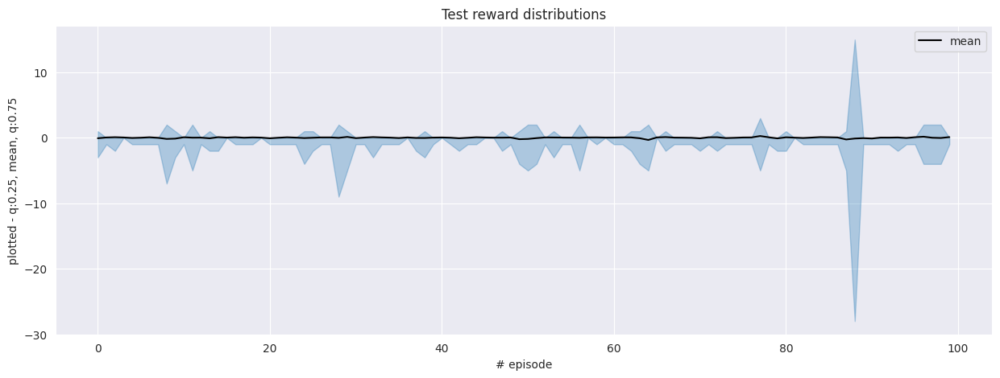

In [26]:
plot_graph(l1_r, 'Test reward distributions')

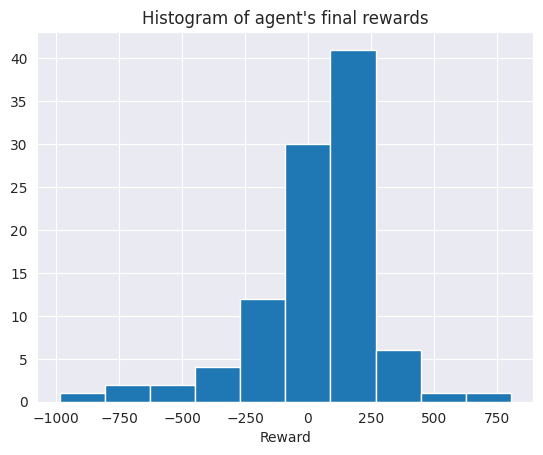

In [27]:
plot_hist(l2_r)

In [28]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V2

In [29]:
type = 'v2'

- Adam learning rate = 1e-3/2
- LayerNorm: yes

In [30]:
agent = return_reinforce(1e-3/2, True)

In [31]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_reinforce)


  0%|          | 0/500 [00:00<?, ?it/s]


  0%|          | 1/500 [00:09<1:19:58,  9.62s/it]


  0%|          | 2/500 [00:18<1:18:27,  9.45s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1



  1%|          | 3/500 [00:28<1:20:22,  9.70s/it]


  1%|          | 4/500 [00:38<1:19:25,  9.61s/it]


  1%|          | 5/500 [00:47<1:17:54,  9.44s/it]


  1%|          | 6/500 [00:56<1:17:37,  9.43s/it]


  1%|▏         | 7/500 [01:06<1:16:52,  9.36s/it]


  2%|▏         | 8/500 [01:15<1:16:16,  9.30s/it]


  2%|▏         | 9/500 [01:24<1:15:35,  9.24s/it]


  2%|▏         | 10/500 [01:33<1:15:49,  9.28s/it]


  2%|▏         | 11/500 [01:43<1:15:30,  9.26s/it]


  2%|▏         | 12/500 [01:52<1:15:21,  9.27s/it]


  3%|▎         | 13/500 [02:01<1:15:07,  9.26s/it]


  3%|▎         | 14/500 [02:10<1:15:11,  9.28s/it]


  3%|▎         | 15/500 [02:19<1:14:18,  9.19s/it]


  3%|▎         | 16/500 [02:29<1:14:35,  9.25s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  3%|▎         | 17/500 [02:38<1:14:35,  9.27s/it]


  4%|▎         | 18/500 [02:47<1:14:40,  9.30s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  4%|▍         | 19/500 [02:57<1:14:01,  9.23s/it]


  4%|▍         | 20/500 [03:06<1:13:42,  9.21s/it]


  4%|▍         | 21/500 [03:15<1:13:38,  9.23s/it]


  4%|▍         | 22/500 [03:24<1:13:22,  9.21s/it]


  5%|▍         | 23/500 [03:33<1:13:33,  9.25s/it]


  5%|▍         | 24/500 [03:43<1:13:25,  9.26s/it]


  5%|▌         | 25/500 [03:52<1:13:46,  9.32s/it]


  5%|▌         | 26/500 [04:01<1:13:08,  9.26s/it]


  5%|▌         | 27/500 [04:11<1:13:20,  9.30s/it]


  6%|▌         | 28/500 [04:20<1:13:05,  9.29s/it]


  6%|▌         | 29/500 [04:29<1:13:04,  9.31s/it]


  6%|▌         | 30/500 [04:38<1:12:25,  9.25s/it]


  6%|▌         | 31/500 [04:48<1:12:45,  9.31s/it]


  6%|▋         | 32/500 [04:57<1:11:54,  9.22s/it]


  7%|▋         | 33/500 [05:06<1:12:20,  9.29s/it]


  7%|▋         | 34/500 [05:16<1:11:53,  9.26s/it]


  7%|▋         | 35/500 [05:25<1:11:41,  9.25s/it]


  7%|▋         | 36/500 [05:34<1:11:01,  9.18s/it]


  7%|▋         | 37/500 [05:43<1:10:36,  9.15s/it]


  8%|▊         | 38/500 [05:52<1:11:08,  9.24s/it]

[[10025     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1



  8%|▊         | 39/500 [06:01<1:10:46,  9.21s/it]


  8%|▊         | 40/500 [06:11<1:10:40,  9.22s/it]


  8%|▊         | 41/500 [06:20<1:11:35,  9.36s/it]


  8%|▊         | 42/500 [06:30<1:10:55,  9.29s/it]


  9%|▊         | 43/500 [06:39<1:10:10,  9.21s/it]


  9%|▉         | 44/500 [06:48<1:10:07,  9.23s/it]


  9%|▉         | 45/500 [06:57<1:09:34,  9.18s/it]


  9%|▉         | 46/500 [07:06<1:09:28,  9.18s/it]


  9%|▉         | 47/500 [07:15<1:09:17,  9.18s/it]


 10%|▉         | 48/500 [07:25<1:09:22,  9.21s/it]


 10%|▉         | 49/500 [07:34<1:09:00,  9.18s/it]


 10%|█         | 50/500 [07:43<1:09:08,  9.22s/it]


 10%|█         | 51/500 [07:52<1:08:39,  9.18s/it]


 10%|█         | 52/500 [08:02<1:09:11,  9.27s/it]


 11%|█         | 53/500 [08:11<1:08:44,  9.23s/it]


 11%|█         | 54/500 [08:20<1:08:19,  9.19s/it]


 11%|█         | 55/500 [08:29<1:09:22,  9.35s/it]


 11%|█         | 56/500 [08:39<1:08:31,  9.26s/it]


 11%|█▏        | 57/500 [08:48<1:08:29,  9.28s/it]


 12%|█▏        | 58/500 [08:57<1:07:49,  9.21s/it]


 12%|█▏        | 59/500 [09:06<1:07:42,  9.21s/it]


 12%|█▏        | 60/500 [09:15<1:07:26,  9.20s/it]


 12%|█▏        | 61/500 [09:25<1:07:38,  9.25s/it]


 12%|█▏        | 62/500 [09:34<1:08:24,  9.37s/it]


 13%|█▎        | 63/500 [09:44<1:08:12,  9.36s/it]


 13%|█▎        | 64/500 [09:53<1:07:32,  9.30s/it]


 13%|█▎        | 65/500 [10:02<1:07:10,  9.27s/it]


 13%|█▎        | 66/500 [10:11<1:06:53,  9.25s/it]


 13%|█▎        | 67/500 [10:20<1:06:38,  9.23s/it]


 14%|█▎        | 68/500 [10:29<1:05:42,  9.13s/it]


 14%|█▍        | 69/500 [10:39<1:07:02,  9.33s/it]


 14%|█▍        | 70/500 [10:48<1:06:32,  9.28s/it]


 14%|█▍        | 71/500 [10:57<1:06:15,  9.27s/it]


 14%|█▍        | 72/500 [11:07<1:05:37,  9.20s/it]


 15%|█▍        | 73/500 [11:16<1:05:20,  9.18s/it]


 15%|█▍        | 74/500 [11:25<1:05:06,  9.17s/it]


 15%|█▌        | 75/500 [11:34<1:04:20,  9.08s/it]


 15%|█▌        | 76/500 [11:43<1:04:48,  9.17s/it]


 15%|█▌        | 77/500 [11:52<1:04:16,  9.12s/it]


 16%|█▌        | 78/500 [12:01<1:04:28,  9.17s/it]


 16%|█▌        | 79/500 [12:10<1:04:04,  9.13s/it]


 16%|█▌        | 80/500 [12:20<1:04:38,  9.23s/it]


 16%|█▌        | 81/500 [12:29<1:04:19,  9.21s/it]


 16%|█▋        | 82/500 [12:38<1:04:36,  9.27s/it]


 17%|█▋        | 83/500 [12:48<1:04:04,  9.22s/it]


 17%|█▋        | 84/500 [12:57<1:03:52,  9.21s/it]


 17%|█▋        | 85/500 [13:06<1:03:26,  9.17s/it]


 17%|█▋        | 86/500 [13:15<1:02:48,  9.10s/it]


 17%|█▋        | 87/500 [13:24<1:02:53,  9.14s/it]


 18%|█▊        | 88/500 [13:33<1:02:33,  9.11s/it]


 18%|█▊        | 89/500 [13:42<1:02:40,  9.15s/it]


 18%|█▊        | 90/500 [13:51<1:02:20,  9.12s/it]


 18%|█▊        | 91/500 [14:00<1:02:09,  9.12s/it]


 18%|█▊        | 92/500 [14:09<1:01:44,  9.08s/it]


 19%|█▊        | 93/500 [14:19<1:01:38,  9.09s/it]


 19%|█▉        | 94/500 [14:28<1:01:35,  9.10s/it]

[[9997    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 19%|█▉        | 95/500 [14:37<1:01:50,  9.16s/it]


 19%|█▉        | 96/500 [14:46<1:01:29,  9.13s/it]


 19%|█▉        | 97/500 [14:55<1:01:23,  9.14s/it]


 20%|█▉        | 98/500 [15:04<1:01:21,  9.16s/it]


 20%|█▉        | 99/500 [15:14<1:01:26,  9.19s/it]


 20%|██        | 100/500 [15:23<1:00:49,  9.12s/it]


 20%|██        | 101/500 [15:32<1:00:46,  9.14s/it]


 20%|██        | 102/500 [15:41<1:00:20,  9.10s/it]


 21%|██        | 103/500 [15:50<1:00:25,  9.13s/it]


 21%|██        | 104/500 [15:59<1:00:26,  9.16s/it]


 21%|██        | 105/500 [16:08<59:54,  9.10s/it]  

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 21%|██        | 106/500 [16:18<1:00:18,  9.18s/it]


 21%|██▏       | 107/500 [16:27<1:00:17,  9.21s/it]


 22%|██▏       | 108/500 [16:36<1:00:13,  9.22s/it]


 22%|██▏       | 109/500 [16:45<59:43,  9.16s/it]  


 22%|██▏       | 110/500 [16:54<59:40,  9.18s/it]


 22%|██▏       | 111/500 [17:04<59:42,  9.21s/it]

[[9978    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 22%|██▏       | 112/500 [17:13<59:52,  9.26s/it]


 23%|██▎       | 113/500 [17:22<59:11,  9.18s/it]

[[9967    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 23%|██▎       | 114/500 [17:31<59:21,  9.23s/it]


 23%|██▎       | 115/500 [17:41<59:10,  9.22s/it]


 23%|██▎       | 116/500 [17:50<59:01,  9.22s/it]


 23%|██▎       | 117/500 [17:59<58:27,  9.16s/it]


 24%|██▎       | 118/500 [18:08<58:28,  9.19s/it]


 24%|██▍       | 119/500 [18:17<58:06,  9.15s/it]


 24%|██▍       | 120/500 [18:26<57:58,  9.15s/it]

[[10005     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 24%|██▍       | 121/500 [18:35<57:28,  9.10s/it]


 24%|██▍       | 122/500 [18:44<57:13,  9.08s/it]


 25%|██▍       | 123/500 [18:53<57:21,  9.13s/it]


 25%|██▍       | 124/500 [19:02<56:43,  9.05s/it]


 25%|██▌       | 125/500 [19:12<57:07,  9.14s/it]


 25%|██▌       | 126/500 [19:21<57:18,  9.19s/it]


 25%|██▌       | 127/500 [19:30<57:27,  9.24s/it]

[[9923    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 26%|██▌       | 128/500 [19:40<57:07,  9.21s/it]


 26%|██▌       | 129/500 [19:49<56:51,  9.20s/it]


 26%|██▌       | 130/500 [19:58<56:20,  9.14s/it]

[[9962    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 26%|██▌       | 131/500 [20:07<56:44,  9.23s/it]

[[10007     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 26%|██▋       | 132/500 [20:16<56:26,  9.20s/it]


 27%|██▋       | 133/500 [20:25<56:13,  9.19s/it]


 27%|██▋       | 134/500 [20:34<55:40,  9.13s/it]


 27%|██▋       | 135/500 [20:44<55:40,  9.15s/it]


 27%|██▋       | 136/500 [20:53<55:33,  9.16s/it]


 27%|██▋       | 137/500 [21:02<55:45,  9.22s/it]


 28%|██▊       | 138/500 [21:11<55:09,  9.14s/it]


 28%|██▊       | 139/500 [21:20<55:02,  9.15s/it]


 28%|██▊       | 140/500 [21:29<54:49,  9.14s/it]


 28%|██▊       | 141/500 [21:39<54:55,  9.18s/it]


 28%|██▊       | 142/500 [21:48<54:46,  9.18s/it]


 29%|██▊       | 143/500 [21:57<54:32,  9.17s/it]


 29%|██▉       | 144/500 [22:06<54:55,  9.26s/it]

[[9946    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 29%|██▉       | 145/500 [22:16<54:40,  9.24s/it]


 29%|██▉       | 146/500 [22:25<54:27,  9.23s/it]


 29%|██▉       | 147/500 [22:34<54:05,  9.19s/it]


 30%|██▉       | 148/500 [22:43<53:52,  9.18s/it]


 30%|██▉       | 149/500 [22:52<53:26,  9.14s/it]


 30%|███       | 150/500 [23:01<53:39,  9.20s/it]


 30%|███       | 151/500 [23:10<53:06,  9.13s/it]


 30%|███       | 152/500 [23:20<53:01,  9.14s/it]


 31%|███       | 153/500 [23:29<52:40,  9.11s/it]


 31%|███       | 154/500 [23:38<52:32,  9.11s/it]


 31%|███       | 155/500 [23:47<52:20,  9.10s/it]


 31%|███       | 156/500 [23:56<52:19,  9.13s/it]


 31%|███▏      | 157/500 [24:05<52:31,  9.19s/it]


 32%|███▏      | 158/500 [24:14<52:06,  9.14s/it]


 32%|███▏      | 159/500 [24:24<52:16,  9.20s/it]


 32%|███▏      | 160/500 [24:33<52:32,  9.27s/it]

[[10023     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 32%|███▏      | 161/500 [24:43<52:39,  9.32s/it]


 32%|███▏      | 162/500 [24:52<52:30,  9.32s/it]


 33%|███▎      | 163/500 [25:01<52:22,  9.33s/it]


 33%|███▎      | 164/500 [25:10<52:00,  9.29s/it]


 33%|███▎      | 165/500 [25:20<51:47,  9.27s/it]


 33%|███▎      | 166/500 [25:29<50:59,  9.16s/it]


 33%|███▎      | 167/500 [25:38<50:59,  9.19s/it]


 34%|███▎      | 168/500 [25:47<50:42,  9.17s/it]


 34%|███▍      | 169/500 [25:56<50:55,  9.23s/it]


 34%|███▍      | 170/500 [26:06<50:56,  9.26s/it]


 34%|███▍      | 171/500 [26:15<50:47,  9.26s/it]


 34%|███▍      | 172/500 [26:24<50:10,  9.18s/it]


 35%|███▍      | 173/500 [26:33<50:01,  9.18s/it]


 35%|███▍      | 174/500 [26:42<50:02,  9.21s/it]


 35%|███▌      | 175/500 [26:51<49:35,  9.15s/it]


 35%|███▌      | 176/500 [27:01<49:55,  9.25s/it]

[[9970    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 35%|███▌      | 177/500 [27:10<50:15,  9.33s/it]


 36%|███▌      | 178/500 [27:20<50:03,  9.33s/it]


 36%|███▌      | 179/500 [27:29<49:36,  9.27s/it]


 36%|███▌      | 180/500 [27:38<49:21,  9.26s/it]


 36%|███▌      | 181/500 [27:47<49:14,  9.26s/it]


 36%|███▋      | 182/500 [27:57<49:07,  9.27s/it]


 37%|███▋      | 183/500 [28:06<48:51,  9.25s/it]


 37%|███▋      | 184/500 [28:16<49:32,  9.41s/it]

[[10001     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 37%|███▋      | 185/500 [28:25<48:54,  9.32s/it]


 37%|███▋      | 186/500 [28:34<48:44,  9.31s/it]


 37%|███▋      | 187/500 [28:43<48:01,  9.21s/it]


 38%|███▊      | 188/500 [28:52<48:13,  9.27s/it]

[[10003     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 38%|███▊      | 189/500 [29:02<48:04,  9.28s/it]


 38%|███▊      | 190/500 [29:11<47:48,  9.25s/it]

[[10012     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 38%|███▊      | 191/500 [29:21<48:16,  9.38s/it]

[[10023     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 38%|███▊      | 192/500 [29:30<48:17,  9.41s/it]


 39%|███▊      | 193/500 [29:39<47:50,  9.35s/it]


 39%|███▉      | 194/500 [29:48<46:57,  9.21s/it]


 39%|███▉      | 195/500 [29:58<47:09,  9.28s/it]


 39%|███▉      | 196/500 [30:07<46:44,  9.23s/it]


 39%|███▉      | 197/500 [30:16<46:32,  9.22s/it]


 40%|███▉      | 198/500 [30:25<46:07,  9.16s/it]


 40%|███▉      | 199/500 [30:34<46:26,  9.26s/it]


 40%|████      | 200/500 [30:44<46:09,  9.23s/it]

[[9938    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 40%|████      | 201/500 [30:53<46:10,  9.26s/it]


 40%|████      | 202/500 [31:02<46:01,  9.27s/it]


 41%|████      | 203/500 [31:11<45:54,  9.28s/it]


 41%|████      | 204/500 [31:21<45:44,  9.27s/it]


 41%|████      | 205/500 [31:30<45:48,  9.32s/it]


 41%|████      | 206/500 [31:40<45:45,  9.34s/it]


 41%|████▏     | 207/500 [31:49<45:28,  9.31s/it]


 42%|████▏     | 208/500 [31:58<45:32,  9.36s/it]


 42%|████▏     | 209/500 [32:07<45:01,  9.28s/it]


 42%|████▏     | 210/500 [32:17<45:02,  9.32s/it]


 42%|████▏     | 211/500 [32:26<44:26,  9.23s/it]


 42%|████▏     | 212/500 [32:35<44:30,  9.27s/it]


 43%|████▎     | 213/500 [32:44<44:04,  9.22s/it]


 43%|████▎     | 214/500 [32:53<43:49,  9.20s/it]


 43%|████▎     | 215/500 [33:03<44:20,  9.34s/it]


 43%|████▎     | 216/500 [33:12<44:12,  9.34s/it]


 43%|████▎     | 217/500 [33:21<43:23,  9.20s/it]


 44%|████▎     | 218/500 [33:31<43:19,  9.22s/it]


 44%|████▍     | 219/500 [33:40<43:05,  9.20s/it]


 44%|████▍     | 220/500 [33:49<42:54,  9.19s/it]


 44%|████▍     | 221/500 [33:58<42:22,  9.11s/it]


 44%|████▍     | 222/500 [34:07<42:38,  9.20s/it]


 45%|████▍     | 223/500 [34:16<42:09,  9.13s/it]


 45%|████▍     | 224/500 [34:25<41:45,  9.08s/it]


 45%|████▌     | 225/500 [34:35<42:03,  9.18s/it]


 45%|████▌     | 226/500 [34:44<41:49,  9.16s/it]


 45%|████▌     | 227/500 [34:53<41:36,  9.15s/it]


 46%|████▌     | 228/500 [35:02<41:06,  9.07s/it]


 46%|████▌     | 229/500 [35:11<41:05,  9.10s/it]


 46%|████▌     | 230/500 [35:20<40:42,  9.04s/it]


 46%|████▌     | 231/500 [35:29<40:41,  9.07s/it]


 46%|████▋     | 232/500 [35:38<40:24,  9.05s/it]

[[10001     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 47%|████▋     | 233/500 [35:47<40:34,  9.12s/it]


 47%|████▋     | 234/500 [35:56<40:19,  9.10s/it]


 47%|████▋     | 235/500 [36:05<40:15,  9.12s/it]


 47%|████▋     | 236/500 [36:14<39:49,  9.05s/it]


 47%|████▋     | 237/500 [36:24<39:56,  9.11s/it]


 48%|████▊     | 238/500 [36:33<39:39,  9.08s/it]


 48%|████▊     | 239/500 [36:42<39:46,  9.14s/it]


 48%|████▊     | 240/500 [36:51<39:26,  9.10s/it]


 48%|████▊     | 241/500 [37:00<39:07,  9.06s/it]


 48%|████▊     | 242/500 [37:09<39:13,  9.12s/it]

[[10040     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 49%|████▊     | 243/500 [37:18<39:02,  9.12s/it]


 49%|████▉     | 244/500 [37:27<39:05,  9.16s/it]


 49%|████▉     | 245/500 [37:36<38:44,  9.12s/it]


 49%|████▉     | 246/500 [37:46<38:53,  9.19s/it]


 49%|████▉     | 247/500 [37:55<38:45,  9.19s/it]


 50%|████▉     | 248/500 [38:04<38:43,  9.22s/it]


 50%|████▉     | 249/500 [38:13<38:23,  9.18s/it]


 50%|█████     | 250/500 [38:23<38:36,  9.26s/it]


 50%|█████     | 251/500 [38:32<38:21,  9.24s/it]


 50%|█████     | 252/500 [38:42<38:31,  9.32s/it]


 51%|█████     | 253/500 [38:51<38:07,  9.26s/it]


 51%|█████     | 254/500 [39:00<38:12,  9.32s/it]

[[9992    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 51%|█████     | 255/500 [39:09<38:00,  9.31s/it]


 51%|█████     | 256/500 [39:19<37:55,  9.32s/it]


 51%|█████▏    | 257/500 [39:28<37:36,  9.29s/it]


 52%|█████▏    | 258/500 [39:37<37:09,  9.21s/it]


 52%|█████▏    | 259/500 [39:46<37:16,  9.28s/it]


 52%|█████▏    | 260/500 [39:56<37:13,  9.31s/it]


 52%|█████▏    | 261/500 [40:05<37:11,  9.34s/it]

[[9944    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 52%|█████▏    | 262/500 [40:14<36:55,  9.31s/it]


 53%|█████▎    | 263/500 [40:24<36:42,  9.29s/it]


 53%|█████▎    | 264/500 [40:33<36:25,  9.26s/it]


 53%|█████▎    | 265/500 [40:42<36:06,  9.22s/it]


 53%|█████▎    | 266/500 [40:51<35:48,  9.18s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 53%|█████▎    | 267/500 [41:01<36:05,  9.29s/it]


 54%|█████▎    | 268/500 [41:10<35:58,  9.30s/it]


 54%|█████▍    | 269/500 [41:19<35:58,  9.35s/it]


 54%|█████▍    | 270/500 [41:29<35:42,  9.32s/it]


 54%|█████▍    | 271/500 [41:38<35:47,  9.38s/it]


 54%|█████▍    | 272/500 [41:47<35:26,  9.33s/it]


 55%|█████▍    | 273/500 [41:57<35:19,  9.34s/it]

[[9953    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 55%|█████▍    | 274/500 [42:06<34:59,  9.29s/it]


 55%|█████▌    | 275/500 [42:15<34:42,  9.26s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -7]]
0
-1



 55%|█████▌    | 276/500 [42:25<34:42,  9.30s/it]


 55%|█████▌    | 277/500 [42:34<34:22,  9.25s/it]


 56%|█████▌    | 278/500 [42:43<34:29,  9.32s/it]


 56%|█████▌    | 279/500 [42:52<34:04,  9.25s/it]


 56%|█████▌    | 280/500 [43:02<34:03,  9.29s/it]

[[9981    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 56%|█████▌    | 281/500 [43:11<34:03,  9.33s/it]


 56%|█████▋    | 282/500 [43:20<34:00,  9.36s/it]

[[10020     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 57%|█████▋    | 283/500 [43:30<33:49,  9.35s/it]


 57%|█████▋    | 284/500 [43:39<33:27,  9.30s/it]


 57%|█████▋    | 285/500 [43:48<33:12,  9.27s/it]


 57%|█████▋    | 286/500 [43:57<33:04,  9.28s/it]


 57%|█████▋    | 287/500 [44:06<32:38,  9.20s/it]


 58%|█████▊    | 288/500 [44:16<32:44,  9.27s/it]

[[9989    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 58%|█████▊    | 289/500 [44:25<32:22,  9.21s/it]


 58%|█████▊    | 290/500 [44:34<32:29,  9.28s/it]


 58%|█████▊    | 291/500 [44:44<32:17,  9.27s/it]


 58%|█████▊    | 292/500 [44:53<31:59,  9.23s/it]


 59%|█████▊    | 293/500 [45:02<32:07,  9.31s/it]


 59%|█████▉    | 294/500 [45:11<31:47,  9.26s/it]


 59%|█████▉    | 295/500 [45:21<31:45,  9.30s/it]


 59%|█████▉    | 296/500 [45:30<31:33,  9.28s/it]


 59%|█████▉    | 297/500 [45:39<31:32,  9.32s/it]


 60%|█████▉    | 298/500 [45:48<31:02,  9.22s/it]


 60%|█████▉    | 299/500 [45:58<31:00,  9.26s/it]


 60%|██████    | 300/500 [46:07<30:45,  9.23s/it]

[[9944    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 60%|██████    | 301/500 [46:17<31:05,  9.38s/it]

[[9952    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 60%|██████    | 302/500 [46:26<30:48,  9.34s/it]


 61%|██████    | 303/500 [46:35<30:31,  9.30s/it]


 61%|██████    | 304/500 [46:44<30:09,  9.23s/it]


 61%|██████    | 305/500 [46:54<30:04,  9.26s/it]


 61%|██████    | 306/500 [47:03<29:50,  9.23s/it]

[[9959    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 61%|██████▏   | 307/500 [47:12<29:48,  9.27s/it]


 62%|██████▏   | 308/500 [47:21<29:33,  9.24s/it]

[[9949    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 62%|██████▏   | 309/500 [47:30<29:26,  9.25s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 62%|██████▏   | 310/500 [47:40<29:23,  9.28s/it]


 62%|██████▏   | 311/500 [47:49<28:57,  9.20s/it]


 62%|██████▏   | 312/500 [47:59<29:21,  9.37s/it]

[[9946    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 63%|██████▎   | 313/500 [48:08<29:05,  9.33s/it]


 63%|██████▎   | 314/500 [48:17<28:51,  9.31s/it]


 63%|██████▎   | 315/500 [48:26<28:31,  9.25s/it]


 63%|██████▎   | 316/500 [48:36<28:25,  9.27s/it]


 63%|██████▎   | 317/500 [48:45<28:12,  9.25s/it]

[[9988    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 64%|██████▎   | 318/500 [48:54<28:06,  9.27s/it]


 64%|██████▍   | 319/500 [49:03<27:58,  9.27s/it]


 64%|██████▍   | 320/500 [49:13<27:56,  9.31s/it]


 64%|██████▍   | 321/500 [49:22<27:28,  9.21s/it]


 64%|██████▍   | 322/500 [49:31<27:29,  9.26s/it]

[[9986    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 65%|██████▍   | 323/500 [49:40<27:18,  9.26s/it]


 65%|██████▍   | 324/500 [49:50<27:12,  9.27s/it]


 65%|██████▌   | 325/500 [49:59<26:57,  9.24s/it]


 65%|██████▌   | 326/500 [50:08<26:43,  9.22s/it]


 65%|██████▌   | 327/500 [50:17<26:42,  9.27s/it]


 66%|██████▌   | 328/500 [50:27<26:26,  9.22s/it]


 66%|██████▌   | 329/500 [50:36<26:36,  9.34s/it]


 66%|██████▌   | 330/500 [50:45<26:23,  9.32s/it]


 66%|██████▌   | 331/500 [50:55<26:13,  9.31s/it]


 66%|██████▋   | 332/500 [51:04<25:59,  9.28s/it]


 67%|██████▋   | 333/500 [51:13<26:01,  9.35s/it]


 67%|██████▋   | 334/500 [51:23<25:44,  9.31s/it]


 67%|██████▋   | 335/500 [51:32<25:35,  9.31s/it]


 67%|██████▋   | 336/500 [51:41<25:21,  9.28s/it]


 67%|██████▋   | 337/500 [51:51<25:22,  9.34s/it]


 68%|██████▊   | 338/500 [52:00<25:11,  9.33s/it]


 68%|██████▊   | 339/500 [52:09<25:04,  9.34s/it]


 68%|██████▊   | 340/500 [52:19<24:52,  9.33s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -8]]
0
-1
[[10017     1     1     1     1     1     1     1     1     1     1]
 [   -1     0     0     0     0     0     0     0     0     0     0]]
-1
1



 68%|██████▊   | 341/500 [52:28<24:42,  9.33s/it]


 68%|██████▊   | 342/500 [52:37<24:20,  9.25s/it]


 69%|██████▊   | 343/500 [52:46<24:21,  9.31s/it]


 69%|██████▉   | 344/500 [52:56<24:05,  9.27s/it]


 69%|██████▉   | 345/500 [53:05<23:54,  9.26s/it]

[[9983    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 69%|██████▉   | 346/500 [53:14<23:53,  9.31s/it]


 69%|██████▉   | 347/500 [53:24<23:54,  9.37s/it]


 70%|██████▉   | 348/500 [53:33<23:55,  9.44s/it]


 70%|██████▉   | 349/500 [53:43<23:33,  9.36s/it]


 70%|███████   | 350/500 [53:52<23:36,  9.44s/it]


 70%|███████   | 351/500 [54:01<23:17,  9.38s/it]


 70%|███████   | 352/500 [54:11<23:13,  9.41s/it]


 71%|███████   | 353/500 [54:20<22:51,  9.33s/it]


 71%|███████   | 354/500 [54:29<22:44,  9.35s/it]


 71%|███████   | 355/500 [54:38<22:22,  9.26s/it]


 71%|███████   | 356/500 [54:48<22:33,  9.40s/it]

[[9994    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 71%|███████▏  | 357/500 [54:58<22:23,  9.40s/it]

[[9932    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9932    0    0    1    1    1    1    1    1    1    1]
 [  -3    0    0    0    0    0    0    0    0    0    0]]
-3
1



 72%|███████▏  | 358/500 [55:07<22:18,  9.43s/it]


 72%|███████▏  | 359/500 [55:16<22:03,  9.39s/it]


 72%|███████▏  | 360/500 [55:26<21:44,  9.32s/it]


 72%|███████▏  | 361/500 [55:35<21:36,  9.33s/it]


 72%|███████▏  | 362/500 [55:44<21:22,  9.29s/it]


 73%|███████▎  | 363/500 [55:53<21:16,  9.32s/it]

[[9947    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 73%|███████▎  | 364/500 [56:03<21:15,  9.38s/it]


 73%|███████▎  | 365/500 [56:12<21:04,  9.37s/it]


 73%|███████▎  | 366/500 [56:21<20:44,  9.29s/it]


 73%|███████▎  | 367/500 [56:31<20:41,  9.33s/it]


 74%|███████▎  | 368/500 [56:40<20:25,  9.29s/it]

[[9985    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 74%|███████▍  | 369/500 [56:49<20:18,  9.30s/it]


 74%|███████▍  | 370/500 [56:59<20:03,  9.25s/it]

[[9997    0    0    0    0    0    0    0    0    0   10]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 74%|███████▍  | 371/500 [57:08<20:04,  9.34s/it]


 74%|███████▍  | 372/500 [57:17<19:41,  9.23s/it]


 75%|███████▍  | 373/500 [57:26<19:30,  9.22s/it]


 75%|███████▍  | 374/500 [57:36<19:28,  9.28s/it]

[[9982    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 75%|███████▌  | 375/500 [57:45<19:28,  9.35s/it]


 75%|███████▌  | 376/500 [57:54<19:11,  9.29s/it]


 75%|███████▌  | 377/500 [58:03<18:58,  9.26s/it]


 76%|███████▌  | 378/500 [58:13<18:56,  9.32s/it]


 76%|███████▌  | 379/500 [58:22<18:34,  9.21s/it]


 76%|███████▌  | 380/500 [58:31<18:27,  9.23s/it]

[[9997    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1



 76%|███████▌  | 381/500 [58:40<18:15,  9.20s/it]


 76%|███████▋  | 382/500 [58:49<18:01,  9.17s/it]


 77%|███████▋  | 383/500 [58:58<17:48,  9.13s/it]


 77%|███████▋  | 384/500 [59:08<17:41,  9.15s/it]


 77%|███████▋  | 385/500 [59:17<17:25,  9.09s/it]


 77%|███████▋  | 386/500 [59:26<17:20,  9.12s/it]


 77%|███████▋  | 387/500 [59:35<17:09,  9.11s/it]


 78%|███████▊  | 388/500 [59:44<17:04,  9.15s/it]


 78%|███████▊  | 389/500 [59:53<16:55,  9.15s/it]


 78%|███████▊  | 390/500 [1:00:02<16:44,  9.13s/it]


 78%|███████▊  | 391/500 [1:00:12<16:35,  9.13s/it]


 78%|███████▊  | 392/500 [1:00:21<16:27,  9.14s/it]


 79%|███████▊  | 393/500 [1:00:30<16:15,  9.12s/it]


 79%|███████▉  | 394/500 [1:00:39<16:04,  9.10s/it]


 79%|███████▉  | 395/500 [1:00:48<16:04,  9.19s/it]

[[9982    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 79%|███████▉  | 396/500 [1:00:57<15:54,  9.18s/it]


 79%|███████▉  | 397/500 [1:01:06<15:43,  9.16s/it]


 80%|███████▉  | 398/500 [1:01:16<15:32,  9.14s/it]


 80%|███████▉  | 399/500 [1:01:25<15:34,  9.25s/it]


 80%|████████  | 400/500 [1:01:34<15:16,  9.16s/it]


 80%|████████  | 401/500 [1:01:43<15:12,  9.22s/it]


 80%|████████  | 402/500 [1:01:52<14:58,  9.17s/it]

[[9968    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 81%|████████  | 403/500 [1:02:02<14:50,  9.18s/it]


 81%|████████  | 404/500 [1:02:11<14:39,  9.16s/it]

[[9961    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3



 81%|████████  | 405/500 [1:02:20<14:32,  9.18s/it]


 81%|████████  | 406/500 [1:02:29<14:21,  9.17s/it]


 81%|████████▏ | 407/500 [1:02:38<14:15,  9.19s/it]


 82%|████████▏ | 408/500 [1:02:47<14:01,  9.15s/it]


 82%|████████▏ | 409/500 [1:02:57<14:01,  9.25s/it]


 82%|████████▏ | 410/500 [1:03:06<13:45,  9.17s/it]


 82%|████████▏ | 411/500 [1:03:15<13:31,  9.12s/it]


 82%|████████▏ | 412/500 [1:03:24<13:24,  9.14s/it]

[[9938    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 83%|████████▎ | 413/500 [1:03:33<13:14,  9.14s/it]


 83%|████████▎ | 414/500 [1:03:42<13:08,  9.17s/it]


 83%|████████▎ | 415/500 [1:03:51<12:54,  9.11s/it]


 83%|████████▎ | 416/500 [1:04:01<12:49,  9.16s/it]


 83%|████████▎ | 417/500 [1:04:10<12:33,  9.08s/it]


 84%|████████▎ | 418/500 [1:04:19<12:22,  9.05s/it]


 84%|████████▍ | 419/500 [1:04:28<12:11,  9.03s/it]


 84%|████████▍ | 420/500 [1:04:37<12:06,  9.08s/it]


 84%|████████▍ | 421/500 [1:04:46<11:58,  9.10s/it]


 84%|████████▍ | 422/500 [1:04:55<11:50,  9.11s/it]


 85%|████████▍ | 423/500 [1:05:04<11:42,  9.12s/it]


 85%|████████▍ | 424/500 [1:05:13<11:36,  9.16s/it]


 85%|████████▌ | 425/500 [1:05:22<11:23,  9.12s/it]

[[9938    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 85%|████████▌ | 426/500 [1:05:32<11:22,  9.22s/it]


 85%|████████▌ | 427/500 [1:05:41<11:11,  9.20s/it]


 86%|████████▌ | 428/500 [1:05:50<11:02,  9.20s/it]


 86%|████████▌ | 429/500 [1:06:00<10:58,  9.27s/it]


 86%|████████▌ | 430/500 [1:06:09<10:46,  9.24s/it]


 86%|████████▌ | 431/500 [1:06:18<10:41,  9.29s/it]


 86%|████████▋ | 432/500 [1:06:27<10:26,  9.21s/it]


 87%|████████▋ | 433/500 [1:06:37<10:20,  9.26s/it]

[[9950    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 87%|████████▋ | 434/500 [1:06:46<10:10,  9.25s/it]


 87%|████████▋ | 435/500 [1:06:55<09:58,  9.21s/it]

[[9960    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 87%|████████▋ | 436/500 [1:07:04<09:49,  9.21s/it]

[[10053     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 87%|████████▋ | 437/500 [1:07:14<09:45,  9.29s/it]


 88%|████████▊ | 438/500 [1:07:23<09:32,  9.24s/it]


 88%|████████▊ | 439/500 [1:07:32<09:22,  9.22s/it]


 88%|████████▊ | 440/500 [1:07:42<09:22,  9.38s/it]

[[9943    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 88%|████████▊ | 441/500 [1:07:51<09:12,  9.37s/it]


 88%|████████▊ | 442/500 [1:08:00<08:58,  9.28s/it]


 89%|████████▊ | 443/500 [1:08:09<08:49,  9.29s/it]


 89%|████████▉ | 444/500 [1:08:19<08:41,  9.31s/it]


 89%|████████▉ | 445/500 [1:08:28<08:31,  9.30s/it]


 89%|████████▉ | 446/500 [1:08:38<08:28,  9.42s/it]

[[9995    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 89%|████████▉ | 447/500 [1:08:48<08:26,  9.56s/it]


 90%|████████▉ | 448/500 [1:08:57<08:16,  9.55s/it]


 90%|████████▉ | 449/500 [1:09:07<08:06,  9.53s/it]


 90%|█████████ | 450/500 [1:09:16<07:56,  9.53s/it]


 90%|█████████ | 451/500 [1:09:26<07:46,  9.53s/it]


 90%|█████████ | 452/500 [1:09:35<07:34,  9.48s/it]


 91%|█████████ | 453/500 [1:09:45<07:24,  9.46s/it]

[[9975    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 91%|█████████ | 454/500 [1:09:54<07:17,  9.52s/it]

[[9962    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 91%|█████████ | 455/500 [1:10:03<07:03,  9.42s/it]


 91%|█████████ | 456/500 [1:10:13<06:53,  9.40s/it]


 91%|█████████▏| 457/500 [1:10:23<06:48,  9.51s/it]


 92%|█████████▏| 458/500 [1:10:32<06:35,  9.42s/it]


 92%|█████████▏| 459/500 [1:10:41<06:22,  9.32s/it]


 92%|█████████▏| 460/500 [1:10:50<06:14,  9.36s/it]

[[9951    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 92%|█████████▏| 461/500 [1:10:59<06:03,  9.31s/it]


 92%|█████████▏| 462/500 [1:11:09<05:50,  9.23s/it]


 93%|█████████▎| 463/500 [1:11:18<05:43,  9.28s/it]


 93%|█████████▎| 464/500 [1:11:27<05:31,  9.21s/it]


 93%|█████████▎| 465/500 [1:11:37<05:27,  9.35s/it]


 93%|█████████▎| 466/500 [1:11:46<05:16,  9.30s/it]


 93%|█████████▎| 467/500 [1:11:55<05:06,  9.29s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 94%|█████████▎| 468/500 [1:12:04<04:56,  9.27s/it]


 94%|█████████▍| 469/500 [1:12:14<04:47,  9.28s/it]


 94%|█████████▍| 470/500 [1:12:23<04:37,  9.24s/it]

[[10004     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 94%|█████████▍| 471/500 [1:12:33<04:33,  9.44s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 94%|█████████▍| 472/500 [1:12:42<04:23,  9.42s/it]


 95%|█████████▍| 473/500 [1:12:51<04:14,  9.41s/it]


 95%|█████████▍| 474/500 [1:13:01<04:03,  9.38s/it]


 95%|█████████▌| 475/500 [1:13:10<03:54,  9.38s/it]


 95%|█████████▌| 476/500 [1:13:19<03:43,  9.32s/it]

[[10006     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 95%|█████████▌| 477/500 [1:13:29<03:35,  9.38s/it]

[[10001     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 96%|█████████▌| 478/500 [1:13:38<03:27,  9.43s/it]

[[9964    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 96%|█████████▌| 479/500 [1:13:48<03:18,  9.45s/it]


 96%|█████████▌| 480/500 [1:13:57<03:08,  9.44s/it]


 96%|█████████▌| 481/500 [1:14:07<02:59,  9.42s/it]


 96%|█████████▋| 482/500 [1:14:16<02:48,  9.37s/it]


 97%|█████████▋| 483/500 [1:14:25<02:38,  9.33s/it]


 97%|█████████▋| 484/500 [1:14:34<02:28,  9.27s/it]


 97%|█████████▋| 485/500 [1:14:43<02:18,  9.24s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1



 97%|█████████▋| 486/500 [1:14:53<02:09,  9.24s/it]


 97%|█████████▋| 487/500 [1:15:02<01:59,  9.19s/it]

[[10020     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 98%|█████████▊| 488/500 [1:15:11<01:51,  9.33s/it]


 98%|█████████▊| 489/500 [1:15:20<01:40,  9.17s/it]


 98%|█████████▊| 490/500 [1:15:29<01:31,  9.17s/it]


 98%|█████████▊| 491/500 [1:15:38<01:22,  9.15s/it]


 98%|█████████▊| 492/500 [1:15:48<01:13,  9.20s/it]


 99%|█████████▊| 493/500 [1:15:57<01:03,  9.13s/it]


 99%|█████████▉| 494/500 [1:16:06<00:55,  9.20s/it]


 99%|█████████▉| 495/500 [1:16:15<00:45,  9.14s/it]


 99%|█████████▉| 496/500 [1:16:24<00:36,  9.09s/it]


 99%|█████████▉| 497/500 [1:16:34<00:27,  9.20s/it]


100%|█████████▉| 498/500 [1:16:42<00:18,  9.12s/it]


100%|█████████▉| 499/500 [1:16:52<00:09,  9.17s/it]

[[10004     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



100%|██████████| 500/500 [1:17:01<00:00,  9.15s/it]


100%|██████████| 500/500 [1:17:01<00:00,  9.24s/it]

done


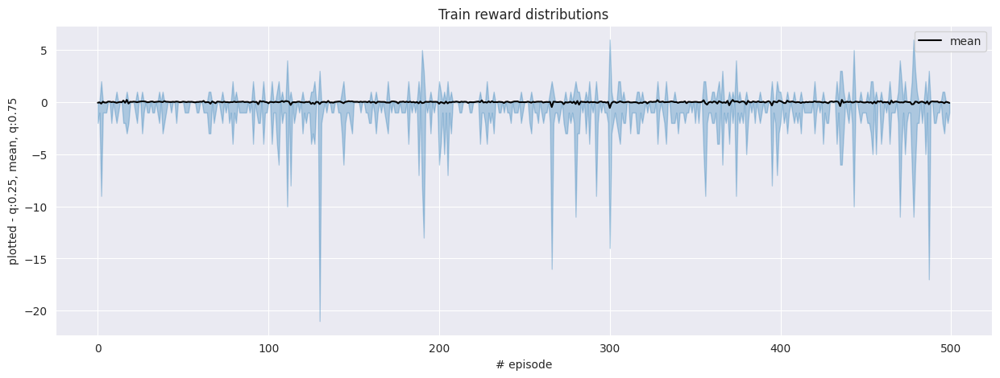

In [32]:
plot_graph(r1_list, 'Train reward distributions')

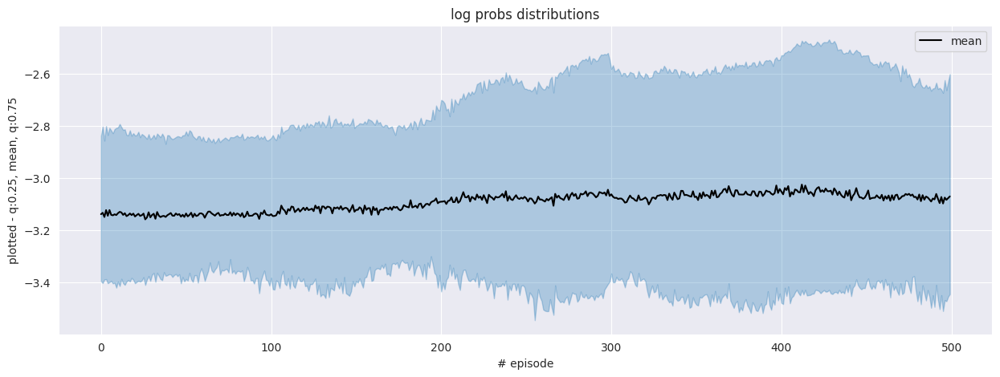

In [33]:
plot_graph(r2_list, 'log probs distributions')

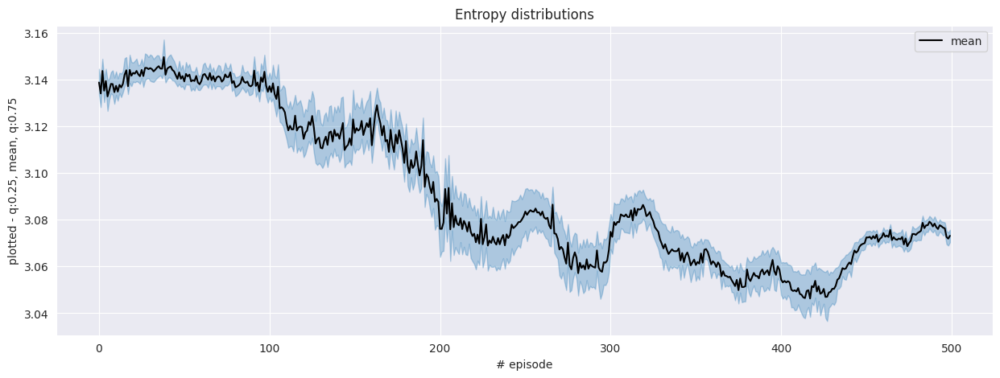

In [34]:
plot_graph(r3_list, 'Entropy distributions')

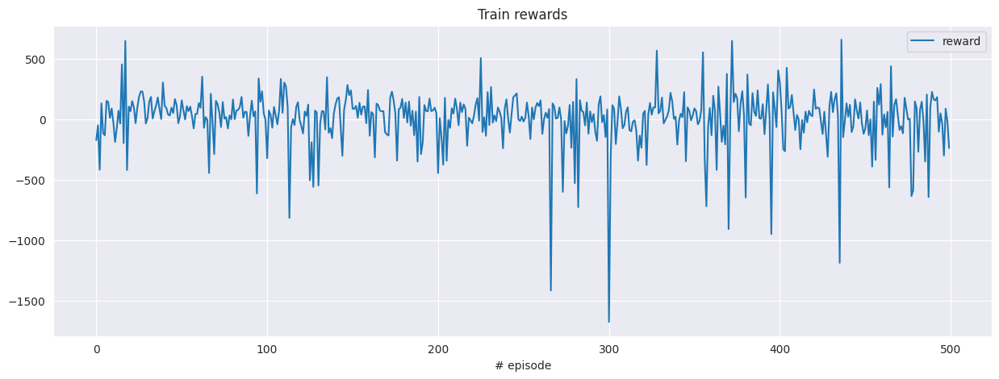

In [35]:
plot_rs(r4_list, 'Train rewards')

In [36]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [37]:
l1_r, l2_r = [], []

test_agent(agent, env)


  0%|          | 0/100 [00:00<?, ?it/s]


  1%|          | 1/100 [00:06<10:12,  6.19s/it]


  2%|▏         | 2/100 [00:12<10:17,  6.30s/it]


  3%|▎         | 3/100 [00:18<10:06,  6.25s/it]


  4%|▍         | 4/100 [00:25<10:04,  6.30s/it]


  5%|▌         | 5/100 [00:31<10:00,  6.32s/it]


  6%|▌         | 6/100 [00:37<09:54,  6.32s/it]


  7%|▋         | 7/100 [00:44<09:49,  6.34s/it]


  8%|▊         | 8/100 [00:50<09:39,  6.30s/it]


  9%|▉         | 9/100 [00:56<09:30,  6.27s/it]


 10%|█         | 10/100 [01:02<09:24,  6.28s/it]


 11%|█         | 11/100 [01:09<09:20,  6.30s/it]

[[10019     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 12%|█▏        | 12/100 [01:15<09:14,  6.30s/it]


 13%|█▎        | 13/100 [01:21<09:09,  6.32s/it]

[[10000     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 14%|█▍        | 14/100 [01:28<08:59,  6.28s/it]


 15%|█▌        | 15/100 [01:34<08:54,  6.29s/it]


 16%|█▌        | 16/100 [01:40<08:45,  6.25s/it]


 17%|█▋        | 17/100 [01:46<08:36,  6.22s/it]


 18%|█▊        | 18/100 [01:52<08:29,  6.21s/it]


 19%|█▉        | 19/100 [01:59<08:25,  6.24s/it]

[[10033     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8



 20%|██        | 20/100 [02:05<08:17,  6.22s/it]


 21%|██        | 21/100 [02:11<08:15,  6.27s/it]

[[9976    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 22%|██▏       | 22/100 [02:18<08:20,  6.42s/it]

[[9964    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4



 23%|██▎       | 23/100 [02:24<08:10,  6.37s/it]


 24%|██▍       | 24/100 [02:31<08:00,  6.32s/it]


 25%|██▌       | 25/100 [02:37<07:50,  6.28s/it]


 26%|██▌       | 26/100 [02:43<07:44,  6.27s/it]


 27%|██▋       | 27/100 [02:49<07:41,  6.32s/it]


 28%|██▊       | 28/100 [02:56<07:32,  6.29s/it]


 29%|██▉       | 29/100 [03:02<07:23,  6.24s/it]


 30%|███       | 30/100 [03:08<07:15,  6.22s/it]


 31%|███       | 31/100 [03:14<07:09,  6.22s/it]


 32%|███▏      | 32/100 [03:21<07:06,  6.28s/it]


 33%|███▎      | 33/100 [03:27<07:02,  6.31s/it]

[[9977    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 34%|███▍      | 34/100 [03:33<06:54,  6.28s/it]


 35%|███▌      | 35/100 [03:39<06:48,  6.29s/it]


 36%|███▌      | 36/100 [03:46<06:41,  6.28s/it]


 37%|███▋      | 37/100 [03:52<06:34,  6.26s/it]


 38%|███▊      | 38/100 [03:58<06:27,  6.25s/it]


 39%|███▉      | 39/100 [04:04<06:23,  6.28s/it]

[[10010     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 40%|████      | 40/100 [04:11<06:18,  6.30s/it]


 41%|████      | 41/100 [04:17<06:11,  6.30s/it]


 42%|████▏     | 42/100 [04:23<06:04,  6.28s/it]

[[10007     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 43%|████▎     | 43/100 [04:30<05:57,  6.27s/it]


 44%|████▍     | 44/100 [04:36<05:57,  6.38s/it]

[[10015     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 45%|████▌     | 45/100 [04:43<05:49,  6.35s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 46%|████▌     | 46/100 [04:49<05:42,  6.34s/it]

[[9964    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 47%|████▋     | 47/100 [04:55<05:33,  6.30s/it]


 48%|████▊     | 48/100 [05:01<05:27,  6.30s/it]


 49%|████▉     | 49/100 [05:08<05:20,  6.29s/it]


 50%|█████     | 50/100 [05:14<05:12,  6.26s/it]


 51%|█████     | 51/100 [05:20<05:06,  6.26s/it]


 52%|█████▏    | 52/100 [05:26<05:01,  6.28s/it]


 53%|█████▎    | 53/100 [05:33<04:55,  6.29s/it]


 54%|█████▍    | 54/100 [05:39<04:51,  6.34s/it]

[[9974    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 55%|█████▌    | 55/100 [05:45<04:44,  6.32s/it]

[[9992    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 56%|█████▌    | 56/100 [05:52<04:38,  6.34s/it]

[[9956    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 57%|█████▋    | 57/100 [05:58<04:32,  6.35s/it]


 58%|█████▊    | 58/100 [06:05<04:29,  6.42s/it]

[[9953    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 59%|█████▉    | 59/100 [06:11<04:23,  6.43s/it]

[[9984    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 60%|██████    | 60/100 [06:18<04:15,  6.39s/it]


 61%|██████    | 61/100 [06:24<04:08,  6.38s/it]


 62%|██████▏   | 62/100 [06:30<04:03,  6.40s/it]


 63%|██████▎   | 63/100 [06:37<03:56,  6.40s/it]


 64%|██████▍   | 64/100 [06:43<03:49,  6.36s/it]


 65%|██████▌   | 65/100 [06:49<03:42,  6.35s/it]


 66%|██████▌   | 66/100 [06:56<03:35,  6.33s/it]


 67%|██████▋   | 67/100 [07:02<03:28,  6.33s/it]


 68%|██████▊   | 68/100 [07:09<03:25,  6.42s/it]


 69%|██████▉   | 69/100 [07:15<03:17,  6.38s/it]


 70%|███████   | 70/100 [07:21<03:11,  6.39s/it]


 71%|███████   | 71/100 [07:28<03:04,  6.35s/it]


 72%|███████▏  | 72/100 [07:34<02:57,  6.35s/it]


 73%|███████▎  | 73/100 [07:40<02:51,  6.36s/it]


 74%|███████▍  | 74/100 [07:47<02:45,  6.35s/it]


 75%|███████▌  | 75/100 [07:53<02:39,  6.39s/it]

[[9978    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 76%|███████▌  | 76/100 [07:59<02:32,  6.37s/it]


 77%|███████▋  | 77/100 [08:06<02:26,  6.35s/it]


 78%|███████▊  | 78/100 [08:12<02:19,  6.35s/it]


 79%|███████▉  | 79/100 [08:18<02:14,  6.38s/it]

[[9974    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 80%|████████  | 80/100 [08:25<02:07,  6.36s/it]


 81%|████████  | 81/100 [08:31<02:00,  6.37s/it]


 82%|████████▏ | 82/100 [08:38<01:55,  6.42s/it]


 83%|████████▎ | 83/100 [08:44<01:48,  6.41s/it]


 84%|████████▍ | 84/100 [08:50<01:42,  6.39s/it]


 85%|████████▌ | 85/100 [08:57<01:35,  6.35s/it]


 86%|████████▌ | 86/100 [09:03<01:29,  6.37s/it]

[[9980    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 87%|████████▋ | 87/100 [09:10<01:22,  6.38s/it]


 88%|████████▊ | 88/100 [09:16<01:17,  6.44s/it]


 89%|████████▉ | 89/100 [09:22<01:10,  6.37s/it]


 90%|█████████ | 90/100 [09:29<01:03,  6.38s/it]


 91%|█████████ | 91/100 [09:35<00:57,  6.39s/it]


 92%|█████████▏| 92/100 [09:41<00:51,  6.38s/it]


 93%|█████████▎| 93/100 [09:48<00:44,  6.41s/it]


 94%|█████████▍| 94/100 [09:54<00:38,  6.38s/it]

[[10008     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 95%|█████████▌| 95/100 [10:01<00:31,  6.36s/it]


 96%|█████████▌| 96/100 [10:07<00:25,  6.38s/it]


 97%|█████████▋| 97/100 [10:13<00:19,  6.40s/it]


 98%|█████████▊| 98/100 [10:20<00:12,  6.47s/it]

[[10018     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 99%|█████████▉| 99/100 [10:27<00:06,  6.47s/it]


100%|██████████| 100/100 [10:33<00:00,  6.42s/it]


100%|██████████| 100/100 [10:33<00:00,  6.33s/it]

done


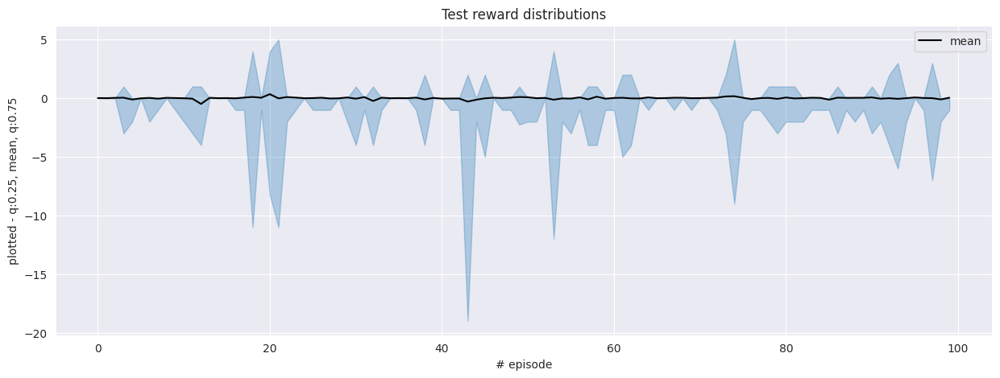

In [38]:
plot_graph(l1_r, 'Test reward distributions')

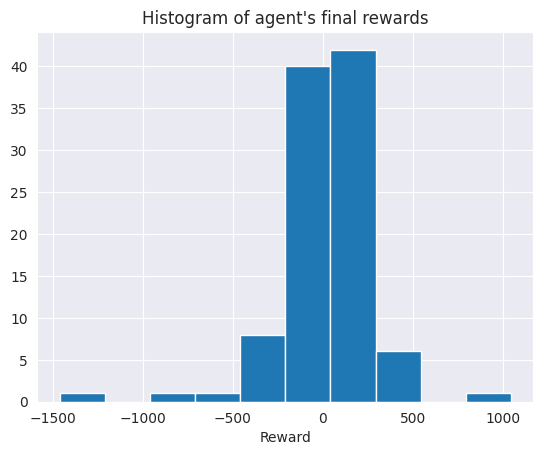

In [39]:
plot_hist(l2_r)

In [40]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V3

In [41]:
type = 'v3'

- Adam learning rate = 1e-3
- LayerNorm: no

In [42]:
agent = return_reinforce(1e-3, False)

In [43]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_reinforce)


  0%|          | 0/500 [00:00<?, ?it/s]


  0%|          | 1/500 [00:08<1:12:01,  8.66s/it]


  0%|          | 2/500 [00:17<1:11:59,  8.67s/it]

[[9935    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  1%|          | 3/500 [00:26<1:13:03,  8.82s/it]


  1%|          | 4/500 [00:35<1:13:03,  8.84s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1



  1%|          | 5/500 [00:44<1:13:38,  8.93s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1
[[9980    0    0    0    0    0    0    0    0    0    0]
 [  -2    0   -1   -1    0   -1   -1   -1   -1   -1   -1]]
0
-1



  1%|          | 6/500 [00:53<1:13:15,  8.90s/it]


  1%|▏         | 7/500 [01:01<1:12:08,  8.78s/it]


  2%|▏         | 8/500 [01:10<1:11:58,  8.78s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



  2%|▏         | 9/500 [01:19<1:11:38,  8.75s/it]


  2%|▏         | 10/500 [01:27<1:11:23,  8.74s/it]


  2%|▏         | 11/500 [01:36<1:10:36,  8.66s/it]


  2%|▏         | 12/500 [01:44<1:10:23,  8.66s/it]


  3%|▎         | 13/500 [01:53<1:10:26,  8.68s/it]


  3%|▎         | 14/500 [02:02<1:10:16,  8.68s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  3%|▎         | 15/500 [02:11<1:10:20,  8.70s/it]


  3%|▎         | 16/500 [02:19<1:10:08,  8.70s/it]


  3%|▎         | 17/500 [02:28<1:09:31,  8.64s/it]


  4%|▎         | 18/500 [02:37<1:09:36,  8.67s/it]


  4%|▍         | 19/500 [02:45<1:09:06,  8.62s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



  4%|▍         | 20/500 [02:54<1:09:49,  8.73s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -1   -1]]
0
-3



  4%|▍         | 21/500 [03:03<1:09:50,  8.75s/it]


  4%|▍         | 22/500 [03:11<1:09:05,  8.67s/it]


  5%|▍         | 23/500 [03:20<1:09:13,  8.71s/it]


  5%|▍         | 24/500 [03:29<1:08:37,  8.65s/it]


  5%|▌         | 25/500 [03:37<1:08:20,  8.63s/it]


  5%|▌         | 26/500 [03:46<1:07:53,  8.59s/it]


  5%|▌         | 27/500 [03:54<1:08:08,  8.64s/it]


  6%|▌         | 28/500 [04:03<1:07:42,  8.61s/it]


  6%|▌         | 29/500 [04:12<1:07:29,  8.60s/it]


  6%|▌         | 30/500 [04:20<1:07:45,  8.65s/it]


  6%|▌         | 31/500 [04:29<1:07:33,  8.64s/it]


  6%|▋         | 32/500 [04:38<1:07:34,  8.66s/it]


  7%|▋         | 33/500 [04:46<1:07:07,  8.62s/it]


  7%|▋         | 34/500 [04:55<1:07:14,  8.66s/it]


  7%|▋         | 35/500 [05:04<1:07:32,  8.72s/it]


  7%|▋         | 36/500 [05:12<1:06:51,  8.65s/it]


  7%|▋         | 37/500 [05:21<1:06:53,  8.67s/it]


  8%|▊         | 38/500 [05:30<1:06:38,  8.66s/it]


  8%|▊         | 39/500 [05:38<1:06:12,  8.62s/it]


  8%|▊         | 40/500 [05:47<1:06:07,  8.63s/it]


  8%|▊         | 41/500 [05:55<1:05:54,  8.61s/it]


  8%|▊         | 42/500 [06:04<1:06:09,  8.67s/it]


  9%|▊         | 43/500 [06:13<1:05:25,  8.59s/it]


  9%|▉         | 44/500 [06:21<1:05:09,  8.57s/it]


  9%|▉         | 45/500 [06:30<1:05:26,  8.63s/it]


  9%|▉         | 46/500 [06:39<1:05:31,  8.66s/it]

[[10008     0     0     0     0     0     0     0     0     0    18]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



  9%|▉         | 47/500 [06:47<1:05:35,  8.69s/it]


 10%|▉         | 48/500 [06:56<1:05:30,  8.70s/it]


 10%|▉         | 49/500 [07:05<1:05:18,  8.69s/it]


 10%|█         | 50/500 [07:13<1:04:50,  8.65s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4



 10%|█         | 51/500 [07:22<1:04:47,  8.66s/it]


 10%|█         | 52/500 [07:31<1:04:28,  8.63s/it]


 11%|█         | 53/500 [07:39<1:04:44,  8.69s/it]


 11%|█         | 54/500 [07:48<1:04:12,  8.64s/it]


 11%|█         | 55/500 [07:57<1:04:22,  8.68s/it]


 11%|█         | 56/500 [08:05<1:03:33,  8.59s/it]


 11%|█▏        | 57/500 [08:14<1:03:57,  8.66s/it]


 12%|█▏        | 58/500 [08:23<1:03:47,  8.66s/it]


 12%|█▏        | 59/500 [08:31<1:03:19,  8.62s/it]


 12%|█▏        | 60/500 [08:40<1:03:27,  8.65s/it]


 12%|█▏        | 61/500 [08:48<1:03:18,  8.65s/it]


 12%|█▏        | 62/500 [08:57<1:03:02,  8.64s/it]


 13%|█▎        | 63/500 [09:06<1:02:31,  8.59s/it]

[[10027     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



 13%|█▎        | 64/500 [09:14<1:02:30,  8.60s/it]


 13%|█▎        | 65/500 [09:23<1:02:33,  8.63s/it]


 13%|█▎        | 66/500 [09:31<1:01:58,  8.57s/it]

[[10006     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 13%|█▎        | 67/500 [09:40<1:02:02,  8.60s/it]


 14%|█▎        | 68/500 [09:49<1:01:55,  8.60s/it]


 14%|█▍        | 69/500 [09:57<1:01:43,  8.59s/it]


 14%|█▍        | 70/500 [10:06<1:01:59,  8.65s/it]


 14%|█▍        | 71/500 [10:14<1:01:40,  8.63s/it]


 14%|█▍        | 72/500 [10:23<1:01:45,  8.66s/it]


 15%|█▍        | 73/500 [10:32<1:01:24,  8.63s/it]


 15%|█▍        | 74/500 [10:40<1:00:53,  8.58s/it]


 15%|█▌        | 75/500 [10:49<1:01:08,  8.63s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 15%|█▌        | 76/500 [10:58<1:00:51,  8.61s/it]


 15%|█▌        | 77/500 [11:06<1:00:40,  8.61s/it]


 16%|█▌        | 78/500 [11:15<1:00:40,  8.63s/it]


 16%|█▌        | 79/500 [11:23<1:00:36,  8.64s/it]


 16%|█▌        | 80/500 [11:32<1:00:53,  8.70s/it]

[[9980    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 16%|█▌        | 81/500 [11:41<1:00:25,  8.65s/it]


 16%|█▋        | 82/500 [11:50<1:00:24,  8.67s/it]


 17%|█▋        | 83/500 [11:58<1:00:16,  8.67s/it]


 17%|█▋        | 84/500 [12:07<59:49,  8.63s/it]  


 17%|█▋        | 85/500 [12:15<59:40,  8.63s/it]


 17%|█▋        | 86/500 [12:24<59:08,  8.57s/it]


 17%|█▋        | 87/500 [12:33<59:26,  8.64s/it]


 18%|█▊        | 88/500 [12:41<59:05,  8.61s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-1



 18%|█▊        | 89/500 [12:50<58:45,  8.58s/it]

[[9953    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 18%|█▊        | 90/500 [12:59<59:16,  8.67s/it]


 18%|█▊        | 91/500 [13:07<58:38,  8.60s/it]

[[9999    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 18%|█▊        | 92/500 [13:16<59:09,  8.70s/it]


 19%|█▊        | 93/500 [13:24<58:37,  8.64s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 19%|█▉        | 94/500 [13:33<58:29,  8.64s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 19%|█▉        | 95/500 [13:42<58:41,  8.69s/it]


 19%|█▉        | 96/500 [13:51<58:19,  8.66s/it]

[[10025     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 19%|█▉        | 97/500 [13:59<58:31,  8.71s/it]


 20%|█▉        | 98/500 [14:08<58:12,  8.69s/it]


 20%|█▉        | 99/500 [14:16<57:35,  8.62s/it]


 20%|██        | 100/500 [14:25<57:19,  8.60s/it]


 20%|██        | 101/500 [14:34<57:28,  8.64s/it]


 20%|██        | 102/500 [14:42<57:16,  8.63s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 21%|██        | 103/500 [14:51<57:39,  8.71s/it]


 21%|██        | 104/500 [15:00<57:24,  8.70s/it]


 21%|██        | 105/500 [15:09<57:12,  8.69s/it]


 21%|██        | 106/500 [15:17<56:35,  8.62s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 21%|██▏       | 107/500 [15:26<57:01,  8.70s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 22%|██▏       | 108/500 [15:35<56:59,  8.72s/it]


 22%|██▏       | 109/500 [15:43<56:37,  8.69s/it]


 22%|██▏       | 110/500 [15:52<56:36,  8.71s/it]


 22%|██▏       | 111/500 [16:01<56:09,  8.66s/it]

[[10026     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 22%|██▏       | 112/500 [16:10<56:32,  8.74s/it]


 23%|██▎       | 113/500 [16:18<55:56,  8.67s/it]


 23%|██▎       | 114/500 [16:27<55:32,  8.63s/it]


 23%|██▎       | 115/500 [16:35<55:48,  8.70s/it]


 23%|██▎       | 116/500 [16:44<55:31,  8.68s/it]


 23%|██▎       | 117/500 [16:53<55:36,  8.71s/it]

[[9956    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 24%|██▎       | 118/500 [17:02<55:23,  8.70s/it]


 24%|██▍       | 119/500 [17:10<55:00,  8.66s/it]


 24%|██▍       | 120/500 [17:19<54:59,  8.68s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 24%|██▍       | 121/500 [17:27<54:28,  8.62s/it]


 24%|██▍       | 122/500 [17:36<54:33,  8.66s/it]


 25%|██▍       | 123/500 [17:45<54:28,  8.67s/it]


 25%|██▍       | 124/500 [17:53<54:16,  8.66s/it]


 25%|██▌       | 125/500 [18:02<54:14,  8.68s/it]


 25%|██▌       | 126/500 [18:11<53:44,  8.62s/it]


 25%|██▌       | 127/500 [18:20<54:24,  8.75s/it]


 26%|██▌       | 128/500 [18:28<53:54,  8.70s/it]


 26%|██▌       | 129/500 [18:37<53:45,  8.69s/it]


 26%|██▌       | 130/500 [18:46<53:39,  8.70s/it]


 26%|██▌       | 131/500 [18:54<53:23,  8.68s/it]


 26%|██▋       | 132/500 [19:03<53:43,  8.76s/it]


 27%|██▋       | 133/500 [19:12<53:08,  8.69s/it]


 27%|██▋       | 134/500 [19:20<52:57,  8.68s/it]


 27%|██▋       | 135/500 [19:29<52:48,  8.68s/it]


 27%|██▋       | 136/500 [19:38<52:18,  8.62s/it]


 27%|██▋       | 137/500 [19:46<52:21,  8.65s/it]


 28%|██▊       | 138/500 [19:55<51:54,  8.60s/it]


 28%|██▊       | 139/500 [20:03<51:32,  8.57s/it]


 28%|██▊       | 140/500 [20:12<51:41,  8.61s/it]


 28%|██▊       | 141/500 [20:21<51:45,  8.65s/it]


 28%|██▊       | 142/500 [20:30<51:51,  8.69s/it]

[[9972    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 29%|██▊       | 143/500 [20:38<51:25,  8.64s/it]


 29%|██▉       | 144/500 [20:47<51:04,  8.61s/it]


 29%|██▉       | 145/500 [20:55<51:12,  8.66s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 29%|██▉       | 146/500 [21:04<51:00,  8.64s/it]


 29%|██▉       | 147/500 [21:13<50:50,  8.64s/it]


 30%|██▉       | 148/500 [21:21<50:29,  8.61s/it]


 30%|██▉       | 149/500 [21:30<50:09,  8.57s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 30%|███       | 150/500 [21:38<50:07,  8.59s/it]


 30%|███       | 151/500 [21:47<49:44,  8.55s/it]


 30%|███       | 152/500 [21:55<49:40,  8.57s/it]


 31%|███       | 153/500 [22:04<49:34,  8.57s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 31%|███       | 154/500 [22:12<49:24,  8.57s/it]


 31%|███       | 155/500 [22:21<49:30,  8.61s/it]

[[10017     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 31%|███       | 156/500 [22:30<49:16,  8.59s/it]


 31%|███▏      | 157/500 [22:38<49:07,  8.59s/it]


 32%|███▏      | 158/500 [22:47<48:39,  8.54s/it]


 32%|███▏      | 159/500 [22:55<48:36,  8.55s/it]


 32%|███▏      | 160/500 [23:04<48:34,  8.57s/it]


 32%|███▏      | 161/500 [23:12<48:14,  8.54s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 32%|███▏      | 162/500 [23:21<48:37,  8.63s/it]


 33%|███▎      | 163/500 [23:30<48:15,  8.59s/it]


 33%|███▎      | 164/500 [23:38<47:45,  8.53s/it]


 33%|███▎      | 165/500 [23:47<47:55,  8.58s/it]


 33%|███▎      | 166/500 [23:55<47:44,  8.57s/it]


 33%|███▎      | 167/500 [24:04<47:53,  8.63s/it]


 34%|███▎      | 168/500 [24:13<47:29,  8.58s/it]


 34%|███▍      | 169/500 [24:21<47:17,  8.57s/it]


 34%|███▍      | 170/500 [24:30<47:18,  8.60s/it]

[[10010     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 34%|███▍      | 171/500 [24:38<46:54,  8.55s/it]


 34%|███▍      | 172/500 [24:47<46:58,  8.59s/it]

[[10024     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 35%|███▍      | 173/500 [24:56<46:49,  8.59s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 35%|███▍      | 174/500 [25:04<46:43,  8.60s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 35%|███▌      | 175/500 [25:13<46:39,  8.62s/it]


 35%|███▌      | 176/500 [25:21<46:13,  8.56s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 35%|███▌      | 177/500 [25:30<46:37,  8.66s/it]


 36%|███▌      | 178/500 [25:39<46:05,  8.59s/it]


 36%|███▌      | 179/500 [25:47<45:35,  8.52s/it]


 36%|███▌      | 180/500 [25:56<45:46,  8.58s/it]


 36%|███▌      | 181/500 [26:04<45:19,  8.53s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 36%|███▋      | 182/500 [26:13<45:28,  8.58s/it]


 37%|███▋      | 183/500 [26:21<44:59,  8.52s/it]

[[9999    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 37%|███▋      | 184/500 [26:30<44:58,  8.54s/it]


 37%|███▋      | 185/500 [26:38<45:02,  8.58s/it]


 37%|███▋      | 186/500 [26:47<44:50,  8.57s/it]


 37%|███▋      | 187/500 [26:56<44:56,  8.61s/it]


 38%|███▊      | 188/500 [27:04<44:46,  8.61s/it]


 38%|███▊      | 189/500 [27:13<44:23,  8.56s/it]

[[10018     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 38%|███▊      | 190/500 [27:21<44:17,  8.57s/it]


 38%|███▊      | 191/500 [27:30<44:01,  8.55s/it]


 38%|███▊      | 192/500 [27:39<44:16,  8.63s/it]


 39%|███▊      | 193/500 [27:47<43:52,  8.57s/it]


 39%|███▉      | 194/500 [27:56<43:40,  8.56s/it]


 39%|███▉      | 195/500 [28:04<43:42,  8.60s/it]


 39%|███▉      | 196/500 [28:13<43:15,  8.54s/it]


 39%|███▉      | 197/500 [28:21<43:21,  8.59s/it]


 40%|███▉      | 198/500 [28:30<43:16,  8.60s/it]


 40%|███▉      | 199/500 [28:39<43:08,  8.60s/it]


 40%|████      | 200/500 [28:47<43:08,  8.63s/it]


 40%|████      | 201/500 [28:56<42:49,  8.59s/it]


 40%|████      | 202/500 [29:05<42:51,  8.63s/it]


 41%|████      | 203/500 [29:13<42:34,  8.60s/it]


 41%|████      | 204/500 [29:21<42:09,  8.55s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 41%|████      | 205/500 [29:30<42:23,  8.62s/it]


 41%|████      | 206/500 [29:39<41:57,  8.56s/it]


 41%|████▏     | 207/500 [29:47<42:02,  8.61s/it]


 42%|████▏     | 208/500 [29:56<41:48,  8.59s/it]


 42%|████▏     | 209/500 [30:04<41:33,  8.57s/it]

[[10003     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 42%|████▏     | 210/500 [30:14<42:05,  8.71s/it]


 42%|████▏     | 211/500 [30:22<41:51,  8.69s/it]


 42%|████▏     | 212/500 [30:31<41:41,  8.69s/it]


 43%|████▎     | 213/500 [30:39<41:19,  8.64s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 43%|████▎     | 214/500 [30:48<41:14,  8.65s/it]


 43%|████▎     | 215/500 [30:57<41:20,  8.70s/it]


 43%|████▎     | 216/500 [31:05<40:47,  8.62s/it]

[[10027     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 43%|████▎     | 217/500 [31:14<41:09,  8.73s/it]


 44%|████▎     | 218/500 [31:23<41:05,  8.74s/it]


 44%|████▍     | 219/500 [31:32<40:41,  8.69s/it]


 44%|████▍     | 220/500 [31:40<40:45,  8.73s/it]


 44%|████▍     | 221/500 [31:49<40:21,  8.68s/it]


 44%|████▍     | 222/500 [31:58<40:15,  8.69s/it]


 45%|████▍     | 223/500 [32:06<39:55,  8.65s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 45%|████▍     | 224/500 [32:15<39:43,  8.64s/it]


 45%|████▌     | 225/500 [32:24<39:49,  8.69s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 45%|████▌     | 226/500 [32:32<39:49,  8.72s/it]


 45%|████▌     | 227/500 [32:41<39:41,  8.72s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-2



 46%|████▌     | 228/500 [32:50<40:06,  8.85s/it]


 46%|████▌     | 229/500 [32:59<39:44,  8.80s/it]


 46%|████▌     | 230/500 [33:08<39:23,  8.75s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 46%|████▌     | 231/500 [33:16<39:05,  8.72s/it]


 46%|████▋     | 232/500 [33:25<39:00,  8.73s/it]


 47%|████▋     | 233/500 [33:34<38:32,  8.66s/it]


 47%|████▋     | 234/500 [33:42<38:06,  8.59s/it]


 47%|████▋     | 235/500 [33:51<37:59,  8.60s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 47%|████▋     | 236/500 [33:59<37:53,  8.61s/it]


 47%|████▋     | 237/500 [34:08<37:48,  8.63s/it]


 48%|████▊     | 238/500 [34:16<37:18,  8.55s/it]


 48%|████▊     | 239/500 [34:25<37:21,  8.59s/it]


 48%|████▊     | 240/500 [34:34<37:26,  8.64s/it]


 48%|████▊     | 241/500 [34:43<37:32,  8.70s/it]


 48%|████▊     | 242/500 [34:51<37:23,  8.70s/it]


 49%|████▊     | 243/500 [35:00<37:22,  8.73s/it]


 49%|████▉     | 244/500 [35:09<37:03,  8.69s/it]


 49%|████▉     | 245/500 [35:18<37:13,  8.76s/it]


 49%|████▉     | 246/500 [35:27<37:18,  8.81s/it]


 49%|████▉     | 247/500 [35:36<37:42,  8.94s/it]


 50%|████▉     | 248/500 [35:44<37:00,  8.81s/it]


 50%|████▉     | 249/500 [35:53<36:58,  8.84s/it]


 50%|█████     | 250/500 [36:02<36:47,  8.83s/it]


 50%|█████     | 251/500 [36:11<36:32,  8.81s/it]


 50%|█████     | 252/500 [36:19<36:16,  8.78s/it]


 51%|█████     | 253/500 [36:28<35:58,  8.74s/it]


 51%|█████     | 254/500 [36:37<35:40,  8.70s/it]


 51%|█████     | 255/500 [36:46<35:41,  8.74s/it]


 51%|█████     | 256/500 [36:54<35:17,  8.68s/it]

[[10024     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1



 51%|█████▏    | 257/500 [37:03<35:17,  8.71s/it]


 52%|█████▏    | 258/500 [37:11<34:56,  8.66s/it]


 52%|█████▏    | 259/500 [37:20<34:42,  8.64s/it]


 52%|█████▏    | 260/500 [37:29<34:51,  8.71s/it]


 52%|█████▏    | 261/500 [37:38<35:00,  8.79s/it]


 52%|█████▏    | 262/500 [37:47<34:44,  8.76s/it]


 53%|█████▎    | 263/500 [37:55<34:18,  8.69s/it]


 53%|█████▎    | 264/500 [38:04<33:53,  8.62s/it]


 53%|█████▎    | 265/500 [38:12<33:57,  8.67s/it]


 53%|█████▎    | 266/500 [38:21<33:32,  8.60s/it]

[[9935    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 53%|█████▎    | 267/500 [38:30<33:52,  8.72s/it]


 54%|█████▎    | 268/500 [38:38<33:34,  8.68s/it]


 54%|█████▍    | 269/500 [38:47<33:05,  8.60s/it]


 54%|█████▍    | 270/500 [38:55<32:58,  8.60s/it]


 54%|█████▍    | 271/500 [39:04<32:45,  8.58s/it]


 54%|█████▍    | 272/500 [39:13<32:50,  8.64s/it]


 55%|█████▍    | 273/500 [39:21<32:50,  8.68s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 55%|█████▍    | 274/500 [39:30<32:38,  8.67s/it]


 55%|█████▌    | 275/500 [39:39<32:34,  8.68s/it]


 55%|█████▌    | 276/500 [39:47<32:23,  8.68s/it]


 55%|█████▌    | 277/500 [39:56<32:20,  8.70s/it]


 56%|█████▌    | 278/500 [40:05<31:59,  8.65s/it]


 56%|█████▌    | 279/500 [40:13<31:50,  8.65s/it]


 56%|█████▌    | 280/500 [40:22<31:58,  8.72s/it]


 56%|█████▌    | 281/500 [40:31<31:42,  8.69s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 56%|█████▋    | 282/500 [40:40<31:40,  8.72s/it]


 57%|█████▋    | 283/500 [40:48<31:25,  8.69s/it]


 57%|█████▋    | 284/500 [40:57<31:00,  8.61s/it]


 57%|█████▋    | 285/500 [41:06<31:09,  8.70s/it]


 57%|█████▋    | 286/500 [41:14<30:57,  8.68s/it]


 57%|█████▋    | 287/500 [41:23<30:55,  8.71s/it]


 58%|█████▊    | 288/500 [41:32<30:40,  8.68s/it]


 58%|█████▊    | 289/500 [41:40<30:12,  8.59s/it]


 58%|█████▊    | 290/500 [41:49<30:12,  8.63s/it]

[[9952    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 58%|█████▊    | 291/500 [41:57<30:02,  8.62s/it]


 58%|█████▊    | 292/500 [42:06<30:06,  8.69s/it]


 59%|█████▊    | 293/500 [42:15<29:49,  8.64s/it]


 59%|█████▉    | 294/500 [42:23<29:43,  8.66s/it]


 59%|█████▉    | 295/500 [42:32<29:43,  8.70s/it]


 59%|█████▉    | 296/500 [42:41<29:28,  8.67s/it]


 59%|█████▉    | 297/500 [42:50<29:26,  8.70s/it]

[[9966    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 60%|█████▉    | 298/500 [42:58<29:19,  8.71s/it]


 60%|█████▉    | 299/500 [43:07<29:02,  8.67s/it]


 60%|██████    | 300/500 [43:16<28:58,  8.69s/it]


 60%|██████    | 301/500 [43:24<28:52,  8.71s/it]


 60%|██████    | 302/500 [43:33<28:41,  8.69s/it]


 61%|██████    | 303/500 [43:42<28:26,  8.66s/it]


 61%|██████    | 304/500 [43:50<28:16,  8.65s/it]


 61%|██████    | 305/500 [43:59<28:18,  8.71s/it]


 61%|██████    | 306/500 [44:08<27:59,  8.66s/it]


 61%|██████▏   | 307/500 [44:16<27:54,  8.68s/it]


 62%|██████▏   | 308/500 [44:25<27:49,  8.70s/it]


 62%|██████▏   | 309/500 [44:34<27:39,  8.69s/it]


 62%|██████▏   | 310/500 [44:42<27:27,  8.67s/it]


 62%|██████▏   | 311/500 [44:51<27:15,  8.65s/it]


 62%|██████▏   | 312/500 [45:00<27:23,  8.74s/it]


 63%|██████▎   | 313/500 [45:09<27:05,  8.69s/it]

[[9979    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 63%|██████▎   | 314/500 [45:17<26:53,  8.67s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1



 63%|██████▎   | 315/500 [45:26<26:52,  8.72s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 63%|██████▎   | 316/500 [45:35<26:36,  8.67s/it]

[[9947    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 63%|██████▎   | 317/500 [45:44<26:41,  8.75s/it]


 64%|██████▎   | 318/500 [45:52<26:31,  8.75s/it]


 64%|██████▍   | 319/500 [46:01<26:09,  8.67s/it]


 64%|██████▍   | 320/500 [46:09<25:58,  8.66s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 64%|██████▍   | 321/500 [46:18<25:44,  8.63s/it]


 64%|██████▍   | 322/500 [46:27<25:48,  8.70s/it]


 65%|██████▍   | 323/500 [46:36<25:40,  8.70s/it]


 65%|██████▍   | 324/500 [46:44<25:32,  8.71s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 65%|██████▌   | 325/500 [46:53<25:37,  8.78s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 65%|██████▌   | 326/500 [47:02<25:15,  8.71s/it]


 65%|██████▌   | 327/500 [47:10<25:07,  8.71s/it]


 66%|██████▌   | 328/500 [47:19<24:50,  8.67s/it]


 66%|██████▌   | 329/500 [47:27<24:26,  8.57s/it]


 66%|██████▌   | 330/500 [47:36<24:27,  8.63s/it]


 66%|██████▌   | 331/500 [47:45<24:19,  8.64s/it]


 66%|██████▋   | 332/500 [47:54<24:21,  8.70s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 67%|██████▋   | 333/500 [48:02<24:18,  8.73s/it]

[[10015     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 67%|██████▋   | 334/500 [48:11<24:17,  8.78s/it]


 67%|██████▋   | 335/500 [48:20<24:03,  8.75s/it]


 67%|██████▋   | 336/500 [48:29<23:50,  8.72s/it]


 67%|██████▋   | 337/500 [48:38<23:47,  8.76s/it]


 68%|██████▊   | 338/500 [48:46<23:39,  8.76s/it]

[[10012     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 68%|██████▊   | 339/500 [48:55<23:34,  8.79s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 68%|██████▊   | 340/500 [49:04<23:29,  8.81s/it]


 68%|██████▊   | 341/500 [49:13<23:14,  8.77s/it]


 68%|██████▊   | 342/500 [49:21<22:56,  8.71s/it]

[[9981    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 69%|██████▊   | 343/500 [49:30<22:40,  8.67s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 69%|██████▉   | 344/500 [49:39<22:37,  8.70s/it]


 69%|██████▉   | 345/500 [49:47<22:27,  8.69s/it]


 69%|██████▉   | 346/500 [49:56<22:13,  8.66s/it]


 69%|██████▉   | 347/500 [50:05<22:11,  8.70s/it]


 70%|██████▉   | 348/500 [50:13<22:00,  8.69s/it]


 70%|██████▉   | 349/500 [50:22<21:51,  8.69s/it]


 70%|███████   | 350/500 [50:31<21:49,  8.73s/it]


 70%|███████   | 351/500 [50:39<21:29,  8.66s/it]


 70%|███████   | 352/500 [50:48<21:25,  8.69s/it]


 71%|███████   | 353/500 [50:57<21:21,  8.72s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 71%|███████   | 354/500 [51:06<21:10,  8.70s/it]


 71%|███████   | 355/500 [51:14<21:03,  8.72s/it]

[[9995    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 71%|███████   | 356/500 [51:23<20:53,  8.70s/it]


 71%|███████▏  | 357/500 [51:32<20:41,  8.68s/it]


 72%|███████▏  | 358/500 [51:40<20:29,  8.66s/it]


 72%|███████▏  | 359/500 [51:49<20:19,  8.65s/it]


 72%|███████▏  | 360/500 [51:58<20:26,  8.76s/it]

[[9964    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 72%|███████▏  | 361/500 [52:06<20:03,  8.66s/it]


 72%|███████▏  | 362/500 [52:15<19:53,  8.65s/it]


 73%|███████▎  | 363/500 [52:23<19:43,  8.64s/it]


 73%|███████▎  | 364/500 [52:32<19:27,  8.58s/it]


 73%|███████▎  | 365/500 [52:40<19:17,  8.57s/it]


 73%|███████▎  | 366/500 [52:49<19:04,  8.54s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 73%|███████▎  | 367/500 [52:58<19:13,  8.67s/it]


 74%|███████▎  | 368/500 [53:07<19:04,  8.67s/it]


 74%|███████▍  | 369/500 [53:15<18:49,  8.62s/it]


 74%|███████▍  | 370/500 [53:24<18:45,  8.66s/it]


 74%|███████▍  | 371/500 [53:32<18:34,  8.64s/it]


 74%|███████▍  | 372/500 [53:41<18:29,  8.67s/it]


 75%|███████▍  | 373/500 [53:50<18:13,  8.61s/it]


 75%|███████▍  | 374/500 [53:58<17:59,  8.57s/it]


 75%|███████▌  | 375/500 [54:07<17:56,  8.61s/it]


 75%|███████▌  | 376/500 [54:15<17:43,  8.58s/it]

[[10036     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 75%|███████▌  | 377/500 [54:24<17:39,  8.61s/it]

[[10009     0     0     0     0     0     0     0     0     0    11]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 76%|███████▌  | 378/500 [54:33<17:28,  8.59s/it]


 76%|███████▌  | 379/500 [54:41<17:19,  8.59s/it]


 76%|███████▌  | 380/500 [54:50<17:10,  8.59s/it]


 76%|███████▌  | 381/500 [54:58<17:04,  8.61s/it]


 76%|███████▋  | 382/500 [55:07<16:56,  8.61s/it]


 77%|███████▋  | 383/500 [55:16<16:46,  8.60s/it]


 77%|███████▋  | 384/500 [55:24<16:42,  8.64s/it]


 77%|███████▋  | 385/500 [55:33<16:38,  8.69s/it]


 77%|███████▋  | 386/500 [55:42<16:27,  8.66s/it]


 77%|███████▋  | 387/500 [55:51<16:30,  8.76s/it]


 78%|███████▊  | 388/500 [55:59<16:15,  8.71s/it]


 78%|███████▊  | 389/500 [56:08<16:03,  8.68s/it]


 78%|███████▊  | 390/500 [56:17<15:54,  8.68s/it]


 78%|███████▊  | 391/500 [56:25<15:48,  8.70s/it]

[[9943    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 78%|███████▊  | 392/500 [56:34<15:42,  8.72s/it]


 79%|███████▊  | 393/500 [56:43<15:30,  8.70s/it]

[[9999    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 79%|███████▉  | 394/500 [56:51<15:18,  8.67s/it]


 79%|███████▉  | 395/500 [57:00<15:16,  8.73s/it]


 79%|███████▉  | 396/500 [57:09<15:06,  8.72s/it]


 79%|███████▉  | 397/500 [57:18<15:03,  8.77s/it]


 80%|███████▉  | 398/500 [57:26<14:43,  8.66s/it]


 80%|███████▉  | 399/500 [57:35<14:34,  8.66s/it]


 80%|████████  | 400/500 [57:44<14:26,  8.67s/it]

[[10003     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 80%|████████  | 401/500 [57:52<14:23,  8.72s/it]


 80%|████████  | 402/500 [58:01<14:18,  8.76s/it]


 81%|████████  | 403/500 [58:10<14:05,  8.72s/it]


 81%|████████  | 404/500 [58:19<13:55,  8.70s/it]


 81%|████████  | 405/500 [58:27<13:51,  8.75s/it]


 81%|████████  | 406/500 [58:36<13:37,  8.70s/it]


 81%|████████▏ | 407/500 [58:45<13:31,  8.73s/it]


 82%|████████▏ | 408/500 [58:53<13:22,  8.72s/it]

[[10010     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -8]]
0
-1



 82%|████████▏ | 409/500 [59:02<13:08,  8.66s/it]


 82%|████████▏ | 410/500 [59:11<12:58,  8.65s/it]


 82%|████████▏ | 411/500 [59:19<12:50,  8.66s/it]


 82%|████████▏ | 412/500 [59:28<12:45,  8.69s/it]


 83%|████████▎ | 413/500 [59:37<12:35,  8.68s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 83%|████████▎ | 414/500 [59:45<12:25,  8.67s/it]


 83%|████████▎ | 415/500 [59:54<12:21,  8.72s/it]

[[10005     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



 83%|████████▎ | 416/500 [1:00:03<12:09,  8.68s/it]


 83%|████████▎ | 417/500 [1:00:12<12:03,  8.71s/it]

[[9969    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 84%|████████▎ | 418/500 [1:00:20<11:55,  8.72s/it]


 84%|████████▍ | 419/500 [1:00:29<11:38,  8.63s/it]


 84%|████████▍ | 420/500 [1:00:38<11:33,  8.66s/it]

[[9939    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 84%|████████▍ | 421/500 [1:00:46<11:26,  8.69s/it]


 84%|████████▍ | 422/500 [1:00:55<11:22,  8.75s/it]


 85%|████████▍ | 423/500 [1:01:04<11:09,  8.69s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 85%|████████▍ | 424/500 [1:01:13<11:07,  8.78s/it]


 85%|████████▌ | 425/500 [1:01:21<10:58,  8.78s/it]


 85%|████████▌ | 426/500 [1:01:30<10:49,  8.77s/it]


 85%|████████▌ | 427/500 [1:01:39<10:37,  8.73s/it]

[[9998    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 86%|████████▌ | 428/500 [1:01:48<10:29,  8.75s/it]


 86%|████████▌ | 429/500 [1:01:56<10:17,  8.70s/it]


 86%|████████▌ | 430/500 [1:02:05<10:09,  8.71s/it]


 86%|████████▌ | 431/500 [1:02:14<09:57,  8.66s/it]

[[10005     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 86%|████████▋ | 432/500 [1:02:22<09:53,  8.72s/it]


 87%|████████▋ | 433/500 [1:02:31<09:42,  8.69s/it]

[[9955    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 87%|████████▋ | 434/500 [1:02:40<09:35,  8.72s/it]


 87%|████████▋ | 435/500 [1:02:49<09:29,  8.76s/it]


 87%|████████▋ | 436/500 [1:02:57<09:14,  8.67s/it]


 87%|████████▋ | 437/500 [1:03:06<09:07,  8.70s/it]


 88%|████████▊ | 438/500 [1:03:14<08:58,  8.68s/it]

[[9989    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 88%|████████▊ | 439/500 [1:03:23<08:47,  8.65s/it]


 88%|████████▊ | 440/500 [1:03:32<08:42,  8.70s/it]


 88%|████████▊ | 441/500 [1:03:40<08:30,  8.65s/it]


 88%|████████▊ | 442/500 [1:03:49<08:21,  8.65s/it]


 89%|████████▊ | 443/500 [1:03:57<08:08,  8.58s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 89%|████████▉ | 444/500 [1:04:06<08:00,  8.59s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 89%|████████▉ | 445/500 [1:04:15<07:56,  8.67s/it]


 89%|████████▉ | 446/500 [1:04:24<07:48,  8.67s/it]


 89%|████████▉ | 447/500 [1:04:32<07:40,  8.69s/it]


 90%|████████▉ | 448/500 [1:04:41<07:30,  8.67s/it]


 90%|████████▉ | 449/500 [1:04:50<07:20,  8.64s/it]


 90%|█████████ | 450/500 [1:04:58<07:14,  8.70s/it]


 90%|█████████ | 451/500 [1:05:07<07:06,  8.69s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 90%|█████████ | 452/500 [1:05:16<07:00,  8.75s/it]


 91%|█████████ | 453/500 [1:05:25<06:49,  8.71s/it]


 91%|█████████ | 454/500 [1:05:33<06:40,  8.71s/it]


 91%|█████████ | 455/500 [1:05:42<06:35,  8.78s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 91%|█████████ | 456/500 [1:05:51<06:24,  8.73s/it]


 91%|█████████▏| 457/500 [1:06:00<06:15,  8.73s/it]

[[9923    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 92%|█████████▏| 458/500 [1:06:08<06:04,  8.68s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 92%|█████████▏| 459/500 [1:06:17<05:57,  8.72s/it]


 92%|█████████▏| 460/500 [1:06:26<05:49,  8.74s/it]


 92%|█████████▏| 461/500 [1:06:34<05:38,  8.69s/it]


 92%|█████████▏| 462/500 [1:06:43<05:31,  8.73s/it]


 93%|█████████▎| 463/500 [1:06:52<05:20,  8.65s/it]


 93%|█████████▎| 464/500 [1:07:00<05:09,  8.60s/it]


 93%|█████████▎| 465/500 [1:07:09<05:02,  8.63s/it]


 93%|█████████▎| 466/500 [1:07:17<04:54,  8.65s/it]


 93%|█████████▎| 467/500 [1:07:26<04:47,  8.71s/it]


 94%|█████████▎| 468/500 [1:07:35<04:36,  8.65s/it]


 94%|█████████▍| 469/500 [1:07:43<04:27,  8.62s/it]


 94%|█████████▍| 470/500 [1:07:52<04:21,  8.71s/it]


 94%|█████████▍| 471/500 [1:08:01<04:11,  8.68s/it]

[[9943    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 94%|█████████▍| 472/500 [1:08:10<04:06,  8.81s/it]

[[10014     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 95%|█████████▍| 473/500 [1:08:19<03:58,  8.84s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 95%|█████████▍| 474/500 [1:08:28<03:48,  8.78s/it]


 95%|█████████▌| 475/500 [1:08:36<03:39,  8.78s/it]


 95%|█████████▌| 476/500 [1:08:45<03:30,  8.76s/it]


 95%|█████████▌| 477/500 [1:08:54<03:22,  8.81s/it]


 96%|█████████▌| 478/500 [1:09:03<03:12,  8.73s/it]

[[9943    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 96%|█████████▌| 479/500 [1:09:11<03:03,  8.75s/it]


 96%|█████████▌| 480/500 [1:09:20<02:56,  8.80s/it]

[[9943    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9934    0    0    0    0    0    0    0    0    0    0]
 [  -2    0   -2   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1



 96%|█████████▌| 481/500 [1:09:29<02:47,  8.80s/it]


 96%|█████████▋| 482/500 [1:09:38<02:38,  8.78s/it]


 97%|█████████▋| 483/500 [1:09:46<02:28,  8.73s/it]


 97%|█████████▋| 484/500 [1:09:55<02:19,  8.74s/it]

[[9995    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 97%|█████████▋| 485/500 [1:10:04<02:11,  8.74s/it]


 97%|█████████▋| 486/500 [1:10:12<02:01,  8.68s/it]


 97%|█████████▋| 487/500 [1:10:21<01:53,  8.76s/it]


 98%|█████████▊| 488/500 [1:10:30<01:44,  8.75s/it]

[[10009     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1



 98%|█████████▊| 489/500 [1:10:39<01:36,  8.75s/it]


 98%|█████████▊| 490/500 [1:10:48<01:27,  8.73s/it]


 98%|█████████▊| 491/500 [1:10:56<01:18,  8.72s/it]


 98%|█████████▊| 492/500 [1:11:05<01:09,  8.73s/it]


 99%|█████████▊| 493/500 [1:11:14<01:00,  8.67s/it]


 99%|█████████▉| 494/500 [1:11:22<00:51,  8.61s/it]


 99%|█████████▉| 495/500 [1:11:31<00:43,  8.71s/it]


 99%|█████████▉| 496/500 [1:11:40<00:34,  8.71s/it]


 99%|█████████▉| 497/500 [1:11:48<00:26,  8.70s/it]


100%|█████████▉| 498/500 [1:11:57<00:17,  8.70s/it]


100%|█████████▉| 499/500 [1:12:06<00:08,  8.71s/it]


100%|██████████| 500/500 [1:12:15<00:00,  8.76s/it]


100%|██████████| 500/500 [1:12:15<00:00,  8.67s/it]

done


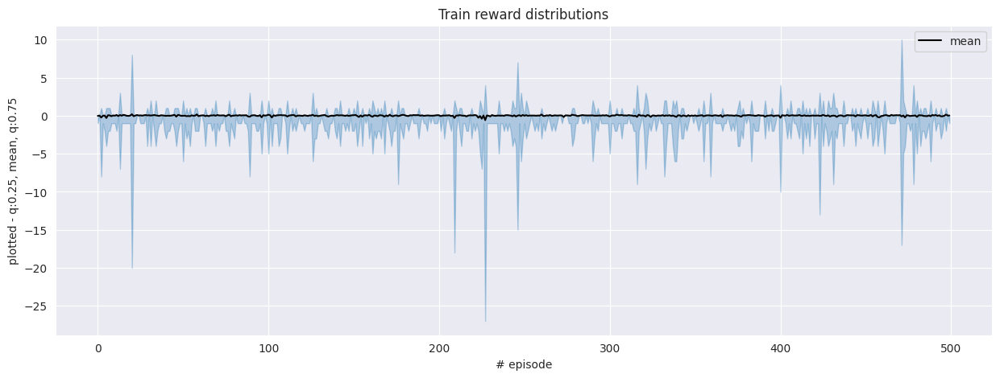

In [44]:
plot_graph(r1_list, 'Train reward distributions')

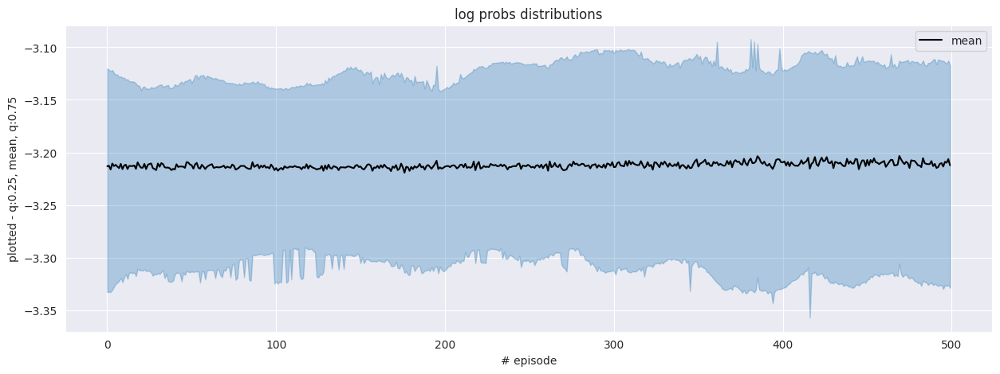

In [45]:
plot_graph(r2_list, 'log probs distributions')

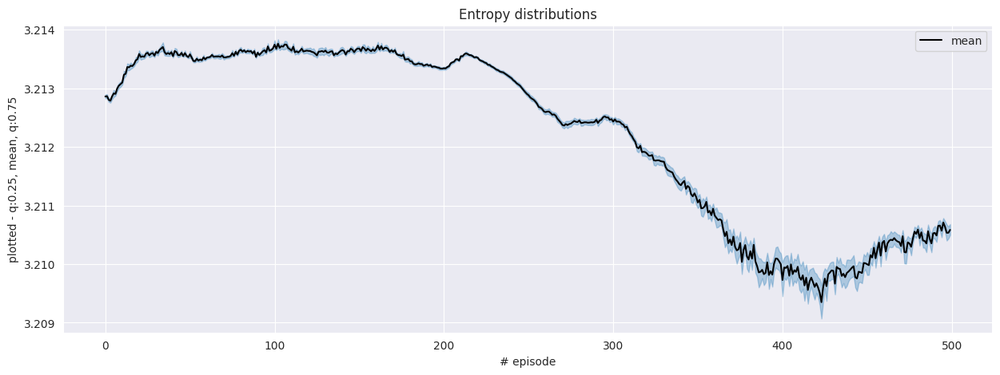

In [46]:
plot_graph(r3_list, 'Entropy distributions')

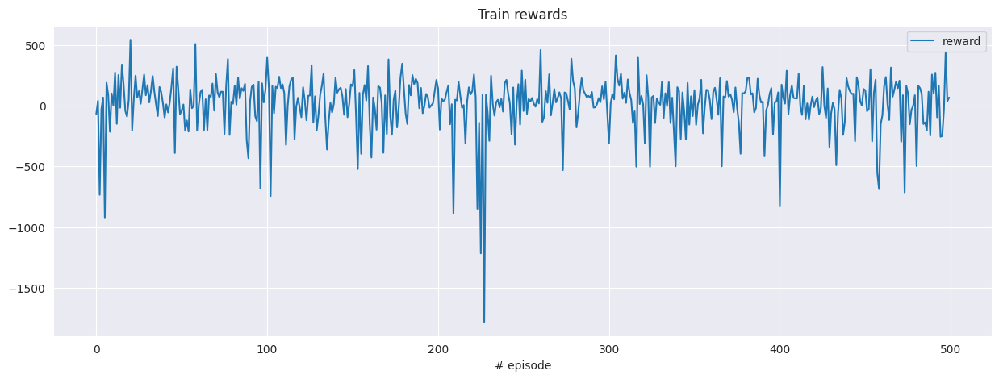

In [47]:
plot_rs(r4_list, 'Train rewards')

In [48]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [49]:
l1_r, l2_r = [], []

test_agent(agent, env)


  0%|          | 0/100 [00:00<?, ?it/s]


  1%|          | 1/100 [00:06<10:11,  6.17s/it]


  2%|▏         | 2/100 [00:12<10:03,  6.16s/it]


  3%|▎         | 3/100 [00:18<10:06,  6.25s/it]

[[9995    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



  4%|▍         | 4/100 [00:24<09:58,  6.24s/it]


  5%|▌         | 5/100 [00:31<09:52,  6.23s/it]


  6%|▌         | 6/100 [00:37<09:48,  6.26s/it]


  7%|▋         | 7/100 [00:43<09:43,  6.27s/it]


  8%|▊         | 8/100 [00:49<09:29,  6.19s/it]


  9%|▉         | 9/100 [00:55<09:23,  6.19s/it]

[[10019     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 10%|█         | 10/100 [01:02<09:16,  6.19s/it]


 11%|█         | 11/100 [01:08<09:10,  6.18s/it]


 12%|█▏        | 12/100 [01:14<09:08,  6.24s/it]


 13%|█▎        | 13/100 [01:20<08:58,  6.19s/it]


 14%|█▍        | 14/100 [01:26<08:51,  6.19s/it]


 15%|█▌        | 15/100 [01:33<08:50,  6.24s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-7



 16%|█▌        | 16/100 [01:39<08:46,  6.26s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -15]]
0
-2



 17%|█▋        | 17/100 [01:45<08:43,  6.31s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 18%|█▊        | 18/100 [01:52<08:34,  6.28s/it]


 19%|█▉        | 19/100 [01:58<08:26,  6.25s/it]

[[9988    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 20%|██        | 20/100 [02:04<08:19,  6.25s/it]


 21%|██        | 21/100 [02:10<08:08,  6.19s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-3



 22%|██▏       | 22/100 [02:17<08:06,  6.24s/it]


 23%|██▎       | 23/100 [02:23<07:59,  6.23s/it]


 24%|██▍       | 24/100 [02:29<07:49,  6.18s/it]


 25%|██▌       | 25/100 [02:35<07:45,  6.21s/it]


 26%|██▌       | 26/100 [02:41<07:39,  6.21s/it]


 27%|██▋       | 27/100 [02:48<07:35,  6.24s/it]


 28%|██▊       | 28/100 [02:54<07:26,  6.20s/it]


 29%|██▉       | 29/100 [03:00<07:20,  6.20s/it]


 30%|███       | 30/100 [03:06<07:15,  6.22s/it]


 31%|███       | 31/100 [03:12<07:06,  6.18s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 32%|███▏      | 32/100 [03:18<06:59,  6.17s/it]


 33%|███▎      | 33/100 [03:25<06:53,  6.18s/it]


 34%|███▍      | 34/100 [03:31<06:46,  6.15s/it]


 35%|███▌      | 35/100 [03:37<06:39,  6.15s/it]

[[9958    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 36%|███▌      | 36/100 [03:43<06:31,  6.12s/it]


 37%|███▋      | 37/100 [03:49<06:28,  6.17s/it]


 38%|███▊      | 38/100 [03:55<06:23,  6.19s/it]


 39%|███▉      | 39/100 [04:01<06:14,  6.14s/it]


 40%|████      | 40/100 [04:08<06:09,  6.16s/it]


 41%|████      | 41/100 [04:14<06:01,  6.13s/it]


 42%|████▏     | 42/100 [04:20<05:59,  6.19s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 43%|████▎     | 43/100 [04:27<05:58,  6.28s/it]


 44%|████▍     | 44/100 [04:33<05:52,  6.30s/it]


 45%|████▌     | 45/100 [04:39<05:44,  6.26s/it]


 46%|████▌     | 46/100 [04:45<05:37,  6.25s/it]


 47%|████▋     | 47/100 [04:51<05:28,  6.20s/it]


 48%|████▊     | 48/100 [04:58<05:23,  6.22s/it]


 49%|████▉     | 49/100 [05:04<05:15,  6.18s/it]


 50%|█████     | 50/100 [05:10<05:07,  6.16s/it]


 51%|█████     | 51/100 [05:16<05:03,  6.19s/it]


 52%|█████▏    | 52/100 [05:22<04:58,  6.21s/it]


 53%|█████▎    | 53/100 [05:29<04:51,  6.21s/it]


 54%|█████▍    | 54/100 [05:35<04:45,  6.20s/it]


 55%|█████▌    | 55/100 [05:41<04:38,  6.20s/it]


 56%|█████▌    | 56/100 [05:47<04:33,  6.21s/it]


 57%|█████▋    | 57/100 [05:54<04:28,  6.24s/it]


 58%|█████▊    | 58/100 [06:00<04:24,  6.30s/it]


 59%|█████▉    | 59/100 [06:06<04:18,  6.31s/it]


 60%|██████    | 60/100 [06:13<04:12,  6.31s/it]


 61%|██████    | 61/100 [06:19<04:04,  6.28s/it]


 62%|██████▏   | 62/100 [06:25<03:58,  6.27s/it]


 63%|██████▎   | 63/100 [06:31<03:53,  6.30s/it]


 64%|██████▍   | 64/100 [06:38<03:46,  6.28s/it]


 65%|██████▌   | 65/100 [06:44<03:38,  6.24s/it]


 66%|██████▌   | 66/100 [06:50<03:30,  6.20s/it]


 67%|██████▋   | 67/100 [06:56<03:23,  6.17s/it]


 68%|██████▊   | 68/100 [07:02<03:16,  6.16s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 69%|██████▉   | 69/100 [07:08<03:11,  6.18s/it]


 70%|███████   | 70/100 [07:15<03:05,  6.18s/it]


 71%|███████   | 71/100 [07:21<02:58,  6.15s/it]


 72%|███████▏  | 72/100 [07:27<02:51,  6.12s/it]


 73%|███████▎  | 73/100 [07:33<02:46,  6.18s/it]


 74%|███████▍  | 74/100 [07:39<02:42,  6.23s/it]


 75%|███████▌  | 75/100 [07:46<02:35,  6.22s/it]


 76%|███████▌  | 76/100 [07:52<02:27,  6.16s/it]


 77%|███████▋  | 77/100 [07:58<02:21,  6.15s/it]


 78%|███████▊  | 78/100 [08:04<02:14,  6.13s/it]


 79%|███████▉  | 79/100 [08:10<02:10,  6.23s/it]


 80%|████████  | 80/100 [08:16<02:04,  6.21s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 81%|████████  | 81/100 [08:23<01:57,  6.20s/it]


 82%|████████▏ | 82/100 [08:29<01:51,  6.21s/it]


 83%|████████▎ | 83/100 [08:35<01:45,  6.22s/it]


 84%|████████▍ | 84/100 [08:41<01:38,  6.19s/it]


 85%|████████▌ | 85/100 [08:47<01:32,  6.17s/it]


 86%|████████▌ | 86/100 [08:54<01:27,  6.22s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 87%|████████▋ | 87/100 [09:00<01:20,  6.19s/it]


 88%|████████▊ | 88/100 [09:06<01:13,  6.16s/it]


 89%|████████▉ | 89/100 [09:12<01:07,  6.16s/it]

[[10036     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 90%|█████████ | 90/100 [09:18<01:01,  6.19s/it]


 91%|█████████ | 91/100 [09:24<00:55,  6.18s/it]


 92%|█████████▏| 92/100 [09:31<00:49,  6.21s/it]

[[10013     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 93%|█████████▎| 93/100 [09:37<00:43,  6.23s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 94%|█████████▍| 94/100 [09:43<00:37,  6.27s/it]

[[9979    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 95%|█████████▌| 95/100 [09:50<00:31,  6.30s/it]


 96%|█████████▌| 96/100 [09:56<00:24,  6.22s/it]


 97%|█████████▋| 97/100 [10:02<00:18,  6.24s/it]


 98%|█████████▊| 98/100 [10:08<00:12,  6.23s/it]

[[10016     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[10016     0     0     1     1     1     1     1     1     1     1]
 [   -3     0     0     0     0     0     0     0     0     0     0]]
-3
1



 99%|█████████▉| 99/100 [10:15<00:06,  6.25s/it]


100%|██████████| 100/100 [10:21<00:00,  6.19s/it]


100%|██████████| 100/100 [10:21<00:00,  6.21s/it]

done


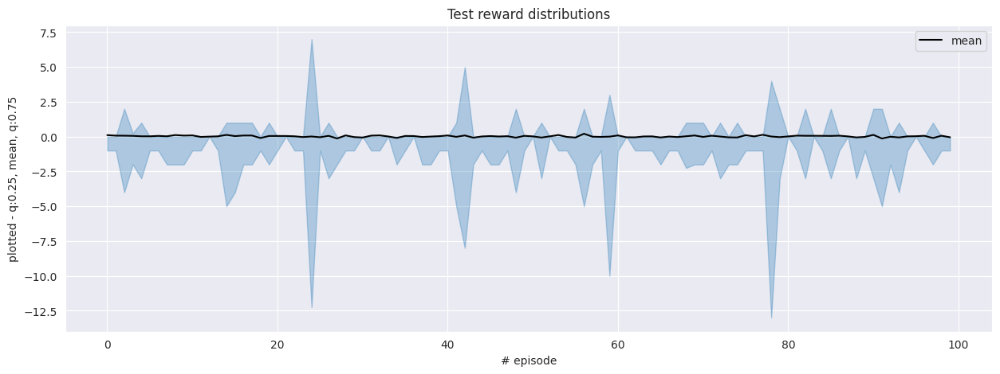

In [50]:
plot_graph(l1_r, 'Test reward distributions')

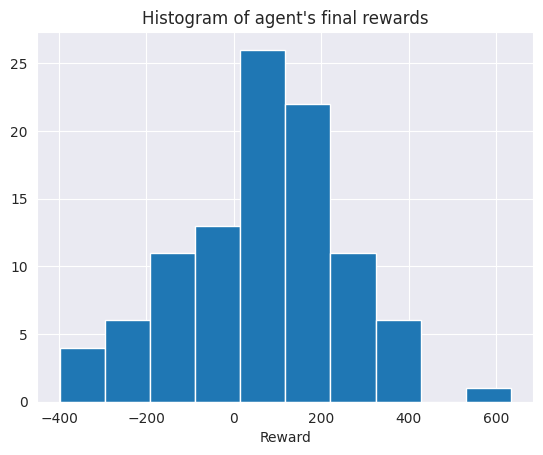

In [51]:
plot_hist(l2_r)

In [52]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V4

In [53]:
type = 'v4'

- Adam learning rate = 1e-3/2
- LayerNorm: no

In [54]:
agent = return_reinforce(1e-3/2, False)

In [55]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_reinforce)


  0%|          | 0/500 [00:00<?, ?it/s]


  0%|          | 1/500 [00:08<1:11:11,  8.56s/it]

[[9940    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  0%|          | 2/500 [00:17<1:13:10,  8.82s/it]


  1%|          | 3/500 [00:26<1:12:18,  8.73s/it]

[[10016     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



  1%|          | 4/500 [00:35<1:12:51,  8.81s/it]


  1%|          | 5/500 [00:43<1:11:55,  8.72s/it]


  1%|          | 6/500 [00:52<1:11:34,  8.69s/it]


  1%|▏         | 7/500 [01:00<1:11:06,  8.65s/it]


  2%|▏         | 8/500 [01:09<1:10:59,  8.66s/it]


  2%|▏         | 9/500 [01:18<1:11:40,  8.76s/it]


  2%|▏         | 10/500 [01:27<1:11:07,  8.71s/it]


  2%|▏         | 11/500 [01:35<1:10:27,  8.65s/it]


  2%|▏         | 12/500 [01:44<1:10:26,  8.66s/it]


  3%|▎         | 13/500 [01:53<1:10:45,  8.72s/it]

[[9970    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



  3%|▎         | 14/500 [02:02<1:10:59,  8.76s/it]


  3%|▎         | 15/500 [02:10<1:10:38,  8.74s/it]


  3%|▎         | 16/500 [02:19<1:10:14,  8.71s/it]


  3%|▎         | 17/500 [02:28<1:10:26,  8.75s/it]

[[9967    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2



  4%|▎         | 18/500 [02:37<1:10:34,  8.78s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  4%|▍         | 19/500 [02:45<1:10:29,  8.79s/it]

[[10009     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



  4%|▍         | 20/500 [02:54<1:10:12,  8.78s/it]


  4%|▍         | 21/500 [03:03<1:09:55,  8.76s/it]

[[10024     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1



  4%|▍         | 22/500 [03:12<1:09:42,  8.75s/it]


  5%|▍         | 23/500 [03:20<1:09:08,  8.70s/it]


  5%|▍         | 24/500 [03:29<1:09:23,  8.75s/it]


  5%|▌         | 25/500 [03:38<1:08:56,  8.71s/it]


  5%|▌         | 26/500 [03:46<1:08:42,  8.70s/it]


  5%|▌         | 27/500 [03:55<1:08:33,  8.70s/it]


  6%|▌         | 28/500 [04:04<1:08:16,  8.68s/it]


  6%|▌         | 29/500 [04:12<1:08:05,  8.68s/it]

[[9987    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  6%|▌         | 30/500 [04:21<1:07:53,  8.67s/it]


  6%|▌         | 31/500 [04:30<1:08:00,  8.70s/it]

[[9963    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  6%|▋         | 32/500 [04:39<1:08:21,  8.76s/it]

[[9964    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  7%|▋         | 33/500 [04:47<1:08:10,  8.76s/it]


  7%|▋         | 34/500 [04:56<1:07:45,  8.72s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  7%|▋         | 35/500 [05:05<1:08:01,  8.78s/it]


  7%|▋         | 36/500 [05:14<1:07:56,  8.79s/it]


  7%|▋         | 37/500 [05:22<1:06:57,  8.68s/it]


  8%|▊         | 38/500 [05:31<1:06:21,  8.62s/it]


  8%|▊         | 39/500 [05:39<1:06:40,  8.68s/it]

[[9969    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  8%|▊         | 40/500 [05:48<1:06:33,  8.68s/it]

[[9943    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  8%|▊         | 41/500 [05:57<1:07:52,  8.87s/it]


  8%|▊         | 42/500 [06:06<1:07:13,  8.81s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



  9%|▊         | 43/500 [06:15<1:06:50,  8.78s/it]

[[9939    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  9%|▉         | 44/500 [06:24<1:06:50,  8.80s/it]


  9%|▉         | 45/500 [06:32<1:06:24,  8.76s/it]


  9%|▉         | 46/500 [06:41<1:06:37,  8.81s/it]


  9%|▉         | 47/500 [06:50<1:05:52,  8.73s/it]

[[9949    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 10%|▉         | 48/500 [06:59<1:06:06,  8.78s/it]


 10%|▉         | 49/500 [07:07<1:05:49,  8.76s/it]


 10%|█         | 50/500 [07:16<1:05:40,  8.76s/it]


 10%|█         | 51/500 [07:25<1:05:41,  8.78s/it]


 10%|█         | 52/500 [07:34<1:04:57,  8.70s/it]


 11%|█         | 53/500 [07:42<1:04:55,  8.72s/it]


 11%|█         | 54/500 [07:51<1:04:43,  8.71s/it]


 11%|█         | 55/500 [08:00<1:04:18,  8.67s/it]


 11%|█         | 56/500 [08:08<1:04:48,  8.76s/it]


 11%|█▏        | 57/500 [08:17<1:04:50,  8.78s/it]

[[9937    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 12%|█▏        | 58/500 [08:26<1:04:33,  8.76s/it]


 12%|█▏        | 59/500 [08:35<1:04:31,  8.78s/it]


 12%|█▏        | 60/500 [08:43<1:03:59,  8.73s/it]


 12%|█▏        | 61/500 [08:52<1:04:16,  8.79s/it]

[[9938    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9938    1    1    1    1    1    1    1    1    1    1]
 [  -1    0    0    0    0    0    0    0    0    0    0]]
-1
1



 12%|█▏        | 62/500 [09:01<1:03:41,  8.72s/it]


 13%|█▎        | 63/500 [09:09<1:02:48,  8.62s/it]


 13%|█▎        | 64/500 [09:18<1:03:44,  8.77s/it]


 13%|█▎        | 65/500 [09:27<1:03:01,  8.69s/it]


 13%|█▎        | 66/500 [09:36<1:03:00,  8.71s/it]


 13%|█▎        | 67/500 [09:44<1:02:20,  8.64s/it]


 14%|█▎        | 68/500 [09:53<1:02:31,  8.68s/it]

[[10024     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



 14%|█▍        | 69/500 [10:02<1:02:57,  8.76s/it]

[[9986    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 14%|█▍        | 70/500 [10:11<1:02:29,  8.72s/it]


 14%|█▍        | 71/500 [10:19<1:01:53,  8.66s/it]


 14%|█▍        | 72/500 [10:28<1:01:38,  8.64s/it]


 15%|█▍        | 73/500 [10:36<1:01:26,  8.63s/it]


 15%|█▍        | 74/500 [10:45<1:01:24,  8.65s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 15%|█▌        | 75/500 [10:54<1:01:19,  8.66s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 15%|█▌        | 76/500 [11:03<1:01:59,  8.77s/it]


 15%|█▌        | 77/500 [11:11<1:01:21,  8.70s/it]


 16%|█▌        | 78/500 [11:20<1:01:01,  8.68s/it]


 16%|█▌        | 79/500 [11:29<1:00:51,  8.67s/it]


 16%|█▌        | 80/500 [11:37<1:00:27,  8.64s/it]

[[10020     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 16%|█▌        | 81/500 [11:46<1:00:49,  8.71s/it]


 16%|█▋        | 82/500 [11:54<1:00:01,  8.62s/it]


 17%|█▋        | 83/500 [12:03<1:00:13,  8.66s/it]

[[10027     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 17%|█▋        | 84/500 [12:12<1:00:49,  8.77s/it]


 17%|█▋        | 85/500 [12:21<1:00:08,  8.69s/it]

[[9974    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 17%|█▋        | 86/500 [12:30<1:01:03,  8.85s/it]


 17%|█▋        | 87/500 [12:38<59:56,  8.71s/it]  


 18%|█▊        | 88/500 [12:47<59:02,  8.60s/it]


 18%|█▊        | 89/500 [12:55<59:06,  8.63s/it]


 18%|█▊        | 90/500 [13:04<58:57,  8.63s/it]


 18%|█▊        | 91/500 [13:12<58:39,  8.61s/it]


 18%|█▊        | 92/500 [13:21<58:05,  8.54s/it]


 19%|█▊        | 93/500 [13:29<57:55,  8.54s/it]


 19%|█▉        | 94/500 [13:38<57:57,  8.56s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 19%|█▉        | 95/500 [13:47<57:38,  8.54s/it]


 19%|█▉        | 96/500 [13:55<58:03,  8.62s/it]


 19%|█▉        | 97/500 [14:04<57:47,  8.61s/it]

[[9985    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 20%|█▉        | 98/500 [14:12<57:35,  8.59s/it]


 20%|█▉        | 99/500 [14:21<57:41,  8.63s/it]

[[10025     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 20%|██        | 100/500 [14:30<57:34,  8.64s/it]


 20%|██        | 101/500 [14:39<57:57,  8.72s/it]


 20%|██        | 102/500 [14:47<57:36,  8.69s/it]

[[9996    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 21%|██        | 103/500 [14:56<57:26,  8.68s/it]


 21%|██        | 104/500 [15:05<57:03,  8.65s/it]

[[9947    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 21%|██        | 105/500 [15:13<56:52,  8.64s/it]


 21%|██        | 106/500 [15:22<57:08,  8.70s/it]


 21%|██▏       | 107/500 [15:31<56:40,  8.65s/it]


 22%|██▏       | 108/500 [15:39<56:26,  8.64s/it]


 22%|██▏       | 109/500 [15:48<56:40,  8.70s/it]


 22%|██▏       | 110/500 [15:56<56:05,  8.63s/it]


 22%|██▏       | 111/500 [16:05<55:57,  8.63s/it]


 22%|██▏       | 112/500 [16:14<55:42,  8.62s/it]


 23%|██▎       | 113/500 [16:22<55:25,  8.59s/it]


 23%|██▎       | 114/500 [16:31<55:28,  8.62s/it]

[[10020     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1
[[10012     0     0     0     0     0     0     0     0     0     0]
 [   -2     0    -1    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-1



 23%|██▎       | 115/500 [16:39<55:07,  8.59s/it]

[[9964    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 23%|██▎       | 116/500 [16:48<55:34,  8.68s/it]


 23%|██▎       | 117/500 [16:57<55:16,  8.66s/it]


 24%|██▎       | 118/500 [17:06<54:59,  8.64s/it]


 24%|██▍       | 119/500 [17:14<55:11,  8.69s/it]


 24%|██▍       | 120/500 [17:23<54:36,  8.62s/it]


 24%|██▍       | 121/500 [17:32<54:55,  8.69s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 24%|██▍       | 122/500 [17:40<54:14,  8.61s/it]


 25%|██▍       | 123/500 [17:49<54:21,  8.65s/it]

[[9933    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 25%|██▍       | 124/500 [17:58<54:40,  8.73s/it]


 25%|██▌       | 125/500 [18:06<54:16,  8.68s/it]


 25%|██▌       | 126/500 [18:15<54:21,  8.72s/it]

[[9946    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 25%|██▌       | 127/500 [18:24<53:39,  8.63s/it]


 26%|██▌       | 128/500 [18:32<53:03,  8.56s/it]


 26%|██▌       | 129/500 [18:41<53:15,  8.61s/it]


 26%|██▌       | 130/500 [18:49<52:58,  8.59s/it]


 26%|██▌       | 131/500 [18:58<52:51,  8.60s/it]


 26%|██▋       | 132/500 [19:06<52:45,  8.60s/it]


 27%|██▋       | 133/500 [19:15<52:20,  8.56s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1



 27%|██▋       | 134/500 [19:24<52:45,  8.65s/it]


 27%|██▋       | 135/500 [19:32<52:02,  8.56s/it]


 27%|██▋       | 136/500 [19:41<52:21,  8.63s/it]


 27%|██▋       | 137/500 [19:49<51:47,  8.56s/it]

[[9979    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 28%|██▊       | 138/500 [19:58<52:35,  8.72s/it]

[[9980    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 28%|██▊       | 139/500 [20:07<52:26,  8.72s/it]

[[9960    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 28%|██▊       | 140/500 [20:16<51:58,  8.66s/it]


 28%|██▊       | 141/500 [20:24<51:54,  8.68s/it]


 28%|██▊       | 142/500 [20:33<51:36,  8.65s/it]


 29%|██▊       | 143/500 [20:42<51:37,  8.68s/it]


 29%|██▉       | 144/500 [20:50<51:20,  8.65s/it]


 29%|██▉       | 145/500 [20:59<51:14,  8.66s/it]


 29%|██▉       | 146/500 [21:08<51:01,  8.65s/it]


 29%|██▉       | 147/500 [21:16<50:43,  8.62s/it]


 30%|██▉       | 148/500 [21:25<50:10,  8.55s/it]


 30%|██▉       | 149/500 [21:33<50:17,  8.60s/it]


 30%|███       | 150/500 [21:42<50:10,  8.60s/it]


 30%|███       | 151/500 [21:51<50:27,  8.67s/it]


 30%|███       | 152/500 [21:59<50:09,  8.65s/it]


 31%|███       | 153/500 [22:08<49:58,  8.64s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1



 31%|███       | 154/500 [22:17<50:20,  8.73s/it]

[[10018     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 31%|███       | 155/500 [22:25<49:45,  8.65s/it]


 31%|███       | 156/500 [22:34<50:06,  8.74s/it]


 31%|███▏      | 157/500 [22:43<49:40,  8.69s/it]


 32%|███▏      | 158/500 [22:51<49:10,  8.63s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1



 32%|███▏      | 159/500 [23:00<49:20,  8.68s/it]


 32%|███▏      | 160/500 [23:09<48:45,  8.60s/it]

[[9949    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 32%|███▏      | 161/500 [23:17<48:40,  8.61s/it]


 32%|███▏      | 162/500 [23:26<48:21,  8.58s/it]


 33%|███▎      | 163/500 [23:34<48:08,  8.57s/it]


 33%|███▎      | 164/500 [23:43<48:21,  8.64s/it]


 33%|███▎      | 165/500 [23:51<47:52,  8.57s/it]

[[9985    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 33%|███▎      | 166/500 [24:00<48:07,  8.64s/it]

[[10027     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-3



 33%|███▎      | 167/500 [24:09<48:22,  8.72s/it]

[[9966    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 34%|███▎      | 168/500 [24:18<48:11,  8.71s/it]


 34%|███▍      | 169/500 [24:27<48:17,  8.76s/it]


 34%|███▍      | 170/500 [24:35<48:06,  8.75s/it]


 34%|███▍      | 171/500 [24:45<48:33,  8.86s/it]


 34%|███▍      | 172/500 [24:53<47:46,  8.74s/it]


 35%|███▍      | 173/500 [25:02<47:25,  8.70s/it]

[[10023     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 35%|███▍      | 174/500 [25:11<47:45,  8.79s/it]


 35%|███▌      | 175/500 [25:19<47:25,  8.75s/it]


 35%|███▌      | 176/500 [25:28<47:03,  8.72s/it]


 35%|███▌      | 177/500 [25:36<46:27,  8.63s/it]

[[9942    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 36%|███▌      | 178/500 [25:45<46:37,  8.69s/it]


 36%|███▌      | 179/500 [25:54<46:28,  8.69s/it]


 36%|███▌      | 180/500 [26:02<45:56,  8.61s/it]


 36%|███▌      | 181/500 [26:11<45:43,  8.60s/it]

[[9977    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 36%|███▋      | 182/500 [26:19<45:37,  8.61s/it]


 37%|███▋      | 183/500 [26:28<45:11,  8.55s/it]


 37%|███▋      | 184/500 [26:37<45:16,  8.60s/it]


 37%|███▋      | 185/500 [26:45<45:10,  8.60s/it]


 37%|███▋      | 186/500 [26:54<45:09,  8.63s/it]


 37%|███▋      | 187/500 [27:02<44:37,  8.55s/it]


 38%|███▊      | 188/500 [27:11<44:34,  8.57s/it]


 38%|███▊      | 189/500 [27:20<44:46,  8.64s/it]


 38%|███▊      | 190/500 [27:28<44:15,  8.56s/it]


 38%|███▊      | 191/500 [27:37<44:17,  8.60s/it]


 38%|███▊      | 192/500 [27:45<44:02,  8.58s/it]


 39%|███▊      | 193/500 [27:54<43:52,  8.58s/it]


 39%|███▉      | 194/500 [28:02<43:45,  8.58s/it]


 39%|███▉      | 195/500 [28:11<43:40,  8.59s/it]


 39%|███▉      | 196/500 [28:20<43:38,  8.61s/it]


 39%|███▉      | 197/500 [28:28<43:37,  8.64s/it]


 40%|███▉      | 198/500 [28:37<43:38,  8.67s/it]


 40%|███▉      | 199/500 [28:46<43:22,  8.65s/it]


 40%|████      | 200/500 [28:55<43:23,  8.68s/it]


 40%|████      | 201/500 [29:03<43:25,  8.71s/it]

[[9961    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 40%|████      | 202/500 [29:12<42:57,  8.65s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1



 41%|████      | 203/500 [29:21<42:54,  8.67s/it]


 41%|████      | 204/500 [29:29<42:49,  8.68s/it]


 41%|████      | 205/500 [29:38<42:25,  8.63s/it]


 41%|████      | 206/500 [29:46<42:18,  8.63s/it]


 41%|████▏     | 207/500 [29:55<42:11,  8.64s/it]


 42%|████▏     | 208/500 [30:04<42:24,  8.71s/it]


 42%|████▏     | 209/500 [30:13<42:31,  8.77s/it]


 42%|████▏     | 210/500 [30:21<41:52,  8.66s/it]


 42%|████▏     | 211/500 [30:30<41:41,  8.66s/it]


 42%|████▏     | 212/500 [30:38<41:08,  8.57s/it]


 43%|████▎     | 213/500 [30:47<40:50,  8.54s/it]


 43%|████▎     | 214/500 [30:55<40:42,  8.54s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1



 43%|████▎     | 215/500 [31:04<40:34,  8.54s/it]


 43%|████▎     | 216/500 [31:13<40:38,  8.59s/it]


 43%|████▎     | 217/500 [31:21<40:25,  8.57s/it]


 44%|████▎     | 218/500 [31:30<40:27,  8.61s/it]


 44%|████▍     | 219/500 [31:39<40:38,  8.68s/it]


 44%|████▍     | 220/500 [31:47<40:06,  8.59s/it]


 44%|████▍     | 221/500 [31:56<40:19,  8.67s/it]


 44%|████▍     | 222/500 [32:04<39:54,  8.61s/it]


 45%|████▍     | 223/500 [32:13<39:35,  8.58s/it]


 45%|████▍     | 224/500 [32:22<39:43,  8.64s/it]


 45%|████▌     | 225/500 [32:30<39:23,  8.59s/it]


 45%|████▌     | 226/500 [32:39<39:36,  8.67s/it]


 45%|████▌     | 227/500 [32:47<39:07,  8.60s/it]


 46%|████▌     | 228/500 [32:56<38:53,  8.58s/it]


 46%|████▌     | 229/500 [33:05<38:55,  8.62s/it]


 46%|████▌     | 230/500 [33:13<38:53,  8.64s/it]


 46%|████▌     | 231/500 [33:22<38:52,  8.67s/it]


 46%|████▋     | 232/500 [33:31<38:39,  8.65s/it]


 47%|████▋     | 233/500 [33:39<38:30,  8.65s/it]


 47%|████▋     | 234/500 [33:48<38:28,  8.68s/it]


 47%|████▋     | 235/500 [33:57<38:19,  8.68s/it]


 47%|████▋     | 236/500 [34:06<38:32,  8.76s/it]


 47%|████▋     | 237/500 [34:14<38:26,  8.77s/it]


 48%|████▊     | 238/500 [34:23<38:07,  8.73s/it]


 48%|████▊     | 239/500 [34:32<37:59,  8.73s/it]


 48%|████▊     | 240/500 [34:40<37:36,  8.68s/it]


 48%|████▊     | 241/500 [34:49<37:53,  8.78s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 48%|████▊     | 242/500 [34:58<37:35,  8.74s/it]


 49%|████▊     | 243/500 [35:07<37:21,  8.72s/it]


 49%|████▉     | 244/500 [35:16<37:35,  8.81s/it]


 49%|████▉     | 245/500 [35:24<37:11,  8.75s/it]

[[10018     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1



 49%|████▉     | 246/500 [35:33<36:55,  8.72s/it]


 49%|████▉     | 247/500 [35:42<36:36,  8.68s/it]


 50%|████▉     | 248/500 [35:50<36:33,  8.70s/it]


 50%|████▉     | 249/500 [35:59<36:21,  8.69s/it]


 50%|█████     | 250/500 [36:08<36:16,  8.71s/it]


 50%|█████     | 251/500 [36:17<36:24,  8.77s/it]


 50%|█████     | 252/500 [36:25<35:58,  8.70s/it]


 51%|█████     | 253/500 [36:34<35:38,  8.66s/it]


 51%|█████     | 254/500 [36:43<35:48,  8.73s/it]


 51%|█████     | 255/500 [36:51<35:43,  8.75s/it]


 51%|█████     | 256/500 [37:00<35:47,  8.80s/it]


 51%|█████▏    | 257/500 [37:09<35:19,  8.72s/it]

[[9959    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 52%|█████▏    | 258/500 [37:18<35:02,  8.69s/it]


 52%|█████▏    | 259/500 [37:26<35:03,  8.73s/it]


 52%|█████▏    | 260/500 [37:35<34:42,  8.68s/it]


 52%|█████▏    | 261/500 [37:44<34:29,  8.66s/it]


 52%|█████▏    | 262/500 [37:52<34:27,  8.69s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 53%|█████▎    | 263/500 [38:01<34:37,  8.77s/it]


 53%|█████▎    | 264/500 [38:10<34:33,  8.78s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-1



 53%|█████▎    | 265/500 [38:19<34:19,  8.76s/it]


 53%|█████▎    | 266/500 [38:28<34:29,  8.84s/it]


 53%|█████▎    | 267/500 [38:36<34:05,  8.78s/it]


 54%|█████▎    | 268/500 [38:45<33:33,  8.68s/it]


 54%|█████▍    | 269/500 [38:54<33:30,  8.70s/it]

[[10000     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -7]]
0
-1



 54%|█████▍    | 270/500 [39:02<33:14,  8.67s/it]


 54%|█████▍    | 271/500 [39:11<33:08,  8.68s/it]


 54%|█████▍    | 272/500 [39:20<33:02,  8.70s/it]


 55%|█████▍    | 273/500 [39:28<32:54,  8.70s/it]


 55%|█████▍    | 274/500 [39:37<32:54,  8.73s/it]


 55%|█████▌    | 275/500 [39:46<32:43,  8.73s/it]


 55%|█████▌    | 276/500 [39:55<33:00,  8.84s/it]


 55%|█████▌    | 277/500 [40:04<32:30,  8.75s/it]


 56%|█████▌    | 278/500 [40:12<32:08,  8.69s/it]

[[9959    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 56%|█████▌    | 279/500 [40:21<32:04,  8.71s/it]


 56%|█████▌    | 280/500 [40:30<31:51,  8.69s/it]


 56%|█████▌    | 281/500 [40:38<31:47,  8.71s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 56%|█████▋    | 282/500 [40:47<31:32,  8.68s/it]


 57%|█████▋    | 283/500 [40:55<31:13,  8.64s/it]


 57%|█████▋    | 284/500 [41:04<31:24,  8.72s/it]


 57%|█████▋    | 285/500 [41:13<31:07,  8.68s/it]


 57%|█████▋    | 286/500 [41:22<30:54,  8.67s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -12]]
0
-1
[[10007     0     1     1     1     1     1     1     1     1     1]
 [   -2     0     0     0     0     0     0     0     0     0     0]]
-2
1



 57%|█████▋    | 287/500 [41:30<30:36,  8.62s/it]

[[10018     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 58%|█████▊    | 288/500 [41:39<30:30,  8.63s/it]


 58%|█████▊    | 289/500 [41:47<30:26,  8.66s/it]


 58%|█████▊    | 290/500 [41:56<30:14,  8.64s/it]


 58%|█████▊    | 291/500 [42:05<30:26,  8.74s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 58%|█████▊    | 292/500 [42:14<30:16,  8.73s/it]

[[9941    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 59%|█████▊    | 293/500 [42:22<29:48,  8.64s/it]


 59%|█████▉    | 294/500 [42:31<29:55,  8.72s/it]


 59%|█████▉    | 295/500 [42:40<29:40,  8.68s/it]


 59%|█████▉    | 296/500 [42:49<29:51,  8.78s/it]

[[10000     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 59%|█████▉    | 297/500 [42:57<29:36,  8.75s/it]


 60%|█████▉    | 298/500 [43:06<29:27,  8.75s/it]


 60%|█████▉    | 299/500 [43:15<29:22,  8.77s/it]


 60%|██████    | 300/500 [43:23<28:59,  8.70s/it]


 60%|██████    | 301/500 [43:32<28:59,  8.74s/it]


 60%|██████    | 302/500 [43:41<28:39,  8.68s/it]


 61%|██████    | 303/500 [43:50<28:32,  8.69s/it]


 61%|██████    | 304/500 [43:58<28:35,  8.75s/it]


 61%|██████    | 305/500 [44:07<28:13,  8.69s/it]


 61%|██████    | 306/500 [44:16<28:27,  8.80s/it]


 61%|██████▏   | 307/500 [44:25<28:03,  8.72s/it]


 62%|██████▏   | 308/500 [44:33<27:44,  8.67s/it]


 62%|██████▏   | 309/500 [44:42<27:42,  8.71s/it]

[[9987    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 62%|██████▏   | 310/500 [44:51<27:29,  8.68s/it]


 62%|██████▏   | 311/500 [44:59<27:19,  8.68s/it]


 62%|██████▏   | 312/500 [45:08<27:01,  8.63s/it]


 63%|██████▎   | 313/500 [45:16<27:00,  8.66s/it]


 63%|██████▎   | 314/500 [45:25<26:55,  8.69s/it]

[[9980    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 63%|██████▎   | 315/500 [45:34<26:43,  8.67s/it]


 63%|██████▎   | 316/500 [45:43<26:45,  8.73s/it]


 63%|██████▎   | 317/500 [45:51<26:33,  8.71s/it]


 64%|██████▎   | 318/500 [46:00<26:22,  8.69s/it]


 64%|██████▍   | 319/500 [46:09<26:26,  8.77s/it]


 64%|██████▍   | 320/500 [46:18<26:14,  8.75s/it]


 64%|██████▍   | 321/500 [46:27<26:12,  8.79s/it]


 64%|██████▍   | 322/500 [46:35<25:51,  8.72s/it]

[[10037     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



 65%|██████▍   | 323/500 [46:44<25:42,  8.72s/it]


 65%|██████▍   | 324/500 [46:53<25:40,  8.75s/it]


 65%|██████▌   | 325/500 [47:01<25:31,  8.75s/it]


 65%|██████▌   | 326/500 [47:10<25:27,  8.78s/it]


 65%|██████▌   | 327/500 [47:19<25:02,  8.68s/it]


 66%|██████▌   | 328/500 [47:27<24:54,  8.69s/it]


 66%|██████▌   | 329/500 [47:36<24:44,  8.68s/it]


 66%|██████▌   | 330/500 [47:44<24:21,  8.60s/it]


 66%|██████▌   | 331/500 [47:53<24:22,  8.66s/it]


 66%|██████▋   | 332/500 [48:02<24:19,  8.69s/it]


 67%|██████▋   | 333/500 [48:11<24:08,  8.67s/it]


 67%|██████▋   | 334/500 [48:19<23:58,  8.66s/it]


 67%|██████▋   | 335/500 [48:28<23:48,  8.65s/it]


 67%|██████▋   | 336/500 [48:37<23:46,  8.70s/it]


 67%|██████▋   | 337/500 [48:45<23:25,  8.63s/it]


 68%|██████▊   | 338/500 [48:54<23:19,  8.64s/it]


 68%|██████▊   | 339/500 [49:03<23:23,  8.72s/it]


 68%|██████▊   | 340/500 [49:11<23:02,  8.64s/it]

[[9959    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 68%|██████▊   | 341/500 [49:20<22:58,  8.67s/it]


 68%|██████▊   | 342/500 [49:28<22:43,  8.63s/it]


 69%|██████▊   | 343/500 [49:37<22:39,  8.66s/it]


 69%|██████▉   | 344/500 [49:46<22:33,  8.67s/it]


 69%|██████▉   | 345/500 [49:55<22:20,  8.65s/it]


 69%|██████▉   | 346/500 [50:03<22:20,  8.71s/it]


 69%|██████▉   | 347/500 [50:12<22:04,  8.66s/it]


 70%|██████▉   | 348/500 [50:20<21:46,  8.60s/it]


 70%|██████▉   | 349/500 [50:29<21:46,  8.65s/it]

[[9976    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 70%|███████   | 350/500 [50:38<21:40,  8.67s/it]


 70%|███████   | 351/500 [50:46<21:26,  8.64s/it]


 70%|███████   | 352/500 [50:55<21:15,  8.62s/it]


 71%|███████   | 353/500 [51:03<20:59,  8.57s/it]


 71%|███████   | 354/500 [51:12<21:02,  8.65s/it]


 71%|███████   | 355/500 [51:21<20:48,  8.61s/it]


 71%|███████   | 356/500 [51:29<20:42,  8.63s/it]


 71%|███████▏  | 357/500 [51:38<20:26,  8.58s/it]


 72%|███████▏  | 358/500 [51:46<20:17,  8.57s/it]


 72%|███████▏  | 359/500 [51:55<20:15,  8.62s/it]

[[9981    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 72%|███████▏  | 360/500 [52:04<20:00,  8.57s/it]


 72%|███████▏  | 361/500 [52:12<19:57,  8.61s/it]


 72%|███████▏  | 362/500 [52:21<19:46,  8.60s/it]

[[9984    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 73%|███████▎  | 363/500 [52:29<19:31,  8.55s/it]

[[9999    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4



 73%|███████▎  | 364/500 [52:38<19:40,  8.68s/it]


 73%|███████▎  | 365/500 [52:47<19:24,  8.63s/it]


 73%|███████▎  | 366/500 [52:55<19:15,  8.62s/it]


 73%|███████▎  | 367/500 [53:04<19:03,  8.59s/it]


 74%|███████▎  | 368/500 [53:13<18:51,  8.57s/it]

[[9953    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 74%|███████▍  | 369/500 [53:22<18:59,  8.70s/it]


 74%|███████▍  | 370/500 [53:30<18:41,  8.63s/it]


 74%|███████▍  | 371/500 [53:39<18:33,  8.63s/it]


 74%|███████▍  | 372/500 [53:47<18:19,  8.59s/it]


 75%|███████▍  | 373/500 [53:56<18:13,  8.61s/it]


 75%|███████▍  | 374/500 [54:05<18:18,  8.72s/it]

[[9959    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 75%|███████▌  | 375/500 [54:14<18:19,  8.80s/it]


 75%|███████▌  | 376/500 [54:23<18:12,  8.81s/it]


 75%|███████▌  | 377/500 [54:31<17:51,  8.71s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 76%|███████▌  | 378/500 [54:40<17:42,  8.71s/it]


 76%|███████▌  | 379/500 [54:49<17:41,  8.77s/it]


 76%|███████▌  | 380/500 [54:57<17:25,  8.71s/it]


 76%|███████▌  | 381/500 [55:06<17:19,  8.74s/it]

[[9997    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 76%|███████▋  | 382/500 [55:15<17:06,  8.70s/it]


 77%|███████▋  | 383/500 [55:23<16:57,  8.69s/it]


 77%|███████▋  | 384/500 [55:32<16:49,  8.70s/it]


 77%|███████▋  | 385/500 [55:41<16:39,  8.69s/it]


 77%|███████▋  | 386/500 [55:50<16:35,  8.74s/it]


 77%|███████▋  | 387/500 [55:58<16:20,  8.67s/it]


 78%|███████▊  | 388/500 [56:07<16:09,  8.66s/it]


 78%|███████▊  | 389/500 [56:16<16:06,  8.71s/it]


 78%|███████▊  | 390/500 [56:24<15:51,  8.65s/it]


 78%|███████▊  | 391/500 [56:33<15:49,  8.71s/it]

[[10024     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 78%|███████▊  | 392/500 [56:41<15:34,  8.65s/it]


 79%|███████▊  | 393/500 [56:50<15:21,  8.61s/it]


 79%|███████▉  | 394/500 [56:59<15:26,  8.74s/it]


 79%|███████▉  | 395/500 [57:08<15:17,  8.74s/it]

[[9945    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 79%|███████▉  | 396/500 [57:17<15:10,  8.76s/it]


 79%|███████▉  | 397/500 [57:25<14:57,  8.71s/it]

[[9926    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3



 80%|███████▉  | 398/500 [57:34<14:58,  8.81s/it]


 80%|███████▉  | 399/500 [57:43<14:39,  8.71s/it]


 80%|████████  | 400/500 [57:51<14:29,  8.70s/it]


 80%|████████  | 401/500 [58:00<14:29,  8.78s/it]


 80%|████████  | 402/500 [58:09<14:16,  8.74s/it]


 81%|████████  | 403/500 [58:17<14:02,  8.68s/it]


 81%|████████  | 404/500 [58:26<13:53,  8.68s/it]


 81%|████████  | 405/500 [58:35<13:47,  8.71s/it]


 81%|████████  | 406/500 [58:44<13:37,  8.70s/it]


 81%|████████▏ | 407/500 [58:52<13:23,  8.64s/it]

[[9952    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 82%|████████▏ | 408/500 [59:01<13:15,  8.65s/it]


 82%|████████▏ | 409/500 [59:10<13:14,  8.73s/it]


 82%|████████▏ | 410/500 [59:18<12:56,  8.63s/it]


 82%|████████▏ | 411/500 [59:27<12:49,  8.64s/it]


 82%|████████▏ | 412/500 [59:35<12:42,  8.66s/it]


 83%|████████▎ | 413/500 [59:44<12:36,  8.69s/it]


 83%|████████▎ | 414/500 [59:53<12:31,  8.74s/it]

[[9969    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1



 83%|████████▎ | 415/500 [1:00:02<12:20,  8.71s/it]


 83%|████████▎ | 416/500 [1:00:11<12:14,  8.75s/it]


 83%|████████▎ | 417/500 [1:00:19<12:03,  8.71s/it]


 84%|████████▎ | 418/500 [1:00:28<11:49,  8.66s/it]


 84%|████████▍ | 419/500 [1:00:36<11:43,  8.69s/it]


 84%|████████▍ | 420/500 [1:00:45<11:32,  8.65s/it]

[[9980    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 84%|████████▍ | 421/500 [1:00:54<11:26,  8.69s/it]


 84%|████████▍ | 422/500 [1:01:02<11:14,  8.65s/it]


 85%|████████▍ | 423/500 [1:01:11<11:02,  8.61s/it]


 85%|████████▍ | 424/500 [1:01:20<10:58,  8.66s/it]


 85%|████████▌ | 425/500 [1:01:28<10:44,  8.59s/it]

[[10017     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1



 85%|████████▌ | 426/500 [1:01:37<10:44,  8.71s/it]

[[9966    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 85%|████████▌ | 427/500 [1:01:46<10:40,  8.77s/it]


 86%|████████▌ | 428/500 [1:01:55<10:29,  8.74s/it]


 86%|████████▌ | 429/500 [1:02:03<10:20,  8.74s/it]


 86%|████████▌ | 430/500 [1:02:12<10:09,  8.70s/it]


 86%|████████▌ | 431/500 [1:02:21<10:02,  8.72s/it]


 86%|████████▋ | 432/500 [1:02:29<09:46,  8.63s/it]


 87%|████████▋ | 433/500 [1:02:38<09:34,  8.58s/it]


 87%|████████▋ | 434/500 [1:02:47<09:35,  8.72s/it]


 87%|████████▋ | 435/500 [1:02:55<09:22,  8.66s/it]

[[9970    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 87%|████████▋ | 436/500 [1:03:04<09:17,  8.71s/it]


 87%|████████▋ | 437/500 [1:03:12<09:03,  8.62s/it]


 88%|████████▊ | 438/500 [1:03:21<08:53,  8.60s/it]

[[9922    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 88%|████████▊ | 439/500 [1:03:30<08:52,  8.73s/it]

[[10016     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 88%|████████▊ | 440/500 [1:03:38<08:36,  8.61s/it]

[[9979    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 88%|████████▊ | 441/500 [1:03:47<08:30,  8.66s/it]


 88%|████████▊ | 442/500 [1:03:56<08:18,  8.60s/it]

[[9956    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 89%|████████▊ | 443/500 [1:04:04<08:08,  8.57s/it]


 89%|████████▉ | 444/500 [1:04:13<08:05,  8.66s/it]


 89%|████████▉ | 445/500 [1:04:22<07:54,  8.62s/it]

[[9922    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 89%|████████▉ | 446/500 [1:04:30<07:47,  8.66s/it]


 89%|████████▉ | 447/500 [1:04:39<07:36,  8.61s/it]


 90%|████████▉ | 448/500 [1:04:47<07:25,  8.56s/it]

[[10012     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 90%|████████▉ | 449/500 [1:04:56<07:24,  8.71s/it]


 90%|█████████ | 450/500 [1:05:05<07:14,  8.69s/it]


 90%|█████████ | 451/500 [1:05:14<07:05,  8.68s/it]


 90%|█████████ | 452/500 [1:05:22<06:53,  8.62s/it]


 91%|█████████ | 453/500 [1:05:30<06:42,  8.56s/it]


 91%|█████████ | 454/500 [1:05:39<06:37,  8.64s/it]


 91%|█████████ | 455/500 [1:05:48<06:26,  8.58s/it]


 91%|█████████ | 456/500 [1:05:56<06:15,  8.53s/it]


 91%|█████████▏| 457/500 [1:06:05<06:09,  8.60s/it]


 92%|█████████▏| 458/500 [1:06:13<05:58,  8.52s/it]


 92%|█████████▏| 459/500 [1:06:22<05:49,  8.52s/it]


 92%|█████████▏| 460/500 [1:06:30<05:40,  8.50s/it]

[[10000     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 92%|█████████▏| 461/500 [1:06:39<05:33,  8.56s/it]


 92%|█████████▏| 462/500 [1:06:47<05:24,  8.55s/it]


 93%|█████████▎| 463/500 [1:06:56<05:16,  8.54s/it]


 93%|█████████▎| 464/500 [1:07:05<05:10,  8.63s/it]


 93%|█████████▎| 465/500 [1:07:13<05:01,  8.61s/it]


 93%|█████████▎| 466/500 [1:07:22<04:54,  8.67s/it]


 93%|█████████▎| 467/500 [1:07:31<04:44,  8.63s/it]


 94%|█████████▎| 468/500 [1:07:39<04:37,  8.66s/it]


 94%|█████████▍| 469/500 [1:07:48<04:28,  8.66s/it]


 94%|█████████▍| 470/500 [1:07:57<04:19,  8.66s/it]


 94%|█████████▍| 471/500 [1:08:06<04:12,  8.72s/it]


 94%|█████████▍| 472/500 [1:08:14<04:03,  8.71s/it]


 95%|█████████▍| 473/500 [1:08:23<03:55,  8.71s/it]


 95%|█████████▍| 474/500 [1:08:32<03:47,  8.76s/it]


 95%|█████████▌| 475/500 [1:08:41<03:39,  8.77s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2



 95%|█████████▌| 476/500 [1:08:49<03:29,  8.74s/it]


 95%|█████████▌| 477/500 [1:08:58<03:19,  8.69s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 96%|█████████▌| 478/500 [1:09:07<03:10,  8.65s/it]


 96%|█████████▌| 479/500 [1:09:15<03:02,  8.71s/it]


 96%|█████████▌| 480/500 [1:09:24<02:52,  8.65s/it]


 96%|█████████▌| 481/500 [1:09:33<02:45,  8.70s/it]


 96%|█████████▋| 482/500 [1:09:41<02:35,  8.66s/it]


 97%|█████████▋| 483/500 [1:09:50<02:26,  8.62s/it]


 97%|█████████▋| 484/500 [1:09:59<02:19,  8.70s/it]


 97%|█████████▋| 485/500 [1:10:07<02:10,  8.73s/it]


 97%|█████████▋| 486/500 [1:10:16<02:01,  8.70s/it]


 97%|█████████▋| 487/500 [1:10:25<01:53,  8.73s/it]

[[9956    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 98%|█████████▊| 488/500 [1:10:34<01:45,  8.77s/it]


 98%|█████████▊| 489/500 [1:10:42<01:36,  8.76s/it]


 98%|█████████▊| 490/500 [1:10:51<01:27,  8.73s/it]


 98%|█████████▊| 491/500 [1:11:00<01:18,  8.70s/it]


 98%|█████████▊| 492/500 [1:11:08<01:09,  8.66s/it]


 99%|█████████▊| 493/500 [1:11:17<01:00,  8.64s/it]


 99%|█████████▉| 494/500 [1:11:26<00:51,  8.63s/it]


 99%|█████████▉| 495/500 [1:11:34<00:43,  8.63s/it]


 99%|█████████▉| 496/500 [1:11:43<00:34,  8.65s/it]


 99%|█████████▉| 497/500 [1:11:52<00:26,  8.70s/it]


100%|█████████▉| 498/500 [1:12:00<00:17,  8.71s/it]


100%|█████████▉| 499/500 [1:12:09<00:08,  8.70s/it]

[[9953    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



100%|██████████| 500/500 [1:12:18<00:00,  8.73s/it]


100%|██████████| 500/500 [1:12:18<00:00,  8.68s/it]

done


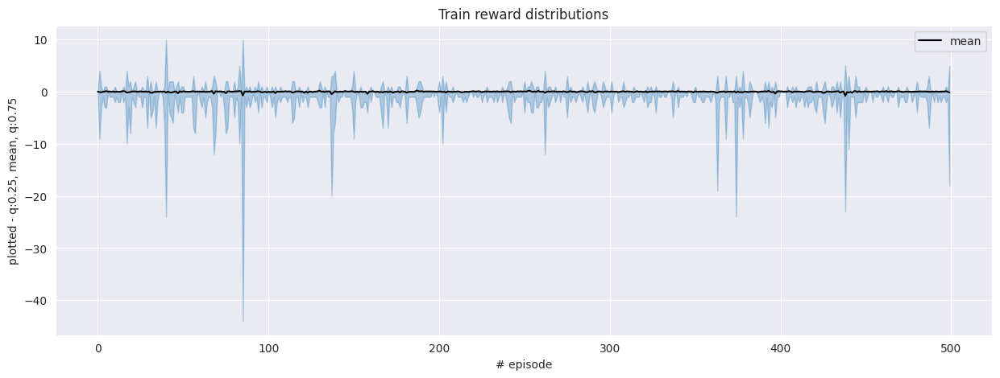

In [56]:
plot_graph(r1_list, 'Train reward distributions')

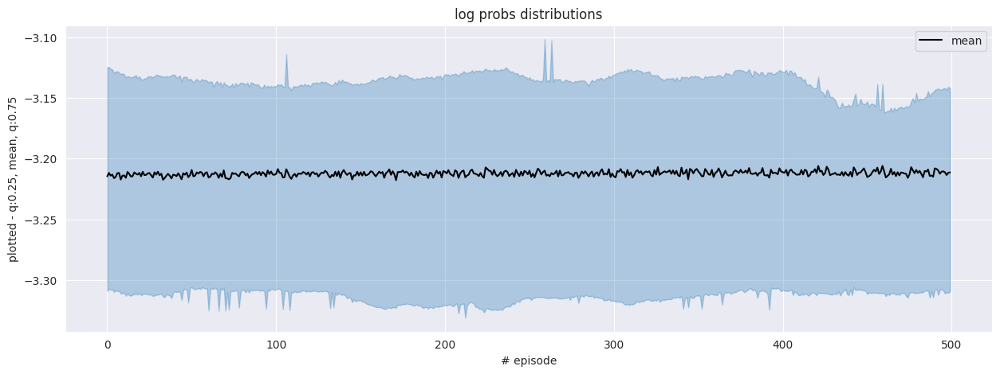

In [57]:
plot_graph(r2_list, 'log probs distributions')

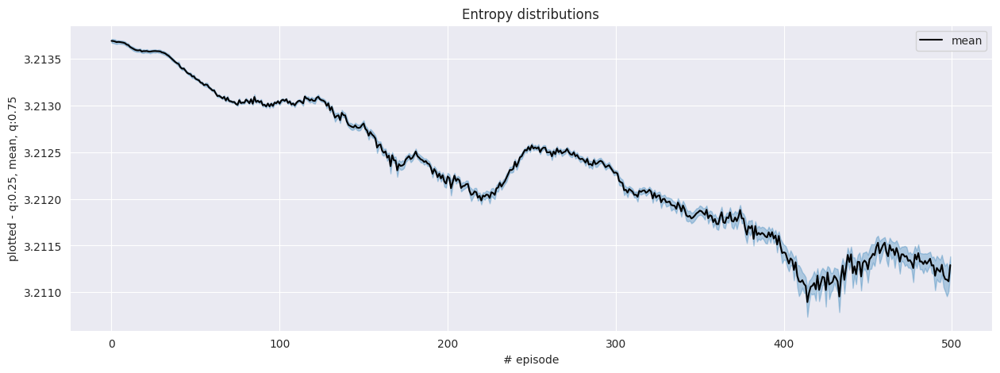

In [58]:
plot_graph(r3_list, 'Entropy distributions')

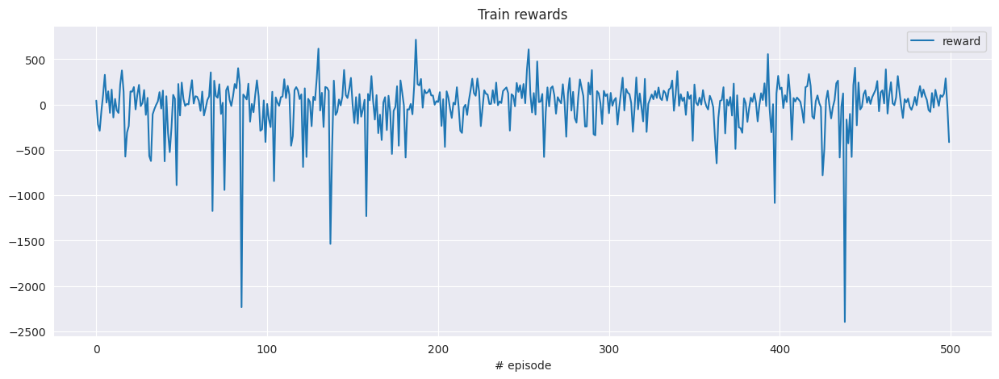

In [59]:
plot_rs(r4_list, 'Train rewards')

In [60]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [61]:
l1_r, l2_r = [], []

test_agent(agent, env)


  0%|          | 0/100 [00:00<?, ?it/s]


  1%|          | 1/100 [00:06<10:17,  6.24s/it]

[[9970    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  2%|▏         | 2/100 [00:12<10:04,  6.16s/it]


  3%|▎         | 3/100 [00:18<09:59,  6.18s/it]


  4%|▍         | 4/100 [00:24<09:55,  6.20s/it]


  5%|▌         | 5/100 [00:30<09:47,  6.18s/it]


  6%|▌         | 6/100 [00:37<09:47,  6.25s/it]

[[10000     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -7]]
0
-1



  7%|▋         | 7/100 [00:43<09:36,  6.20s/it]


  8%|▊         | 8/100 [00:49<09:28,  6.18s/it]


  9%|▉         | 9/100 [00:55<09:22,  6.18s/it]


 10%|█         | 10/100 [01:02<09:20,  6.23s/it]

[[9964    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 11%|█         | 11/100 [01:08<09:10,  6.18s/it]


 12%|█▏        | 12/100 [01:14<09:03,  6.17s/it]


 13%|█▎        | 13/100 [01:20<08:56,  6.17s/it]


 14%|█▍        | 14/100 [01:27<09:04,  6.33s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1



 15%|█▌        | 15/100 [01:33<08:52,  6.27s/it]


 16%|█▌        | 16/100 [01:39<08:52,  6.34s/it]

[[9978    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 17%|█▋        | 17/100 [01:45<08:42,  6.30s/it]


 18%|█▊        | 18/100 [01:52<08:30,  6.23s/it]


 19%|█▉        | 19/100 [01:58<08:26,  6.26s/it]


 20%|██        | 20/100 [02:04<08:23,  6.30s/it]


 21%|██        | 21/100 [02:10<08:13,  6.25s/it]


 22%|██▏       | 22/100 [02:17<08:07,  6.25s/it]

[[9959    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 23%|██▎       | 23/100 [02:23<08:03,  6.28s/it]


 24%|██▍       | 24/100 [02:29<07:57,  6.28s/it]


 25%|██▌       | 25/100 [02:36<07:52,  6.30s/it]

[[9941    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 26%|██▌       | 26/100 [02:42<07:44,  6.28s/it]

[[9970    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 27%|██▋       | 27/100 [02:48<07:35,  6.24s/it]

[[10002     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 28%|██▊       | 28/100 [02:54<07:31,  6.27s/it]


 29%|██▉       | 29/100 [03:00<07:19,  6.19s/it]


 30%|███       | 30/100 [03:07<07:12,  6.18s/it]


 31%|███       | 31/100 [03:13<07:06,  6.18s/it]


 32%|███▏      | 32/100 [03:19<06:59,  6.16s/it]


 33%|███▎      | 33/100 [03:25<06:54,  6.19s/it]


 34%|███▍      | 34/100 [03:31<06:47,  6.18s/it]


 35%|███▌      | 35/100 [03:37<06:42,  6.20s/it]


 36%|███▌      | 36/100 [03:44<06:37,  6.21s/it]


 37%|███▋      | 37/100 [03:50<06:32,  6.24s/it]


 38%|███▊      | 38/100 [03:56<06:28,  6.27s/it]


 39%|███▉      | 39/100 [04:03<06:20,  6.24s/it]


 40%|████      | 40/100 [04:09<06:13,  6.22s/it]


 41%|████      | 41/100 [04:15<06:10,  6.29s/it]

[[10032     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 42%|████▏     | 42/100 [04:21<06:01,  6.23s/it]


 43%|████▎     | 43/100 [04:27<05:53,  6.21s/it]

[[10002     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 44%|████▍     | 44/100 [04:34<05:47,  6.21s/it]


 45%|████▌     | 45/100 [04:40<05:46,  6.30s/it]


 46%|████▌     | 46/100 [04:46<05:39,  6.29s/it]


 47%|████▋     | 47/100 [04:52<05:30,  6.24s/it]


 48%|████▊     | 48/100 [04:59<05:22,  6.20s/it]


 49%|████▉     | 49/100 [05:05<05:20,  6.28s/it]


 50%|█████     | 50/100 [05:11<05:12,  6.24s/it]


 51%|█████     | 51/100 [05:17<05:04,  6.21s/it]


 52%|█████▏    | 52/100 [05:23<04:55,  6.15s/it]


 53%|█████▎    | 53/100 [05:30<04:49,  6.15s/it]


 54%|█████▍    | 54/100 [05:36<04:43,  6.16s/it]


 55%|█████▌    | 55/100 [05:42<04:39,  6.21s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 56%|█████▌    | 56/100 [05:48<04:31,  6.18s/it]


 57%|█████▋    | 57/100 [05:54<04:23,  6.13s/it]


 58%|█████▊    | 58/100 [06:00<04:15,  6.10s/it]

[[10004     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 59%|█████▉    | 59/100 [06:06<04:11,  6.14s/it]

[[10005     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 60%|██████    | 60/100 [06:13<04:06,  6.17s/it]


 61%|██████    | 61/100 [06:19<04:01,  6.19s/it]


 62%|██████▏   | 62/100 [06:25<03:54,  6.18s/it]


 63%|██████▎   | 63/100 [06:31<03:46,  6.11s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1



 64%|██████▍   | 64/100 [06:37<03:39,  6.09s/it]


 65%|██████▌   | 65/100 [06:43<03:33,  6.09s/it]


 66%|██████▌   | 66/100 [06:49<03:26,  6.08s/it]


 67%|██████▋   | 67/100 [06:55<03:20,  6.08s/it]


 68%|██████▊   | 68/100 [07:01<03:13,  6.06s/it]


 69%|██████▉   | 69/100 [07:07<03:08,  6.07s/it]


 70%|███████   | 70/100 [07:13<03:02,  6.08s/it]


 71%|███████   | 71/100 [07:20<02:56,  6.08s/it]


 72%|███████▏  | 72/100 [07:26<02:50,  6.08s/it]


 73%|███████▎  | 73/100 [07:32<02:44,  6.08s/it]


 74%|███████▍  | 74/100 [07:38<02:38,  6.11s/it]


 75%|███████▌  | 75/100 [07:44<02:32,  6.11s/it]


 76%|███████▌  | 76/100 [07:50<02:27,  6.15s/it]


 77%|███████▋  | 77/100 [07:56<02:20,  6.12s/it]


 78%|███████▊  | 78/100 [08:02<02:14,  6.12s/it]


 79%|███████▉  | 79/100 [08:09<02:08,  6.14s/it]


 80%|████████  | 80/100 [08:15<02:02,  6.14s/it]


 81%|████████  | 81/100 [08:21<01:56,  6.15s/it]


 82%|████████▏ | 82/100 [08:27<01:50,  6.12s/it]


 83%|████████▎ | 83/100 [08:33<01:43,  6.11s/it]


 84%|████████▍ | 84/100 [08:39<01:37,  6.07s/it]


 85%|████████▌ | 85/100 [08:45<01:31,  6.08s/it]


 86%|████████▌ | 86/100 [08:51<01:25,  6.11s/it]


 87%|████████▋ | 87/100 [08:58<01:19,  6.13s/it]


 88%|████████▊ | 88/100 [09:04<01:13,  6.14s/it]


 89%|████████▉ | 89/100 [09:10<01:07,  6.18s/it]


 90%|█████████ | 90/100 [09:16<01:01,  6.17s/it]


 91%|█████████ | 91/100 [09:22<00:55,  6.22s/it]


 92%|█████████▏| 92/100 [09:29<00:49,  6.24s/it]

[[10022     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 93%|█████████▎| 93/100 [09:35<00:43,  6.21s/it]


 94%|█████████▍| 94/100 [09:41<00:37,  6.22s/it]


 95%|█████████▌| 95/100 [09:47<00:30,  6.17s/it]


 96%|█████████▌| 96/100 [09:53<00:24,  6.19s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 97%|█████████▋| 97/100 [10:00<00:18,  6.21s/it]


 98%|█████████▊| 98/100 [10:06<00:12,  6.19s/it]


 99%|█████████▉| 99/100 [10:12<00:06,  6.16s/it]


100%|██████████| 100/100 [10:18<00:00,  6.13s/it]


100%|██████████| 100/100 [10:18<00:00,  6.18s/it]

done


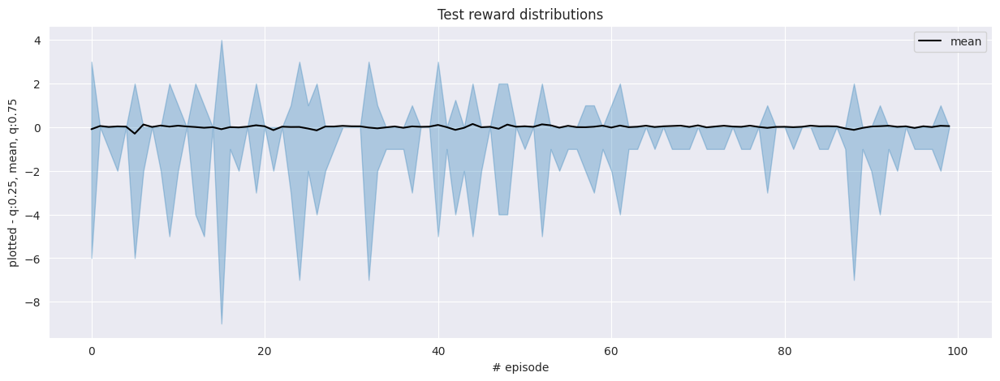

In [62]:
plot_graph(l1_r, 'Test reward distributions')

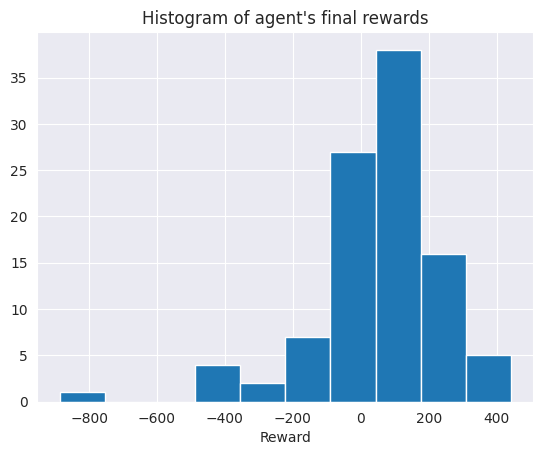

In [63]:
plot_hist(l2_r)

In [64]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

In [123]:
results('reinforce', ['v1', 'v2', 'v3', 'v4'])

v1 mean is 38.83
v2 mean is 20.39
v3 mean is 64.33
v4 mean is 49.18
rd mean is -5.180127240676601
H0: 2 independent samples have identical average values


,categ1,categ2,tstat,pvalue
0,v1,v2,0.501398,0.616651
1,v1,v3,-0.816382,0.415345
2,v1,v4,-0.331984,0.740283
3,v1,rd,1.529974,0.128050
4,v2,v3,-1.342843,0.181050
5,v2,v4,-0.881368,0.379323
6,v2,rd,0.841881,0.401199
7,v3,v4,0.576710,0.564791
8,v3,rd,2.975895,0.003313
9,v4,rd,2.335203,0.020606


# DDQN

In [65]:
agent_str = 'DDQN'

In [66]:
%%capture
!mkdir -p "rl_hse/$agent_str"

## V1

In [17]:
type = 'v1'

- Adam learning rate = 1e-3
- LayerNorm: yes

In [18]:
agent = return_ddqn(1e-3, True)

In [19]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_ddqn)


  0%|          | 0/500 [00:00<?, ?it/s]


  0%|          | 1/500 [00:07<58:43,  7.06s/it]


  0%|          | 2/500 [00:13<57:03,  6.87s/it]


  1%|          | 3/500 [00:20<56:24,  6.81s/it]


  1%|          | 4/500 [00:42<1:46:45, 12.91s/it]


  1%|          | 5/500 [01:12<2:37:51, 19.14s/it]


  1%|          | 6/500 [01:42<3:07:06, 22.73s/it]


  1%|▏         | 7/500 [02:12<3:26:07, 25.09s/it]


  2%|▏         | 8/500 [02:43<3:39:53, 26.82s/it]

[[9970    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  2%|▏         | 9/500 [03:14<3:49:56, 28.10s/it]

[[9969    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
10



  2%|▏         | 10/500 [03:45<3:57:23, 29.07s/it]


  2%|▏         | 11/500 [04:17<4:03:49, 29.92s/it]


  2%|▏         | 12/500 [04:49<4:09:03, 30.62s/it]


  3%|▎         | 13/500 [05:20<4:10:46, 30.90s/it]


  3%|▎         | 14/500 [05:52<4:12:43, 31.20s/it]


  3%|▎         | 15/500 [06:24<4:12:21, 31.22s/it]

[[10047     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



  3%|▎         | 16/500 [06:56<4:14:02, 31.49s/it]


  3%|▎         | 17/500 [07:27<4:12:50, 31.41s/it]

[[10044     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



  4%|▎         | 18/500 [07:59<4:13:09, 31.51s/it]


  4%|▍         | 19/500 [08:30<4:12:28, 31.49s/it]


  4%|▍         | 20/500 [09:03<4:14:29, 31.81s/it]


  4%|▍         | 21/500 [09:35<4:15:25, 31.99s/it]


  4%|▍         | 22/500 [10:08<4:16:03, 32.14s/it]


  5%|▍         | 23/500 [10:40<4:16:16, 32.24s/it]


  5%|▍         | 24/500 [11:13<4:18:34, 32.59s/it]


  5%|▌         | 25/500 [11:46<4:18:55, 32.71s/it]


  5%|▌         | 26/500 [12:19<4:18:46, 32.76s/it]


  5%|▌         | 27/500 [12:52<4:19:06, 32.87s/it]


  6%|▌         | 28/500 [13:25<4:18:02, 32.80s/it]

[[9970    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  6%|▌         | 29/500 [13:58<4:17:07, 32.75s/it]


  6%|▌         | 30/500 [14:32<4:19:48, 33.17s/it]


  6%|▌         | 31/500 [15:06<4:20:41, 33.35s/it]


  6%|▋         | 32/500 [15:39<4:21:02, 33.47s/it]

[[9968    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  7%|▋         | 33/500 [16:14<4:23:46, 33.89s/it]


  7%|▋         | 34/500 [16:48<4:23:34, 33.94s/it]


  7%|▋         | 35/500 [17:23<4:25:01, 34.20s/it]


  7%|▋         | 36/500 [17:58<4:26:07, 34.41s/it]


  7%|▋         | 37/500 [18:33<4:27:03, 34.61s/it]


  8%|▊         | 38/500 [19:09<4:29:58, 35.06s/it]

[[9998    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



  8%|▊         | 39/500 [19:43<4:27:38, 34.83s/it]


  8%|▊         | 40/500 [20:17<4:24:41, 34.53s/it]


  8%|▊         | 41/500 [20:51<4:22:43, 34.34s/it]


  8%|▊         | 42/500 [21:25<4:19:47, 34.03s/it]


  9%|▊         | 43/500 [21:59<4:20:32, 34.21s/it]


  9%|▉         | 44/500 [22:34<4:21:12, 34.37s/it]


  9%|▉         | 45/500 [23:09<4:22:32, 34.62s/it]


  9%|▉         | 46/500 [23:44<4:21:37, 34.57s/it]


  9%|▉         | 47/500 [24:18<4:19:45, 34.40s/it]

[[10010     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 10%|▉         | 48/500 [24:52<4:18:57, 34.37s/it]

[[9994    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 10%|▉         | 49/500 [25:26<4:18:40, 34.41s/it]


 10%|█         | 50/500 [26:02<4:20:19, 34.71s/it]

[[10008     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 10%|█         | 51/500 [26:36<4:19:27, 34.67s/it]


 10%|█         | 52/500 [27:11<4:18:19, 34.60s/it]


 11%|█         | 53/500 [27:46<4:19:23, 34.82s/it]

[[9948    0    0    0    0    0    0    0    0    4    6]
 [  -9    0    0    0    0    0    0    0    0    0    0]]
-9
4



 11%|█         | 54/500 [28:21<4:18:34, 34.79s/it]


 11%|█         | 55/500 [28:56<4:18:01, 34.79s/it]


 11%|█         | 56/500 [29:31<4:18:38, 34.95s/it]


 11%|█▏        | 57/500 [30:06<4:18:21, 34.99s/it]


 12%|█▏        | 58/500 [30:41<4:18:04, 35.03s/it]


 12%|█▏        | 59/500 [31:16<4:17:35, 35.05s/it]


 12%|█▏        | 60/500 [31:51<4:16:31, 34.98s/it]


 12%|█▏        | 61/500 [32:27<4:17:18, 35.17s/it]


 12%|█▏        | 62/500 [33:02<4:17:30, 35.28s/it]


 13%|█▎        | 63/500 [33:38<4:18:28, 35.49s/it]


 13%|█▎        | 64/500 [34:14<4:17:45, 35.47s/it]


 13%|█▎        | 65/500 [34:49<4:17:52, 35.57s/it]

[[10018     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 13%|█▎        | 66/500 [35:26<4:19:12, 35.84s/it]


 13%|█▎        | 67/500 [36:03<4:21:30, 36.24s/it]


 14%|█▎        | 68/500 [36:39<4:20:55, 36.24s/it]


 14%|█▍        | 69/500 [37:15<4:19:47, 36.17s/it]


 14%|█▍        | 70/500 [37:51<4:18:16, 36.04s/it]

[[10017     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 14%|█▍        | 71/500 [38:27<4:16:53, 35.93s/it]

[[9997    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 14%|█▍        | 72/500 [39:03<4:16:08, 35.91s/it]


 15%|█▍        | 73/500 [39:38<4:15:06, 35.85s/it]


 15%|█▍        | 74/500 [40:14<4:13:41, 35.73s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 15%|█▌        | 75/500 [40:49<4:12:45, 35.68s/it]

[[10002     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 15%|█▌        | 76/500 [41:25<4:11:44, 35.62s/it]


 15%|█▌        | 77/500 [42:02<4:14:10, 36.05s/it]


 16%|█▌        | 78/500 [42:41<4:20:37, 37.06s/it]


 16%|█▌        | 79/500 [43:19<4:22:15, 37.38s/it]


 16%|█▌        | 80/500 [44:00<4:27:36, 38.23s/it]

[[9981    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2



 16%|█▌        | 81/500 [44:37<4:24:49, 37.92s/it]


 16%|█▋        | 82/500 [45:13<4:21:25, 37.53s/it]


 17%|█▋        | 83/500 [45:51<4:20:17, 37.45s/it]

[[9972    0    0    0    0    0    0    0    0    0   10]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 17%|█▋        | 84/500 [46:29<4:21:53, 37.77s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 17%|█▋        | 85/500 [47:12<4:32:37, 39.42s/it]


 17%|█▋        | 86/500 [47:55<4:38:38, 40.38s/it]

[[10017     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 17%|█▋        | 87/500 [48:36<4:39:40, 40.63s/it]

[[9982    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 18%|█▊        | 88/500 [49:17<4:39:37, 40.72s/it]


 18%|█▊        | 89/500 [49:58<4:39:10, 40.76s/it]


 18%|█▊        | 90/500 [50:40<4:40:19, 41.02s/it]


 18%|█▊        | 91/500 [51:20<4:37:59, 40.78s/it]


 18%|█▊        | 92/500 [52:00<4:36:02, 40.59s/it]

[[9969    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6



 19%|█▊        | 93/500 [52:38<4:29:13, 39.69s/it]


 19%|█▉        | 94/500 [53:16<4:25:41, 39.27s/it]


 19%|█▉        | 95/500 [53:54<4:23:31, 39.04s/it]


 19%|█▉        | 96/500 [54:32<4:20:02, 38.62s/it]


 19%|█▉        | 97/500 [55:10<4:17:32, 38.34s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1



 20%|█▉        | 98/500 [55:47<4:14:44, 38.02s/it]


 20%|█▉        | 99/500 [56:25<4:13:07, 37.87s/it]


 20%|██        | 100/500 [57:02<4:12:22, 37.86s/it]

[[10012     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 20%|██        | 101/500 [57:40<4:10:38, 37.69s/it]

[[9967    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 20%|██        | 102/500 [58:16<4:08:02, 37.39s/it]


 21%|██        | 103/500 [58:54<4:07:08, 37.35s/it]


 21%|██        | 104/500 [59:31<4:06:18, 37.32s/it]


 21%|██        | 105/500 [1:00:08<4:06:11, 37.39s/it]

[[9991    0    0    0    0    0    0    0    0    3    0]
 [  -9    0    0    0    0    0    0    0    0    0    0]]
-9
6



 21%|██        | 106/500 [1:00:45<4:04:25, 37.22s/it]


 21%|██▏       | 107/500 [1:01:22<4:03:06, 37.12s/it]


 22%|██▏       | 108/500 [1:01:59<4:02:50, 37.17s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 22%|██▏       | 109/500 [1:02:37<4:02:06, 37.15s/it]


 22%|██▏       | 110/500 [1:03:14<4:01:05, 37.09s/it]


 22%|██▏       | 111/500 [1:03:51<4:00:31, 37.10s/it]


 22%|██▏       | 112/500 [1:04:30<4:04:09, 37.76s/it]


 23%|██▎       | 113/500 [1:05:08<4:04:29, 37.91s/it]


 23%|██▎       | 114/500 [1:05:46<4:02:48, 37.74s/it]


 23%|██▎       | 115/500 [1:06:23<4:01:59, 37.71s/it]


 23%|██▎       | 116/500 [1:07:01<4:01:09, 37.68s/it]


 23%|██▎       | 117/500 [1:07:38<4:00:30, 37.68s/it]


 24%|██▎       | 118/500 [1:08:17<4:01:13, 37.89s/it]

[[9957    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 24%|██▍       | 119/500 [1:08:55<4:00:18, 37.84s/it]

[[9970    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 24%|██▍       | 120/500 [1:09:33<4:01:05, 38.07s/it]


 24%|██▍       | 121/500 [1:10:11<4:00:43, 38.11s/it]


 24%|██▍       | 122/500 [1:10:50<4:00:46, 38.22s/it]


 25%|██▍       | 123/500 [1:11:29<4:02:00, 38.52s/it]

[[9969    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 25%|██▍       | 124/500 [1:12:09<4:03:07, 38.80s/it]

[[10023     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 25%|██▌       | 125/500 [1:12:48<4:03:02, 38.89s/it]


 25%|██▌       | 126/500 [1:13:28<4:05:34, 39.40s/it]

[[10022     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 25%|██▌       | 127/500 [1:14:10<4:08:38, 40.00s/it]


 26%|██▌       | 128/500 [1:14:49<4:06:19, 39.73s/it]


 26%|██▌       | 129/500 [1:15:28<4:04:24, 39.53s/it]


 26%|██▌       | 130/500 [1:16:07<4:03:03, 39.41s/it]


 26%|██▌       | 131/500 [1:16:47<4:02:53, 39.50s/it]

[[10001     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 26%|██▋       | 132/500 [1:17:26<4:01:23, 39.36s/it]


 27%|██▋       | 133/500 [1:18:05<4:01:12, 39.44s/it]

[[9992    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 27%|██▋       | 134/500 [1:18:45<4:00:40, 39.46s/it]


 27%|██▋       | 135/500 [1:19:24<3:58:59, 39.29s/it]


 27%|██▋       | 136/500 [1:20:03<3:57:56, 39.22s/it]


 27%|██▋       | 137/500 [1:20:41<3:56:27, 39.08s/it]


 28%|██▊       | 138/500 [1:21:20<3:55:16, 39.00s/it]


 28%|██▊       | 139/500 [1:21:59<3:54:44, 39.02s/it]


 28%|██▊       | 140/500 [1:22:39<3:54:32, 39.09s/it]


 28%|██▊       | 141/500 [1:23:18<3:54:20, 39.16s/it]


 28%|██▊       | 142/500 [1:23:57<3:53:43, 39.17s/it]

[[10010     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 29%|██▊       | 143/500 [1:24:37<3:53:31, 39.25s/it]


 29%|██▉       | 144/500 [1:25:16<3:52:53, 39.25s/it]


 29%|██▉       | 145/500 [1:25:56<3:53:11, 39.41s/it]

[[9967    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 29%|██▉       | 146/500 [1:26:35<3:52:33, 39.42s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 29%|██▉       | 147/500 [1:27:17<3:57:03, 40.29s/it]

[[10040     0     0     0     0     0     0     0     0     2     5]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
4



 30%|██▉       | 148/500 [1:27:58<3:56:25, 40.30s/it]


 30%|██▉       | 149/500 [1:28:38<3:56:13, 40.38s/it]


 30%|███       | 150/500 [1:29:18<3:54:42, 40.23s/it]


 30%|███       | 151/500 [1:29:58<3:53:50, 40.20s/it]


 30%|███       | 152/500 [1:30:40<3:55:07, 40.54s/it]


 31%|███       | 153/500 [1:31:20<3:54:16, 40.51s/it]

[[10014     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 31%|███       | 154/500 [1:32:01<3:54:54, 40.74s/it]

[[9980    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 31%|███       | 155/500 [1:32:42<3:54:17, 40.75s/it]


 31%|███       | 156/500 [1:33:23<3:53:36, 40.74s/it]


 31%|███▏      | 157/500 [1:34:04<3:53:05, 40.77s/it]


 32%|███▏      | 158/500 [1:34:45<3:52:50, 40.85s/it]


 32%|███▏      | 159/500 [1:35:25<3:51:18, 40.70s/it]


 32%|███▏      | 160/500 [1:36:06<3:51:09, 40.79s/it]


 32%|███▏      | 161/500 [1:36:47<3:51:01, 40.89s/it]

[[9998    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3



 32%|███▏      | 162/500 [1:37:28<3:50:32, 40.92s/it]


 33%|███▎      | 163/500 [1:38:09<3:50:02, 40.96s/it]


 33%|███▎      | 164/500 [1:38:50<3:49:33, 40.99s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1



 33%|███▎      | 165/500 [1:39:31<3:48:46, 40.97s/it]


 33%|███▎      | 166/500 [1:40:12<3:48:09, 40.99s/it]


 33%|███▎      | 167/500 [1:40:53<3:46:36, 40.83s/it]


 34%|███▎      | 168/500 [1:41:33<3:45:49, 40.81s/it]


 34%|███▍      | 169/500 [1:42:16<3:47:49, 41.30s/it]


 34%|███▍      | 170/500 [1:42:59<3:50:35, 41.93s/it]

[[9989    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 34%|███▍      | 171/500 [1:43:42<3:50:42, 42.08s/it]


 34%|███▍      | 172/500 [1:44:22<3:47:46, 41.67s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -12]]
0
-1



 35%|███▍      | 173/500 [1:45:03<3:45:51, 41.44s/it]


 35%|███▍      | 174/500 [1:45:44<3:43:46, 41.19s/it]


 35%|███▌      | 175/500 [1:46:24<3:41:45, 40.94s/it]


 35%|███▌      | 176/500 [1:47:05<3:40:43, 40.87s/it]


 35%|███▌      | 177/500 [1:47:46<3:40:20, 40.93s/it]


 36%|███▌      | 178/500 [1:48:27<3:39:23, 40.88s/it]


 36%|███▌      | 179/500 [1:49:08<3:39:26, 41.02s/it]


 36%|███▌      | 180/500 [1:49:50<3:39:32, 41.16s/it]


 36%|███▌      | 181/500 [1:50:31<3:39:14, 41.24s/it]


 36%|███▋      | 182/500 [1:51:12<3:38:43, 41.27s/it]


 37%|███▋      | 183/500 [1:51:54<3:38:43, 41.40s/it]


 37%|███▋      | 184/500 [1:52:36<3:38:01, 41.40s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 37%|███▋      | 185/500 [1:53:17<3:37:15, 41.38s/it]


 37%|███▋      | 186/500 [1:53:58<3:36:13, 41.32s/it]


 37%|███▋      | 187/500 [1:54:39<3:35:37, 41.34s/it]


 38%|███▊      | 188/500 [1:55:20<3:34:29, 41.25s/it]

[[9936    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 38%|███▊      | 189/500 [1:56:01<3:33:20, 41.16s/it]


 38%|███▊      | 190/500 [1:56:46<3:38:31, 42.30s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 38%|███▊      | 191/500 [1:57:28<3:36:20, 42.01s/it]


 38%|███▊      | 192/500 [1:58:10<3:35:36, 42.00s/it]

[[10047     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 39%|███▊      | 193/500 [1:58:51<3:33:15, 41.68s/it]


 39%|███▉      | 194/500 [1:59:32<3:31:57, 41.56s/it]

[[10022     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 39%|███▉      | 195/500 [2:00:13<3:30:52, 41.48s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 39%|███▉      | 196/500 [2:00:55<3:30:00, 41.45s/it]


 39%|███▉      | 197/500 [2:01:36<3:29:13, 41.43s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 40%|███▉      | 198/500 [2:02:18<3:28:51, 41.49s/it]


 40%|███▉      | 199/500 [2:03:00<3:28:57, 41.65s/it]


 40%|████      | 200/500 [2:03:41<3:27:48, 41.56s/it]


 40%|████      | 201/500 [2:04:23<3:28:08, 41.77s/it]


 40%|████      | 202/500 [2:05:05<3:27:24, 41.76s/it]


 41%|████      | 203/500 [2:05:47<3:26:55, 41.80s/it]

[[10010     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1



 41%|████      | 204/500 [2:06:30<3:28:00, 42.16s/it]


 41%|████      | 205/500 [2:07:12<3:27:56, 42.29s/it]


 41%|████      | 206/500 [2:07:55<3:27:25, 42.33s/it]


 41%|████▏     | 207/500 [2:08:38<3:27:51, 42.56s/it]


 42%|████▏     | 208/500 [2:09:21<3:27:27, 42.63s/it]

[[10010     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 42%|████▏     | 209/500 [2:10:03<3:26:52, 42.66s/it]


 42%|████▏     | 210/500 [2:10:45<3:25:09, 42.45s/it]


 42%|████▏     | 211/500 [2:11:28<3:24:52, 42.53s/it]

[[10044     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 42%|████▏     | 212/500 [2:12:11<3:24:38, 42.63s/it]


 43%|████▎     | 213/500 [2:12:55<3:26:04, 43.08s/it]

[[10000     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 43%|████▎     | 214/500 [2:13:38<3:25:15, 43.06s/it]


 43%|████▎     | 215/500 [2:14:22<3:24:54, 43.14s/it]


 43%|████▎     | 216/500 [2:15:04<3:23:57, 43.09s/it]

[[10002     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7
[[10002     0     1     2     1     1     1     1     1     1     1]
 [   -2     0     0     0     0     0     0     0     0     0     0]]
-2
1



 43%|████▎     | 217/500 [2:15:48<3:23:16, 43.10s/it]


 44%|████▎     | 218/500 [2:16:32<3:24:13, 43.45s/it]

[[10015     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 44%|████▍     | 219/500 [2:17:16<3:24:00, 43.56s/it]


 44%|████▍     | 220/500 [2:17:59<3:22:26, 43.38s/it]


 44%|████▍     | 221/500 [2:18:42<3:22:01, 43.45s/it]

[[10025     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5



 44%|████▍     | 222/500 [2:19:26<3:21:41, 43.53s/it]


 45%|████▍     | 223/500 [2:20:09<3:20:16, 43.38s/it]


 45%|████▍     | 224/500 [2:20:52<3:18:55, 43.25s/it]

[[9975    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 45%|████▌     | 225/500 [2:21:36<3:18:39, 43.34s/it]


 45%|████▌     | 226/500 [2:22:19<3:17:42, 43.29s/it]


 45%|████▌     | 227/500 [2:23:02<3:17:13, 43.35s/it]

[[9955    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4



 46%|████▌     | 228/500 [2:23:46<3:17:00, 43.46s/it]


 46%|████▌     | 229/500 [2:24:29<3:15:47, 43.35s/it]


 46%|████▌     | 230/500 [2:25:12<3:15:03, 43.35s/it]

[[10026     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6



 46%|████▌     | 231/500 [2:25:56<3:15:27, 43.60s/it]


 46%|████▋     | 232/500 [2:26:40<3:14:28, 43.54s/it]


 47%|████▋     | 233/500 [2:27:24<3:14:13, 43.65s/it]


 47%|████▋     | 234/500 [2:28:08<3:14:14, 43.81s/it]


 47%|████▋     | 235/500 [2:28:52<3:13:57, 43.92s/it]


 47%|████▋     | 236/500 [2:29:36<3:13:41, 44.02s/it]

[[10018     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 47%|████▋     | 237/500 [2:30:20<3:12:48, 43.99s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2



 48%|████▊     | 238/500 [2:31:05<3:12:32, 44.09s/it]

[[9963    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 48%|████▊     | 239/500 [2:31:49<3:12:14, 44.19s/it]


 48%|████▊     | 240/500 [2:32:33<3:10:33, 43.97s/it]


 48%|████▊     | 241/500 [2:33:17<3:10:39, 44.17s/it]

[[9972    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 48%|████▊     | 242/500 [2:34:02<3:11:10, 44.46s/it]


 49%|████▊     | 243/500 [2:34:50<3:13:56, 45.28s/it]


 49%|████▉     | 244/500 [2:35:35<3:13:19, 45.31s/it]


 49%|████▉     | 245/500 [2:36:19<3:11:34, 45.07s/it]


 49%|████▉     | 246/500 [2:37:05<3:11:04, 45.14s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 49%|████▉     | 247/500 [2:37:49<3:09:35, 44.96s/it]


 50%|████▉     | 248/500 [2:38:34<3:08:09, 44.80s/it]

[[10008     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 50%|████▉     | 249/500 [2:39:19<3:08:08, 44.97s/it]


 50%|█████     | 250/500 [2:40:04<3:07:03, 44.90s/it]


 50%|█████     | 251/500 [2:40:49<3:06:24, 44.92s/it]


 50%|█████     | 252/500 [2:41:34<3:06:32, 45.13s/it]


 51%|█████     | 253/500 [2:42:19<3:05:27, 45.05s/it]


 51%|█████     | 254/500 [2:43:05<3:05:26, 45.23s/it]

[[9995    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1



 51%|█████     | 255/500 [2:43:50<3:05:00, 45.31s/it]


 51%|█████     | 256/500 [2:44:36<3:04:22, 45.34s/it]


 51%|█████▏    | 257/500 [2:45:22<3:05:04, 45.70s/it]


 52%|█████▏    | 258/500 [2:46:08<3:04:27, 45.73s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 52%|█████▏    | 259/500 [2:46:54<3:03:49, 45.76s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 52%|█████▏    | 260/500 [2:47:39<3:02:32, 45.64s/it]


 52%|█████▏    | 261/500 [2:48:25<3:02:20, 45.78s/it]


 52%|█████▏    | 262/500 [2:49:11<3:00:59, 45.63s/it]


 53%|█████▎    | 263/500 [2:49:56<3:00:24, 45.68s/it]


 53%|█████▎    | 264/500 [2:50:43<3:00:20, 45.85s/it]

[[9978    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 53%|█████▎    | 265/500 [2:51:29<2:59:36, 45.86s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3



 53%|█████▎    | 266/500 [2:52:14<2:58:31, 45.78s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 53%|█████▎    | 267/500 [2:53:01<2:58:50, 46.05s/it]

[[9967    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5



 54%|█████▎    | 268/500 [2:53:47<2:58:18, 46.12s/it]


 54%|█████▍    | 269/500 [2:54:33<2:56:50, 45.93s/it]


 54%|█████▍    | 270/500 [2:55:18<2:55:53, 45.89s/it]


 54%|█████▍    | 271/500 [2:56:05<2:55:52, 46.08s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 54%|█████▍    | 272/500 [2:56:52<2:56:17, 46.39s/it]

[[10028     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 55%|█████▍    | 273/500 [2:57:38<2:54:51, 46.22s/it]


 55%|█████▍    | 274/500 [2:58:24<2:53:42, 46.12s/it]


 55%|█████▌    | 275/500 [2:59:11<2:53:56, 46.38s/it]


 55%|█████▌    | 276/500 [2:59:57<2:53:00, 46.34s/it]


 55%|█████▌    | 277/500 [3:00:44<2:52:42, 46.47s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 56%|█████▌    | 278/500 [3:01:31<2:52:35, 46.65s/it]

[[9971    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 56%|█████▌    | 279/500 [3:02:18<2:52:22, 46.80s/it]


 56%|█████▌    | 280/500 [3:03:05<2:51:48, 46.85s/it]


 56%|█████▌    | 281/500 [3:03:52<2:51:11, 46.90s/it]


 56%|█████▋    | 282/500 [3:04:39<2:50:33, 46.94s/it]


 57%|█████▋    | 283/500 [3:05:26<2:49:54, 46.98s/it]


 57%|█████▋    | 284/500 [3:06:14<2:50:01, 47.23s/it]

[[9971    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 57%|█████▋    | 285/500 [3:07:02<2:49:39, 47.35s/it]


 57%|█████▋    | 286/500 [3:07:49<2:48:47, 47.32s/it]

[[9961    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 57%|█████▋    | 287/500 [3:08:35<2:47:18, 47.13s/it]


 58%|█████▊    | 288/500 [3:09:23<2:46:58, 47.26s/it]


 58%|█████▊    | 289/500 [3:10:10<2:46:23, 47.31s/it]

[[10000     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 58%|█████▊    | 290/500 [3:10:58<2:45:48, 47.37s/it]

[[9956    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 58%|█████▊    | 291/500 [3:11:45<2:44:43, 47.29s/it]


 58%|█████▊    | 292/500 [3:12:33<2:44:28, 47.45s/it]

[[10027     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 59%|█████▊    | 293/500 [3:13:21<2:44:17, 47.62s/it]

[[9936    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 59%|█████▉    | 294/500 [3:14:09<2:44:17, 47.85s/it]


 59%|█████▉    | 295/500 [3:14:57<2:43:28, 47.85s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1



 59%|█████▉    | 296/500 [3:15:45<2:42:51, 47.90s/it]


 59%|█████▉    | 297/500 [3:16:34<2:42:31, 48.04s/it]

[[9966    0    0    0    0    0    0    0    0    0   10]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 60%|█████▉    | 298/500 [3:17:21<2:41:24, 47.94s/it]


 60%|█████▉    | 299/500 [3:18:09<2:40:25, 47.89s/it]


 60%|██████    | 300/500 [3:18:57<2:39:33, 47.87s/it]


 60%|██████    | 301/500 [3:19:44<2:38:29, 47.79s/it]


 60%|██████    | 302/500 [3:20:32<2:37:54, 47.85s/it]


 61%|██████    | 303/500 [3:21:21<2:37:50, 48.07s/it]


 61%|██████    | 304/500 [3:22:09<2:37:24, 48.19s/it]

[[9970    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 61%|██████    | 305/500 [3:22:58<2:37:02, 48.32s/it]

[[10037     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 61%|██████    | 306/500 [3:23:47<2:36:57, 48.54s/it]


 61%|██████▏   | 307/500 [3:24:36<2:36:30, 48.66s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 62%|██████▏   | 308/500 [3:25:25<2:35:39, 48.64s/it]


 62%|██████▏   | 309/500 [3:26:14<2:35:09, 48.74s/it]

[[9917    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 62%|██████▏   | 310/500 [3:27:06<2:37:45, 49.82s/it]

[[10034     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1



 62%|██████▏   | 311/500 [3:27:55<2:35:50, 49.47s/it]


 62%|██████▏   | 312/500 [3:28:44<2:34:56, 49.45s/it]


 63%|██████▎   | 313/500 [3:29:34<2:34:23, 49.54s/it]

[[10006     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 63%|██████▎   | 314/500 [3:30:24<2:33:43, 49.59s/it]


 63%|██████▎   | 315/500 [3:31:13<2:32:51, 49.58s/it]

[[10016     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 63%|██████▎   | 316/500 [3:32:03<2:31:57, 49.55s/it]

[[9979    0    0    0    0    0    0    0    0    0   12]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 63%|██████▎   | 317/500 [3:32:52<2:31:11, 49.57s/it]

[[9948    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 64%|██████▎   | 318/500 [3:33:41<2:29:43, 49.36s/it]

[[10037     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -10]]
0
-1



 64%|██████▍   | 319/500 [3:34:30<2:28:29, 49.22s/it]

[[10022     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 64%|██████▍   | 320/500 [3:35:19<2:27:30, 49.17s/it]


 64%|██████▍   | 321/500 [3:36:09<2:27:26, 49.42s/it]


 64%|██████▍   | 322/500 [3:36:58<2:26:06, 49.25s/it]


 65%|██████▍   | 323/500 [3:37:47<2:24:59, 49.15s/it]


 65%|██████▍   | 324/500 [3:38:36<2:24:06, 49.13s/it]


 65%|██████▌   | 325/500 [3:39:26<2:23:54, 49.34s/it]


 65%|██████▌   | 326/500 [3:40:15<2:23:19, 49.42s/it]


 65%|██████▌   | 327/500 [3:41:05<2:22:36, 49.46s/it]


 66%|██████▌   | 328/500 [3:41:56<2:22:59, 49.88s/it]


 66%|██████▌   | 329/500 [3:42:47<2:23:09, 50.23s/it]


 66%|██████▌   | 330/500 [3:43:38<2:22:52, 50.43s/it]


 66%|██████▌   | 331/500 [3:44:27<2:21:15, 50.15s/it]


 66%|██████▋   | 332/500 [3:45:18<2:20:44, 50.26s/it]


 67%|██████▋   | 333/500 [3:46:08<2:19:39, 50.18s/it]

[[9976    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 67%|██████▋   | 334/500 [3:46:58<2:19:14, 50.33s/it]

[[10018     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 67%|██████▋   | 335/500 [3:47:49<2:18:27, 50.35s/it]


 67%|██████▋   | 336/500 [3:48:39<2:17:32, 50.32s/it]

[[10010     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6



 67%|██████▋   | 337/500 [3:49:30<2:17:20, 50.55s/it]


 68%|██████▊   | 338/500 [3:50:20<2:16:05, 50.41s/it]


 68%|██████▊   | 339/500 [3:51:12<2:16:09, 50.74s/it]


 68%|██████▊   | 340/500 [3:52:02<2:15:10, 50.69s/it]


 68%|██████▊   | 341/500 [3:52:53<2:14:09, 50.63s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1



 68%|██████▊   | 342/500 [3:53:44<2:13:31, 50.71s/it]


 69%|██████▊   | 343/500 [3:54:34<2:12:18, 50.57s/it]


 69%|██████▉   | 344/500 [3:55:25<2:11:43, 50.66s/it]


 69%|██████▉   | 345/500 [3:56:15<2:10:47, 50.63s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1



 69%|██████▉   | 346/500 [3:57:06<2:09:57, 50.63s/it]


 69%|██████▉   | 347/500 [3:57:57<2:09:19, 50.72s/it]


 70%|██████▉   | 348/500 [3:58:48<2:08:52, 50.87s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 70%|██████▉   | 349/500 [3:59:39<2:08:00, 50.86s/it]


 70%|███████   | 350/500 [4:00:30<2:06:59, 50.80s/it]


 70%|███████   | 351/500 [4:01:21<2:06:19, 50.87s/it]


 70%|███████   | 352/500 [4:02:12<2:05:34, 50.91s/it]


 71%|███████   | 353/500 [4:03:03<2:04:58, 51.01s/it]

[[9978    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 71%|███████   | 354/500 [4:03:54<2:04:31, 51.18s/it]


 71%|███████   | 355/500 [4:04:45<2:03:23, 51.06s/it]


 71%|███████   | 356/500 [4:05:37<2:02:57, 51.23s/it]


 71%|███████▏  | 357/500 [4:06:27<2:01:38, 51.04s/it]


 72%|███████▏  | 358/500 [4:07:19<2:01:14, 51.23s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-7



 72%|███████▏  | 359/500 [4:08:10<2:00:13, 51.16s/it]


 72%|███████▏  | 360/500 [4:09:01<1:59:14, 51.10s/it]

[[10016     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 72%|███████▏  | 361/500 [4:09:52<1:58:20, 51.08s/it]


 72%|███████▏  | 362/500 [4:10:42<1:56:57, 50.85s/it]


 73%|███████▎  | 363/500 [4:11:33<1:55:59, 50.80s/it]


 73%|███████▎  | 364/500 [4:12:24<1:55:12, 50.82s/it]


 73%|███████▎  | 365/500 [4:13:15<1:54:26, 50.87s/it]


 73%|███████▎  | 366/500 [4:14:07<1:54:15, 51.16s/it]


 73%|███████▎  | 367/500 [4:14:58<1:53:11, 51.07s/it]


 74%|███████▎  | 368/500 [4:15:49<1:52:24, 51.09s/it]


 74%|███████▍  | 369/500 [4:16:40<1:51:31, 51.08s/it]


 74%|███████▍  | 370/500 [4:17:31<1:50:39, 51.07s/it]


 74%|███████▍  | 371/500 [4:18:21<1:49:25, 50.89s/it]


 74%|███████▍  | 372/500 [4:19:12<1:48:38, 50.92s/it]


 75%|███████▍  | 373/500 [4:20:03<1:47:49, 50.94s/it]


 75%|███████▍  | 374/500 [4:20:55<1:47:08, 51.02s/it]


 75%|███████▌  | 375/500 [4:21:45<1:46:07, 50.94s/it]


 75%|███████▌  | 376/500 [4:22:35<1:44:42, 50.66s/it]


 75%|███████▌  | 377/500 [4:23:25<1:43:33, 50.52s/it]


 76%|███████▌  | 378/500 [4:24:16<1:42:46, 50.54s/it]


 76%|███████▌  | 379/500 [4:25:07<1:42:09, 50.66s/it]


 76%|███████▌  | 380/500 [4:25:58<1:41:16, 50.64s/it]


 76%|███████▌  | 381/500 [4:26:48<1:40:33, 50.70s/it]

[[9962    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
13



 76%|███████▋  | 382/500 [4:27:39<1:39:44, 50.72s/it]


 77%|███████▋  | 383/500 [4:28:30<1:38:40, 50.60s/it]


 77%|███████▋  | 384/500 [4:29:20<1:37:55, 50.65s/it]


 77%|███████▋  | 385/500 [4:30:12<1:37:28, 50.85s/it]


 77%|███████▋  | 386/500 [4:31:02<1:36:31, 50.80s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 77%|███████▋  | 387/500 [4:31:53<1:35:42, 50.82s/it]


 78%|███████▊  | 388/500 [4:32:44<1:34:50, 50.81s/it]


 78%|███████▊  | 389/500 [4:33:35<1:34:07, 50.88s/it]


 78%|███████▊  | 390/500 [4:34:26<1:33:14, 50.86s/it]

[[9967    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 78%|███████▊  | 391/500 [4:35:17<1:32:45, 51.06s/it]


 78%|███████▊  | 392/500 [4:36:08<1:31:50, 51.02s/it]


 79%|███████▊  | 393/500 [4:36:59<1:30:58, 51.01s/it]

[[9994    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 79%|███████▉  | 394/500 [4:37:50<1:30:08, 51.02s/it]


 79%|███████▉  | 395/500 [4:38:42<1:29:33, 51.18s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 79%|███████▉  | 396/500 [4:39:32<1:28:11, 50.88s/it]


 79%|███████▉  | 397/500 [4:40:23<1:27:22, 50.90s/it]

[[9971    0    0    0    0    0    0    0    3   12    6]
 [  -8    0    0    0    0    0    0    0    0    0    0]]
-8
1



 80%|███████▉  | 398/500 [4:41:14<1:26:30, 50.89s/it]


 80%|███████▉  | 399/500 [4:42:05<1:25:48, 50.98s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 80%|████████  | 400/500 [4:42:56<1:24:56, 50.97s/it]


 80%|████████  | 401/500 [4:43:47<1:24:00, 50.92s/it]


 80%|████████  | 402/500 [4:44:38<1:23:09, 50.91s/it]


 81%|████████  | 403/500 [4:45:28<1:22:15, 50.89s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 81%|████████  | 404/500 [4:46:20<1:21:53, 51.18s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 81%|████████  | 405/500 [4:47:11<1:20:57, 51.14s/it]


 81%|████████  | 406/500 [4:48:02<1:20:03, 51.10s/it]


 81%|████████▏ | 407/500 [4:48:53<1:18:57, 50.94s/it]


 82%|████████▏ | 408/500 [4:49:43<1:17:52, 50.79s/it]


 82%|████████▏ | 409/500 [4:50:35<1:17:15, 50.94s/it]

[[9978    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 82%|████████▏ | 410/500 [4:51:26<1:16:45, 51.17s/it]

[[10062     0     0     0     0     0     0     0     0     3     2]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
9



 82%|████████▏ | 411/500 [4:52:17<1:15:36, 50.97s/it]


 82%|████████▏ | 412/500 [4:53:07<1:14:35, 50.86s/it]

[[10000     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 83%|████████▎ | 413/500 [4:53:58<1:13:42, 50.83s/it]

[[10009     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1



 83%|████████▎ | 414/500 [4:54:50<1:13:02, 50.96s/it]

[[9990    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
8



 83%|████████▎ | 415/500 [4:55:40<1:11:59, 50.82s/it]


 83%|████████▎ | 416/500 [4:56:31<1:11:03, 50.76s/it]


 83%|████████▎ | 417/500 [4:57:22<1:10:16, 50.81s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 84%|████████▎ | 418/500 [4:58:12<1:09:26, 50.81s/it]


 84%|████████▍ | 419/500 [4:59:03<1:08:31, 50.76s/it]


 84%|████████▍ | 420/500 [4:59:54<1:07:40, 50.76s/it]


 84%|████████▍ | 421/500 [5:00:45<1:06:52, 50.79s/it]

[[10007     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 84%|████████▍ | 422/500 [5:01:36<1:06:11, 50.92s/it]


 85%|████████▍ | 423/500 [5:02:27<1:05:26, 50.99s/it]


 85%|████████▍ | 424/500 [5:03:17<1:04:20, 50.80s/it]


 85%|████████▌ | 425/500 [5:04:08<1:03:27, 50.76s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 85%|████████▌ | 426/500 [5:05:00<1:02:54, 51.00s/it]

[[10040     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 85%|████████▌ | 427/500 [5:05:51<1:02:08, 51.08s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 86%|████████▌ | 428/500 [5:06:42<1:01:20, 51.11s/it]


 86%|████████▌ | 429/500 [5:07:33<1:00:27, 51.10s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2



 86%|████████▌ | 430/500 [5:08:24<59:30, 51.01s/it]  


 86%|████████▌ | 431/500 [5:09:16<58:52, 51.20s/it]


 86%|████████▋ | 432/500 [5:10:07<58:05, 51.26s/it]

[[10016     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 87%|████████▋ | 433/500 [5:10:59<57:26, 51.44s/it]


 87%|████████▋ | 434/500 [5:11:50<56:27, 51.33s/it]


 87%|████████▋ | 435/500 [5:12:41<55:31, 51.26s/it]


 87%|████████▋ | 436/500 [5:13:32<54:38, 51.23s/it]


 87%|████████▋ | 437/500 [5:14:23<53:39, 51.10s/it]

[[9989    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 88%|████████▊ | 438/500 [5:15:15<52:57, 51.24s/it]


 88%|████████▊ | 439/500 [5:16:05<51:58, 51.13s/it]

[[9980    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 88%|████████▊ | 440/500 [5:16:57<51:19, 51.32s/it]

[[9980    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 88%|████████▊ | 441/500 [5:17:48<50:27, 51.32s/it]


 88%|████████▊ | 442/500 [5:18:39<49:31, 51.23s/it]


 89%|████████▊ | 443/500 [5:19:30<48:36, 51.16s/it]


 89%|████████▉ | 444/500 [5:20:21<47:37, 51.03s/it]

[[10003     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1



 89%|████████▉ | 445/500 [5:21:13<46:52, 51.14s/it]


 89%|████████▉ | 446/500 [5:22:04<46:08, 51.26s/it]


 89%|████████▉ | 447/500 [5:22:56<45:22, 51.38s/it]


 90%|████████▉ | 448/500 [5:23:48<44:41, 51.57s/it]


 90%|████████▉ | 449/500 [5:24:39<43:40, 51.37s/it]


 90%|█████████ | 450/500 [5:25:29<42:35, 51.12s/it]

[[9995    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4



 90%|█████████ | 451/500 [5:26:21<41:47, 51.17s/it]


 90%|█████████ | 452/500 [5:27:12<40:58, 51.22s/it]


 91%|█████████ | 453/500 [5:28:03<40:04, 51.16s/it]


 91%|█████████ | 454/500 [5:28:54<39:09, 51.07s/it]


 91%|█████████ | 455/500 [5:29:44<38:09, 50.88s/it]

[[9984    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 91%|█████████ | 456/500 [5:30:35<37:21, 50.94s/it]


 91%|█████████▏| 457/500 [5:31:26<36:28, 50.89s/it]


 92%|█████████▏| 458/500 [5:32:18<35:45, 51.08s/it]


 92%|█████████▏| 459/500 [5:33:09<35:01, 51.26s/it]

[[10017     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7



 92%|█████████▏| 460/500 [5:34:00<34:05, 51.14s/it]


 92%|█████████▏| 461/500 [5:34:52<33:24, 51.39s/it]

[[9992    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 92%|█████████▏| 462/500 [5:35:43<32:28, 51.27s/it]


 93%|█████████▎| 463/500 [5:36:34<31:30, 51.10s/it]


 93%|█████████▎| 464/500 [5:37:25<30:37, 51.03s/it]


 93%|█████████▎| 465/500 [5:38:16<29:49, 51.13s/it]


 93%|█████████▎| 466/500 [5:39:07<28:53, 51.00s/it]


 93%|█████████▎| 467/500 [5:39:58<28:07, 51.15s/it]

[[10014     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 94%|█████████▎| 468/500 [5:40:49<27:17, 51.19s/it]


 94%|█████████▍| 469/500 [5:41:41<26:26, 51.18s/it]


 94%|█████████▍| 470/500 [5:42:32<25:37, 51.26s/it]


 94%|█████████▍| 471/500 [5:43:24<24:54, 51.53s/it]


 94%|█████████▍| 472/500 [5:44:15<23:56, 51.31s/it]

[[10049     0     0     0     0     0     0     0     0     3     3]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
3



 95%|█████████▍| 473/500 [5:45:06<23:01, 51.17s/it]


 95%|█████████▍| 474/500 [5:45:57<22:09, 51.14s/it]


 95%|█████████▌| 475/500 [5:46:48<21:16, 51.06s/it]


 95%|█████████▌| 476/500 [5:47:39<20:25, 51.07s/it]


 95%|█████████▌| 477/500 [5:48:30<19:34, 51.06s/it]


 96%|█████████▌| 478/500 [5:49:22<18:49, 51.34s/it]


 96%|█████████▌| 479/500 [5:50:13<17:56, 51.24s/it]


 96%|█████████▌| 480/500 [5:51:04<17:00, 51.05s/it]


 96%|█████████▌| 481/500 [5:51:54<16:07, 50.91s/it]


 96%|█████████▋| 482/500 [5:52:45<15:13, 50.75s/it]


 97%|█████████▋| 483/500 [5:53:35<14:23, 50.79s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-3



 97%|█████████▋| 484/500 [5:54:27<13:36, 51.04s/it]

[[10046     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6



 97%|█████████▋| 485/500 [5:55:18<12:47, 51.14s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1



 97%|█████████▋| 486/500 [5:56:10<11:57, 51.26s/it]


 97%|█████████▋| 487/500 [5:57:01<11:05, 51.19s/it]


 98%|█████████▊| 488/500 [5:57:52<10:13, 51.14s/it]


 98%|█████████▊| 489/500 [5:58:43<09:21, 51.05s/it]

[[10024     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 98%|█████████▊| 490/500 [5:59:34<08:29, 50.98s/it]


 98%|█████████▊| 491/500 [6:00:25<07:39, 51.01s/it]


 98%|█████████▊| 492/500 [6:01:15<06:47, 50.94s/it]


 99%|█████████▊| 493/500 [6:02:07<05:56, 50.98s/it]


 99%|█████████▉| 494/500 [6:02:58<05:06, 51.04s/it]


 99%|█████████▉| 495/500 [6:03:48<04:14, 50.80s/it]


 99%|█████████▉| 496/500 [6:04:40<03:24, 51.05s/it]


 99%|█████████▉| 497/500 [6:05:30<02:32, 50.99s/it]


100%|█████████▉| 498/500 [6:06:21<01:41, 50.75s/it]

[[10051     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



100%|█████████▉| 499/500 [6:07:11<00:50, 50.56s/it]


100%|██████████| 500/500 [6:08:02<00:00, 50.65s/it]


100%|██████████| 500/500 [6:08:02<00:00, 44.16s/it]

[[9976    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
done


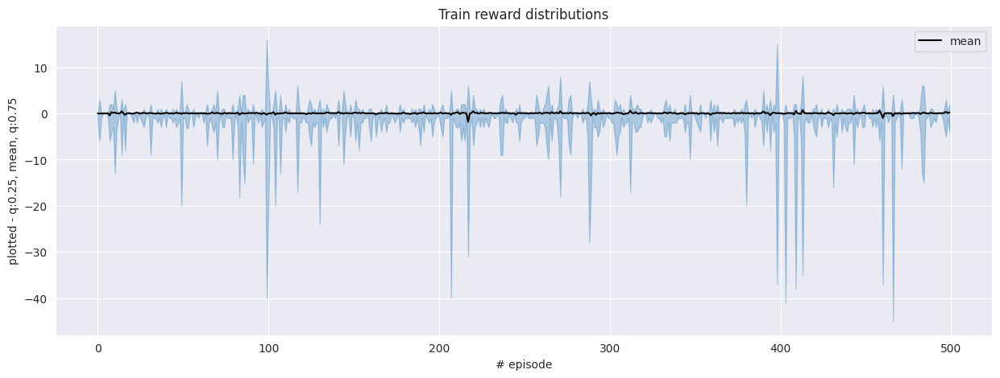

In [20]:
plot_graph(r3_list, 'Train reward distributions', skip = True)

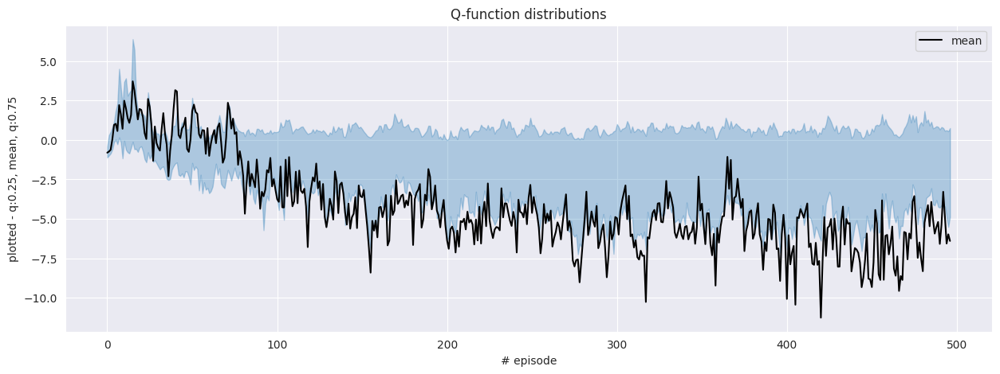

In [21]:
plot_graph(r1_list, 'Q-function distributions', skip = True)

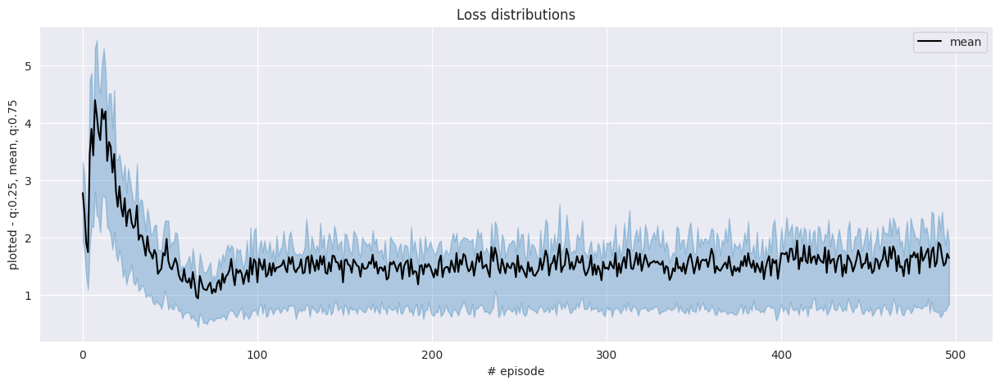

In [22]:
plot_graph(r2_list, 'Loss distributions', skip = True)

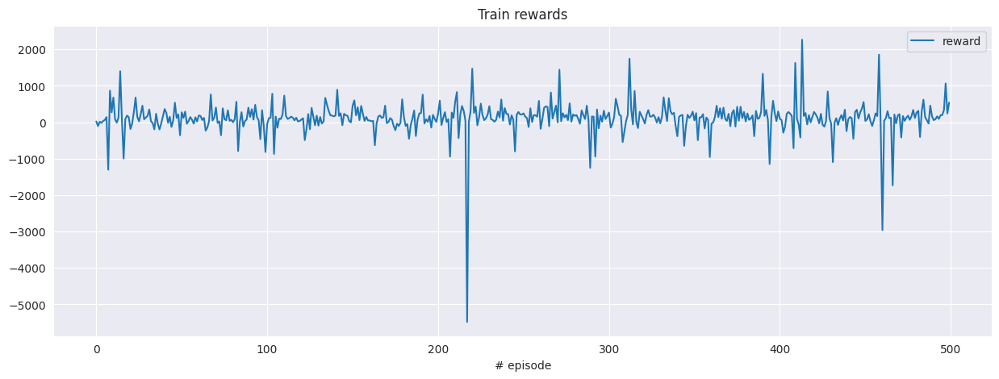

In [23]:
plot_rs(r4_list, 'Train rewards')

In [24]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [25]:
l1_r, l2_r = [], []

test_agent(agent, env)


  0%|          | 0/100 [00:00<?, ?it/s]


  1%|          | 1/100 [00:06<10:23,  6.30s/it]

[[10070     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7



  2%|▏         | 2/100 [00:13<10:54,  6.68s/it]

[[10022     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



  3%|▎         | 3/100 [00:19<10:35,  6.55s/it]

[[9879    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-4



  4%|▍         | 4/100 [00:26<10:35,  6.62s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1



  5%|▌         | 5/100 [00:32<10:24,  6.58s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



  6%|▌         | 6/100 [00:39<10:15,  6.55s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



  7%|▋         | 7/100 [00:46<10:16,  6.63s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1



  8%|▊         | 8/100 [00:52<10:11,  6.65s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



  9%|▉         | 9/100 [00:59<09:56,  6.56s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 10%|█         | 10/100 [01:05<09:43,  6.48s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1



 11%|█         | 11/100 [01:11<09:27,  6.38s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 12%|█▏        | 12/100 [01:17<09:11,  6.27s/it]


 13%|█▎        | 13/100 [01:24<09:06,  6.28s/it]

[[9883    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-8



 14%|█▍        | 14/100 [01:30<08:59,  6.27s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 15%|█▌        | 15/100 [01:36<08:50,  6.24s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 16%|█▌        | 16/100 [01:42<08:49,  6.30s/it]

[[10071     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
15



 17%|█▋        | 17/100 [01:48<08:37,  6.23s/it]

[[9889    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 18%|█▊        | 18/100 [01:55<08:40,  6.34s/it]

[[9869    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 19%|█▉        | 19/100 [02:01<08:32,  6.33s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 20%|██        | 20/100 [02:08<08:24,  6.30s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2



 21%|██        | 21/100 [02:14<08:31,  6.47s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 22%|██▏       | 22/100 [02:21<08:20,  6.41s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-6



 23%|██▎       | 23/100 [02:28<08:22,  6.53s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 24%|██▍       | 24/100 [02:33<08:03,  6.37s/it]


 25%|██▌       | 25/100 [02:40<08:07,  6.50s/it]

[[10058     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 26%|██▌       | 26/100 [02:47<07:57,  6.46s/it]

[[9905    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 27%|██▋       | 27/100 [02:53<07:55,  6.52s/it]

[[10024     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 28%|██▊       | 28/100 [03:00<07:46,  6.48s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 29%|██▉       | 29/100 [03:06<07:28,  6.32s/it]


 30%|███       | 30/100 [03:12<07:30,  6.43s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4



 31%|███       | 31/100 [03:19<07:25,  6.46s/it]

[[10099     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 32%|███▏      | 32/100 [03:25<07:18,  6.44s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2



 33%|███▎      | 33/100 [03:31<07:04,  6.33s/it]

[[10040     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 34%|███▍      | 34/100 [03:38<06:59,  6.36s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4



 35%|███▌      | 35/100 [03:44<06:57,  6.43s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 36%|███▌      | 36/100 [03:51<06:57,  6.52s/it]

[[10061     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 37%|███▋      | 37/100 [03:58<06:51,  6.53s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 38%|███▊      | 38/100 [04:04<06:37,  6.41s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-3



 39%|███▉      | 39/100 [04:10<06:22,  6.28s/it]


 40%|████      | 40/100 [04:17<06:25,  6.42s/it]

[[10056     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 41%|████      | 41/100 [04:23<06:14,  6.34s/it]

[[10010     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5



 42%|████▏     | 42/100 [04:29<06:07,  6.34s/it]

[[10087     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 43%|████▎     | 43/100 [04:35<06:00,  6.32s/it]

[[10004     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7



 44%|████▍     | 44/100 [04:42<06:01,  6.45s/it]

[[10019     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 45%|████▌     | 45/100 [04:48<05:53,  6.43s/it]

[[10077     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 46%|████▌     | 46/100 [04:55<05:41,  6.33s/it]

[[10011     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 47%|████▋     | 47/100 [05:01<05:42,  6.46s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 48%|████▊     | 48/100 [05:07<05:29,  6.34s/it]

[[10056     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 49%|████▉     | 49/100 [05:13<05:18,  6.24s/it]


 50%|█████     | 50/100 [05:20<05:21,  6.44s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-9



 51%|█████     | 51/100 [05:27<05:15,  6.44s/it]

[[10058     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 52%|█████▏    | 52/100 [05:33<05:13,  6.54s/it]

[[9986    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
7



 53%|█████▎    | 53/100 [05:40<05:08,  6.57s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 54%|█████▍    | 54/100 [05:46<04:59,  6.50s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 55%|█████▌    | 55/100 [05:52<04:46,  6.37s/it]


 56%|█████▌    | 56/100 [05:59<04:35,  6.26s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-4



 57%|█████▋    | 57/100 [06:06<04:40,  6.51s/it]

[[10024     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 58%|█████▊    | 58/100 [06:12<04:27,  6.36s/it]


 59%|█████▉    | 59/100 [06:18<04:20,  6.36s/it]

[[10077     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 60%|██████    | 60/100 [06:24<04:09,  6.25s/it]

[[10008     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 61%|██████    | 61/100 [06:30<04:02,  6.21s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -13]]
0
-1



 62%|██████▏   | 62/100 [06:36<03:56,  6.23s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6



 63%|██████▎   | 63/100 [06:42<03:49,  6.21s/it]

[[10019     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5



 64%|██████▍   | 64/100 [06:49<03:44,  6.24s/it]

[[10023     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5



 65%|██████▌   | 65/100 [06:55<03:40,  6.31s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3



 66%|██████▌   | 66/100 [07:02<03:35,  6.33s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 67%|██████▋   | 67/100 [07:08<03:26,  6.26s/it]


 68%|██████▊   | 68/100 [07:14<03:21,  6.31s/it]

[[10105     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4
[[10096     0     0     0     0     0     0     0     0     0     0]
 [   -2     0    -1    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-1



 69%|██████▉   | 69/100 [07:20<03:15,  6.30s/it]

[[10017     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 70%|███████   | 70/100 [07:27<03:13,  6.46s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1



 71%|███████   | 71/100 [07:33<03:03,  6.32s/it]


 72%|███████▏  | 72/100 [07:40<02:56,  6.32s/it]

[[10071     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8



 73%|███████▎  | 73/100 [07:46<02:53,  6.43s/it]

[[9990    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1



 74%|███████▍  | 74/100 [07:53<02:48,  6.46s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 75%|███████▌  | 75/100 [07:59<02:43,  6.52s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 76%|███████▌  | 76/100 [08:06<02:35,  6.50s/it]

[[10025     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 77%|███████▋  | 77/100 [08:12<02:27,  6.42s/it]

[[10061     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 78%|███████▊  | 78/100 [08:19<02:25,  6.63s/it]

[[9967    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
8



 79%|███████▉  | 79/100 [08:26<02:18,  6.61s/it]

[[10092     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2



 80%|████████  | 80/100 [08:32<02:08,  6.43s/it]

[[10017     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 81%|████████  | 81/100 [08:38<02:01,  6.42s/it]

[[10027     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
9



 82%|████████▏ | 82/100 [08:45<01:55,  6.42s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 83%|████████▎ | 83/100 [08:51<01:47,  6.34s/it]

[[10014     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7



 84%|████████▍ | 84/100 [08:57<01:40,  6.26s/it]

[[9881    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-4
[[9882    1    1    1    1    1    1    1    1    1    1]
 [  -1    0    0    0    0    0    0    0    0    0    0]]
-1
1



 85%|████████▌ | 85/100 [09:04<01:36,  6.40s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 86%|████████▌ | 86/100 [09:10<01:28,  6.33s/it]

[[9892    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 87%|████████▋ | 87/100 [09:17<01:23,  6.45s/it]

[[10077     0     0     0     0     0     0     0     0     6    10]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
6



 88%|████████▊ | 88/100 [09:23<01:15,  6.32s/it]


 89%|████████▉ | 89/100 [09:29<01:09,  6.29s/it]

[[10008     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 90%|█████████ | 90/100 [09:35<01:02,  6.23s/it]


 91%|█████████ | 91/100 [09:42<00:58,  6.46s/it]

[[10048     0     0     0     0     0     0     0     0     4     5]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
1



 92%|█████████▏| 92/100 [09:48<00:51,  6.44s/it]

[[9919    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1



 93%|█████████▎| 93/100 [09:54<00:44,  6.37s/it]

[[10056     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1



 94%|█████████▍| 94/100 [10:01<00:38,  6.36s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1



 95%|█████████▌| 95/100 [10:07<00:31,  6.28s/it]

[[10023     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4



 96%|█████████▌| 96/100 [10:14<00:25,  6.42s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1



 97%|█████████▋| 97/100 [10:20<00:19,  6.42s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1



 98%|█████████▊| 98/100 [10:26<00:12,  6.36s/it]

[[10035     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3



 99%|█████████▉| 99/100 [10:33<00:06,  6.39s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-2



100%|██████████| 100/100 [10:39<00:00,  6.26s/it]


100%|██████████| 100/100 [10:39<00:00,  6.39s/it]

[[10039     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
done


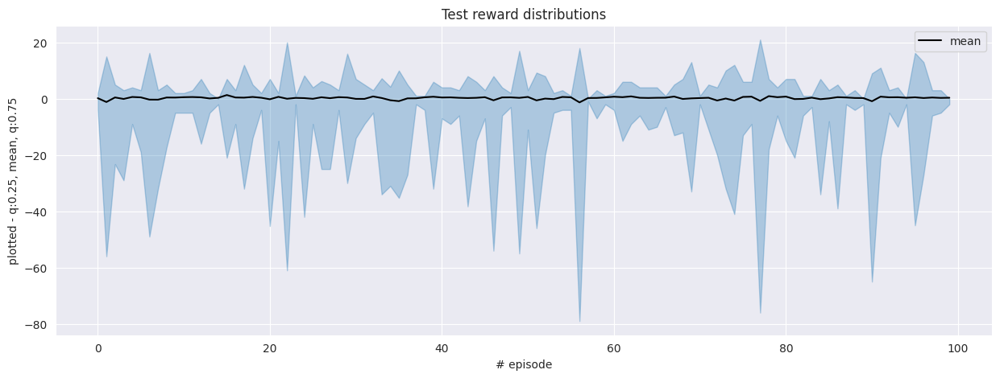

In [26]:
plot_graph(l1_r, 'Test reward distributions')

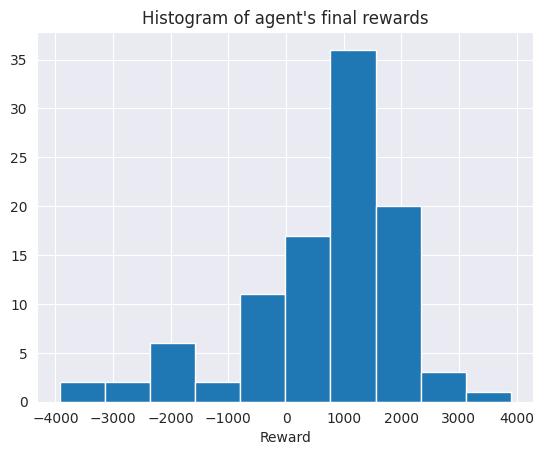

In [27]:
plot_hist(l2_r)

In [28]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V2

In [17]:
type = 'v2'

- Adam learning rate = 1e-3/2
- LayerNorm: yes

In [18]:
agent = return_ddqn(1e-3/2, True)

In [19]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_ddqn)

  1%|▏         | 7/500 [02:11<3:25:25, 25.00s/it]

[[9985    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  2%|▏         | 10/500 [03:43<3:55:49, 28.88s/it]

[[9978    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  3%|▎         | 14/500 [05:48<4:10:36, 30.94s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


  3%|▎         | 17/500 [07:25<4:16:25, 31.85s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-11


  4%|▍         | 20/500 [09:01<4:15:57, 31.99s/it]

[[9933    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  5%|▌         | 25/500 [11:41<4:15:07, 32.23s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


  6%|▌         | 29/500 [13:59<4:23:07, 33.52s/it]

[[9969    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  7%|▋         | 35/500 [17:13<4:11:23, 32.44s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


  8%|▊         | 41/500 [20:31<4:11:32, 32.88s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 10%|█         | 50/500 [25:50<4:22:47, 35.04s/it]

[[9989    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 11%|█         | 55/500 [28:43<4:17:22, 34.70s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 12%|█▏        | 58/500 [30:25<4:12:07, 34.22s/it]

[[10007     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 12%|█▏        | 59/500 [30:58<4:10:50, 34.13s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 13%|█▎        | 64/500 [33:55<4:16:12, 35.26s/it]

[[10020     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 13%|█▎        | 65/500 [34:31<4:16:59, 35.45s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 13%|█▎        | 67/500 [35:41<4:14:41, 35.29s/it]

[[9974    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 14%|█▎        | 68/500 [36:16<4:12:58, 35.13s/it]

[[9984    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 14%|█▍        | 70/500 [37:26<4:12:38, 35.25s/it]

[[10015     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 15%|█▍        | 74/500 [39:52<4:17:52, 36.32s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 15%|█▌        | 77/500 [41:42<4:18:20, 36.64s/it]

[[9971    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6


 16%|█▌        | 79/500 [42:55<4:15:09, 36.37s/it]

[[10004     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-7


 16%|█▌        | 81/500 [44:06<4:11:18, 35.99s/it]

[[9945    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 17%|█▋        | 84/500 [45:52<4:07:22, 35.68s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 17%|█▋        | 85/500 [46:29<4:09:27, 36.07s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-4


 17%|█▋        | 86/500 [47:05<4:09:07, 36.10s/it]

[[9961    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 17%|█▋        | 87/500 [47:41<4:08:02, 36.03s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 19%|█▉        | 97/500 [53:42<4:01:58, 36.03s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 20%|█▉        | 99/500 [54:55<4:01:46, 36.17s/it]

[[9971    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 20%|██        | 101/500 [56:08<4:01:13, 36.27s/it]

[[10044     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
13


 21%|██        | 106/500 [59:10<4:00:22, 36.60s/it]

[[9966    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 22%|██▏       | 108/500 [1:00:27<4:05:10, 37.53s/it]

[[9905    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-3


 22%|██▏       | 109/500 [1:01:04<4:03:15, 37.33s/it]

[[9993    0    0    0    0    0    0    0    0    0   14]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 23%|██▎       | 113/500 [1:03:38<4:08:34, 38.54s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-7


 23%|██▎       | 114/500 [1:04:15<4:06:11, 38.27s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 23%|██▎       | 116/500 [1:05:31<4:04:23, 38.19s/it]

[[9967    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
12


 24%|██▍       | 119/500 [1:07:27<4:04:20, 38.48s/it]

[[10031     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 24%|██▍       | 120/500 [1:08:06<4:04:13, 38.56s/it]

[[9983    0    0    0    0    0    0    0    0    0   10]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3


 24%|██▍       | 121/500 [1:08:45<4:05:38, 38.89s/it]

[[10017     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 25%|██▍       | 123/500 [1:10:04<4:05:43, 39.11s/it]

[[10006     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 25%|██▌       | 125/500 [1:11:21<4:00:57, 38.55s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 25%|██▌       | 127/500 [1:12:36<3:57:39, 38.23s/it]

[[9986    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 26%|██▌       | 130/500 [1:14:31<3:55:44, 38.23s/it]

[[9950    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 26%|██▋       | 132/500 [1:15:48<3:55:46, 38.44s/it]

[[9945    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 27%|██▋       | 133/500 [1:16:26<3:54:12, 38.29s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 27%|██▋       | 134/500 [1:17:04<3:53:18, 38.25s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 27%|██▋       | 135/500 [1:17:42<3:51:41, 38.09s/it]

[[9982    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
11


 28%|██▊       | 138/500 [1:19:35<3:47:44, 37.75s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 28%|██▊       | 139/500 [1:20:12<3:47:01, 37.73s/it]

[[10019     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 28%|██▊       | 142/500 [1:22:06<3:46:05, 37.89s/it]

[[9997    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 29%|██▉       | 145/500 [1:24:02<3:46:41, 38.31s/it]

[[9961    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 29%|██▉       | 147/500 [1:25:20<3:48:16, 38.80s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-7


 30%|██▉       | 148/500 [1:25:58<3:46:56, 38.68s/it]

[[10000     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 30%|██▉       | 149/500 [1:26:39<3:49:15, 39.19s/it]

[[9980    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 31%|███       | 155/500 [1:30:40<3:49:27, 39.91s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 32%|███▏      | 161/500 [1:34:37<3:43:51, 39.62s/it]

[[9969    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 32%|███▏      | 162/500 [1:35:17<3:43:03, 39.60s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 33%|███▎      | 167/500 [1:38:36<3:41:22, 39.89s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 35%|███▍      | 174/500 [1:43:19<3:41:13, 40.72s/it]

[[10012     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 35%|███▌      | 175/500 [1:44:00<3:40:43, 40.75s/it]

[[10016     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 36%|███▌      | 178/500 [1:46:04<3:40:46, 41.14s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 36%|███▌      | 181/500 [1:48:08<3:39:40, 41.32s/it]

[[10037     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 36%|███▋      | 182/500 [1:48:51<3:40:13, 41.55s/it]

[[10037     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
11


 37%|███▋      | 185/500 [1:50:55<3:37:14, 41.38s/it]

[[9956    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 37%|███▋      | 187/500 [1:52:17<3:35:01, 41.22s/it]

[[10018     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 38%|███▊      | 190/500 [1:54:24<3:38:16, 42.25s/it]

[[10037     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 38%|███▊      | 192/500 [1:55:49<3:38:16, 42.52s/it]

[[9950    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 39%|███▊      | 193/500 [1:56:32<3:37:10, 42.44s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -23]]
0
-1


 39%|███▉      | 195/500 [1:57:58<3:37:56, 42.87s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 40%|███▉      | 199/500 [2:00:51<3:36:31, 43.16s/it]

[[9904    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 40%|████      | 200/500 [2:01:35<3:36:05, 43.22s/it]

[[10020     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 41%|████      | 205/500 [2:05:16<3:37:25, 44.22s/it]

[[10020     0     0     0     0     0     0     0     0     0     0]
 [   -9     0     0     0     0     0     0     0     0    -2    -3]]
0
-7


 41%|████      | 206/500 [2:06:01<3:38:06, 44.51s/it]

[[10007     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 42%|████▏     | 208/500 [2:07:28<3:33:20, 43.84s/it]

[[10005     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 42%|████▏     | 210/500 [2:08:56<3:32:47, 44.03s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -12]]
0
-2


 42%|████▏     | 212/500 [2:10:23<3:30:23, 43.83s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-7


 43%|████▎     | 213/500 [2:11:07<3:29:57, 43.90s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 44%|████▎     | 218/500 [2:14:55<3:28:23, 44.34s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 44%|████▍     | 222/500 [2:17:49<3:22:27, 43.70s/it]

[[10031     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6
[[10023     0     0     0     0     0     0     0     0     0     0]
 [   -3     0     0    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-2


 45%|████▍     | 223/500 [2:18:32<3:21:45, 43.70s/it]

[[9986    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 45%|████▌     | 225/500 [2:19:59<3:18:52, 43.39s/it]

[[10029     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 46%|████▌     | 229/500 [2:22:53<3:16:46, 43.57s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 46%|████▋     | 232/500 [2:25:08<3:19:03, 44.56s/it]

[[9986    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 47%|████▋     | 236/500 [2:28:09<3:18:20, 45.08s/it]

[[9966    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 48%|████▊     | 238/500 [2:29:41<3:19:06, 45.60s/it]

[[10005     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 49%|████▉     | 247/500 [2:36:41<3:12:49, 45.73s/it]

[[10007     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 50%|████▉     | 248/500 [2:37:27<3:11:58, 45.71s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-7


 50%|█████     | 251/500 [2:39:41<3:06:48, 45.01s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 51%|█████     | 255/500 [2:42:41<3:04:20, 45.14s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 51%|█████     | 256/500 [2:43:27<3:04:01, 45.25s/it]

[[10005     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 52%|█████▏    | 262/500 [2:48:06<3:04:59, 46.63s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 53%|█████▎    | 266/500 [2:51:11<3:01:05, 46.43s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 54%|█████▍    | 269/500 [2:53:33<3:01:15, 47.08s/it]

[[9994    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 54%|█████▍    | 270/500 [2:54:19<2:59:06, 46.73s/it]

[[9959    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 55%|█████▍    | 274/500 [2:57:25<2:55:28, 46.59s/it]

[[9988    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 55%|█████▌    | 277/500 [2:59:47<2:55:50, 47.31s/it]

[[9938    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 56%|█████▋    | 282/500 [3:03:51<2:57:16, 48.79s/it]

[[10017     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 57%|█████▋    | 283/500 [3:04:42<2:58:25, 49.33s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 57%|█████▋    | 284/500 [3:05:31<2:57:25, 49.28s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 57%|█████▋    | 285/500 [3:06:19<2:55:37, 49.01s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 57%|█████▋    | 286/500 [3:07:09<2:55:56, 49.33s/it]

[[9998    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 57%|█████▋    | 287/500 [3:08:04<3:00:26, 50.83s/it]

[[10022     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 58%|█████▊    | 288/500 [3:08:54<2:59:08, 50.70s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 58%|█████▊    | 290/500 [3:10:30<2:52:42, 49.34s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 58%|█████▊    | 291/500 [3:11:18<2:50:29, 48.94s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 59%|█████▉    | 294/500 [3:13:44<2:47:11, 48.70s/it]

[[10004     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 59%|█████▉    | 297/500 [3:16:09<2:43:44, 48.40s/it]

[[10026     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 60%|██████    | 300/500 [3:18:33<2:40:52, 48.26s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 60%|██████    | 302/500 [3:20:12<2:41:03, 48.81s/it]

[[9992    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 61%|██████    | 305/500 [3:22:43<2:41:34, 49.72s/it]

[[9967    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 61%|██████    | 306/500 [3:23:32<2:40:12, 49.55s/it]

[[9973    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 62%|██████▏   | 312/500 [3:28:28<2:34:45, 49.39s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-6


 63%|██████▎   | 317/500 [3:32:35<2:31:49, 49.78s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 64%|██████▎   | 318/500 [3:33:27<2:33:04, 50.47s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 65%|██████▌   | 326/500 [3:40:11<2:26:02, 50.36s/it]

[[9993    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 66%|██████▌   | 328/500 [3:41:50<2:23:03, 49.91s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 66%|██████▌   | 329/500 [3:42:41<2:22:30, 50.00s/it]

[[10005     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 66%|██████▋   | 332/500 [3:45:12<2:20:55, 50.33s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 67%|██████▋   | 333/500 [3:46:03<2:20:34, 50.50s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-4


 67%|██████▋   | 335/500 [3:47:45<2:19:29, 50.73s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -4   -4]]
0
-2


 67%|██████▋   | 336/500 [3:48:35<2:18:33, 50.69s/it]

[[10030     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 68%|██████▊   | 340/500 [3:51:58<2:15:30, 50.82s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 68%|██████▊   | 341/500 [3:52:50<2:15:07, 50.99s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3


 69%|██████▊   | 343/500 [3:54:32<2:14:00, 51.21s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 69%|██████▉   | 345/500 [3:56:15<2:12:26, 51.27s/it]

[[9956    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 70%|███████   | 352/500 [4:02:18<2:08:56, 52.27s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 71%|███████   | 356/500 [4:05:51<2:06:24, 52.67s/it]

[[10005     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 71%|███████▏  | 357/500 [4:06:44<2:05:59, 52.86s/it]

[[10023     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 72%|███████▏  | 358/500 [4:07:37<2:05:00, 52.82s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 72%|███████▏  | 362/500 [4:11:06<2:00:51, 52.55s/it]

[[9977    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 73%|███████▎  | 364/500 [4:12:52<2:00:06, 52.99s/it]

[[10010     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -11]]
0
-9


 73%|███████▎  | 365/500 [4:13:46<1:59:55, 53.30s/it]

[[9971    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 74%|███████▎  | 368/500 [4:16:22<1:55:10, 52.35s/it]

[[10026     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 75%|███████▌  | 375/500 [4:22:26<1:48:49, 52.24s/it]

[[9975    0    0    0    0    0    0    0    0    2    0]
 [  -9    0    0    0    0    0    0    0    0    0    0]]
-9
3


 76%|███████▌  | 378/500 [4:25:09<1:48:47, 53.51s/it]

[[9983    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 76%|███████▌  | 380/500 [4:26:52<1:45:08, 52.57s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 76%|███████▌  | 381/500 [4:27:43<1:43:38, 52.26s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-11


 77%|███████▋  | 386/500 [4:31:58<1:37:09, 51.14s/it]

[[10007     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 78%|███████▊  | 391/500 [4:36:15<1:33:25, 51.42s/it]

[[9963    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 79%|███████▉  | 397/500 [4:41:23<1:27:42, 51.09s/it]

[[10033     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 400/500 [4:43:55<1:24:43, 50.83s/it]

[[9977    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 81%|████████  | 405/500 [4:48:14<1:21:38, 51.56s/it]

[[9983    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 82%|████████▏ | 408/500 [4:50:50<1:19:43, 51.99s/it]

[[9997    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 82%|████████▏ | 409/500 [4:51:41<1:18:24, 51.69s/it]

[[9985    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 414/500 [4:56:00<1:14:28, 51.96s/it]

[[9976    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 417/500 [4:58:37<1:12:05, 52.12s/it]

[[9951    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 84%|████████▍ | 419/500 [5:00:20<1:09:49, 51.72s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 84%|████████▍ | 420/500 [5:01:13<1:09:32, 52.16s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 86%|████████▋ | 432/500 [5:11:34<57:49, 51.03s/it]

[[9996    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 88%|████████▊ | 439/500 [5:17:36<52:25, 51.57s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 89%|████████▉ | 444/500 [5:22:02<50:00, 53.59s/it]

[[9967    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 89%|████████▉ | 445/500 [5:23:00<50:33, 55.15s/it]

[[9969    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 90%|████████▉ | 448/500 [5:25:37<46:02, 53.13s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 90%|████████▉ | 449/500 [5:26:28<44:33, 52.42s/it]

[[9978    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 90%|█████████ | 450/500 [5:27:20<43:24, 52.10s/it]

[[9966    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 90%|█████████ | 451/500 [5:28:10<42:07, 51.59s/it]

[[10012     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 91%|█████████ | 454/500 [5:30:41<38:54, 50.76s/it]

[[10030     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████ | 456/500 [5:32:21<36:58, 50.41s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 92%|█████████▏| 461/500 [5:36:35<32:55, 50.66s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 93%|█████████▎| 463/500 [5:38:16<31:16, 50.72s/it]

[[9990    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 93%|█████████▎| 466/500 [5:40:49<28:49, 50.87s/it]

[[9951    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 93%|█████████▎| 467/500 [5:41:40<27:55, 50.76s/it]

[[9954    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 94%|█████████▍| 469/500 [5:43:23<26:34, 51.45s/it]

[[9959    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 95%|█████████▌| 475/500 [5:48:32<21:33, 51.72s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 95%|█████████▌| 476/500 [5:49:25<20:44, 51.87s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 97%|█████████▋| 483/500 [5:55:26<14:35, 51.49s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 97%|█████████▋| 487/500 [5:58:55<11:17, 52.11s/it]

[[10021     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 98%|█████████▊| 488/500 [5:59:47<10:26, 52.25s/it]

[[10016     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 98%|█████████▊| 489/500 [6:00:42<09:42, 53.00s/it]

[[9917    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 99%|█████████▉| 496/500 [6:06:43<03:26, 51.66s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-9


100%|█████████▉| 498/500 [6:08:26<01:42, 51.44s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


100%|██████████| 500/500 [6:10:08<00:00, 44.42s/it]

done


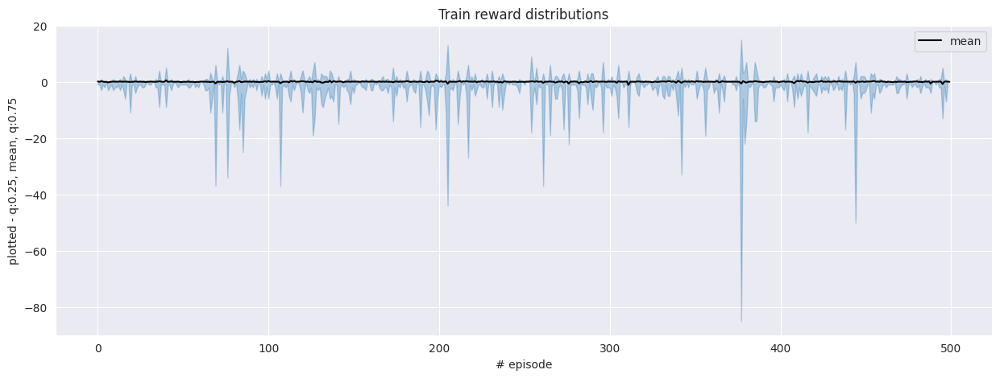

In [20]:
plot_graph(r3_list, 'Train reward distributions', skip = True)

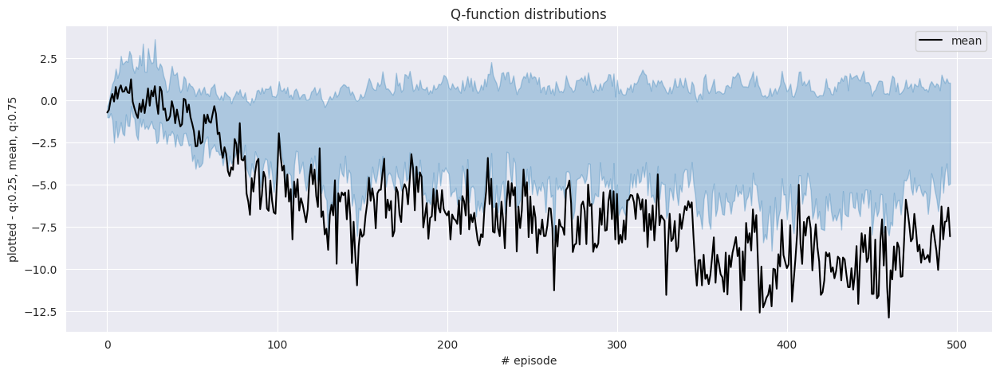

In [21]:
plot_graph(r1_list, 'Q-function distributions', skip = True)

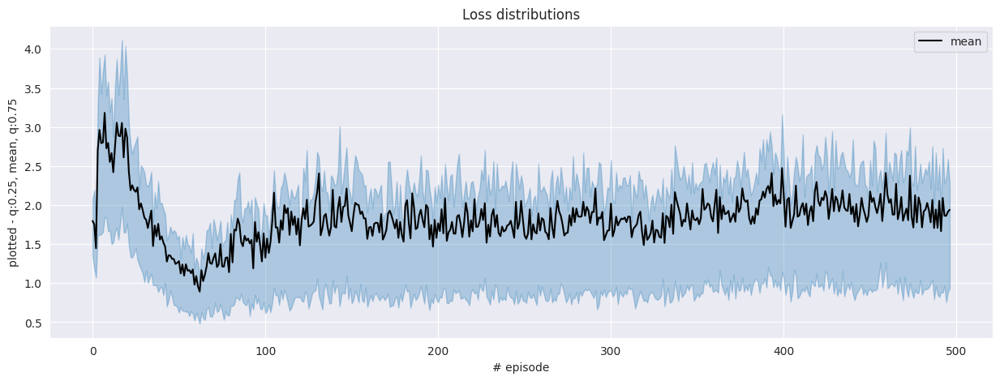

In [22]:
plot_graph(r2_list, 'Loss distributions', skip = True)

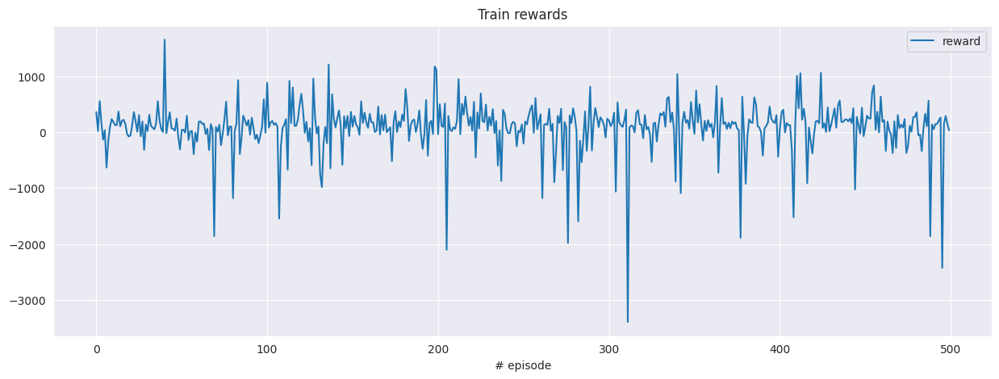

In [23]:
plot_rs(r4_list, 'Train rewards')

In [24]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [25]:
l1_r, l2_r = [], []

test_agent(agent, env)

  1%|          | 1/100 [00:06<11:05,  6.72s/it]

[[9902    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3


  2%|▏         | 2/100 [00:14<11:31,  7.05s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -5    0]]
0
-4


  3%|▎         | 3/100 [00:21<11:32,  7.14s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


  4%|▍         | 4/100 [00:28<11:24,  7.13s/it]

[[9866    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


  5%|▌         | 5/100 [00:35<11:20,  7.17s/it]

[[9859    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  6%|▌         | 6/100 [00:42<11:11,  7.14s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  7%|▋         | 7/100 [00:49<11:05,  7.16s/it]

[[9907    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  8%|▊         | 8/100 [00:57<11:14,  7.33s/it]

[[9876    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  9%|▉         | 9/100 [01:05<11:22,  7.50s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 10%|█         | 10/100 [01:12<11:12,  7.47s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-3


 11%|█         | 11/100 [01:19<10:51,  7.32s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 12%|█▏        | 12/100 [01:27<10:45,  7.33s/it]

[[9877    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 13%|█▎        | 13/100 [01:34<10:32,  7.27s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-3


 14%|█▍        | 14/100 [01:41<10:25,  7.28s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 15%|█▌        | 15/100 [01:47<09:55,  7.01s/it]

[[10029     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 16%|█▌        | 16/100 [01:54<09:45,  6.97s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 17%|█▋        | 17/100 [02:01<09:40,  7.00s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 18%|█▊        | 18/100 [02:08<09:30,  6.96s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 19%|█▉        | 19/100 [02:16<09:33,  7.08s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 20%|██        | 20/100 [02:23<09:35,  7.20s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 21%|██        | 21/100 [02:31<09:32,  7.25s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 22%|██▏       | 22/100 [02:38<09:27,  7.28s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-1


 23%|██▎       | 23/100 [02:45<09:26,  7.36s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 24%|██▍       | 24/100 [02:53<09:20,  7.38s/it]

[[9866    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 25%|██▌       | 25/100 [03:00<09:18,  7.45s/it]

[[9869    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 26%|██▌       | 26/100 [03:08<09:24,  7.62s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 27%|██▋       | 27/100 [03:17<09:26,  7.76s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 28%|██▊       | 28/100 [03:24<09:13,  7.68s/it]

[[9866    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 29%|██▉       | 29/100 [03:32<09:09,  7.73s/it]

[[9897    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 30%|███       | 30/100 [03:39<08:52,  7.60s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 31%|███       | 31/100 [03:47<08:52,  7.71s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 32%|███▏      | 32/100 [03:55<08:47,  7.75s/it]

[[9922    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 33%|███▎      | 33/100 [04:03<08:37,  7.73s/it]

[[9872    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 34%|███▍      | 34/100 [04:10<08:17,  7.53s/it]

[[9867    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 35%|███▌      | 35/100 [04:17<08:04,  7.46s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-7


 36%|███▌      | 36/100 [04:24<07:49,  7.33s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 37%|███▋      | 37/100 [04:31<07:36,  7.24s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4


 38%|███▊      | 38/100 [04:39<07:37,  7.38s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 39%|███▉      | 39/100 [04:47<07:41,  7.57s/it]

[[9879    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 40%|████      | 40/100 [04:55<07:36,  7.60s/it]

[[9869    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-2


 41%|████      | 41/100 [05:02<07:23,  7.52s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-6


 42%|████▏     | 42/100 [05:09<07:14,  7.49s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-15


 43%|████▎     | 43/100 [05:17<07:03,  7.43s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 44%|████▍     | 44/100 [05:24<07:01,  7.52s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 45%|████▌     | 45/100 [05:32<06:52,  7.50s/it]

[[9871    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-4


 46%|████▌     | 46/100 [05:40<06:49,  7.59s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 47%|████▋     | 47/100 [05:47<06:34,  7.44s/it]

[[9931    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6


 48%|████▊     | 48/100 [05:54<06:22,  7.35s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 49%|████▉     | 49/100 [06:01<06:13,  7.33s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-7


 50%|█████     | 50/100 [06:08<06:02,  7.26s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 51%|█████     | 51/100 [06:15<05:52,  7.20s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-3


 52%|█████▏    | 52/100 [06:23<05:51,  7.32s/it]

[[9907    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 53%|█████▎    | 53/100 [06:29<05:30,  7.03s/it]

[[10043     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 54%|█████▍    | 54/100 [06:36<05:16,  6.87s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-7


 55%|█████▌    | 55/100 [06:42<05:07,  6.83s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-2


 56%|█████▌    | 56/100 [06:50<05:09,  7.02s/it]

[[9904    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 57%|█████▋    | 57/100 [06:57<05:00,  6.99s/it]

[[9845    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 58%|█████▊    | 58/100 [07:04<05:01,  7.18s/it]

[[9872    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 59%|█████▉    | 59/100 [07:11<04:49,  7.07s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 60%|██████    | 60/100 [07:18<04:39,  6.99s/it]

[[9891    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-7


 61%|██████    | 61/100 [07:25<04:31,  6.95s/it]

[[9837    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-8


 62%|██████▏   | 62/100 [07:32<04:28,  7.08s/it]

[[9877    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 63%|██████▎   | 63/100 [07:40<04:28,  7.26s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 64%|██████▍   | 64/100 [07:47<04:20,  7.25s/it]

[[9871    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 65%|██████▌   | 65/100 [07:55<04:16,  7.32s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 66%|██████▌   | 66/100 [08:02<04:09,  7.33s/it]

[[9915    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 67%|██████▋   | 67/100 [08:09<03:56,  7.18s/it]

[[9917    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-8


 68%|██████▊   | 68/100 [08:17<03:55,  7.37s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 69%|██████▉   | 69/100 [08:24<03:47,  7.34s/it]

[[9871    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-1


 70%|███████   | 70/100 [08:31<03:42,  7.41s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-3


 71%|███████   | 71/100 [08:40<03:42,  7.66s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 72%|███████▏  | 72/100 [08:48<03:39,  7.84s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 73%|███████▎  | 73/100 [08:56<03:33,  7.91s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 74%|███████▍  | 74/100 [09:03<03:19,  7.67s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 75%|███████▌  | 75/100 [09:10<03:05,  7.41s/it]

[[10053     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▌  | 76/100 [09:17<02:57,  7.41s/it]

[[9857    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -3   -5]]
0
-4


 77%|███████▋  | 77/100 [09:25<02:52,  7.51s/it]

[[9883    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-8


 78%|███████▊  | 78/100 [09:32<02:40,  7.30s/it]

[[9880    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 79%|███████▉  | 79/100 [09:39<02:33,  7.33s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 80%|████████  | 80/100 [09:47<02:25,  7.29s/it]

[[9903    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 81%|████████  | 81/100 [09:54<02:20,  7.39s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 82%|████████▏ | 82/100 [10:01<02:08,  7.14s/it]

[[9984    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 83/100 [10:08<02:00,  7.12s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [  -8    0    0    0    0    0    0    0   -2   -8   -8]]
0
-7


 84%|████████▍ | 84/100 [10:15<01:55,  7.23s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 85%|████████▌ | 85/100 [10:24<01:53,  7.56s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 86%|████████▌ | 86/100 [10:31<01:45,  7.56s/it]

[[9862    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 87%|████████▋ | 87/100 [10:39<01:37,  7.50s/it]

[[9897    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-4


 88%|████████▊ | 88/100 [10:46<01:29,  7.47s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 89%|████████▉ | 89/100 [10:52<01:19,  7.19s/it]

[[9954    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 90%|█████████ | 90/100 [11:00<01:12,  7.22s/it]

[[9842    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 91%|█████████ | 91/100 [11:07<01:05,  7.25s/it]

[[9855    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 92%|█████████▏| 92/100 [11:15<00:59,  7.39s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 93%|█████████▎| 93/100 [11:21<00:49,  7.12s/it]

[[9891    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-8


 94%|█████████▍| 94/100 [11:29<00:44,  7.36s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 95%|█████████▌| 95/100 [11:37<00:36,  7.35s/it]

[[9897    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 96%|█████████▌| 96/100 [11:44<00:29,  7.37s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 97%|█████████▋| 97/100 [11:52<00:22,  7.44s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 98%|█████████▊| 98/100 [11:59<00:14,  7.39s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 99%|█████████▉| 99/100 [12:06<00:07,  7.35s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


100%|██████████| 100/100 [12:14<00:00,  7.34s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1
done


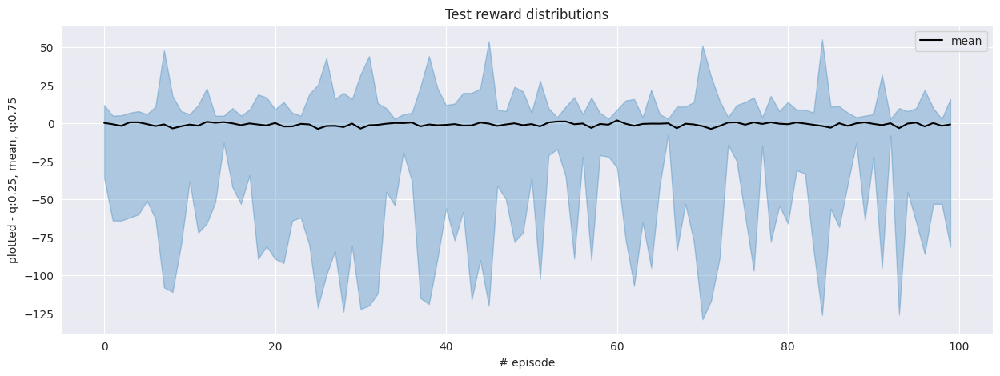

In [26]:
plot_graph(l1_r, 'Test reward distributions')

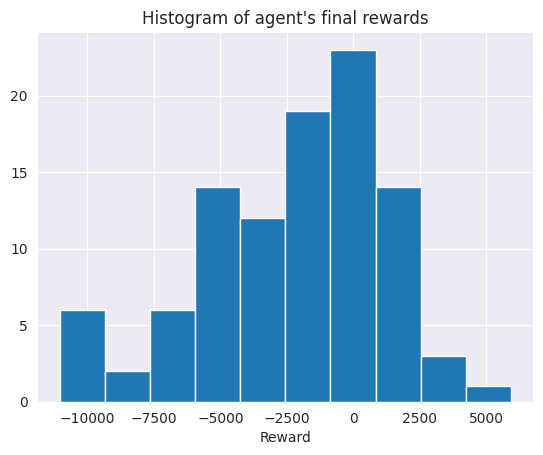

In [27]:
plot_hist(l2_r)

In [28]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V3

In [17]:
type = 'v3'

- Adam learning rate = 1e-3
- LayerNorm: no

In [18]:
agent = return_ddqn(1e-3, False)

In [19]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_ddqn)

  1%|          | 5/500 [01:08<2:25:23, 17.62s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


  2%|▏         | 12/500 [04:26<3:46:07, 27.80s/it]

[[9965    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  3%|▎         | 14/500 [05:23<3:48:38, 28.23s/it]

[[10006     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  7%|▋         | 33/500 [14:52<3:56:16, 30.36s/it]

[[9940    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  7%|▋         | 34/500 [15:22<3:55:55, 30.38s/it]

[[10031     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


  7%|▋         | 37/500 [16:54<3:55:06, 30.47s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


  9%|▊         | 43/500 [20:00<3:55:45, 30.95s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


  9%|▉         | 44/500 [20:31<3:55:44, 31.02s/it]

[[9949    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 10%|▉         | 48/500 [22:40<3:59:47, 31.83s/it]

[[10000     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 11%|█         | 53/500 [25:19<3:55:55, 31.67s/it]

[[9953    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 11%|█         | 55/500 [26:23<3:55:29, 31.75s/it]

[[10011     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 12%|█▏        | 58/500 [28:01<3:59:10, 32.47s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 14%|█▍        | 69/500 [34:00<3:54:56, 32.71s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-4


 14%|█▍        | 70/500 [34:33<3:54:25, 32.71s/it]

[[9955    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 14%|█▍        | 72/500 [35:38<3:53:10, 32.69s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 15%|█▍        | 73/500 [36:11<3:52:18, 32.64s/it]

[[9976    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 16%|█▌        | 79/500 [39:28<3:51:26, 32.98s/it]

[[9910    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 16%|█▌        | 81/500 [40:34<3:51:03, 33.09s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-4


 17%|█▋        | 83/500 [41:41<3:50:22, 33.15s/it]

[[9935    0    0    0    0    0    0    0    0    0   16]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 18%|█▊        | 89/500 [45:04<3:52:32, 33.95s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 18%|█▊        | 90/500 [45:39<3:53:37, 34.19s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 19%|█▊        | 93/500 [47:21<3:50:49, 34.03s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 19%|█▉        | 96/500 [49:03<3:49:17, 34.05s/it]

[[9992    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 20%|█▉        | 98/500 [50:11<3:46:39, 33.83s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-6


 20%|█▉        | 99/500 [50:45<3:46:37, 33.91s/it]

[[9966    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 21%|██        | 104/500 [53:36<3:47:49, 34.52s/it]

[[9979    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 21%|██        | 106/500 [54:46<3:47:03, 34.58s/it]

[[10015     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 22%|██▏       | 110/500 [57:04<3:43:47, 34.43s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 23%|██▎       | 114/500 [59:25<3:45:59, 35.13s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 23%|██▎       | 115/500 [1:00:00<3:45:08, 35.09s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 24%|██▎       | 118/500 [1:01:49<3:48:41, 35.92s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 24%|██▍       | 121/500 [1:03:40<3:52:21, 36.79s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 25%|██▍       | 123/500 [1:04:51<3:47:28, 36.20s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 25%|██▌       | 125/500 [1:06:02<3:42:54, 35.67s/it]

[[9985    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 26%|██▌       | 131/500 [1:09:36<3:38:37, 35.55s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-5


 26%|██▋       | 132/500 [1:10:11<3:37:39, 35.49s/it]

[[9943    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 27%|██▋       | 133/500 [1:10:46<3:36:37, 35.42s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 28%|██▊       | 140/500 [1:14:55<3:33:21, 35.56s/it]

[[10017     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 28%|██▊       | 141/500 [1:15:31<3:33:35, 35.70s/it]

[[9942    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 28%|██▊       | 142/500 [1:16:07<3:34:23, 35.93s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -7   -2]]
0
-6


 29%|██▊       | 143/500 [1:16:43<3:34:21, 36.03s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 29%|██▉       | 144/500 [1:17:20<3:35:00, 36.24s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-6


 29%|██▉       | 145/500 [1:17:57<3:36:25, 36.58s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 30%|██▉       | 148/500 [1:19:48<3:36:16, 36.87s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-7


 30%|███       | 150/500 [1:21:02<3:35:03, 36.87s/it]

[[10011     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 31%|███       | 153/500 [1:22:54<3:35:12, 37.21s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 31%|███       | 155/500 [1:24:09<3:35:09, 37.42s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -3   -3]]
0
-5


 32%|███▏      | 158/500 [1:26:00<3:32:07, 37.21s/it]

[[9992    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 33%|███▎      | 163/500 [1:29:13<3:36:04, 38.47s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 34%|███▎      | 168/500 [1:32:21<3:29:16, 37.82s/it]

[[9985    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 34%|███▍      | 170/500 [1:33:39<3:30:30, 38.27s/it]

[[9980    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 35%|███▍      | 173/500 [1:35:33<3:27:33, 38.08s/it]

[[10012     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 36%|███▌      | 180/500 [1:40:03<3:26:29, 38.72s/it]

[[9974    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 37%|███▋      | 183/500 [1:41:59<3:25:10, 38.83s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 38%|███▊      | 192/500 [1:47:58<3:24:13, 39.78s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 39%|███▉      | 194/500 [1:49:18<3:23:40, 39.93s/it]

[[10010     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 39%|███▉      | 196/500 [1:50:37<3:21:11, 39.71s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-3
[[9995    0    0    0    0    0    0    0    0    0    0]
 [  -3    0    0   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 39%|███▉      | 197/500 [1:51:16<3:19:58, 39.60s/it]

[[10021     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1


 42%|████▏     | 209/500 [1:59:14<3:14:52, 40.18s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 42%|████▏     | 212/500 [2:01:17<3:14:51, 40.60s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 45%|████▌     | 226/500 [2:10:51<3:12:04, 42.06s/it]

[[10020     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 48%|████▊     | 239/500 [2:19:49<3:01:42, 41.77s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 51%|█████     | 254/500 [2:30:27<2:55:57, 42.92s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -8]]
0
-3


 51%|█████     | 256/500 [2:31:52<2:53:42, 42.71s/it]

[[10016     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 52%|█████▏    | 260/500 [2:34:43<2:50:59, 42.75s/it]

[[9924    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 57%|█████▋    | 283/500 [2:52:03<2:50:47, 47.22s/it]

[[10004     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 58%|█████▊    | 292/500 [2:58:57<2:40:51, 46.40s/it]

[[9943    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▊    | 293/500 [2:59:44<2:40:37, 46.56s/it]

[[9929    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▉    | 294/500 [3:00:30<2:39:08, 46.35s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 59%|█████▉    | 296/500 [3:02:01<2:35:55, 45.86s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 60%|█████▉    | 298/500 [3:03:34<2:36:00, 46.34s/it]

[[9994    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 61%|██████    | 305/500 [3:09:02<2:31:26, 46.60s/it]

[[10039     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 61%|██████    | 306/500 [3:09:48<2:30:11, 46.45s/it]

[[10012     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▍   | 323/500 [3:23:15<2:20:28, 47.62s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 65%|██████▌   | 326/500 [3:25:39<2:18:56, 47.91s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 66%|██████▌   | 329/500 [3:28:04<2:17:16, 48.17s/it]

[[10005     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 68%|██████▊   | 340/500 [3:36:55<2:08:20, 48.13s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 69%|██████▊   | 343/500 [3:39:21<2:06:22, 48.30s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 69%|██████▉   | 345/500 [3:40:57<2:04:48, 48.31s/it]

[[9953    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 70%|███████   | 350/500 [3:44:59<2:00:53, 48.36s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 72%|███████▏  | 358/500 [3:51:30<1:55:30, 48.81s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 72%|███████▏  | 359/500 [3:52:20<1:55:15, 49.05s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 72%|███████▏  | 362/500 [3:54:48<1:53:20, 49.28s/it]

[[10000     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 363/500 [3:55:37<1:52:07, 49.10s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-12


 73%|███████▎  | 365/500 [3:57:14<1:49:27, 48.65s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 74%|███████▍  | 370/500 [4:01:17<1:45:34, 48.73s/it]

[[9961    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 75%|███████▍  | 373/500 [4:03:43<1:43:09, 48.74s/it]

[[9971    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 75%|███████▌  | 376/500 [4:06:11<1:41:55, 49.32s/it]

[[9971    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 77%|███████▋  | 386/500 [4:14:34<1:35:04, 50.04s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 79%|███████▉  | 394/500 [4:21:14<1:28:08, 49.90s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 79%|███████▉  | 395/500 [4:22:02<1:26:23, 49.37s/it]

[[10003     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|███████▉  | 399/500 [4:25:15<1:21:45, 48.57s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 82%|████████▏ | 411/500 [4:35:00<1:13:00, 49.22s/it]

[[9999    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 416/500 [4:39:02<1:08:11, 48.71s/it]

[[9981    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 417/500 [4:39:51<1:07:10, 48.56s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 84%|████████▍ | 421/500 [4:43:03<1:03:28, 48.20s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 85%|████████▌ | 425/500 [4:46:16<1:00:20, 48.28s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 86%|████████▌ | 431/500 [4:51:09<56:09, 48.83s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 87%|████████▋ | 435/500 [4:54:24<52:51, 48.79s/it]

[[10025     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 88%|████████▊ | 438/500 [4:56:51<50:39, 49.02s/it]

[[9969    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 88%|████████▊ | 439/500 [4:57:41<50:11, 49.36s/it]

[[9994    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 88%|████████▊ | 442/500 [5:00:06<46:54, 48.53s/it]

[[10009     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 89%|████████▉ | 446/500 [5:03:21<44:01, 48.92s/it]

[[9952    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 91%|█████████ | 455/500 [5:10:43<36:41, 48.91s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-6


 92%|█████████▏| 458/500 [5:13:08<34:01, 48.62s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 93%|█████████▎| 467/500 [5:20:36<27:38, 50.25s/it]

[[10025     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 94%|█████████▍| 471/500 [5:24:00<24:41, 51.08s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 95%|█████████▍| 473/500 [5:25:43<23:00, 51.14s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 95%|█████████▍| 474/500 [5:26:33<22:01, 50.82s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 95%|█████████▌| 477/500 [5:29:04<19:23, 50.60s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 98%|█████████▊| 489/500 [5:39:07<09:17, 50.66s/it]

[[10017     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 99%|█████████▊| 493/500 [5:42:25<05:48, 49.72s/it]

[[9966    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


100%|██████████| 500/500 [5:48:12<00:00, 41.78s/it]

done


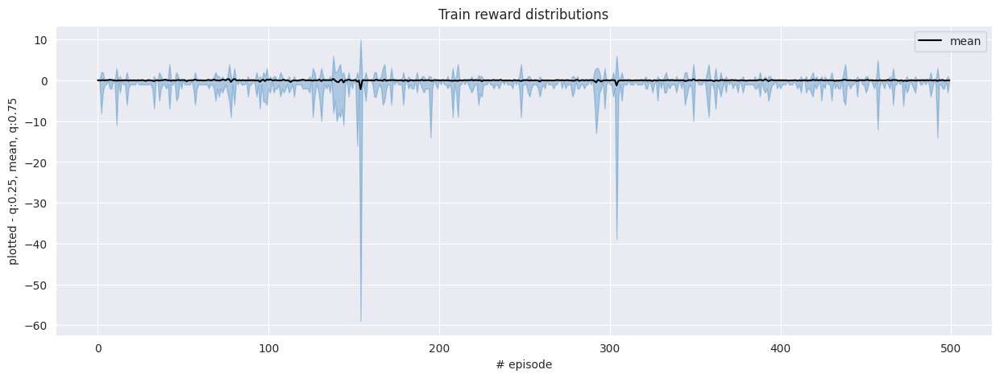

In [20]:
plot_graph(r3_list, 'Train reward distributions', skip = True)

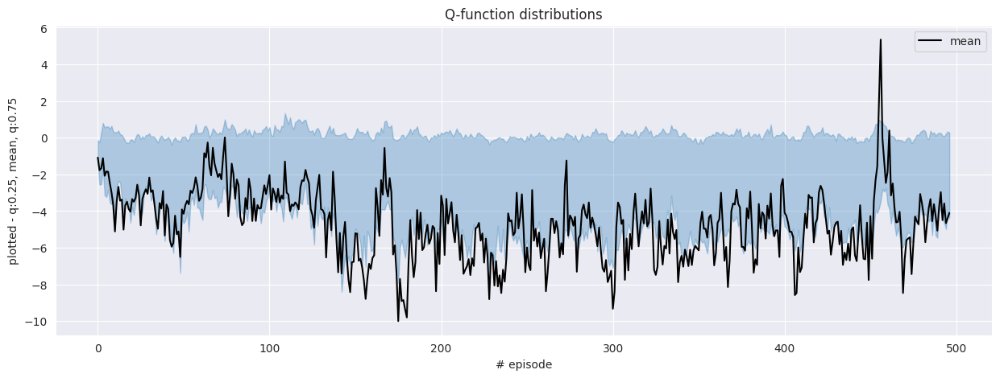

In [21]:
plot_graph(r1_list, 'Q-function distributions', skip = True)

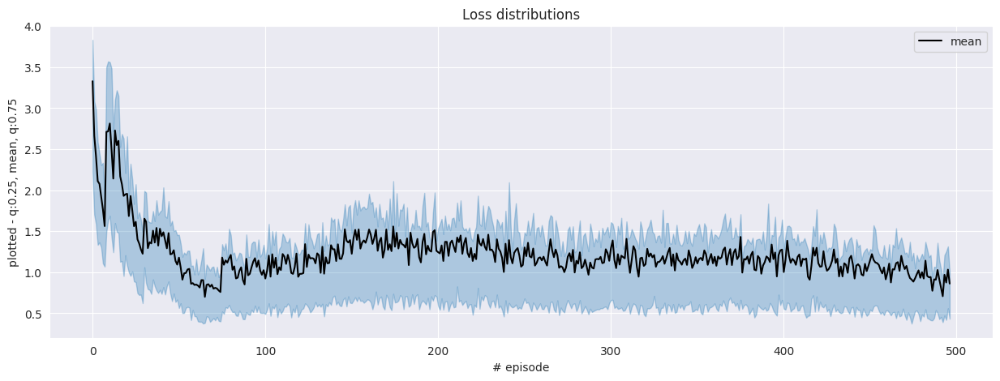

In [22]:
plot_graph(r2_list, 'Loss distributions', skip = True)

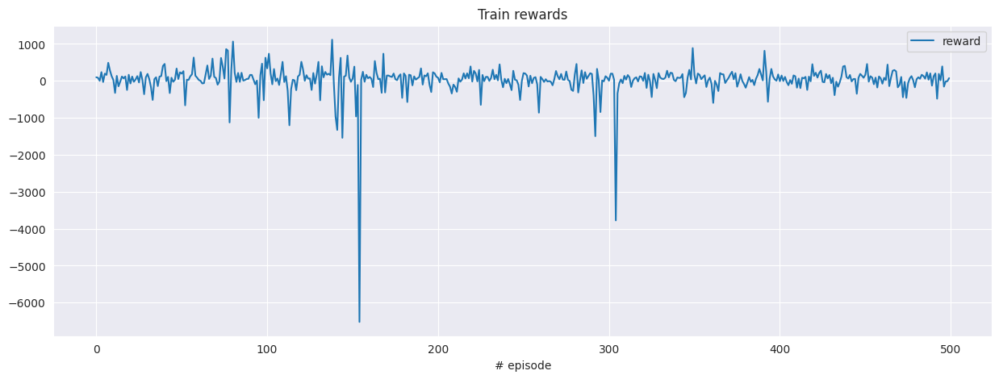

In [23]:
plot_rs(r4_list, 'Train rewards')

In [24]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [25]:
l1_r, l2_r = [], []

test_agent(agent, env)

  1%|          | 1/100 [00:06<10:27,  6.34s/it]

[[9963    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3


  2%|▏         | 2/100 [00:12<10:16,  6.29s/it]

[[9985    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  3%|▎         | 3/100 [00:18<10:10,  6.29s/it]

[[9969    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  6%|▌         | 6/100 [00:37<09:37,  6.14s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 17%|█▋        | 17/100 [01:44<08:30,  6.15s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 20%|██        | 20/100 [02:03<08:20,  6.26s/it]

[[10040     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 22%|██▏       | 22/100 [02:16<08:18,  6.40s/it]

[[10002     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 25%|██▌       | 25/100 [02:36<07:59,  6.39s/it]

[[10016     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 26%|██▌       | 26/100 [02:42<07:46,  6.31s/it]

[[9978    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 32%|███▏      | 32/100 [03:19<07:07,  6.28s/it]

[[10030     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 37%|███▋      | 37/100 [03:50<06:32,  6.23s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 38%|███▊      | 38/100 [03:57<06:30,  6.30s/it]

[[10040     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 42%|████▏     | 42/100 [04:22<06:05,  6.30s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -10]]
0
-1


 43%|████▎     | 43/100 [04:28<06:02,  6.36s/it]

[[9991    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 50%|█████     | 50/100 [05:12<05:13,  6.26s/it]

[[9996    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 51%|█████     | 51/100 [05:18<05:07,  6.27s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 54%|█████▍    | 54/100 [05:38<04:52,  6.35s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 55%|█████▌    | 55/100 [05:44<04:47,  6.38s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 60%|██████    | 60/100 [06:15<04:06,  6.15s/it]

[[9976    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 64%|██████▍   | 64/100 [06:40<03:43,  6.20s/it]

[[10001     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 70%|███████   | 70/100 [07:16<03:03,  6.11s/it]

[[9972    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 71%|███████   | 71/100 [07:22<02:56,  6.10s/it]

[[9999    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 72%|███████▏  | 72/100 [07:29<02:52,  6.17s/it]

[[10008     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[9999    0    0    0    0    0    0    0    0    0    0]
 [  -2    0   -1   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 75%|███████▌  | 75/100 [07:48<02:37,  6.31s/it]

[[10022     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▌  | 76/100 [07:54<02:31,  6.33s/it]

[[10011     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 77%|███████▋  | 77/100 [08:00<02:24,  6.29s/it]

[[10020     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 78/100 [08:06<02:17,  6.24s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 79%|███████▉  | 79/100 [08:12<02:09,  6.17s/it]

[[9950    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 80%|████████  | 80/100 [08:19<02:05,  6.26s/it]

[[10014     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 81%|████████  | 81/100 [08:25<01:58,  6.23s/it]

[[10005     0     0     0     0     0     0     0     0     6     0]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
2


 82%|████████▏ | 82/100 [08:31<01:52,  6.23s/it]

[[9963    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 89%|████████▉ | 89/100 [09:14<01:07,  6.18s/it]

[[9988    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3


 90%|█████████ | 90/100 [09:20<01:01,  6.17s/it]

[[10006     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 93%|█████████▎| 93/100 [09:39<00:43,  6.15s/it]

[[10019     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 94%|█████████▍| 94/100 [09:45<00:37,  6.20s/it]

[[10041     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 95%|█████████▌| 95/100 [09:51<00:30,  6.20s/it]

[[9984    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


100%|██████████| 100/100 [10:23<00:00,  6.23s/it]

done


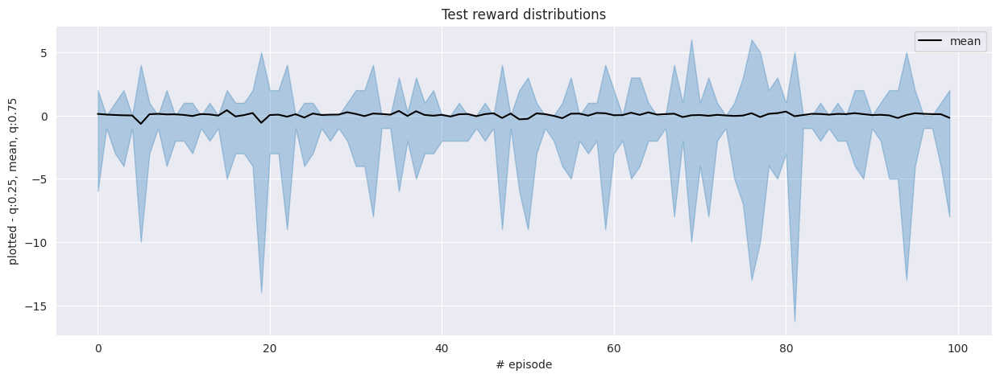

In [26]:
plot_graph(l1_r, 'Test reward distributions')

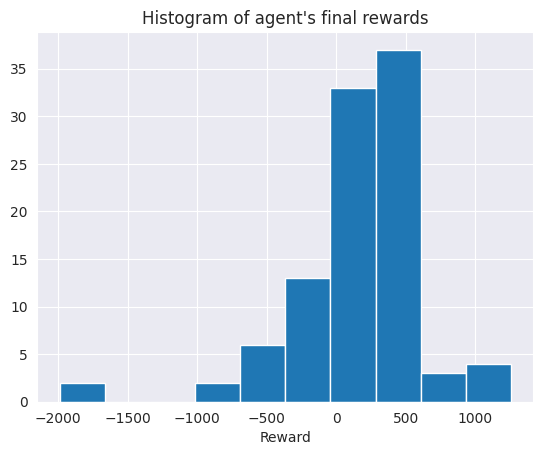

In [27]:
plot_hist(l2_r)

In [28]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V4

In [17]:
type = 'v4'

- Adam learning rate = 1e-3/2
- LayerNorm: no

In [18]:
agent = return_ddqn(1e-3/2, False)

In [19]:
r1_list, r2_list, r3_list, r4_list = [], [], [], []

train_agent(agent, env, train_ddqn)

  1%|          | 6/500 [01:30<2:44:50, 20.02s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  3%|▎         | 14/500 [05:10<3:40:47, 27.26s/it]

[[9940    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9931    0    0    0    0    0    0    0    0    0    0]
 [  -2    0   -1   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


  4%|▍         | 22/500 [08:52<3:42:30, 27.93s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


  5%|▍         | 24/500 [09:48<3:42:47, 28.08s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


  7%|▋         | 33/500 [14:05<3:43:52, 28.76s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-3


  8%|▊         | 39/500 [16:59<3:41:37, 28.84s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 10%|█         | 50/500 [22:23<3:42:18, 29.64s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 11%|█         | 55/500 [24:53<3:42:11, 29.96s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 11%|█         | 56/500 [25:23<3:42:35, 30.08s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 12%|█▏        | 58/500 [26:24<3:44:17, 30.45s/it]

[[10014     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 12%|█▏        | 59/500 [26:56<3:45:33, 30.69s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 12%|█▏        | 60/500 [27:27<3:46:10, 30.84s/it]

[[9951    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 15%|█▌        | 76/500 [36:06<3:52:32, 32.91s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-4


 15%|█▌        | 77/500 [36:40<3:52:43, 33.01s/it]

[[9954    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 16%|█▌        | 81/500 [38:52<3:52:22, 33.28s/it]

[[9970    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 17%|█▋        | 85/500 [41:07<3:52:42, 33.64s/it]

[[10000     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 17%|█▋        | 86/500 [41:41<3:51:44, 33.58s/it]

[[9943    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 18%|█▊        | 89/500 [43:22<3:50:54, 33.71s/it]

[[9968    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 18%|█▊        | 90/500 [43:56<3:51:20, 33.85s/it]

[[9965    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 18%|█▊        | 91/500 [44:30<3:51:36, 33.98s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 20%|█▉        | 99/500 [49:02<3:47:55, 34.10s/it]

[[9997    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 22%|██▏       | 109/500 [54:50<3:48:10, 35.01s/it]

[[10005     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 23%|██▎       | 113/500 [57:08<3:42:59, 34.57s/it]

[[10014     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 23%|██▎       | 114/500 [57:42<3:41:14, 34.39s/it]

[[10013     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 23%|██▎       | 117/500 [59:24<3:37:41, 34.10s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 25%|██▌       | 125/500 [1:03:54<3:31:02, 33.77s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2


 25%|██▌       | 126/500 [1:04:28<3:30:25, 33.76s/it]

[[9945    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 26%|██▌       | 131/500 [1:07:19<3:30:39, 34.25s/it]

[[10043     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 26%|██▋       | 132/500 [1:07:54<3:30:40, 34.35s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 27%|██▋       | 134/500 [1:09:03<3:29:49, 34.40s/it]

[[10002     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 27%|██▋       | 135/500 [1:09:38<3:30:12, 34.56s/it]

[[10009     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 27%|██▋       | 136/500 [1:10:12<3:30:16, 34.66s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 28%|██▊       | 138/500 [1:11:22<3:29:48, 34.77s/it]

[[10001     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 28%|██▊       | 142/500 [1:13:43<3:29:43, 35.15s/it]

[[10002     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -23]]
0
-5


 29%|██▉       | 145/500 [1:15:29<3:27:58, 35.15s/it]

[[10041     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 29%|██▉       | 147/500 [1:16:40<3:28:53, 35.50s/it]

[[9953    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 30%|██▉       | 149/500 [1:17:50<3:26:28, 35.30s/it]

[[9964    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6


 32%|███▏      | 158/500 [1:23:08<3:21:39, 35.38s/it]

[[9970    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 34%|███▎      | 168/500 [1:29:05<3:17:44, 35.74s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 34%|███▍      | 169/500 [1:29:41<3:17:37, 35.82s/it]

[[9950    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 34%|███▍      | 171/500 [1:30:53<3:17:11, 35.96s/it]

[[10023     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 36%|███▌      | 178/500 [1:35:07<3:15:42, 36.47s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 36%|███▌      | 179/500 [1:35:44<3:15:57, 36.63s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 36%|███▌      | 180/500 [1:36:21<3:15:47, 36.71s/it]

[[9954    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 36%|███▋      | 182/500 [1:37:35<3:15:34, 36.90s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 38%|███▊      | 188/500 [1:41:23<3:18:38, 38.20s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 40%|███▉      | 198/500 [1:48:03<3:19:59, 39.73s/it]

[[10008     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 43%|████▎     | 214/500 [1:58:46<3:12:11, 40.32s/it]

[[9993    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 44%|████▎     | 218/500 [2:01:27<3:09:48, 40.38s/it]

[[9951    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 44%|████▍     | 219/500 [2:02:08<3:09:58, 40.56s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 46%|████▌     | 228/500 [2:08:17<3:06:39, 41.17s/it]

[[10039     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 46%|████▌     | 229/500 [2:08:58<3:06:37, 41.32s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 47%|████▋     | 233/500 [2:11:44<3:04:21, 41.43s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 47%|████▋     | 235/500 [2:13:08<3:04:00, 41.66s/it]

[[10025     0     0     0     0     0     0     0     0     0    14]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 47%|████▋     | 236/500 [2:13:50<3:03:16, 41.65s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 48%|████▊     | 242/500 [2:18:00<3:00:23, 41.95s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 49%|████▊     | 243/500 [2:18:43<3:00:31, 42.14s/it]

[[10008     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 49%|████▉     | 244/500 [2:19:29<3:04:47, 43.31s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -7]]
0
-1


 49%|████▉     | 245/500 [2:20:12<3:03:23, 43.15s/it]

[[10035     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 50%|█████     | 252/500 [2:25:09<2:56:12, 42.63s/it]

[[9951    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 51%|█████     | 255/500 [2:27:18<2:54:59, 42.85s/it]

[[9972    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 52%|█████▏    | 259/500 [2:30:10<2:52:38, 42.98s/it]

[[9974    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 53%|█████▎    | 263/500 [2:33:02<2:50:24, 43.14s/it]

[[9973    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 54%|█████▍    | 271/500 [2:38:51<2:46:40, 43.67s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 55%|█████▌    | 276/500 [2:42:31<2:44:31, 44.07s/it]

[[9979    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 56%|█████▌    | 280/500 [2:45:29<2:42:49, 44.41s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 60%|█████▉    | 298/500 [2:59:03<2:33:18, 45.54s/it]

[[10039     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 60%|█████▉    | 299/500 [2:59:48<2:32:42, 45.59s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 61%|██████▏   | 307/500 [3:05:57<2:28:26, 46.15s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 62%|██████▏   | 309/500 [3:07:30<2:27:55, 46.47s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 63%|██████▎   | 314/500 [3:11:29<2:25:58, 47.09s/it]

[[10017     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 63%|██████▎   | 317/500 [3:13:50<2:23:55, 47.19s/it]

[[9957    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5


 64%|██████▎   | 318/500 [3:14:38<2:23:22, 47.27s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 64%|██████▍   | 319/500 [3:15:25<2:22:55, 47.38s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 64%|██████▍   | 320/500 [3:16:13<2:22:21, 47.45s/it]

[[10011     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▍   | 324/500 [3:19:25<2:20:05, 47.76s/it]

[[10014     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 65%|██████▌   | 325/500 [3:20:12<2:19:15, 47.75s/it]

[[10025     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 66%|██████▌   | 328/500 [3:22:35<2:16:51, 47.74s/it]

[[10030     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -8]]
0
-1


 66%|██████▌   | 329/500 [3:23:23<2:16:20, 47.84s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 67%|██████▋   | 336/500 [3:29:02<2:12:40, 48.54s/it]

[[9952    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 68%|██████▊   | 342/500 [3:33:53<2:07:42, 48.49s/it]

[[9994    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 69%|██████▉   | 347/500 [3:37:58<2:04:36, 48.87s/it]

[[10036     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 70%|███████   | 350/500 [3:40:24<2:01:43, 48.69s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 70%|███████   | 352/500 [3:42:01<2:00:21, 48.80s/it]

[[9992    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 71%|███████   | 354/500 [3:43:39<1:58:46, 48.81s/it]

[[9991    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 72%|███████▏  | 359/500 [3:47:43<1:54:40, 48.80s/it]

[[10017     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 72%|███████▏  | 362/500 [3:50:12<1:53:27, 49.33s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -8]]
0
-1


 73%|███████▎  | 366/500 [3:53:28<1:50:12, 49.34s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 74%|███████▎  | 368/500 [3:55:07<1:48:42, 49.41s/it]

[[10028     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 76%|███████▌  | 379/500 [4:04:03<1:38:18, 48.75s/it]

[[9975    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 80%|███████▉  | 399/500 [4:20:06<1:20:20, 47.73s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 80%|████████  | 402/500 [4:22:29<1:17:47, 47.63s/it]

[[10005     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 406/500 [4:25:42<1:15:23, 48.12s/it]

[[9993    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 81%|████████▏ | 407/500 [4:26:30<1:14:33, 48.10s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 82%|████████▏ | 409/500 [4:28:06<1:12:54, 48.07s/it]

[[9958    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 415/500 [4:32:54<1:07:46, 47.84s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 83%|████████▎ | 416/500 [4:33:41<1:06:50, 47.74s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-3


 84%|████████▍ | 421/500 [4:37:38<1:02:28, 47.45s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 85%|████████▌ | 426/500 [4:41:35<58:29, 47.42s/it]

[[9954    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 85%|████████▌ | 427/500 [4:42:24<58:10, 47.81s/it]

[[10014     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 435/500 [4:48:48<52:07, 48.12s/it]

[[10011     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 436/500 [4:49:37<51:34, 48.35s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 88%|████████▊ | 441/500 [4:53:33<46:09, 46.94s/it]

[[10007     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 89%|████████▊ | 443/500 [4:55:05<44:13, 46.55s/it]

[[10042     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 89%|████████▉ | 445/500 [4:56:39<42:54, 46.81s/it]

[[10029     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 90%|█████████ | 452/500 [5:02:15<38:29, 48.12s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 91%|█████████ | 454/500 [5:03:52<37:00, 48.28s/it]

[[9981    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 91%|█████████ | 455/500 [5:04:41<36:15, 48.34s/it]

[[10015     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████ | 456/500 [5:05:29<35:22, 48.23s/it]

[[10022     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 92%|█████████▏| 460/500 [5:08:36<31:14, 46.87s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 94%|█████████▍| 472/500 [5:17:43<21:21, 45.75s/it]

[[9950    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 95%|█████████▍| 473/500 [5:18:29<20:36, 45.80s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 95%|█████████▍| 474/500 [5:19:15<19:49, 45.76s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -9   -5]]
0
-1


 96%|█████████▌| 479/500 [5:23:05<16:08, 46.11s/it]

[[10008     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 96%|█████████▌| 481/500 [5:24:40<14:54, 47.06s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-7


 96%|█████████▋| 482/500 [5:25:28<14:09, 47.20s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 97%|█████████▋| 483/500 [5:26:16<13:28, 47.58s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 98%|█████████▊| 489/500 [5:31:06<08:50, 48.26s/it]

[[9980    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 98%|█████████▊| 491/500 [5:32:43<07:15, 48.41s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 99%|█████████▉| 494/500 [5:35:07<04:49, 48.22s/it]

[[10017     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


100%|█████████▉| 499/500 [5:39:08<00:48, 48.21s/it]

[[9986    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


100%|██████████| 500/500 [5:39:56<00:00, 40.79s/it]

done


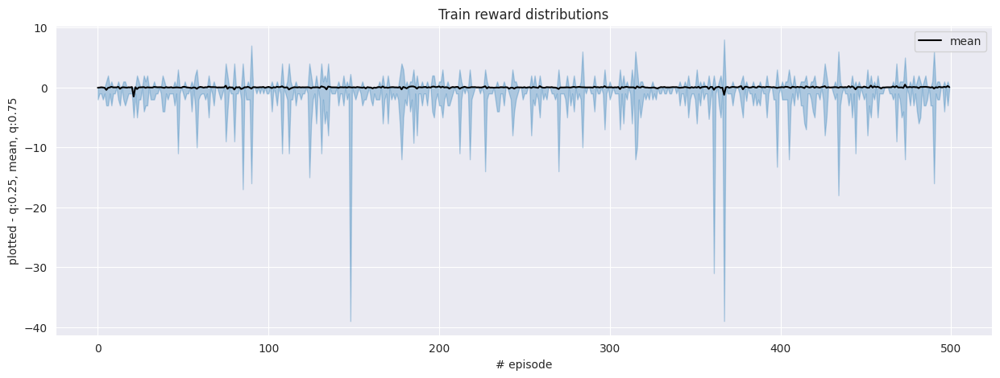

In [20]:
plot_graph(r3_list, 'Train reward distributions', skip = True)

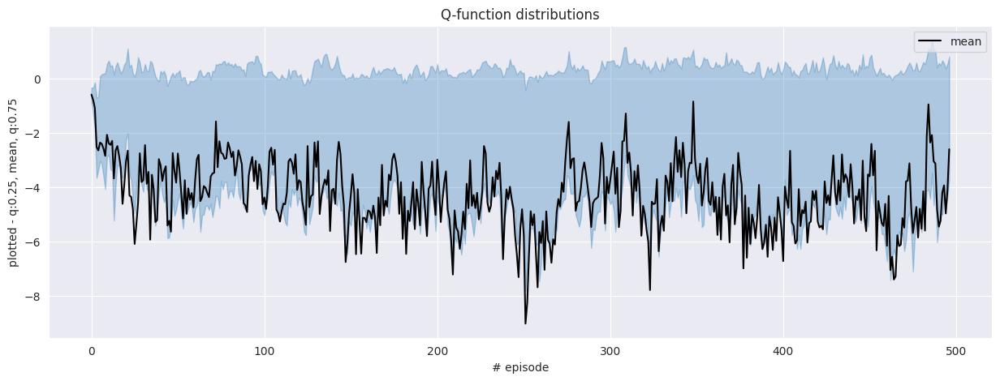

In [21]:
plot_graph(r1_list, 'Q-function distributions', skip = True)

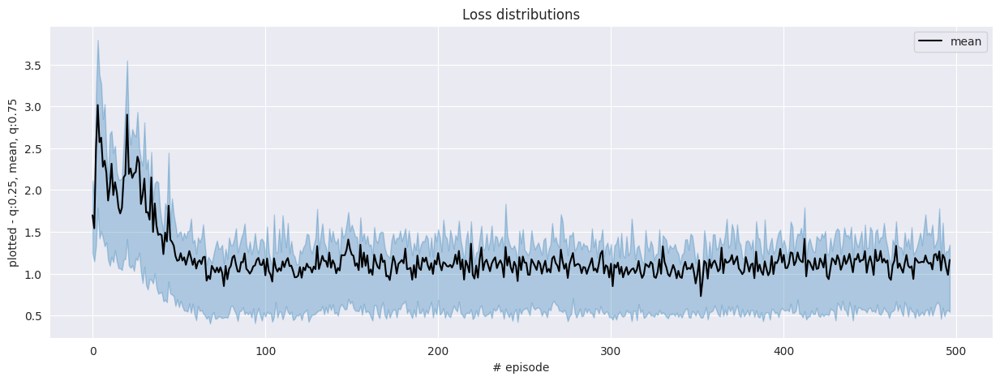

In [22]:
plot_graph(r2_list, 'Loss distributions', skip = True)

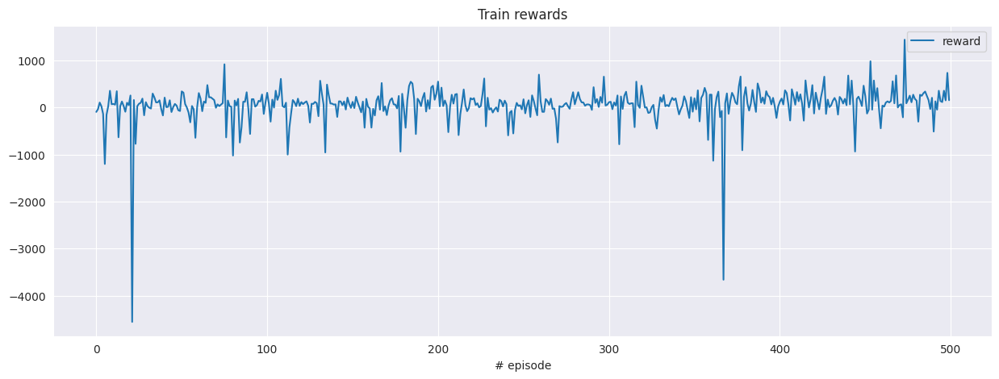

In [23]:
plot_rs(r4_list, 'Train rewards')

In [24]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)

In [25]:
l1_r, l2_r = [], []

test_agent(agent, env)

  1%|          | 1/100 [00:05<09:48,  5.95s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


  3%|▎         | 3/100 [00:18<09:44,  6.03s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  5%|▌         | 5/100 [00:30<09:36,  6.06s/it]

[[9994    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


  6%|▌         | 6/100 [00:36<09:37,  6.14s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  7%|▋         | 7/100 [00:42<09:37,  6.21s/it]

[[10025     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-2


  8%|▊         | 8/100 [00:49<09:32,  6.22s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


  9%|▉         | 9/100 [00:55<09:26,  6.22s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 10%|█         | 10/100 [01:01<09:20,  6.23s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 11%|█         | 11/100 [01:08<09:27,  6.38s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 12%|█▏        | 12/100 [01:14<09:11,  6.26s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 13%|█▎        | 13/100 [01:21<09:22,  6.46s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 14%|█▍        | 14/100 [01:27<09:07,  6.37s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 15%|█▌        | 15/100 [01:33<09:05,  6.42s/it]

[[9995    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 16%|█▌        | 16/100 [01:40<08:56,  6.39s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 17%|█▋        | 17/100 [01:46<08:59,  6.50s/it]

[[9980    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 18%|█▊        | 18/100 [01:53<08:54,  6.52s/it]

[[9976    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-8


 19%|█▉        | 19/100 [01:59<08:36,  6.37s/it]

[[9931    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 20%|██        | 20/100 [02:05<08:26,  6.33s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 21%|██        | 21/100 [02:12<08:21,  6.35s/it]

[[9976    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-3


 22%|██▏       | 22/100 [02:18<08:11,  6.30s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 23%|██▎       | 23/100 [02:24<08:06,  6.31s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 24%|██▍       | 24/100 [02:31<08:00,  6.33s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 25%|██▌       | 25/100 [02:37<07:48,  6.25s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -13]]
0
-1


 26%|██▌       | 26/100 [02:43<07:38,  6.20s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 27%|██▋       | 27/100 [02:49<07:35,  6.24s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 28%|██▊       | 28/100 [02:56<07:46,  6.49s/it]

[[9931    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 29%|██▉       | 29/100 [03:03<07:43,  6.53s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 30%|███       | 30/100 [03:09<07:34,  6.50s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 31%|███       | 31/100 [03:15<07:14,  6.30s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-2


 32%|███▏      | 32/100 [03:21<07:08,  6.31s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 33%|███▎      | 33/100 [03:28<07:13,  6.48s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 34%|███▍      | 34/100 [03:34<07:02,  6.40s/it]

[[9922    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 35%|███▌      | 35/100 [03:41<06:53,  6.36s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 36%|███▌      | 36/100 [03:47<06:51,  6.42s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 38%|███▊      | 38/100 [04:00<06:29,  6.28s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 39%|███▉      | 39/100 [04:06<06:26,  6.34s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0  -13   -3]]
0
-3


 40%|████      | 40/100 [04:12<06:20,  6.34s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 41%|████      | 41/100 [04:19<06:13,  6.33s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 42%|████▏     | 42/100 [04:25<06:12,  6.42s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 43%|████▎     | 43/100 [04:31<06:01,  6.35s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 44%|████▍     | 44/100 [04:38<05:58,  6.41s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 45%|████▌     | 45/100 [04:44<05:46,  6.30s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 46%|████▌     | 46/100 [04:51<05:44,  6.38s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 47%|████▋     | 47/100 [04:57<05:32,  6.27s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 49%|████▉     | 49/100 [05:08<05:11,  6.10s/it]

[[9993    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 50%|█████     | 50/100 [05:15<05:05,  6.11s/it]

[[9989    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 51%|█████     | 51/100 [05:21<04:56,  6.06s/it]

[[10000     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 52%|█████▏    | 52/100 [05:27<04:52,  6.10s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 53%|█████▎    | 53/100 [05:33<04:47,  6.11s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 54%|█████▍    | 54/100 [05:39<04:40,  6.09s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 55%|█████▌    | 55/100 [05:45<04:34,  6.10s/it]

[[10005     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1


 56%|█████▌    | 56/100 [05:51<04:29,  6.11s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 57%|█████▋    | 57/100 [05:57<04:24,  6.15s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -3   -5]]
0
-2


 59%|█████▉    | 59/100 [06:10<04:13,  6.17s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 60%|██████    | 60/100 [06:16<04:08,  6.21s/it]

[[9980    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 62%|██████▏   | 62/100 [06:29<03:56,  6.22s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 63%|██████▎   | 63/100 [06:35<03:58,  6.44s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-9


 64%|██████▍   | 64/100 [06:41<03:46,  6.29s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-5


 66%|██████▌   | 66/100 [06:54<03:32,  6.25s/it]

[[9980    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 67%|██████▋   | 67/100 [07:00<03:28,  6.31s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 69%|██████▉   | 69/100 [07:13<03:13,  6.24s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 70%|███████   | 70/100 [07:19<03:06,  6.22s/it]

[[9934    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 71%|███████   | 71/100 [07:25<02:58,  6.17s/it]

[[9915    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 72%|███████▏  | 72/100 [07:31<02:53,  6.19s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 73%|███████▎  | 73/100 [07:37<02:47,  6.21s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 74%|███████▍  | 74/100 [07:44<02:42,  6.27s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 75%|███████▌  | 75/100 [07:50<02:35,  6.21s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -4   -5]]
0
-2


 76%|███████▌  | 76/100 [07:56<02:31,  6.31s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 77%|███████▋  | 77/100 [08:03<02:27,  6.40s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -8]]
0
-4


 78%|███████▊  | 78/100 [08:09<02:19,  6.35s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 79%|███████▉  | 79/100 [08:15<02:11,  6.28s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 80%|████████  | 80/100 [08:21<02:04,  6.23s/it]

[[9931    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 81%|████████  | 81/100 [08:28<01:57,  6.20s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-5


 82%|████████▏ | 82/100 [08:34<01:52,  6.22s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 84%|████████▍ | 84/100 [08:46<01:40,  6.27s/it]

[[9912    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 85%|████████▌ | 85/100 [08:53<01:33,  6.21s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 87%|████████▋ | 87/100 [09:05<01:19,  6.14s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 88%|████████▊ | 88/100 [09:11<01:13,  6.12s/it]

[[9983    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 89%|████████▉ | 89/100 [09:17<01:07,  6.09s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 90%|█████████ | 90/100 [09:23<01:00,  6.09s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 91%|█████████ | 91/100 [09:29<00:54,  6.09s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 92%|█████████▏| 92/100 [09:35<00:49,  6.23s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-5


 93%|█████████▎| 93/100 [09:41<00:42,  6.13s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 94%|█████████▍| 94/100 [09:48<00:36,  6.14s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5
[[9945    0    0    0    0    1    1    1    1    1    1]
 [  -5    0    0    0    0    0    0    0    0    0    0]]
-5
1


 95%|█████████▌| 95/100 [09:54<00:30,  6.14s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 96%|█████████▌| 96/100 [10:00<00:24,  6.09s/it]

[[10004     0     0     0     0     0     0     0     0     0     0]
 [   -8     0     0     0     0     0     0     0    -3    -4    -3]]
0
-1


 97%|█████████▋| 97/100 [10:06<00:18,  6.19s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -13]]
0
-1


 98%|█████████▊| 98/100 [10:12<00:12,  6.22s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 99%|█████████▉| 99/100 [10:18<00:06,  6.16s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


100%|██████████| 100/100 [10:24<00:00,  6.25s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -12]]
0
-6
done


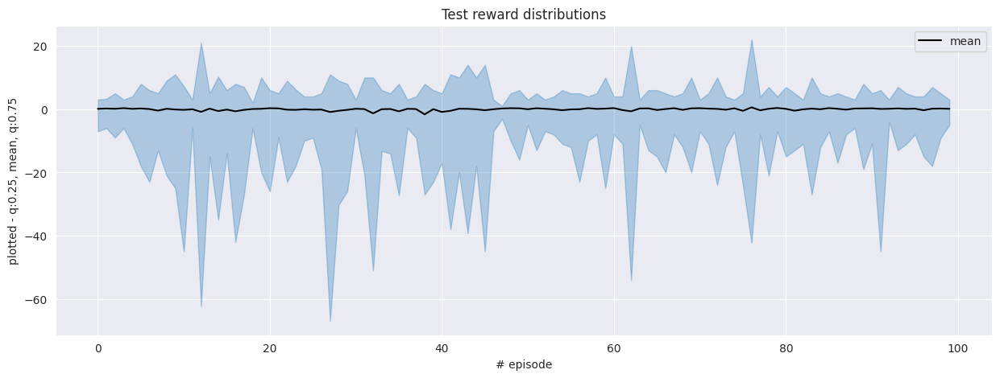

In [26]:
plot_graph(l1_r, 'Test reward distributions')

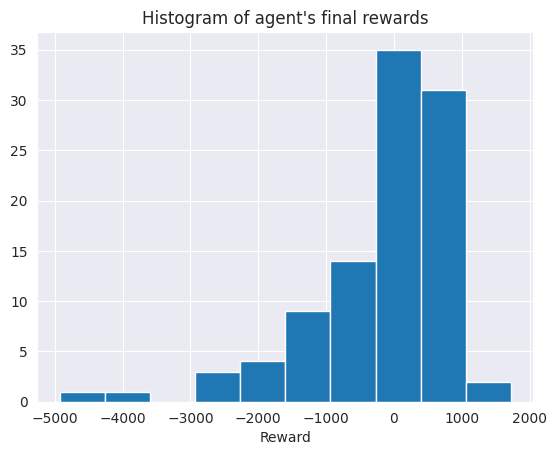

In [27]:
plot_hist(l2_r)

In [28]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

In [124]:
results('DDQN', ['v1', 'v2', 'v3', 'v4'])

v1 mean is 716.04
v2 mean is -2247.16
v3 mean is 149.33
v4 mean is -136.96
rd mean is -5.180127240676601
H0: 2 independent samples have identical average values


,categ1,categ2,tstat,pvalue
0,v1,v2,7.910363,1.052654e-12
1,v1,v3,3.967151,1.228776e-04
2,v1,v4,4.927689,1.810303e-06
3,v1,rd,5.317478,6.315228e-07
4,v2,v3,-6.796408,7.235365e-10
5,v2,v4,-5.766926,6.612468e-08
6,v2,rd,-6.410252,4.922262e-09
7,v3,v4,2.421633,1.677979e-02
8,v3,rd,3.148919,2.081384e-03
9,v4,rd,-1.204681,2.311051e-01


# A2C

In [17]:
agent_str = 'A2C'

In [18]:
%%capture
!mkdir -p "rl_hse/$agent_str"

## V1

In [19]:
type = 'v1'

- GAE: no

In [20]:
agent = return_a2c(False)

In [21]:
r1_list, r2_list, r3_list, r4_list, r5_list, r6_list, r7_list = [], [], [], [], [], [], []         

train_agent(agent, env, train_a2c)

  0%|          | 2/500 [00:20<1:24:08, 10.14s/it]

[[10008     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  1%|          | 3/500 [00:31<1:26:55, 10.49s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


  1%|          | 5/500 [00:51<1:25:05, 10.32s/it]

[[9968    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  1%|▏         | 7/500 [01:12<1:26:04, 10.48s/it]

[[9959    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  3%|▎         | 14/500 [02:24<1:22:44, 10.22s/it]

[[9935    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  3%|▎         | 15/500 [02:35<1:23:36, 10.34s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-3


  4%|▍         | 22/500 [03:48<1:22:56, 10.41s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  6%|▌         | 29/500 [05:00<1:21:10, 10.34s/it]

[[9951    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  7%|▋         | 34/500 [05:51<1:21:05, 10.44s/it]

[[9997    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  7%|▋         | 35/500 [06:02<1:21:50, 10.56s/it]

[[9990    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  7%|▋         | 37/500 [06:24<1:22:04, 10.64s/it]

[[9973    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9973    1    0    1    1    1    1    1    1    1    1]
 [  -1    0    0    0    0    0    0    0    0    0    0]]
-1
1


  8%|▊         | 38/500 [06:34<1:22:23, 10.70s/it]

[[10026     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


  8%|▊         | 39/500 [06:45<1:22:19, 10.71s/it]

[[10013     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  8%|▊         | 40/500 [06:56<1:22:25, 10.75s/it]

[[10023     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  8%|▊         | 41/500 [07:07<1:22:48, 10.83s/it]

[[10007     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  8%|▊         | 42/500 [07:18<1:22:27, 10.80s/it]

[[9985    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  9%|▊         | 43/500 [07:29<1:22:35, 10.84s/it]

[[9999    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5


  9%|▉         | 44/500 [07:39<1:21:25, 10.71s/it]

[[10024     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


  9%|▉         | 45/500 [07:50<1:21:31, 10.75s/it]

[[10014     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 13%|█▎        | 63/500 [10:54<1:14:25, 10.22s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 13%|█▎        | 64/500 [11:06<1:17:31, 10.67s/it]

[[9890    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-9


 13%|█▎        | 65/500 [11:18<1:19:49, 11.01s/it]

[[9905    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 13%|█▎        | 66/500 [11:30<1:22:08, 11.36s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 13%|█▎        | 67/500 [11:42<1:23:32, 11.58s/it]

[[9858    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 14%|█▎        | 68/500 [11:55<1:25:45, 11.91s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-11


 14%|█▍        | 69/500 [12:07<1:26:30, 12.04s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 14%|█▍        | 70/500 [12:19<1:25:54, 11.99s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 14%|█▍        | 71/500 [12:31<1:25:54, 12.01s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 14%|█▍        | 72/500 [12:43<1:26:18, 12.10s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 15%|█▍        | 73/500 [12:55<1:25:04, 11.96s/it]

[[9931    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 15%|█▍        | 74/500 [13:06<1:24:06, 11.85s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 15%|█▌        | 75/500 [13:18<1:23:28, 11.79s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-6


 15%|█▌        | 76/500 [13:30<1:22:53, 11.73s/it]

[[9839    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 15%|█▌        | 77/500 [13:42<1:23:15, 11.81s/it]

[[9874    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-3


 16%|█▌        | 78/500 [13:53<1:21:15, 11.55s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 16%|█▌        | 81/500 [14:24<1:16:09, 10.91s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 17%|█▋        | 84/500 [14:55<1:13:01, 10.53s/it]

[[9940    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 18%|█▊        | 92/500 [16:20<1:12:05, 10.60s/it]

[[9965    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 19%|█▉        | 95/500 [16:51<1:11:18, 10.56s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 20%|██        | 101/500 [17:54<1:10:07, 10.55s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 21%|██        | 104/500 [18:26<1:09:57, 10.60s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-12


 21%|██        | 106/500 [18:47<1:09:48, 10.63s/it]

[[10044     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 21%|██▏       | 107/500 [18:58<1:09:39, 10.63s/it]

[[9996    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 22%|██▏       | 110/500 [19:31<1:10:21, 10.82s/it]

[[10045     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-2


 22%|██▏       | 111/500 [19:42<1:10:26, 10.86s/it]

[[10009     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 23%|██▎       | 113/500 [20:03<1:10:15, 10.89s/it]

[[10043     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 25%|██▌       | 127/500 [22:32<1:05:39, 10.56s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 26%|██▌       | 128/500 [22:43<1:06:10, 10.67s/it]

[[10001     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 26%|██▌       | 131/500 [23:14<1:04:49, 10.54s/it]

[[9938    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 28%|██▊       | 141/500 [24:59<1:02:34, 10.46s/it]

[[9986    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 28%|██▊       | 142/500 [25:10<1:02:53, 10.54s/it]

[[10028     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 29%|██▉       | 144/500 [25:33<1:05:17, 11.00s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 29%|██▉       | 147/500 [26:05<1:03:44, 10.83s/it]

[[10026     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 30%|██▉       | 149/500 [26:26<1:02:32, 10.69s/it]

[[10012     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 31%|███       | 153/500 [27:09<1:01:48, 10.69s/it]

[[9951    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 31%|███       | 154/500 [27:19<1:01:19, 10.63s/it]

[[9958    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 32%|███▏      | 160/500 [28:23<1:00:34, 10.69s/it]

[[10017     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 34%|███▎      | 168/500 [29:48<58:06, 10.50s/it]

[[9952    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 39%|███▉      | 195/500 [34:31<53:35, 10.54s/it]

[[9974    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 43%|████▎     | 214/500 [37:48<49:43, 10.43s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 43%|████▎     | 215/500 [38:00<51:04, 10.75s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 43%|████▎     | 216/500 [38:11<51:28, 10.87s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 43%|████▎     | 217/500 [38:22<51:18, 10.88s/it]

[[9997    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 44%|████▎     | 218/500 [38:34<52:39, 11.20s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 44%|████▍     | 219/500 [38:47<55:24, 11.83s/it]

[[9892    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 44%|████▍     | 220/500 [38:59<55:20, 11.86s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-10


 44%|████▍     | 221/500 [39:12<56:11, 12.08s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 44%|████▍     | 222/500 [39:23<55:07, 11.90s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -6   -5]]
0
-6


 45%|████▍     | 223/500 [39:35<54:23, 11.78s/it]

[[9893    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-6


 45%|████▍     | 224/500 [39:46<53:37, 11.66s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 45%|████▌     | 225/500 [39:58<53:53, 11.76s/it]

[[9917    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -23]]
0
-5


 45%|████▌     | 226/500 [40:10<53:54, 11.81s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 45%|████▌     | 227/500 [40:21<53:12, 11.69s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 46%|████▌     | 228/500 [40:33<52:27, 11.57s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 46%|████▌     | 229/500 [40:44<52:14, 11.57s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 46%|████▌     | 230/500 [40:56<52:21, 11.63s/it]

[[9915    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 46%|████▌     | 231/500 [41:07<51:50, 11.56s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 46%|████▋     | 232/500 [41:18<50:42, 11.35s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-2


 47%|████▋     | 233/500 [41:30<50:53, 11.43s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 47%|████▋     | 234/500 [41:41<50:39, 11.43s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 47%|████▋     | 235/500 [41:52<49:53, 11.30s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-7


 47%|████▋     | 236/500 [42:03<49:43, 11.30s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1
[[9920    0    0    0    0    0    0    0    0    0    0]
 [  -4    0    0    0   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 47%|████▋     | 237/500 [42:16<50:44, 11.58s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 48%|████▊     | 238/500 [42:26<49:25, 11.32s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-7


 48%|████▊     | 239/500 [42:38<49:33, 11.39s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 48%|████▊     | 240/500 [42:49<48:16, 11.14s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -12]]
0
-1


 48%|████▊     | 241/500 [43:00<48:00, 11.12s/it]

[[9898    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 48%|████▊     | 242/500 [43:11<48:07, 11.19s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1
[[9983    0    0    0    0    0    0    0    0    0    0]
 [  -2    0   -1   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 49%|████▊     | 243/500 [43:22<47:49, 11.17s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 49%|████▉     | 244/500 [43:33<47:22, 11.10s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 49%|████▉     | 245/500 [43:45<47:48, 11.25s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 49%|████▉     | 246/500 [43:56<47:53, 11.31s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0  -17  -12]]
0
-1


 49%|████▉     | 247/500 [44:07<47:38, 11.30s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 50%|████▉     | 248/500 [44:18<47:04, 11.21s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 50%|████▉     | 249/500 [44:30<47:04, 11.25s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 50%|█████     | 250/500 [44:41<47:13, 11.33s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 50%|█████     | 251/500 [44:53<47:22, 11.42s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 50%|█████     | 252/500 [45:04<46:30, 11.25s/it]

[[9888    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 51%|█████     | 253/500 [45:16<47:05, 11.44s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 51%|█████     | 254/500 [45:27<46:29, 11.34s/it]

[[9912    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 51%|█████     | 255/500 [45:38<45:45, 11.21s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 51%|█████     | 256/500 [45:49<45:53, 11.28s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6


 51%|█████▏    | 257/500 [46:00<45:15, 11.17s/it]

[[9959    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 52%|█████▏    | 258/500 [46:11<45:27, 11.27s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 52%|█████▏    | 259/500 [46:23<45:54, 11.43s/it]

[[9889    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 52%|█████▏    | 260/500 [46:35<46:05, 11.52s/it]

[[9977    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 52%|█████▏    | 261/500 [46:46<45:30, 11.42s/it]

[[9897    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 52%|█████▏    | 262/500 [46:58<45:34, 11.49s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-22
[[9950    0    1    1    1    1    1    1    1    1    1]
 [  -2    0    0    0    0    0    0    0    0    0    0]]
-2
1


 53%|█████▎    | 263/500 [47:09<45:24, 11.50s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 53%|█████▎    | 264/500 [47:21<45:05, 11.46s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 53%|█████▎    | 265/500 [47:33<45:23, 11.59s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 53%|█████▎    | 266/500 [47:44<44:27, 11.40s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1
[[9927    0    0    0    1    1    1    1    1    1    1]
 [  -4    0    0    0    0    0    0    0    0    0    0]]
-4
1


 53%|█████▎    | 267/500 [47:55<43:57, 11.32s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 54%|█████▎    | 268/500 [48:06<43:19, 11.20s/it]

[[9893    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 54%|█████▍    | 269/500 [48:17<43:05, 11.19s/it]

[[9919    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 54%|█████▍    | 270/500 [48:28<42:54, 11.19s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 54%|█████▍    | 271/500 [48:39<42:49, 11.22s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 54%|█████▍    | 272/500 [48:51<43:34, 11.47s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 55%|█████▍    | 273/500 [49:03<43:30, 11.50s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 55%|█████▍    | 274/500 [49:14<43:14, 11.48s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 55%|█████▌    | 275/500 [49:26<43:24, 11.58s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 55%|█████▌    | 276/500 [49:37<42:37, 11.42s/it]

[[9877    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -5   -6]]
0
-5


 55%|█████▌    | 277/500 [49:48<42:10, 11.35s/it]

[[9976    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 56%|█████▌    | 278/500 [50:00<42:21, 11.45s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 56%|█████▌    | 279/500 [50:11<41:44, 11.33s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 56%|█████▌    | 280/500 [50:22<41:23, 11.29s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-2


 56%|█████▌    | 281/500 [50:34<41:26, 11.35s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 56%|█████▋    | 282/500 [50:45<41:11, 11.34s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 57%|█████▋    | 283/500 [50:56<40:27, 11.19s/it]

[[9879    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 57%|█████▋    | 284/500 [51:08<41:19, 11.48s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 57%|█████▋    | 285/500 [51:20<41:12, 11.50s/it]

[[9856    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -6   -8]]
0
-8


 57%|█████▋    | 286/500 [51:30<40:18, 11.30s/it]

[[9903    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 57%|█████▋    | 287/500 [51:42<40:06, 11.30s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 58%|█████▊    | 288/500 [51:53<39:58, 11.31s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 58%|█████▊    | 289/500 [52:04<39:14, 11.16s/it]

[[9871    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-1


 58%|█████▊    | 290/500 [52:16<40:15, 11.50s/it]

[[9864    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-7


 58%|█████▊    | 291/500 [52:27<39:34, 11.36s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-2


 58%|█████▊    | 292/500 [52:38<39:11, 11.30s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 59%|█████▊    | 293/500 [52:50<38:47, 11.24s/it]

[[9922    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 59%|█████▉    | 294/500 [53:01<38:49, 11.31s/it]

[[9893    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 59%|█████▉    | 295/500 [53:13<38:58, 11.41s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 59%|█████▉    | 296/500 [53:24<38:57, 11.46s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 59%|█████▉    | 297/500 [53:36<39:35, 11.70s/it]

[[9888    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-5


 60%|█████▉    | 298/500 [53:49<39:46, 11.81s/it]

[[9888    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3


 60%|█████▉    | 299/500 [54:01<39:44, 11.87s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 60%|██████    | 300/500 [54:12<39:17, 11.79s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 60%|██████    | 301/500 [54:24<39:33, 11.93s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 60%|██████    | 302/500 [54:36<39:08, 11.86s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 61%|██████    | 303/500 [54:48<38:47, 11.82s/it]

[[9889    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 61%|██████    | 304/500 [54:59<38:04, 11.65s/it]

[[9876    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 61%|██████    | 305/500 [55:11<37:43, 11.61s/it]

[[9905    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 61%|██████    | 306/500 [55:22<37:47, 11.69s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 61%|██████▏   | 307/500 [55:35<38:02, 11.82s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 62%|██████▏   | 308/500 [55:47<38:10, 11.93s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 62%|██████▏   | 309/500 [55:59<38:21, 12.05s/it]

[[9910    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 62%|██████▏   | 310/500 [56:11<38:25, 12.13s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 62%|██████▏   | 311/500 [56:23<37:46, 11.99s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 62%|██████▏   | 312/500 [56:34<36:54, 11.78s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 63%|██████▎   | 313/500 [56:45<36:03, 11.57s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 63%|██████▎   | 314/500 [56:57<35:44, 11.53s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 63%|██████▎   | 315/500 [57:08<35:31, 11.52s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 63%|██████▎   | 316/500 [57:20<35:07, 11.45s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 63%|██████▎   | 317/500 [57:31<35:01, 11.48s/it]

[[9907    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 64%|██████▎   | 318/500 [57:43<35:12, 11.61s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-5


 64%|██████▍   | 319/500 [57:55<34:57, 11.59s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 64%|██████▍   | 320/500 [58:06<34:29, 11.49s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-6


 64%|██████▍   | 321/500 [58:17<34:00, 11.40s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 64%|██████▍   | 322/500 [58:29<34:31, 11.64s/it]

[[9900    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 65%|██████▍   | 323/500 [58:41<34:17, 11.62s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 65%|██████▍   | 324/500 [58:53<34:29, 11.76s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 65%|██████▌   | 325/500 [59:05<34:29, 11.82s/it]

[[9876    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-5


 65%|██████▌   | 326/500 [59:18<34:57, 12.05s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 65%|██████▌   | 327/500 [59:30<34:56, 12.12s/it]

[[9901    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 66%|██████▌   | 328/500 [59:42<35:11, 12.28s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 66%|██████▌   | 329/500 [59:54<34:31, 12.11s/it]

[[9890    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-10


 66%|██████▌   | 330/500 [1:00:06<34:01, 12.01s/it]

[[9912    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-11


 66%|██████▌   | 331/500 [1:00:18<33:40, 11.96s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 66%|██████▋   | 332/500 [1:00:29<32:45, 11.70s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 67%|██████▋   | 333/500 [1:00:41<33:16, 11.95s/it]

[[9875    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 67%|██████▋   | 334/500 [1:00:53<32:34, 11.77s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 67%|██████▋   | 335/500 [1:01:05<32:45, 11.91s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 67%|██████▋   | 336/500 [1:01:16<32:01, 11.72s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 67%|██████▋   | 337/500 [1:01:27<31:12, 11.49s/it]

[[9880    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 68%|██████▊   | 338/500 [1:01:38<30:43, 11.38s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-12


 68%|██████▊   | 339/500 [1:01:51<31:11, 11.63s/it]

[[9964    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 68%|██████▊   | 340/500 [1:02:02<30:33, 11.46s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 68%|██████▊   | 341/500 [1:02:13<30:37, 11.56s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-3


 68%|██████▊   | 342/500 [1:02:25<30:35, 11.62s/it]

[[9917    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 69%|██████▊   | 343/500 [1:02:36<29:59, 11.46s/it]

[[9898    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 69%|██████▉   | 344/500 [1:02:48<30:10, 11.61s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 69%|██████▉   | 345/500 [1:03:00<30:08, 11.67s/it]

[[9891    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-2


 69%|██████▉   | 346/500 [1:03:12<29:53, 11.65s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 69%|██████▉   | 347/500 [1:03:23<29:40, 11.64s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 70%|██████▉   | 348/500 [1:03:35<29:11, 11.52s/it]

[[9875    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 70%|██████▉   | 349/500 [1:03:47<29:39, 11.78s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-2


 70%|███████   | 350/500 [1:03:59<29:30, 11.80s/it]

[[9875    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 70%|███████   | 351/500 [1:04:10<28:55, 11.65s/it]

[[9870    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 70%|███████   | 352/500 [1:04:21<28:14, 11.45s/it]

[[9915    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 71%|███████   | 353/500 [1:04:32<27:47, 11.34s/it]

[[9905    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 71%|███████   | 354/500 [1:04:43<27:36, 11.35s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 71%|███████   | 355/500 [1:04:55<27:41, 11.46s/it]

[[9883    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 71%|███████   | 356/500 [1:05:06<27:09, 11.31s/it]

[[9901    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 71%|███████▏  | 357/500 [1:05:18<26:59, 11.32s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 72%|███████▏  | 358/500 [1:05:29<26:44, 11.30s/it]

[[9904    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 72%|███████▏  | 359/500 [1:05:40<26:40, 11.35s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1
[[9962    1    1    1    7    1    1    1    1    1    1]
 [  -1    0    0    0    0    0    0    0    0    0    0]]
-1
1


 72%|███████▏  | 360/500 [1:05:52<26:35, 11.39s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 72%|███████▏  | 361/500 [1:06:03<26:22, 11.39s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 72%|███████▏  | 362/500 [1:06:14<25:57, 11.28s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 73%|███████▎  | 363/500 [1:06:26<26:11, 11.47s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 73%|███████▎  | 364/500 [1:06:37<25:42, 11.34s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -7]]
0
-4


 73%|███████▎  | 365/500 [1:06:49<25:38, 11.39s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-8


 73%|███████▎  | 366/500 [1:07:00<25:24, 11.38s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -3   -2]]
0
-5


 73%|███████▎  | 367/500 [1:07:12<25:46, 11.63s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-5


 74%|███████▎  | 368/500 [1:07:24<25:32, 11.61s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 74%|███████▍  | 369/500 [1:07:35<25:20, 11.60s/it]

[[9915    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -15]]
0
-3


 74%|███████▍  | 370/500 [1:07:46<24:39, 11.38s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 74%|███████▍  | 371/500 [1:07:57<24:18, 11.31s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 74%|███████▍  | 372/500 [1:08:08<24:01, 11.27s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4


 75%|███████▍  | 373/500 [1:08:20<24:05, 11.38s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-6


 75%|███████▍  | 374/500 [1:08:31<23:52, 11.37s/it]

[[9934    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 75%|███████▌  | 375/500 [1:08:43<24:00, 11.52s/it]

[[9880    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 75%|███████▌  | 376/500 [1:08:54<23:30, 11.37s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 75%|███████▌  | 377/500 [1:09:05<22:55, 11.18s/it]

[[9857    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 76%|███████▌  | 378/500 [1:09:16<22:38, 11.13s/it]

[[9896    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 76%|███████▌  | 379/500 [1:09:27<22:24, 11.11s/it]

[[9876    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 76%|███████▌  | 380/500 [1:09:38<22:18, 11.16s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-6


 76%|███████▌  | 381/500 [1:09:50<22:14, 11.22s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 76%|███████▋  | 382/500 [1:10:01<22:06, 11.24s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2


 77%|███████▋  | 383/500 [1:10:13<22:03, 11.31s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 77%|███████▋  | 384/500 [1:10:24<22:08, 11.45s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-2


 77%|███████▋  | 385/500 [1:10:37<22:24, 11.69s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 77%|███████▋  | 386/500 [1:10:49<22:50, 12.02s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 77%|███████▋  | 387/500 [1:11:01<22:38, 12.02s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-8


 78%|███████▊  | 388/500 [1:11:13<22:09, 11.87s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 78%|███████▊  | 389/500 [1:11:25<22:12, 12.01s/it]

[[9893    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 78%|███████▊  | 390/500 [1:11:37<21:47, 11.89s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 78%|███████▊  | 391/500 [1:11:49<21:36, 11.89s/it]

[[9948    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 78%|███████▊  | 392/500 [1:12:00<21:13, 11.79s/it]

[[9910    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 79%|███████▊  | 393/500 [1:12:12<20:53, 11.72s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 79%|███████▉  | 394/500 [1:12:23<20:21, 11.52s/it]

[[9852    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 79%|███████▉  | 395/500 [1:12:34<19:56, 11.39s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 79%|███████▉  | 396/500 [1:12:46<19:49, 11.44s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -2]]
0
-5


 79%|███████▉  | 397/500 [1:12:57<19:40, 11.46s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 80%|███████▉  | 398/500 [1:13:08<19:10, 11.28s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 80%|███████▉  | 399/500 [1:13:19<19:04, 11.33s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 80%|████████  | 400/500 [1:13:31<18:59, 11.40s/it]

[[9903    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 80%|████████  | 401/500 [1:13:42<18:44, 11.35s/it]

[[9934    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-11


 80%|████████  | 402/500 [1:13:54<18:31, 11.34s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 81%|████████  | 403/500 [1:14:05<18:20, 11.35s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 81%|████████  | 404/500 [1:14:16<18:14, 11.40s/it]

[[9934    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 81%|████████  | 405/500 [1:14:28<18:02, 11.39s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-13


 81%|████████  | 406/500 [1:14:39<17:52, 11.40s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2


 81%|████████▏ | 407/500 [1:14:51<17:52, 11.53s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 82%|████████▏ | 408/500 [1:15:02<17:20, 11.31s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -5   -3]]
0
-5


 82%|████████▏ | 409/500 [1:15:13<16:59, 11.20s/it]

[[9864    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 82%|████████▏ | 410/500 [1:15:24<16:55, 11.28s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 82%|████████▏ | 411/500 [1:15:35<16:36, 11.20s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-8


 82%|████████▏ | 412/500 [1:15:47<16:45, 11.43s/it]

[[9880    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 83%|████████▎ | 413/500 [1:15:58<16:25, 11.33s/it]

[[9898    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 83%|████████▎ | 414/500 [1:16:10<16:14, 11.33s/it]

[[9910    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 83%|████████▎ | 415/500 [1:16:20<15:50, 11.18s/it]

[[9888    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 83%|████████▎ | 416/500 [1:16:32<15:41, 11.20s/it]

[[9887    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 83%|████████▎ | 417/500 [1:16:43<15:41, 11.34s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-9


 84%|████████▎ | 418/500 [1:16:55<15:40, 11.47s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 84%|████████▍ | 419/500 [1:17:06<15:23, 11.40s/it]

[[9862    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-3


 84%|████████▍ | 420/500 [1:17:18<15:18, 11.48s/it]

[[9889    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 84%|████████▍ | 421/500 [1:17:30<15:06, 11.48s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-8


 84%|████████▍ | 422/500 [1:17:40<14:42, 11.31s/it]

[[9893    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 85%|████████▍ | 423/500 [1:17:52<14:46, 11.51s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-6


 85%|████████▍ | 424/500 [1:18:05<14:50, 11.72s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 85%|████████▌ | 425/500 [1:18:16<14:23, 11.51s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 85%|████████▌ | 426/500 [1:18:27<14:09, 11.48s/it]

[[9910    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 85%|████████▌ | 427/500 [1:18:39<14:01, 11.53s/it]

[[9947    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-4


 86%|████████▌ | 428/500 [1:18:51<13:59, 11.67s/it]

[[9903    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -5   -3]]
0
-2


 86%|████████▌ | 429/500 [1:19:03<13:54, 11.76s/it]

[[9901    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 86%|████████▌ | 430/500 [1:19:14<13:24, 11.49s/it]

[[9887    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 86%|████████▌ | 431/500 [1:19:24<12:59, 11.30s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 86%|████████▋ | 432/500 [1:19:36<12:49, 11.31s/it]

[[9907    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-7


 87%|████████▋ | 433/500 [1:19:47<12:36, 11.29s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 87%|████████▋ | 434/500 [1:19:58<12:19, 11.21s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-5


 87%|████████▋ | 435/500 [1:20:09<12:05, 11.15s/it]

[[9890    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1
[[9891    0    0    1    1    1    1    1    1    1    1]
 [  -3    0    0    0    0    0    0    0    0    0    0]]
-3
1


 87%|████████▋ | 436/500 [1:20:20<11:49, 11.09s/it]

[[9892    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 87%|████████▋ | 437/500 [1:20:31<11:35, 11.04s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 88%|████████▊ | 438/500 [1:20:42<11:32, 11.17s/it]

[[9857    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 88%|████████▊ | 439/500 [1:20:54<11:23, 11.20s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 88%|████████▊ | 440/500 [1:21:05<11:13, 11.22s/it]

[[9892    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 88%|████████▊ | 441/500 [1:21:16<11:03, 11.24s/it]

[[9883    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -5]]
0
-7


 88%|████████▊ | 442/500 [1:21:27<10:45, 11.13s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-10


 89%|████████▊ | 443/500 [1:21:38<10:35, 11.15s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 89%|████████▉ | 444/500 [1:21:50<10:26, 11.20s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 89%|████████▉ | 445/500 [1:22:01<10:24, 11.35s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 89%|████████▉ | 446/500 [1:22:13<10:23, 11.55s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 89%|████████▉ | 447/500 [1:22:25<10:11, 11.53s/it]

[[9899    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 90%|████████▉ | 448/500 [1:22:36<10:00, 11.54s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 90%|████████▉ | 449/500 [1:22:48<09:46, 11.49s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 90%|█████████ | 450/500 [1:22:59<09:30, 11.41s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 90%|█████████ | 451/500 [1:23:10<09:15, 11.34s/it]

[[9880    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-2


 90%|█████████ | 452/500 [1:23:21<09:04, 11.35s/it]

[[9861    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-3


 91%|█████████ | 453/500 [1:23:33<08:51, 11.30s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 91%|█████████ | 454/500 [1:23:44<08:34, 11.19s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 91%|█████████ | 455/500 [1:23:55<08:22, 11.16s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 91%|█████████ | 456/500 [1:24:05<08:05, 11.05s/it]

[[9922    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 91%|█████████▏| 457/500 [1:24:17<07:56, 11.09s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 92%|█████████▏| 458/500 [1:24:27<07:37, 10.88s/it]

[[9861    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 92%|█████████▏| 459/500 [1:24:38<07:23, 10.82s/it]

[[9881    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 92%|█████████▏| 460/500 [1:24:49<07:16, 10.92s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-5


 92%|█████████▏| 461/500 [1:25:00<07:09, 11.01s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-7


 92%|█████████▏| 462/500 [1:25:11<06:59, 11.03s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 93%|█████████▎| 463/500 [1:25:23<06:53, 11.19s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 93%|█████████▎| 464/500 [1:25:34<06:39, 11.10s/it]

[[9927    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 93%|█████████▎| 465/500 [1:25:45<06:30, 11.16s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-8


 93%|█████████▎| 466/500 [1:25:56<06:18, 11.14s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-9


 93%|█████████▎| 467/500 [1:26:07<06:01, 10.95s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1
[[9910    1    1    1    4    1    1    1    1    1    1]
 [  -1    0    0    0    0    0    0    0    0    0    0]]
-1
1


 94%|█████████▎| 468/500 [1:26:17<05:48, 10.88s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-7


 94%|█████████▍| 469/500 [1:26:29<05:43, 11.08s/it]

[[9881    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 94%|█████████▍| 470/500 [1:26:40<05:32, 11.09s/it]

[[9888    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-4


 94%|█████████▍| 471/500 [1:26:51<05:24, 11.18s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 94%|█████████▍| 472/500 [1:27:03<05:21, 11.47s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-8


 95%|█████████▍| 473/500 [1:27:15<05:07, 11.40s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-2


 95%|█████████▍| 474/500 [1:27:26<04:55, 11.36s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 95%|█████████▌| 475/500 [1:27:37<04:43, 11.34s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 95%|█████████▌| 476/500 [1:27:48<04:28, 11.18s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 95%|█████████▌| 477/500 [1:28:00<04:21, 11.35s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-4
[[9936    0    1    3    0    1    1    1    1    1    1]
 [  -2    0    0    0    0    0    0    0    0    0    0]]
-2
1


 96%|█████████▌| 478/500 [1:28:11<04:05, 11.18s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 96%|█████████▌| 479/500 [1:28:22<03:55, 11.21s/it]

[[9882    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 96%|█████████▌| 480/500 [1:28:33<03:42, 11.14s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-7


 96%|█████████▌| 481/500 [1:28:43<03:28, 10.98s/it]

[[9881    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 96%|█████████▋| 482/500 [1:28:55<03:21, 11.17s/it]

[[9968    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 97%|█████████▋| 483/500 [1:29:07<03:12, 11.32s/it]

[[9919    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 97%|█████████▋| 484/500 [1:29:18<03:02, 11.39s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-5


 97%|█████████▋| 485/500 [1:29:29<02:49, 11.29s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 97%|█████████▋| 486/500 [1:29:41<02:40, 11.44s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 97%|█████████▋| 487/500 [1:29:52<02:28, 11.39s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 98%|█████████▊| 488/500 [1:30:03<02:13, 11.11s/it]

[[9934    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 98%|█████████▊| 489/500 [1:30:14<02:03, 11.19s/it]

[[9952    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2


 98%|█████████▊| 490/500 [1:30:25<01:51, 11.12s/it]

[[9919    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 98%|█████████▊| 491/500 [1:30:37<01:40, 11.20s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-5


 98%|█████████▊| 492/500 [1:30:48<01:29, 11.22s/it]

[[9910    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-8


 99%|█████████▊| 493/500 [1:30:59<01:18, 11.25s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 99%|█████████▉| 494/500 [1:31:11<01:07, 11.30s/it]

[[9899    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 99%|█████████▉| 495/500 [1:31:22<00:56, 11.39s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 99%|█████████▉| 496/500 [1:31:33<00:45, 11.28s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4


 99%|█████████▉| 497/500 [1:31:45<00:33, 11.30s/it]

[[9899    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


100%|█████████▉| 498/500 [1:31:55<00:22, 11.09s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3


100%|█████████▉| 499/500 [1:32:06<00:11, 11.11s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -10]]
0
-1


100%|██████████| 500/500 [1:32:17<00:00, 11.08s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1
done


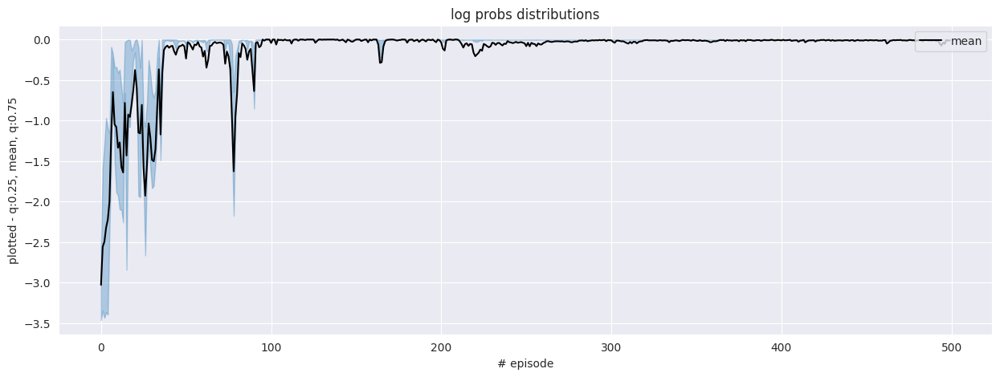

In [22]:
plot_graph(r1_list, 'log probs distributions')

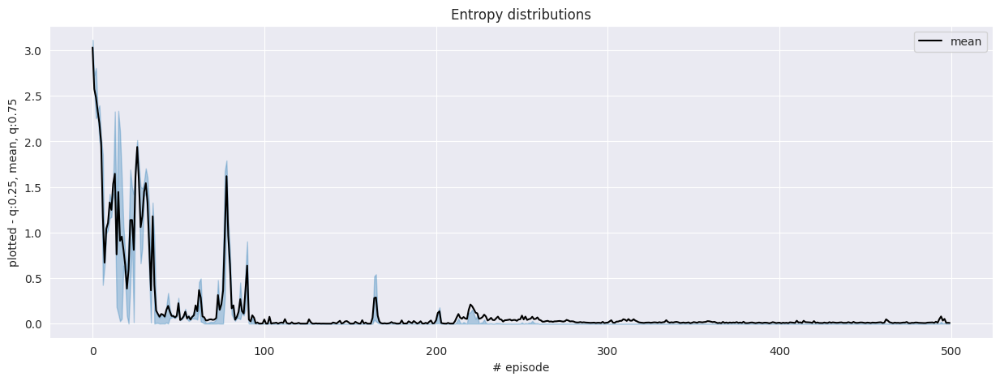

In [23]:
plot_graph(r2_list, 'Entropy distributions')

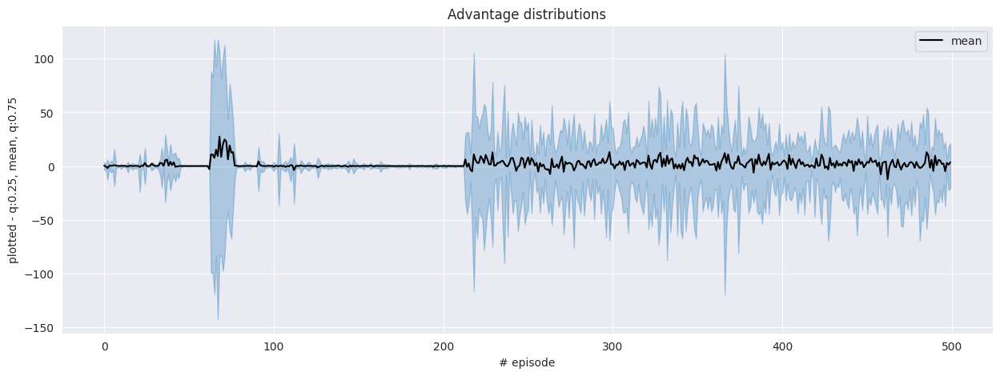

In [24]:
plot_graph(r3_list, 'Advantage distributions')

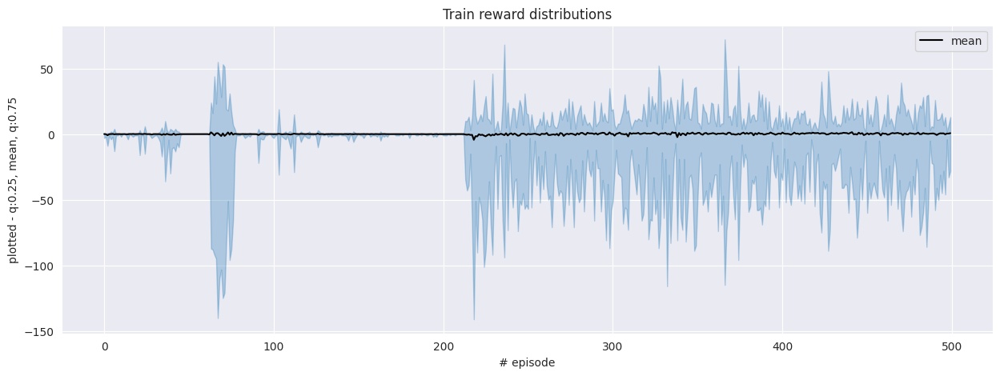

In [25]:
plot_graph(r4_list, 'Train reward distributions')

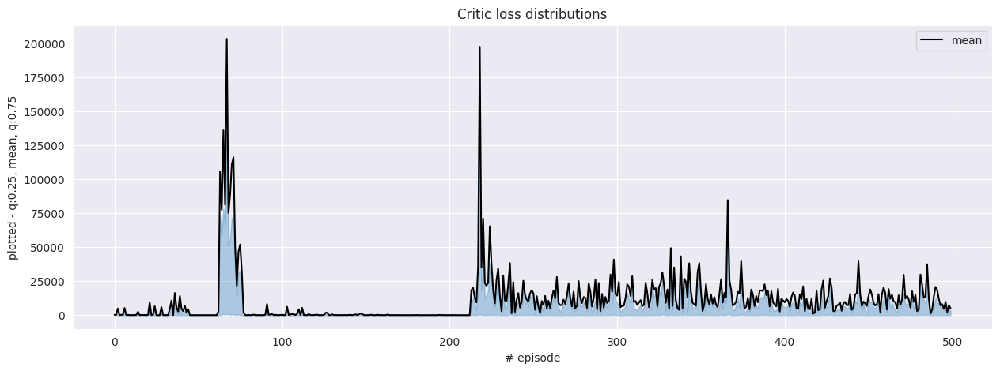

In [26]:
plot_graph(r6_list, 'Critic loss distributions')

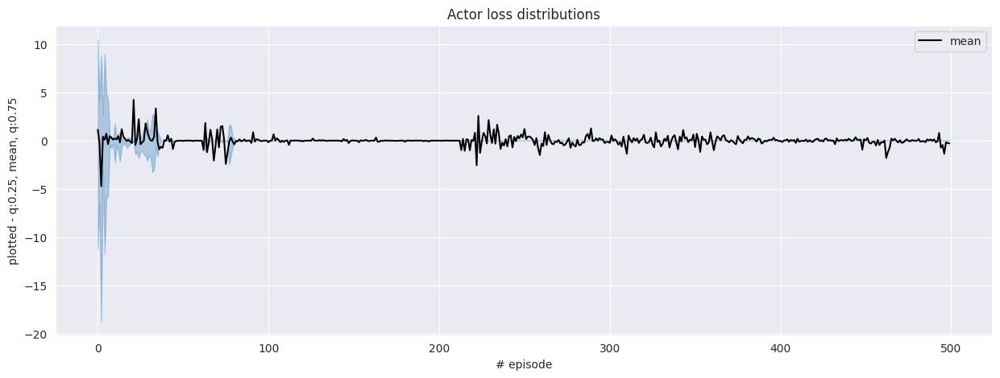

In [27]:
plot_graph(r7_list, 'Actor loss distributions')

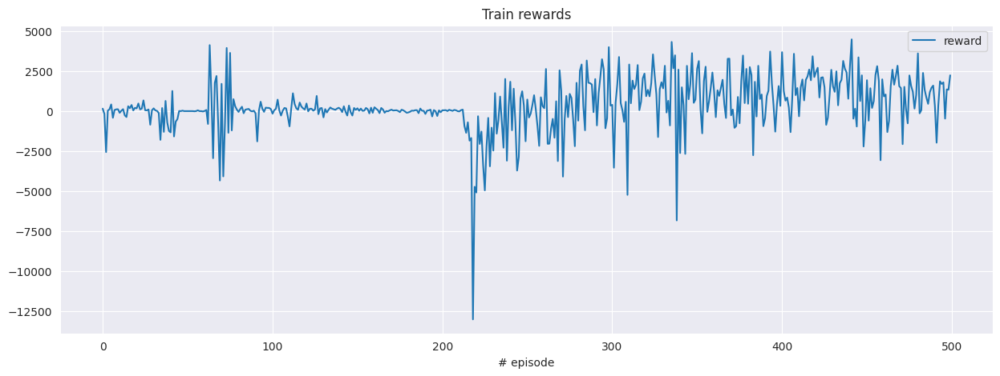

In [28]:
plot_rs(r5_list, 'Train rewards')

In [29]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)
up_pickle('r5_list.pkl', agent_str, type, r5_list)
up_pickle('r6_list.pkl', agent_str, type, r6_list)
up_pickle('r7_list.pkl', agent_str, type, r7_list)

In [30]:
l1_r, l2_r = [], []

test_agent(agent, env)

  1%|          | 1/100 [00:07<12:39,  7.67s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -3   -1]]
0
-9


  2%|▏         | 2/100 [00:15<12:33,  7.69s/it]

[[9874    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  3%|▎         | 3/100 [00:22<11:58,  7.41s/it]

[[9875    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


  4%|▍         | 4/100 [00:29<11:44,  7.34s/it]

[[9908    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


  5%|▌         | 5/100 [00:36<11:33,  7.30s/it]

[[9876    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  6%|▌         | 6/100 [00:44<11:34,  7.39s/it]

[[9884    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


  7%|▋         | 7/100 [00:51<11:27,  7.39s/it]

[[9889    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  8%|▊         | 8/100 [01:00<11:55,  7.78s/it]

[[9905    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -15]]
0
-1


  9%|▉         | 9/100 [01:07<11:34,  7.63s/it]

[[9890    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 10%|█         | 10/100 [01:15<11:25,  7.61s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-12


 11%|█         | 11/100 [01:22<11:03,  7.46s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-5


 12%|█▏        | 12/100 [01:30<11:04,  7.55s/it]

[[9879    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-5


 13%|█▎        | 13/100 [01:37<10:57,  7.56s/it]

[[9945    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 14%|█▍        | 14/100 [01:45<10:47,  7.53s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-9


 15%|█▌        | 15/100 [01:52<10:35,  7.48s/it]

[[9901    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 16%|█▌        | 16/100 [02:00<10:35,  7.56s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-1


 17%|█▋        | 17/100 [02:07<10:19,  7.47s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 18%|█▊        | 18/100 [02:15<10:15,  7.50s/it]

[[9879    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-4


 19%|█▉        | 19/100 [02:22<10:07,  7.51s/it]

[[9922    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 20%|██        | 20/100 [02:30<10:06,  7.59s/it]

[[9912    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-3


 21%|██        | 21/100 [02:37<09:43,  7.39s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 22%|██▏       | 22/100 [02:44<09:37,  7.40s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 23%|██▎       | 23/100 [02:52<09:37,  7.50s/it]

[[9874    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 24%|██▍       | 24/100 [03:00<09:35,  7.57s/it]

[[9908    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 25%|██▌       | 25/100 [03:07<09:24,  7.53s/it]

[[9898    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 26%|██▌       | 26/100 [03:15<09:12,  7.47s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 27%|██▋       | 27/100 [03:23<09:17,  7.63s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-2


 28%|██▊       | 28/100 [03:30<08:55,  7.44s/it]

[[9870    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 29%|██▉       | 29/100 [03:38<09:01,  7.63s/it]

[[9922    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-10


 30%|███       | 30/100 [03:45<08:56,  7.66s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 31%|███       | 31/100 [03:53<08:40,  7.54s/it]

[[9877    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-4


 32%|███▏      | 32/100 [04:00<08:31,  7.52s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 33%|███▎      | 33/100 [04:09<08:42,  7.80s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-3


 34%|███▍      | 34/100 [04:16<08:21,  7.59s/it]

[[9853    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6


 35%|███▌      | 35/100 [04:23<08:10,  7.55s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0  -12   -2]]
0
-4


 36%|███▌      | 36/100 [04:31<08:06,  7.60s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 37%|███▋      | 37/100 [04:39<08:11,  7.81s/it]

[[9909    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-3


 38%|███▊      | 38/100 [04:47<08:01,  7.76s/it]

[[9867    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-6


 39%|███▉      | 39/100 [04:54<07:47,  7.67s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 40%|████      | 40/100 [05:02<07:41,  7.69s/it]

[[9836    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-4


 41%|████      | 41/100 [05:10<07:36,  7.74s/it]

[[9879    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 42%|████▏     | 42/100 [05:18<07:29,  7.75s/it]

[[9871    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 43%|████▎     | 43/100 [05:25<07:18,  7.69s/it]

[[9954    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 44%|████▍     | 44/100 [05:33<07:07,  7.63s/it]

[[9896    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-8


 45%|████▌     | 45/100 [05:41<07:08,  7.79s/it]

[[9866    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 46%|████▌     | 46/100 [05:49<07:05,  7.88s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 47%|████▋     | 47/100 [05:57<06:56,  7.86s/it]

[[9895    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4


 48%|████▊     | 48/100 [06:04<06:36,  7.63s/it]

[[9889    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-5


 49%|████▉     | 49/100 [06:12<06:31,  7.68s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-2


 50%|█████     | 50/100 [06:19<06:16,  7.52s/it]

[[9935    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-5


 51%|█████     | 51/100 [06:26<06:02,  7.40s/it]

[[9906    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 52%|█████▏    | 52/100 [06:34<05:58,  7.47s/it]

[[9904    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-6


 53%|█████▎    | 53/100 [06:41<05:53,  7.53s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1
[[9936    0    0    0    0    0    0    0    0    0    0]
 [  -3    0    0   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 54%|█████▍    | 54/100 [06:48<05:40,  7.41s/it]

[[9902    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 55%|█████▌    | 55/100 [06:56<05:32,  7.38s/it]

[[9893    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-6


 56%|█████▌    | 56/100 [07:03<05:25,  7.39s/it]

[[9899    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 57%|█████▋    | 57/100 [07:10<05:17,  7.38s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 58%|█████▊    | 58/100 [07:17<05:05,  7.28s/it]

[[9908    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-2


 59%|█████▉    | 59/100 [07:25<05:00,  7.32s/it]

[[9940    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 60%|██████    | 60/100 [07:33<04:59,  7.48s/it]

[[9929    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 61%|██████    | 61/100 [07:40<04:51,  7.48s/it]

[[9916    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 62%|██████▏   | 62/100 [07:47<04:40,  7.39s/it]

[[9866    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-7


 63%|██████▎   | 63/100 [07:55<04:32,  7.35s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 64%|██████▍   | 64/100 [08:02<04:26,  7.41s/it]

[[9869    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 65%|██████▌   | 65/100 [08:09<04:18,  7.38s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 66%|██████▌   | 66/100 [08:17<04:13,  7.45s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 67%|██████▋   | 67/100 [08:24<04:02,  7.35s/it]

[[9885    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3


 68%|██████▊   | 68/100 [08:32<03:54,  7.34s/it]

[[9872    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-6


 69%|██████▉   | 69/100 [08:39<03:48,  7.36s/it]

[[9886    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-2


 70%|███████   | 70/100 [08:47<03:49,  7.64s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-6


 71%|███████   | 71/100 [08:54<03:35,  7.43s/it]

[[9907    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -5]]
0
-6


 72%|███████▏  | 72/100 [09:02<03:29,  7.47s/it]

[[9867    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 73%|███████▎  | 73/100 [09:09<03:19,  7.40s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 74%|███████▍  | 74/100 [09:16<03:10,  7.34s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6


 75%|███████▌  | 75/100 [09:24<03:07,  7.50s/it]

[[9914    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-5


 76%|███████▌  | 76/100 [09:31<02:58,  7.44s/it]

[[9923    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0  -11]]
0
-7


 77%|███████▋  | 77/100 [09:39<02:52,  7.49s/it]

[[9876    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-5


 78%|███████▊  | 78/100 [09:46<02:42,  7.40s/it]

[[9920    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-10


 79%|███████▉  | 79/100 [09:53<02:32,  7.27s/it]

[[9913    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 80%|████████  | 80/100 [10:00<02:25,  7.30s/it]

[[9904    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6


 81%|████████  | 81/100 [10:08<02:21,  7.43s/it]

[[9872    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 82%|████████▏ | 82/100 [10:15<02:11,  7.33s/it]

[[9919    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 83%|████████▎ | 83/100 [10:23<02:05,  7.36s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-3


 84%|████████▍ | 84/100 [10:30<01:58,  7.44s/it]

[[9878    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 85%|████████▌ | 85/100 [10:38<01:50,  7.35s/it]

[[9894    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 86%|████████▌ | 86/100 [10:46<01:45,  7.57s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-4


 87%|████████▋ | 87/100 [10:53<01:37,  7.53s/it]

[[9901    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -8   -1]]
0
-4


 88%|████████▊ | 88/100 [11:01<01:32,  7.70s/it]

[[9887    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 89%|████████▉ | 89/100 [11:08<01:22,  7.48s/it]

[[9897    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 90%|█████████ | 90/100 [11:16<01:15,  7.50s/it]

[[9899    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 91%|█████████ | 91/100 [11:24<01:08,  7.66s/it]

[[9873    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-9


 92%|█████████▏| 92/100 [11:31<01:00,  7.62s/it]

[[9869    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 93%|█████████▎| 93/100 [11:38<00:52,  7.44s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 94%|█████████▍| 94/100 [11:46<00:45,  7.59s/it]

[[9921    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 95%|█████████▌| 95/100 [11:53<00:37,  7.43s/it]

[[9868    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-3


 96%|█████████▌| 96/100 [12:00<00:29,  7.38s/it]

[[9881    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 97%|█████████▋| 97/100 [12:08<00:21,  7.29s/it]

[[9862    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 98%|█████████▊| 98/100 [12:15<00:14,  7.46s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-3


 99%|█████████▉| 99/100 [12:23<00:07,  7.51s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-7


100%|██████████| 100/100 [12:30<00:00,  7.51s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1
done


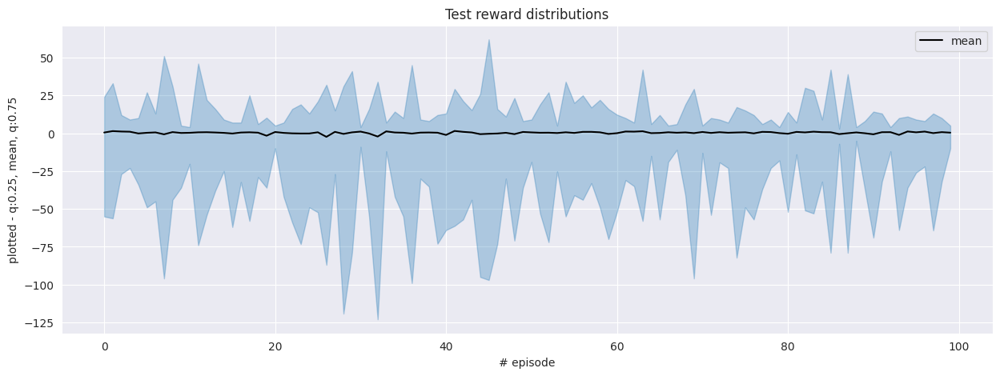

In [31]:
plot_graph(l1_r, 'Test reward distributions')

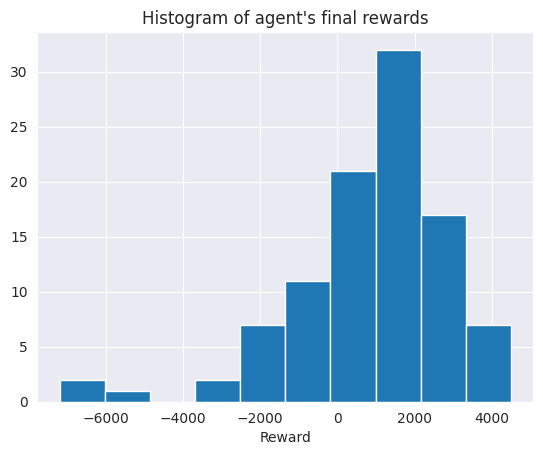

In [32]:
plot_hist(l2_r)

In [33]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

## V2

In [19]:
type = 'v2'

- GAE: yes

In [20]:
agent = return_a2c(True)

In [21]:
r1_list, r2_list, r3_list, r4_list, r5_list, r6_list, r7_list = [], [], [], [], [], [], []         

train_agent(agent, env, train_a2c)

  0%|          | 1/500 [00:11<1:32:58, 11.18s/it]

[[10028     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  0%|          | 2/500 [00:22<1:32:41, 11.17s/it]

[[10028     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  2%|▏         | 10/500 [01:45<1:24:34, 10.36s/it]

[[9962    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  4%|▎         | 18/500 [03:07<1:24:48, 10.56s/it]

[[10106     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
10


  4%|▍         | 19/500 [03:20<1:29:12, 11.13s/it]

[[10116     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


  4%|▍         | 20/500 [03:33<1:33:49, 11.73s/it]

[[10096     0     0     0     0     0     0     0     0     5     2]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
8


  4%|▍         | 21/500 [03:45<1:35:27, 11.96s/it]

[[10127     0     0     0     0     0     0     0     0     0    12]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
13


  4%|▍         | 22/500 [03:58<1:36:03, 12.06s/it]

[[10103     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  5%|▍         | 23/500 [04:10<1:36:25, 12.13s/it]

[[10112     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


  5%|▍         | 24/500 [04:22<1:36:27, 12.16s/it]

[[10148     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


  5%|▌         | 25/500 [04:35<1:37:35, 12.33s/it]

[[10091     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


  5%|▌         | 26/500 [04:47<1:38:08, 12.42s/it]

[[10077     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  5%|▌         | 27/500 [05:01<1:39:43, 12.65s/it]

[[10081     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


  6%|▌         | 28/500 [05:14<1:41:55, 12.96s/it]

[[10075     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
12


  6%|▌         | 29/500 [05:26<1:39:25, 12.66s/it]

[[10107     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


  6%|▌         | 30/500 [05:40<1:41:56, 13.01s/it]

[[10069     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


  6%|▌         | 31/500 [05:53<1:41:10, 12.94s/it]

[[10116     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
12


  6%|▋         | 32/500 [06:06<1:42:04, 13.09s/it]

[[10105     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6
[[10096     0     0     0     0     0     0     0     0     0     0]
 [   -2     0    -1    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-1


  7%|▋         | 33/500 [06:19<1:41:20, 13.02s/it]

[[10123     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


  7%|▋         | 34/500 [06:32<1:41:13, 13.03s/it]

[[10064     0     0     0     0     0     0     0     0     6     1]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
2


  7%|▋         | 35/500 [06:45<1:41:07, 13.05s/it]

[[10123     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


  7%|▋         | 36/500 [06:58<1:39:58, 12.93s/it]

[[10058     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


  7%|▋         | 37/500 [07:11<1:39:40, 12.92s/it]

[[10082     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
9


  8%|▊         | 38/500 [07:23<1:38:41, 12.82s/it]

[[10085     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
10


  8%|▊         | 39/500 [07:36<1:37:45, 12.72s/it]

[[10079     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


  8%|▊         | 40/500 [07:49<1:39:17, 12.95s/it]

[[10103     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


  8%|▊         | 41/500 [08:03<1:39:55, 13.06s/it]

[[10097     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


  8%|▊         | 42/500 [08:15<1:38:24, 12.89s/it]

[[10072     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


  9%|▊         | 43/500 [08:28<1:38:17, 12.90s/it]

[[10122     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
13


  9%|▉         | 44/500 [08:41<1:37:56, 12.89s/it]

[[10078     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


  9%|▉         | 45/500 [08:54<1:36:53, 12.78s/it]

[[10113     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  9%|▉         | 46/500 [09:06<1:36:04, 12.70s/it]

[[10089     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
10


  9%|▉         | 47/500 [09:18<1:35:14, 12.61s/it]

[[10086     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 10%|▉         | 48/500 [09:31<1:35:28, 12.67s/it]

[[10078     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 10%|▉         | 49/500 [09:44<1:34:29, 12.57s/it]

[[10137     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 10%|█         | 50/500 [09:56<1:34:04, 12.54s/it]

[[10118     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 10%|█         | 51/500 [10:09<1:34:04, 12.57s/it]

[[10095     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 10%|█         | 52/500 [10:21<1:34:08, 12.61s/it]

[[10127     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 11%|█         | 53/500 [10:35<1:35:43, 12.85s/it]

[[10056     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 11%|█         | 54/500 [10:47<1:34:38, 12.73s/it]

[[10138     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 11%|█         | 55/500 [11:00<1:34:23, 12.73s/it]

[[10099     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 11%|█         | 56/500 [11:13<1:34:15, 12.74s/it]

[[10095     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 11%|█▏        | 57/500 [11:26<1:34:28, 12.79s/it]

[[10072     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 12%|█▏        | 58/500 [11:38<1:32:49, 12.60s/it]

[[10072     0     0     0     0     0     0     0     3     2    13]
 [   -8     0     0     0     0     0     0     0     0     0     0]]
-8
5


 12%|█▏        | 59/500 [11:50<1:31:56, 12.51s/it]

[[10082     0     0     0     0     0     0     0     0     0    14]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 12%|█▏        | 60/500 [12:03<1:33:32, 12.75s/it]

[[10100     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 12%|█▏        | 61/500 [12:16<1:33:17, 12.75s/it]

[[10093     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
11


 12%|█▏        | 62/500 [12:28<1:31:52, 12.59s/it]

[[10129     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 13%|█▎        | 63/500 [12:41<1:30:55, 12.48s/it]

[[10100     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
15
[[10092     0     0     0     0     0     0     0     0     0     0]
 [   -3     0     0    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-1


 13%|█▎        | 64/500 [12:54<1:32:25, 12.72s/it]

[[10097     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 13%|█▎        | 65/500 [13:08<1:34:19, 13.01s/it]

[[10093     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 13%|█▎        | 66/500 [13:20<1:32:52, 12.84s/it]

[[10127     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 13%|█▎        | 67/500 [13:33<1:32:14, 12.78s/it]

[[10099     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 14%|█▎        | 68/500 [13:46<1:32:34, 12.86s/it]

[[10095     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 14%|█▍        | 69/500 [13:58<1:31:39, 12.76s/it]

[[10143     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 14%|█▍        | 70/500 [14:11<1:30:38, 12.65s/it]

[[10146     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 14%|█▍        | 71/500 [14:24<1:31:00, 12.73s/it]

[[10142     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 14%|█▍        | 72/500 [14:37<1:31:56, 12.89s/it]

[[10156     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
12


 15%|█▍        | 73/500 [14:49<1:30:56, 12.78s/it]

[[10146     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 15%|█▍        | 74/500 [15:01<1:28:40, 12.49s/it]

[[10126     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 15%|█▌        | 75/500 [15:15<1:30:54, 12.83s/it]

[[10116     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 15%|█▌        | 76/500 [15:27<1:28:46, 12.56s/it]

[[10092     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 15%|█▌        | 77/500 [15:40<1:29:21, 12.67s/it]

[[10129     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 16%|█▌        | 78/500 [15:52<1:29:30, 12.73s/it]

[[10069     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


 16%|█▌        | 79/500 [16:06<1:30:53, 12.95s/it]

[[10114     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 16%|█▌        | 80/500 [16:18<1:28:54, 12.70s/it]

[[10129     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 16%|█▌        | 81/500 [16:31<1:28:38, 12.69s/it]

[[10113     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 16%|█▋        | 82/500 [16:43<1:28:17, 12.67s/it]

[[10106     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 17%|█▋        | 83/500 [16:56<1:27:40, 12.61s/it]

[[10095     0     0     0     0     0     0     0     0     8     4]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
14


 17%|█▋        | 84/500 [17:08<1:27:05, 12.56s/it]

[[10105     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 17%|█▋        | 85/500 [17:21<1:26:25, 12.50s/it]

[[10048     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 17%|█▋        | 86/500 [17:34<1:26:59, 12.61s/it]

[[10123     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 17%|█▋        | 87/500 [17:47<1:27:55, 12.77s/it]

[[10060     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 18%|█▊        | 88/500 [18:00<1:27:49, 12.79s/it]

[[10138     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 18%|█▊        | 89/500 [18:12<1:26:46, 12.67s/it]

[[10058     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
9


 18%|█▊        | 91/500 [18:33<1:18:41, 11.54s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 18%|█▊        | 92/500 [18:43<1:15:57, 11.17s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2


 19%|█▊        | 93/500 [18:54<1:14:56, 11.05s/it]

[[9973    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 19%|█▉        | 94/500 [19:05<1:14:19, 10.98s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 19%|█▉        | 95/500 [19:15<1:12:54, 10.80s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 19%|█▉        | 96/500 [19:26<1:12:04, 10.71s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 19%|█▉        | 97/500 [19:36<1:12:09, 10.74s/it]

[[10009     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 20%|█▉        | 98/500 [19:47<1:11:44, 10.71s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 20%|█▉        | 99/500 [19:57<1:10:54, 10.61s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 20%|██        | 100/500 [20:08<1:10:56, 10.64s/it]

[[9930    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-4


 20%|██        | 101/500 [20:18<1:09:59, 10.53s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 20%|██        | 102/500 [20:29<1:10:32, 10.63s/it]

[[9958    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 21%|██        | 103/500 [20:40<1:10:08, 10.60s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 21%|██        | 104/500 [20:51<1:10:59, 10.76s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 21%|██        | 105/500 [21:02<1:10:43, 10.74s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 21%|██        | 106/500 [21:13<1:11:43, 10.92s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -8]]
0
-1


 21%|██▏       | 107/500 [21:24<1:11:05, 10.85s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-6


 22%|██▏       | 108/500 [21:34<1:10:09, 10.74s/it]

[[9933    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-5


 22%|██▏       | 109/500 [21:45<1:09:38, 10.69s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 22%|██▏       | 110/500 [21:55<1:08:56, 10.61s/it]

[[9970    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -2   -8]]
0
-2


 22%|██▏       | 111/500 [22:06<1:08:44, 10.60s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1


 22%|██▏       | 112/500 [22:17<1:09:02, 10.68s/it]

[[9963    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 23%|██▎       | 113/500 [22:27<1:08:24, 10.60s/it]

[[9911    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 23%|██▎       | 114/500 [22:37<1:07:48, 10.54s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 23%|██▎       | 115/500 [22:48<1:07:26, 10.51s/it]

[[10015     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 23%|██▎       | 116/500 [22:58<1:07:24, 10.53s/it]

[[9915    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 23%|██▎       | 117/500 [23:09<1:06:38, 10.44s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-5


 24%|██▎       | 118/500 [23:19<1:06:13, 10.40s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 24%|██▍       | 119/500 [23:29<1:06:21, 10.45s/it]

[[10000     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 24%|██▍       | 120/500 [23:40<1:06:36, 10.52s/it]

[[9934    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 24%|██▍       | 121/500 [23:51<1:06:33, 10.54s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-2


 24%|██▍       | 122/500 [24:01<1:06:28, 10.55s/it]

[[9971    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 25%|██▍       | 123/500 [24:12<1:06:03, 10.51s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 25%|██▍       | 124/500 [24:22<1:05:14, 10.41s/it]

[[9996    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-2


 25%|██▌       | 125/500 [24:33<1:05:36, 10.50s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 25%|██▌       | 126/500 [24:43<1:05:06, 10.45s/it]

[[9931    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 25%|██▌       | 127/500 [24:54<1:05:28, 10.53s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 26%|██▌       | 128/500 [25:04<1:05:33, 10.57s/it]

[[9950    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 26%|██▌       | 129/500 [25:15<1:04:58, 10.51s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 26%|██▌       | 130/500 [25:25<1:04:27, 10.45s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 26%|██▌       | 131/500 [25:36<1:04:36, 10.50s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 26%|██▋       | 132/500 [25:46<1:04:43, 10.55s/it]

[[9926    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-5


 27%|██▋       | 133/500 [25:57<1:04:20, 10.52s/it]

[[9925    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 27%|██▋       | 134/500 [26:08<1:04:58, 10.65s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 27%|██▋       | 135/500 [26:18<1:04:11, 10.55s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 27%|██▋       | 136/500 [26:29<1:04:51, 10.69s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 27%|██▋       | 137/500 [26:39<1:04:14, 10.62s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 28%|██▊       | 138/500 [26:50<1:04:37, 10.71s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-2


 28%|██▊       | 139/500 [27:01<1:04:08, 10.66s/it]

[[9946    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 28%|██▊       | 140/500 [27:12<1:03:51, 10.64s/it]

[[9987    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -4   -3]]
0
-8


 28%|██▊       | 141/500 [27:23<1:04:14, 10.74s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 28%|██▊       | 142/500 [27:33<1:04:11, 10.76s/it]

[[9981    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 29%|██▊       | 143/500 [27:45<1:04:59, 10.92s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-6


 29%|██▉       | 144/500 [27:56<1:05:09, 10.98s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-5


 29%|██▉       | 145/500 [28:06<1:04:17, 10.87s/it]

[[9988    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 29%|██▉       | 147/500 [28:27<1:02:35, 10.64s/it]

[[9928    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 30%|███       | 151/500 [29:08<1:00:54, 10.47s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 30%|███       | 152/500 [29:19<1:01:36, 10.62s/it]

[[9991    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 31%|███       | 153/500 [29:30<1:00:34, 10.47s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 31%|███       | 154/500 [29:40<1:00:22, 10.47s/it]

[[9936    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 31%|███       | 155/500 [29:51<1:00:57, 10.60s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 31%|███       | 156/500 [30:01<1:00:28, 10.55s/it]

[[9984    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 32%|███▏      | 158/500 [30:23<1:00:36, 10.63s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 32%|███▏      | 159/500 [30:33<1:00:04, 10.57s/it]

[[9982    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -9]]
0
-1


 32%|███▏      | 161/500 [30:54<59:10, 10.47s/it]

[[9912    0    0    0    0    0    0    0    0    0    0]
 [  -9    0    0    0    0    0    0    0    0   -3   -8]]
0
-5


 32%|███▏      | 162/500 [31:04<58:56, 10.46s/it]

[[9938    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 33%|███▎      | 163/500 [31:15<59:07, 10.53s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 33%|███▎      | 164/500 [31:26<59:02, 10.54s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 34%|███▍      | 169/500 [32:19<59:29, 10.78s/it]

[[10003     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 34%|███▍      | 170/500 [32:30<58:38, 10.66s/it]

[[9978    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1
[[9979    0    1    1    0    1    1    1    1    1    1]
 [  -2    0    0    0    0    0    0    0    0    0    0]]
-2
1


 35%|███▌      | 175/500 [33:21<55:32, 10.25s/it]

[[9997    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 36%|███▌      | 178/500 [33:51<54:14, 10.11s/it]

[[9918    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 36%|███▌      | 179/500 [34:01<53:43, 10.04s/it]

[[9994    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 36%|███▌      | 180/500 [34:11<54:32, 10.23s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 36%|███▌      | 181/500 [34:21<54:04, 10.17s/it]

[[9979    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 36%|███▋      | 182/500 [34:31<53:32, 10.10s/it]

[[9942    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 38%|███▊      | 191/500 [36:03<51:58, 10.09s/it]

[[9965    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 38%|███▊      | 192/500 [36:12<51:24, 10.01s/it]

[[10014     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 39%|███▊      | 193/500 [36:23<51:57, 10.16s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 39%|███▉      | 195/500 [36:43<52:11, 10.27s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -6]]
0
-1


 39%|███▉      | 197/500 [37:04<52:03, 10.31s/it]

[[9924    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 40%|███▉      | 199/500 [37:25<52:02, 10.37s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 40%|████      | 200/500 [37:35<51:36, 10.32s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 40%|████      | 201/500 [37:45<51:03, 10.25s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 41%|████      | 203/500 [38:06<50:42, 10.25s/it]

[[10004     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 41%|████      | 204/500 [38:16<50:10, 10.17s/it]

[[9951    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 41%|████▏     | 207/500 [38:46<49:05, 10.05s/it]

[[9995    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 42%|████▏     | 208/500 [38:56<48:54, 10.05s/it]

[[9929    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 42%|████▏     | 209/500 [39:06<48:47, 10.06s/it]

[[9970    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 43%|████▎     | 213/500 [39:46<48:04, 10.05s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


 44%|████▍     | 219/500 [40:45<46:52, 10.01s/it]

[[9987    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 44%|████▍     | 220/500 [40:55<46:29,  9.96s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 44%|████▍     | 221/500 [41:05<46:26,  9.99s/it]

[[9940    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 45%|████▌     | 225/500 [41:45<46:17, 10.10s/it]

[[9950    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9941    0    0    0    0    0    0    0    0    0    0]
 [  -2    0   -1   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 45%|████▌     | 227/500 [42:05<45:38, 10.03s/it]

[[9957    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 46%|████▌     | 228/500 [42:16<46:02, 10.16s/it]

[[9961    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 46%|████▌     | 229/500 [42:26<45:40, 10.11s/it]

[[10006     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 46%|████▋     | 232/500 [42:57<45:56, 10.29s/it]

[[9985    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 47%|████▋     | 233/500 [43:07<45:54, 10.32s/it]

[[10022     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 47%|████▋     | 234/500 [43:18<46:01, 10.38s/it]

[[9995    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 47%|████▋     | 235/500 [43:28<45:49, 10.38s/it]

[[9971    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 47%|████▋     | 236/500 [43:38<45:20, 10.31s/it]

[[9963    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 47%|████▋     | 237/500 [43:48<45:05, 10.29s/it]

[[9958    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 48%|████▊     | 239/500 [44:09<44:28, 10.23s/it]

[[10008     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[9998    0    0    0    0    0    0    0    0    0    0]
 [  -1   -1   -1   -1   -1   -1   -1   -1   -1   -1   -1]]
0
-1


 48%|████▊     | 242/500 [44:40<44:32, 10.36s/it]

[[9963    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 49%|████▊     | 243/500 [44:50<44:21, 10.36s/it]

[[10005     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 49%|████▉     | 244/500 [45:00<44:02, 10.32s/it]

[[10022     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 49%|████▉     | 245/500 [45:11<43:38, 10.27s/it]

[[9961    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 49%|████▉     | 246/500 [45:21<43:32, 10.29s/it]

[[9993    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 49%|████▉     | 247/500 [45:31<43:00, 10.20s/it]

[[9941    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 50%|████▉     | 249/500 [45:51<42:20, 10.12s/it]

[[9984    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 50%|█████     | 250/500 [46:01<42:46, 10.27s/it]

[[10033     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 50%|█████     | 251/500 [46:12<42:42, 10.29s/it]

[[10004     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 50%|█████     | 252/500 [46:22<42:11, 10.21s/it]

[[10016     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 51%|█████     | 254/500 [46:42<41:21, 10.09s/it]

[[9983    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 51%|█████     | 255/500 [46:52<41:13, 10.10s/it]

[[10000     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 51%|█████     | 256/500 [47:02<40:58, 10.08s/it]

[[9953    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 51%|█████▏    | 257/500 [47:12<41:00, 10.12s/it]

[[10021     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 52%|█████▏    | 258/500 [47:23<41:11, 10.21s/it]

[[9998    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 52%|█████▏    | 259/500 [47:33<41:08, 10.24s/it]

[[9985    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 52%|█████▏    | 260/500 [47:43<40:42, 10.18s/it]

[[9961    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 52%|█████▏    | 261/500 [47:53<40:10, 10.08s/it]

[[10012     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 57%|█████▋    | 283/500 [51:29<36:13, 10.02s/it]

[[10039     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 58%|█████▊    | 290/500 [52:38<34:17,  9.80s/it]

[[9972    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 58%|█████▊    | 291/500 [52:49<35:00, 10.05s/it]

[[10025     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 58%|█████▊    | 292/500 [52:59<35:24, 10.21s/it]

[[10021     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 59%|█████▊    | 293/500 [53:10<35:25, 10.27s/it]

[[9972    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▉    | 294/500 [53:20<34:45, 10.12s/it]

[[9969    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▉    | 295/500 [53:29<34:23, 10.06s/it]

[[10004     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 59%|█████▉    | 296/500 [53:40<34:27, 10.14s/it]

[[9941    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▉    | 297/500 [53:50<34:43, 10.26s/it]

[[10033     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 60%|█████▉    | 298/500 [54:01<34:30, 10.25s/it]

[[9944    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 60%|█████▉    | 299/500 [54:11<34:45, 10.38s/it]

[[9968    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 60%|██████    | 301/500 [54:31<33:19, 10.05s/it]

[[9976    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
10


 61%|██████    | 304/500 [55:00<32:21,  9.91s/it]

[[9952    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 61%|██████▏   | 307/500 [55:30<31:59,  9.95s/it]

[[9961    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 62%|██████▏   | 308/500 [55:40<32:10, 10.06s/it]

[[9934    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 62%|██████▏   | 309/500 [55:51<32:29, 10.21s/it]

[[9968    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 62%|██████▏   | 310/500 [56:01<32:07, 10.14s/it]

[[9997    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9991    0    0    0    0    0    0    0    0    0    0]
 [  -5    0    0    0    0   -1   -1   -1   -1   -1   -1]]
0
-1


 62%|██████▏   | 311/500 [56:12<32:23, 10.28s/it]

[[9988    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 62%|██████▏   | 312/500 [56:22<32:43, 10.44s/it]

[[10010     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 63%|██████▎   | 313/500 [56:33<32:22, 10.39s/it]

[[10024     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 63%|██████▎   | 314/500 [56:43<32:32, 10.50s/it]

[[9986    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 63%|██████▎   | 315/500 [56:54<32:28, 10.53s/it]

[[10010     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 63%|██████▎   | 316/500 [57:04<32:09, 10.49s/it]

[[10038     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 63%|██████▎   | 317/500 [57:15<31:43, 10.40s/it]

[[9990    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 64%|██████▎   | 318/500 [57:26<32:20, 10.66s/it]

[[10053     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 64%|██████▍   | 319/500 [57:37<32:16, 10.70s/it]

[[10026     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 64%|██████▍   | 320/500 [57:47<31:38, 10.54s/it]

[[10002     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 64%|██████▍   | 321/500 [57:57<31:18, 10.49s/it]

[[10039     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 64%|██████▍   | 322/500 [58:08<31:12, 10.52s/it]

[[10040     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▍   | 323/500 [58:19<31:15, 10.59s/it]

[[10022     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▍   | 324/500 [58:30<31:28, 10.73s/it]

[[10027     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▌   | 325/500 [58:40<30:50, 10.57s/it]

[[10003     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 65%|██████▌   | 326/500 [58:50<30:28, 10.51s/it]

[[10016     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▌   | 327/500 [59:01<30:15, 10.49s/it]

[[9953    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 66%|██████▌   | 328/500 [59:11<30:10, 10.53s/it]

[[10006     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 66%|██████▌   | 329/500 [59:22<30:19, 10.64s/it]

[[9992    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5


 66%|██████▌   | 330/500 [59:33<30:03, 10.61s/it]

[[10036     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 66%|██████▌   | 331/500 [59:43<29:38, 10.52s/it]

[[9929    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 66%|██████▋   | 332/500 [59:54<29:42, 10.61s/it]

[[9990    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 67%|██████▋   | 333/500 [1:00:05<29:38, 10.65s/it]

[[10002     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 67%|██████▋   | 334/500 [1:00:15<29:34, 10.69s/it]

[[9993    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 67%|██████▋   | 335/500 [1:00:26<29:35, 10.76s/it]

[[10062     0     0     0     0     0     0     0     0     4     6]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
6


 67%|██████▋   | 336/500 [1:00:37<29:06, 10.65s/it]

[[10042     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 67%|██████▋   | 337/500 [1:00:47<28:24, 10.46s/it]

[[9979    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 68%|██████▊   | 338/500 [1:00:57<28:30, 10.56s/it]

[[10055     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 68%|██████▊   | 339/500 [1:01:08<28:05, 10.47s/it]

[[9976    0    0    0    0    0    0    0    0    0   12]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 68%|██████▊   | 340/500 [1:01:19<28:30, 10.69s/it]

[[9987    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 68%|██████▊   | 341/500 [1:01:30<28:36, 10.80s/it]

[[10018     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 68%|██████▊   | 342/500 [1:01:41<28:58, 11.01s/it]

[[10052     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 69%|██████▊   | 343/500 [1:01:53<29:08, 11.14s/it]

[[10033     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 69%|██████▉   | 344/500 [1:02:05<29:21, 11.29s/it]

[[10066     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 69%|██████▉   | 345/500 [1:02:16<29:36, 11.46s/it]

[[9982    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 69%|██████▉   | 346/500 [1:02:28<29:14, 11.39s/it]

[[10003     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 69%|██████▉   | 347/500 [1:02:39<28:42, 11.26s/it]

[[10070     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
16


 70%|██████▉   | 348/500 [1:02:50<28:46, 11.36s/it]

[[10003     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 70%|██████▉   | 349/500 [1:03:01<28:21, 11.27s/it]

[[9988    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 70%|███████   | 350/500 [1:03:12<27:55, 11.17s/it]

[[10019     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 70%|███████   | 351/500 [1:03:24<28:10, 11.35s/it]

[[10049     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 70%|███████   | 352/500 [1:03:36<28:12, 11.43s/it]

[[10085     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 71%|███████   | 353/500 [1:03:47<27:46, 11.34s/it]

[[10046     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 71%|███████   | 354/500 [1:03:58<27:33, 11.33s/it]

[[10077     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 71%|███████   | 355/500 [1:04:09<27:18, 11.30s/it]

[[10069     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 71%|███████   | 356/500 [1:04:20<26:56, 11.23s/it]

[[10056     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 71%|███████▏  | 357/500 [1:04:31<26:43, 11.21s/it]

[[10074     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 72%|███████▏  | 358/500 [1:04:43<26:43, 11.29s/it]

[[10038     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 72%|███████▏  | 359/500 [1:04:54<26:16, 11.18s/it]

[[9986    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 72%|███████▏  | 360/500 [1:05:05<26:08, 11.21s/it]

[[10004     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 72%|███████▏  | 361/500 [1:05:16<25:42, 11.10s/it]

[[10066     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 72%|███████▏  | 362/500 [1:05:27<25:43, 11.18s/it]

[[10090     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 363/500 [1:05:39<25:46, 11.29s/it]

[[10035     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 364/500 [1:05:50<25:43, 11.35s/it]

[[10053     0     0     0     0     0     0     0     0     1    15]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
9


 73%|███████▎  | 365/500 [1:06:02<25:36, 11.38s/it]

[[9979    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 73%|███████▎  | 366/500 [1:06:13<25:19, 11.34s/it]

[[10012     0     0     0     0     0     0     0     0     1     1]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
8


 73%|███████▎  | 367/500 [1:06:24<25:04, 11.31s/it]

[[10024     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
11


 74%|███████▎  | 368/500 [1:06:36<24:53, 11.31s/it]

[[10021     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 74%|███████▍  | 369/500 [1:06:47<24:56, 11.42s/it]

[[10015     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 74%|███████▍  | 370/500 [1:06:59<24:43, 11.41s/it]

[[10020     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
12


 74%|███████▍  | 371/500 [1:07:10<24:29, 11.39s/it]

[[10028     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 74%|███████▍  | 372/500 [1:07:21<24:08, 11.32s/it]

[[10012     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 75%|███████▍  | 373/500 [1:07:32<23:42, 11.20s/it]

[[10063     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 75%|███████▍  | 374/500 [1:07:44<23:42, 11.29s/it]

[[10026     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 75%|███████▌  | 375/500 [1:07:55<23:21, 11.21s/it]

[[10015     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 75%|███████▌  | 376/500 [1:08:05<22:55, 11.09s/it]

[[10091     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 75%|███████▌  | 377/500 [1:08:17<22:55, 11.18s/it]

[[9975    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 76%|███████▌  | 378/500 [1:08:28<22:37, 11.13s/it]

[[10005     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▌  | 379/500 [1:08:39<22:25, 11.12s/it]

[[9986    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 76%|███████▌  | 380/500 [1:08:50<22:21, 11.18s/it]

[[10054     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 76%|███████▌  | 381/500 [1:09:01<21:46, 10.98s/it]

[[10039     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▋  | 382/500 [1:09:12<21:36, 10.99s/it]

[[10010     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 77%|███████▋  | 383/500 [1:09:24<21:57, 11.26s/it]

[[10023     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 77%|███████▋  | 384/500 [1:09:35<21:36, 11.17s/it]

[[10030     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 77%|███████▋  | 385/500 [1:09:45<21:03, 10.99s/it]

[[10045     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


 77%|███████▋  | 386/500 [1:09:57<21:12, 11.17s/it]

[[10068     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 77%|███████▋  | 387/500 [1:10:07<20:44, 11.02s/it]

[[10002     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 388/500 [1:10:19<20:58, 11.23s/it]

[[10077     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 389/500 [1:10:31<20:50, 11.27s/it]

[[10021     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 390/500 [1:10:42<20:53, 11.39s/it]

[[10030     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 391/500 [1:10:54<20:42, 11.40s/it]

[[10016     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 392/500 [1:11:04<19:57, 11.09s/it]

[[10011     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 79%|███████▊  | 393/500 [1:11:15<19:44, 11.07s/it]

[[10055     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 79%|███████▉  | 394/500 [1:11:26<19:24, 10.98s/it]

[[9993    0    0    0    0    0    0    0    0    0   11]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6


 79%|███████▉  | 395/500 [1:11:37<19:07, 10.93s/it]

[[10043     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 79%|███████▉  | 396/500 [1:11:47<18:36, 10.74s/it]

[[10052     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 79%|███████▉  | 397/500 [1:11:58<18:40, 10.88s/it]

[[10059     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 80%|███████▉  | 398/500 [1:12:10<18:45, 11.04s/it]

[[10026     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|███████▉  | 399/500 [1:12:21<18:39, 11.09s/it]

[[10026     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 400/500 [1:12:32<18:39, 11.19s/it]

[[10036     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 401/500 [1:12:43<18:22, 11.14s/it]

[[10069     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
10


 80%|████████  | 402/500 [1:12:54<18:01, 11.04s/it]

[[10044     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 403/500 [1:13:05<17:50, 11.04s/it]

[[10030     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 404/500 [1:13:16<17:31, 10.96s/it]

[[10055     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 405/500 [1:13:27<17:24, 11.00s/it]

[[10051     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 406/500 [1:13:38<17:15, 11.02s/it]

[[10022     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████▏ | 407/500 [1:13:49<16:57, 10.94s/it]

[[10063     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 82%|████████▏ | 408/500 [1:13:59<16:41, 10.88s/it]

[[10003     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 82%|████████▏ | 409/500 [1:14:10<16:25, 10.83s/it]

[[10073     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 82%|████████▏ | 410/500 [1:14:21<16:12, 10.80s/it]

[[10000     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 82%|████████▏ | 411/500 [1:14:31<15:53, 10.71s/it]

[[9995    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
7


 82%|████████▏ | 412/500 [1:14:43<15:59, 10.90s/it]

[[10007     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 83%|████████▎ | 413/500 [1:14:54<15:50, 10.93s/it]

[[10020     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[10020     0     0     1     1     1     1     1     1     1     1]
 [   -3     0     0     0     0     0     0     0     0     0     0]]
-3
1


 83%|████████▎ | 414/500 [1:15:05<15:46, 11.00s/it]

[[9993    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 415/500 [1:15:16<15:42, 11.08s/it]

[[10082     0     0     0     0     0     0     0     0     0    12]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 83%|████████▎ | 416/500 [1:15:27<15:32, 11.10s/it]

[[9977    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 417/500 [1:15:39<15:25, 11.15s/it]

[[10040     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 84%|████████▎ | 418/500 [1:15:50<15:16, 11.18s/it]

[[10057     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 84%|████████▍ | 419/500 [1:16:00<14:48, 10.97s/it]

[[10006     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


 84%|████████▍ | 420/500 [1:16:11<14:34, 10.93s/it]

[[10055     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 84%|████████▍ | 421/500 [1:16:22<14:15, 10.84s/it]

[[10039     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 84%|████████▍ | 422/500 [1:16:33<14:03, 10.82s/it]

[[9997    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
7


 85%|████████▍ | 423/500 [1:16:44<14:05, 10.99s/it]

[[10018     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 85%|████████▍ | 424/500 [1:16:55<13:52, 10.95s/it]

[[10061     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 85%|████████▌ | 425/500 [1:17:06<13:39, 10.93s/it]

[[10047     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 85%|████████▌ | 426/500 [1:17:17<13:33, 10.99s/it]

[[10043     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 85%|████████▌ | 427/500 [1:17:28<13:35, 11.17s/it]

[[10045     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 86%|████████▌ | 428/500 [1:17:40<13:23, 11.15s/it]

[[10048     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
12


 86%|████████▌ | 429/500 [1:17:50<12:56, 10.93s/it]

[[9999    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 86%|████████▌ | 430/500 [1:18:01<12:51, 11.02s/it]

[[10034     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 86%|████████▌ | 431/500 [1:18:12<12:45, 11.09s/it]

[[10056     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 86%|████████▋ | 432/500 [1:18:24<12:34, 11.09s/it]

[[10052     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 433/500 [1:18:35<12:21, 11.07s/it]

[[10042     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 434/500 [1:18:46<12:10, 11.07s/it]

[[10036     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 87%|████████▋ | 435/500 [1:18:57<11:56, 11.03s/it]

[[10052     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
15


 87%|████████▋ | 436/500 [1:19:07<11:41, 10.96s/it]

[[10075     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 437/500 [1:19:18<11:33, 11.00s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 88%|████████▊ | 438/500 [1:19:30<11:25, 11.06s/it]

[[10071     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 88%|████████▊ | 439/500 [1:19:41<11:16, 11.08s/it]

[[10071     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 88%|████████▊ | 440/500 [1:19:52<11:03, 11.05s/it]

[[10072     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 88%|████████▊ | 441/500 [1:20:03<11:00, 11.20s/it]

[[10065     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 88%|████████▊ | 442/500 [1:20:15<10:52, 11.26s/it]

[[10106     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 89%|████████▊ | 443/500 [1:20:25<10:31, 11.07s/it]

[[10075     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 89%|████████▉ | 444/500 [1:20:37<10:25, 11.18s/it]

[[10054     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 89%|████████▉ | 445/500 [1:20:48<10:21, 11.30s/it]

[[10025     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 89%|████████▉ | 446/500 [1:21:00<10:12, 11.34s/it]

[[10000     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 89%|████████▉ | 447/500 [1:21:11<09:57, 11.27s/it]

[[10036     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 90%|████████▉ | 448/500 [1:21:22<09:42, 11.20s/it]

[[10038     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 90%|████████▉ | 449/500 [1:21:33<09:35, 11.29s/it]

[[10009     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 90%|█████████ | 450/500 [1:21:44<09:21, 11.22s/it]

[[10085     0     0     0     0     0     0     0     0     1     2]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
1


 90%|█████████ | 451/500 [1:21:56<09:16, 11.36s/it]

[[10076     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 90%|█████████ | 452/500 [1:22:07<09:00, 11.27s/it]

[[9989    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5


 91%|█████████ | 453/500 [1:22:18<08:44, 11.15s/it]

[[10027     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████ | 454/500 [1:22:29<08:24, 10.96s/it]

[[10029     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 91%|█████████ | 455/500 [1:22:39<08:06, 10.81s/it]

[[10038     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████ | 456/500 [1:22:49<07:50, 10.70s/it]

[[10056     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████▏| 457/500 [1:23:00<07:35, 10.60s/it]

[[10031     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 92%|█████████▏| 458/500 [1:23:10<07:24, 10.59s/it]

[[9966    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 92%|█████████▏| 459/500 [1:23:21<07:15, 10.61s/it]

[[9956    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1
[[9956    0    1    1    1    1    1    1    1    1    1]
 [  -2    0    0    0    0    0    0    0    0    0    0]]
-2
1


 92%|█████████▏| 460/500 [1:23:32<07:02, 10.56s/it]

[[10060     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 92%|█████████▏| 461/500 [1:23:42<06:47, 10.46s/it]

[[10015     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 92%|█████████▏| 462/500 [1:23:52<06:33, 10.36s/it]

[[10040     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 93%|█████████▎| 463/500 [1:24:03<06:26, 10.45s/it]

[[10024     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 93%|█████████▎| 464/500 [1:24:13<06:15, 10.42s/it]

[[9994    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 93%|█████████▎| 465/500 [1:24:23<06:05, 10.43s/it]

[[10006     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 93%|█████████▎| 466/500 [1:24:33<05:51, 10.33s/it]

[[10057     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 93%|█████████▎| 467/500 [1:24:44<05:40, 10.32s/it]

[[10066     0     0     0     0     0     0     0     0     0    12]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 94%|█████████▎| 468/500 [1:24:54<05:32, 10.39s/it]

[[10038     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 94%|█████████▍| 469/500 [1:25:05<05:22, 10.40s/it]

[[10005     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 94%|█████████▍| 470/500 [1:25:15<05:11, 10.38s/it]

[[10041     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 94%|█████████▍| 471/500 [1:25:25<05:00, 10.37s/it]

[[10020     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 94%|█████████▍| 472/500 [1:25:36<04:50, 10.39s/it]

[[10024     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 95%|█████████▍| 473/500 [1:25:46<04:39, 10.36s/it]

[[9978    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 95%|█████████▍| 474/500 [1:25:57<04:31, 10.43s/it]

[[9994    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 95%|█████████▌| 475/500 [1:26:07<04:22, 10.50s/it]

[[10061     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 95%|█████████▌| 476/500 [1:26:18<04:09, 10.40s/it]

[[10024     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 95%|█████████▌| 477/500 [1:26:28<03:57, 10.32s/it]

[[9971    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 96%|█████████▌| 478/500 [1:26:38<03:48, 10.37s/it]

[[10039     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 96%|█████████▌| 479/500 [1:26:48<03:35, 10.28s/it]

[[10047     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[10047     1     1     3     1     1     1     1     1     1     1]
 [   -1     0     0     0     0     0     0     0     0     0     0]]
-1
1


 96%|█████████▌| 480/500 [1:26:59<03:26, 10.31s/it]

[[9991    0    0    0    0    0    0    0    0    0   13]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3


 96%|█████████▌| 481/500 [1:27:09<03:18, 10.46s/it]

[[10005     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 96%|█████████▋| 482/500 [1:27:20<03:06, 10.35s/it]

[[10082     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 97%|█████████▋| 483/500 [1:27:30<02:55, 10.32s/it]

[[10003     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 97%|█████████▋| 484/500 [1:27:40<02:46, 10.42s/it]

[[10038     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 97%|█████████▋| 485/500 [1:27:51<02:36, 10.45s/it]

[[9999    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6


 97%|█████████▋| 486/500 [1:28:02<02:29, 10.68s/it]

[[9981    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 97%|█████████▋| 487/500 [1:28:13<02:21, 10.88s/it]

[[9984    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 98%|█████████▊| 488/500 [1:28:24<02:09, 10.78s/it]

[[10021     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 98%|█████████▊| 489/500 [1:28:35<01:58, 10.80s/it]

[[10037     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 98%|█████████▊| 490/500 [1:28:46<01:47, 10.78s/it]

[[10002     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 98%|█████████▊| 491/500 [1:28:56<01:36, 10.68s/it]

[[9978    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 98%|█████████▊| 492/500 [1:29:07<01:25, 10.64s/it]

[[10013     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 99%|█████████▊| 493/500 [1:29:17<01:14, 10.67s/it]

[[10053     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 99%|█████████▉| 494/500 [1:29:28<01:04, 10.73s/it]

[[10031     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[10031     0     0     0     1     1     1     1     1     1     1]
 [   -4     0     0     0     0     0     0     0     0     0     0]]
-4
1


 99%|█████████▉| 495/500 [1:29:39<00:53, 10.70s/it]

[[9998    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 99%|█████████▉| 496/500 [1:29:50<00:42, 10.74s/it]

[[10012     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 99%|█████████▉| 497/500 [1:30:00<00:31, 10.65s/it]

[[10049     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


100%|█████████▉| 498/500 [1:30:11<00:21, 10.64s/it]

[[10005     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


100%|█████████▉| 499/500 [1:30:21<00:10, 10.59s/it]

[[10000     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


100%|██████████| 500/500 [1:30:32<00:00, 10.87s/it]

[[10059     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
done


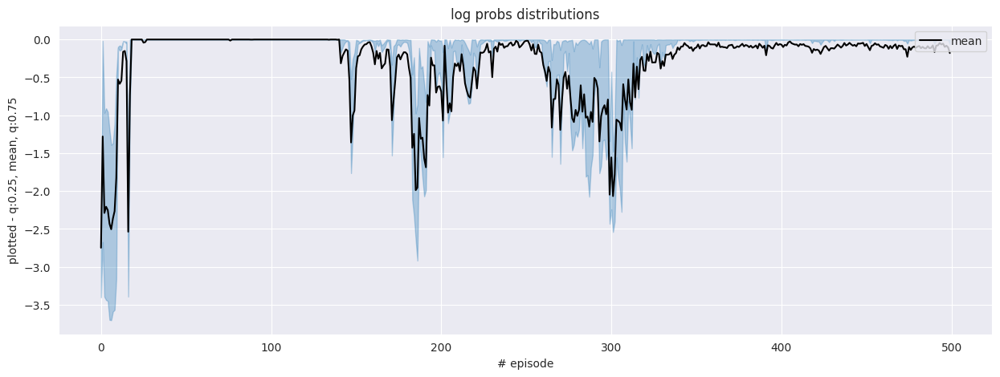

In [22]:
plot_graph(r1_list, 'log probs distributions')

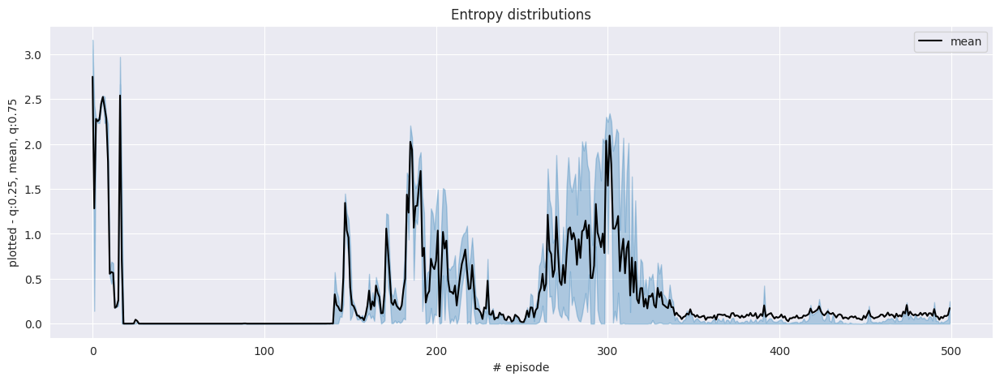

In [23]:
plot_graph(r2_list, 'Entropy distributions')

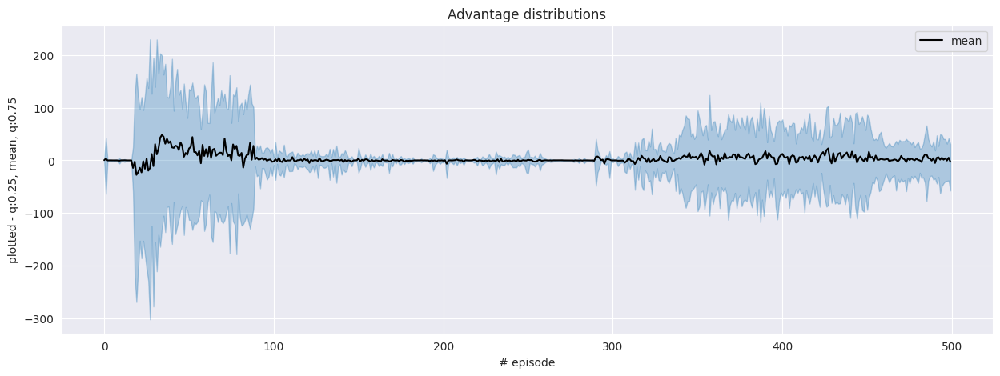

In [24]:
plot_graph(r3_list, 'Advantage distributions')

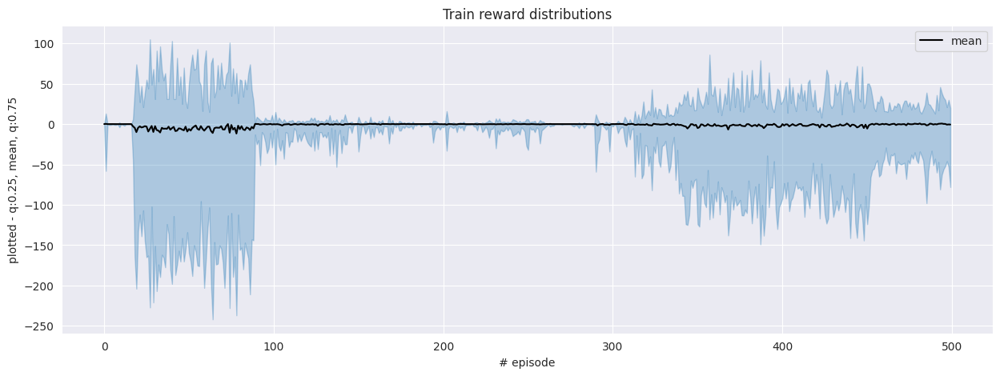

In [25]:
plot_graph(r4_list, 'Train reward distributions')

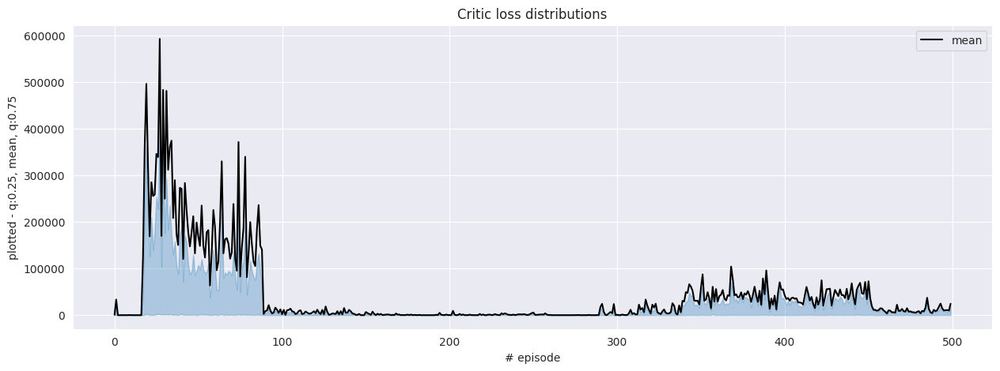

In [26]:
plot_graph(r6_list, 'Critic loss distributions')

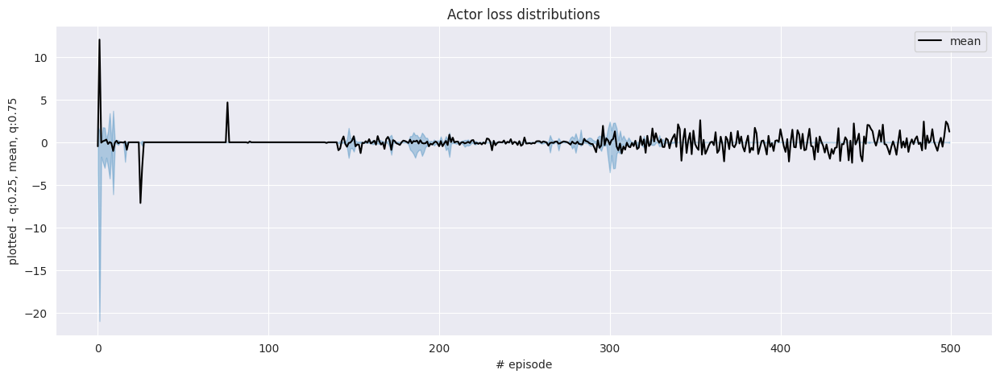

In [27]:
plot_graph(r7_list, 'Actor loss distributions')

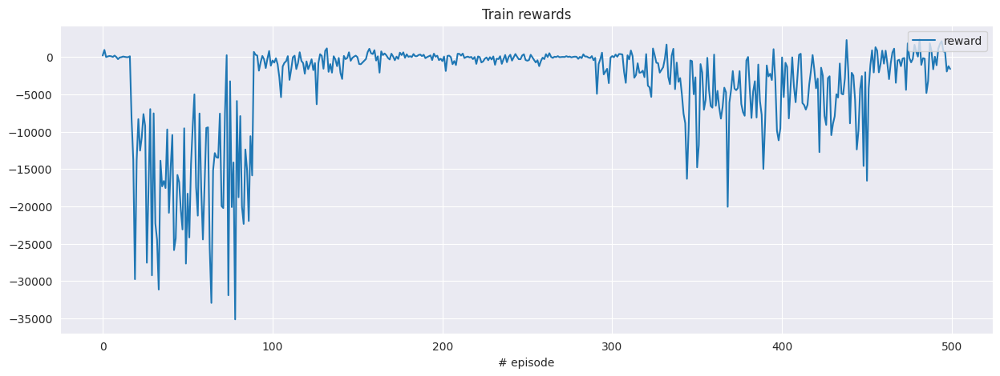

In [28]:
plot_rs(r5_list, 'Train rewards')

In [29]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)
up_pickle('r5_list.pkl', agent_str, type, r5_list)
up_pickle('r6_list.pkl', agent_str, type, r6_list)
up_pickle('r7_list.pkl', agent_str, type, r7_list)

In [30]:
l1_r, l2_r = [], []

test_agent(agent, env)

  1%|          | 1/100 [00:07<12:12,  7.40s/it]

[[10055     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  2%|▏         | 2/100 [00:14<12:04,  7.40s/it]

[[10100     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


  3%|▎         | 3/100 [00:22<11:54,  7.36s/it]

[[10068     0     0     0     0     0     0     0     2     4     7]
 [   -8     0     0     0     0     0     0     0     0     0     0]]
-8
9


  4%|▍         | 4/100 [00:29<11:41,  7.31s/it]

[[10012     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  5%|▌         | 5/100 [00:36<11:33,  7.30s/it]

[[10082     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


  6%|▌         | 6/100 [00:44<11:37,  7.42s/it]

[[9993    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


  7%|▋         | 7/100 [00:51<11:31,  7.43s/it]

[[10071     0     0     0     0     0     0     0     0     3     0]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
4


  8%|▊         | 8/100 [00:59<11:28,  7.48s/it]

[[10054     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


  9%|▉         | 9/100 [01:06<11:10,  7.37s/it]

[[10014     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 10%|█         | 10/100 [01:14<11:22,  7.58s/it]

[[10069     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 11%|█         | 11/100 [01:21<11:01,  7.43s/it]

[[10060     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 12%|█▏        | 12/100 [01:28<10:43,  7.32s/it]

[[10065     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 13%|█▎        | 13/100 [01:35<10:28,  7.23s/it]

[[10048     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 14%|█▍        | 14/100 [01:42<10:23,  7.25s/it]

[[9999    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 15%|█▌        | 15/100 [01:49<10:06,  7.13s/it]

[[10076     0     0     0     0     0     0     0     0     7     4]
 [   -9     0     0     0     0     0     0     0     0     0     0]]
-9
3


 16%|█▌        | 16/100 [01:57<10:09,  7.26s/it]

[[9999    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 17%|█▋        | 17/100 [02:04<10:08,  7.33s/it]

[[10046     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 18%|█▊        | 18/100 [02:12<09:57,  7.29s/it]

[[10036     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 19%|█▉        | 19/100 [02:19<09:55,  7.35s/it]

[[10016     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 20%|██        | 20/100 [02:26<09:48,  7.35s/it]

[[10058     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 21%|██        | 21/100 [02:34<09:46,  7.42s/it]

[[10041     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 22%|██▏       | 22/100 [02:42<09:44,  7.49s/it]

[[9999    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 23%|██▎       | 23/100 [02:49<09:28,  7.38s/it]

[[10031     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 24%|██▍       | 24/100 [02:56<09:09,  7.22s/it]

[[10069     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 25%|██▌       | 25/100 [03:03<09:07,  7.30s/it]

[[10077     0     0     0     0     0     0     0     0     0    12]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 26%|██▌       | 26/100 [03:11<09:06,  7.39s/it]

[[10057     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 27%|██▋       | 27/100 [03:19<09:15,  7.60s/it]

[[10055     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 28%|██▊       | 28/100 [03:26<09:03,  7.55s/it]

[[10018     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
[[10009     0     0     0     0     0     0     0     0     0     0]
 [   -2     0    -1    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-1


 29%|██▉       | 29/100 [03:34<08:55,  7.55s/it]

[[10052     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 30%|███       | 30/100 [03:41<08:48,  7.55s/it]

[[10067     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 31%|███       | 31/100 [03:49<08:38,  7.51s/it]

[[10016     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 32%|███▏      | 32/100 [03:56<08:31,  7.53s/it]

[[10006     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 33%|███▎      | 33/100 [04:04<08:29,  7.61s/it]

[[9990    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 34%|███▍      | 34/100 [04:11<08:11,  7.44s/it]

[[10050     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 35%|███▌      | 35/100 [04:19<08:03,  7.44s/it]

[[10065     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7
[[10056     0     0     0     0     0     0     0     0     0     0]
 [   -2     0    -1    -1    -1    -1    -1    -1    -1    -1    -1]]
0
-1


 36%|███▌      | 36/100 [04:26<07:58,  7.48s/it]

[[10030     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 37%|███▋      | 37/100 [04:34<07:47,  7.43s/it]

[[10058     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 38%|███▊      | 38/100 [04:41<07:44,  7.49s/it]

[[10064     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 39%|███▉      | 39/100 [04:49<07:36,  7.49s/it]

[[10022     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
15


 40%|████      | 40/100 [04:56<07:25,  7.42s/it]

[[10045     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 41%|████      | 41/100 [05:03<07:17,  7.41s/it]

[[10022     0     0     0     0     0     0     0     0     0    11]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 42%|████▏     | 42/100 [05:11<07:22,  7.63s/it]

[[10016     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 43%|████▎     | 43/100 [05:19<07:11,  7.57s/it]

[[10064     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


 44%|████▍     | 44/100 [05:27<07:08,  7.66s/it]

[[10025     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 45%|████▌     | 45/100 [05:35<07:05,  7.74s/it]

[[9983    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 46%|████▌     | 46/100 [05:42<06:54,  7.68s/it]

[[10022     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 47%|████▋     | 47/100 [05:50<06:48,  7.71s/it]

[[10027     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 48%|████▊     | 48/100 [05:58<06:47,  7.84s/it]

[[10029     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 49%|████▉     | 49/100 [06:05<06:32,  7.70s/it]

[[10047     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 50%|█████     | 50/100 [06:13<06:22,  7.65s/it]

[[10078     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 51%|█████     | 51/100 [06:21<06:17,  7.70s/it]

[[10025     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 52%|█████▏    | 52/100 [06:28<06:07,  7.66s/it]

[[10003     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 53%|█████▎    | 53/100 [06:36<06:03,  7.74s/it]

[[10016     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 54%|█████▍    | 54/100 [06:43<05:48,  7.57s/it]

[[10051     0     0     0     0     0     0     0     0     0    13]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 55%|█████▌    | 55/100 [06:51<05:38,  7.52s/it]

[[9988    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
7


 56%|█████▌    | 56/100 [06:59<05:33,  7.57s/it]

[[10086     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 57%|█████▋    | 57/100 [07:06<05:18,  7.41s/it]

[[10031     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 58%|█████▊    | 58/100 [07:13<05:13,  7.46s/it]

[[10049     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 59%|█████▉    | 59/100 [07:21<05:07,  7.50s/it]

[[10065     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 60%|██████    | 60/100 [07:28<04:57,  7.44s/it]

[[10026     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 61%|██████    | 61/100 [07:35<04:44,  7.31s/it]

[[10016     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 62%|██████▏   | 62/100 [07:43<04:43,  7.45s/it]

[[10064     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 63%|██████▎   | 63/100 [07:50<04:37,  7.50s/it]

[[10046     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 64%|██████▍   | 64/100 [07:58<04:34,  7.61s/it]

[[10039     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 65%|██████▌   | 65/100 [08:06<04:22,  7.50s/it]

[[10043     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 66%|██████▌   | 66/100 [08:13<04:17,  7.57s/it]

[[10008     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 67%|██████▋   | 67/100 [08:21<04:10,  7.60s/it]

[[10054     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 68%|██████▊   | 68/100 [08:28<04:00,  7.51s/it]

[[10075     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 69%|██████▉   | 69/100 [08:35<03:49,  7.40s/it]

[[10020     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 70%|███████   | 70/100 [08:43<03:47,  7.57s/it]

[[10082     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 71%|███████   | 71/100 [08:51<03:38,  7.53s/it]

[[10049     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 72%|███████▏  | 72/100 [08:58<03:31,  7.56s/it]

[[10043     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 73/100 [09:06<03:22,  7.52s/it]

[[10044     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 74%|███████▍  | 74/100 [09:13<03:16,  7.54s/it]

[[10031     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 75%|███████▌  | 75/100 [09:21<03:07,  7.51s/it]

[[10071     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▌  | 76/100 [09:28<03:00,  7.51s/it]

[[9986    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 77%|███████▋  | 77/100 [09:36<02:50,  7.40s/it]

[[9993    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5


 78%|███████▊  | 78/100 [09:43<02:45,  7.51s/it]

[[10066     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 79%|███████▉  | 79/100 [09:51<02:39,  7.59s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 80/100 [09:59<02:31,  7.55s/it]

[[10072     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 81/100 [10:06<02:24,  7.60s/it]

[[10030     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 82%|████████▏ | 82/100 [10:14<02:15,  7.53s/it]

[[10075     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 83%|████████▎ | 83/100 [10:21<02:06,  7.46s/it]

[[10074     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 84%|████████▍ | 84/100 [10:28<01:57,  7.37s/it]

[[10060     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 85%|████████▌ | 85/100 [10:35<01:49,  7.29s/it]

[[10056     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 86%|████████▌ | 86/100 [10:43<01:44,  7.46s/it]

[[10007     0     0     0     0     0     0     0     0     0    10]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 87/100 [10:51<01:36,  7.45s/it]

[[10062     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 88%|████████▊ | 88/100 [10:58<01:28,  7.39s/it]

[[10060     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 89%|████████▉ | 89/100 [11:05<01:21,  7.44s/it]

[[10071     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
9


 90%|█████████ | 90/100 [11:12<01:13,  7.34s/it]

[[10051     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████ | 91/100 [11:20<01:05,  7.28s/it]

[[10001     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 92%|█████████▏| 92/100 [11:27<00:58,  7.26s/it]

[[10080     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 93%|█████████▎| 93/100 [11:35<00:52,  7.50s/it]

[[10010     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


 94%|█████████▍| 94/100 [11:42<00:44,  7.48s/it]

[[9985    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
12


 95%|█████████▌| 95/100 [11:50<00:38,  7.69s/it]

[[10047     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 96%|█████████▌| 96/100 [11:59<00:31,  7.84s/it]

[[10087     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 97%|█████████▋| 97/100 [12:06<00:22,  7.66s/it]

[[10051     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
10


 98%|█████████▊| 98/100 [12:14<00:15,  7.66s/it]

[[10072     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 99%|█████████▉| 99/100 [12:21<00:07,  7.67s/it]

[[10010     0     0     0     0     0     0     0     0     0    11]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


100%|██████████| 100/100 [12:29<00:00,  7.49s/it]

[[9982    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6
done


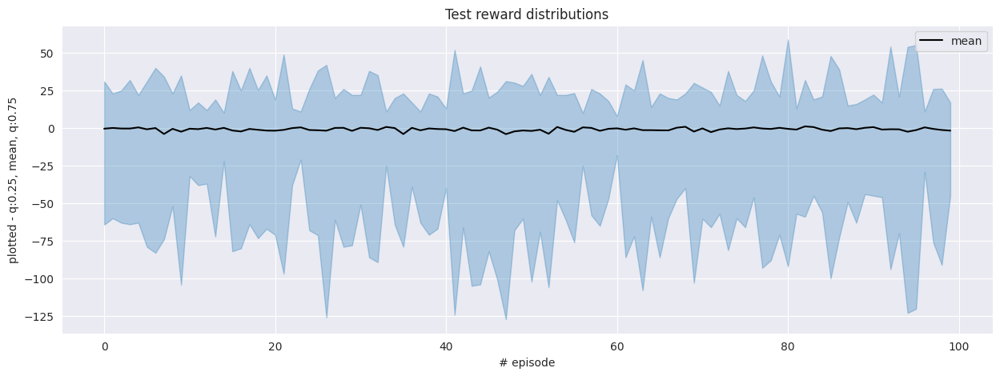

In [31]:
plot_graph(l1_r, 'Test reward distributions')

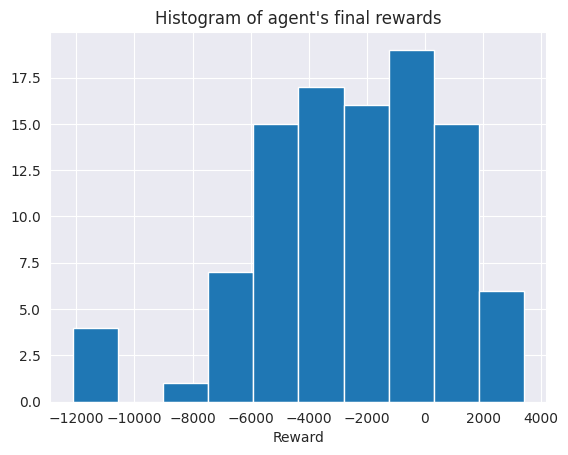

In [32]:
plot_hist(l2_r)

In [33]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

In [5]:
results('A2C', ['v1', 'v2'])

v1 mean is 904.93
v2 mean is -2510.49
rd mean is -5.180127240676601
H0: 2 independent samples have identical average values


,categ1,categ2,tstat,pvalue
0,v1,v2,8.913583,8.429540e-16
1,v1,rd,4.459381,2.154890e-05
2,v2,rd,-7.710852,9.756350e-12


# PPO

$(J^{CLIP}(\theta))$ (PPO with clipping for policy)

In [17]:
agent_str = 'PPO'
type = 'v1'

In [18]:
%%capture
!mkdir -p "rl_hse/$agent_str"

In [19]:
policy = torch.nn.Sequential(
        torch.nn.Linear(env.observation_space.low.size, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, 32, bias=False),
        torch.nn.LayerNorm(32),
        torch.nn.ReLU(),
        torch.nn.Linear(32, env.action_space.n),
        pfrl.policies.SoftmaxCategoricalHead(),
    )

value = torch.nn.Sequential(
            torch.nn.Linear(env.observation_space.low.size, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32, bias=False),
            torch.nn.LayerNorm(32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 1),
        )
model = pfrl.nn.Branched(policy, value)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

gamma = 0.9
phi = lambda x: x.astype(np.float32, copy=False)
gpu = -1

In [20]:
agent = pfrl.agents.PPO(
        model,
        optimizer,
        gamma = gamma,
        phi=phi,
        gpu=gpu,
        max_grad_norm = 1000,        
        value_loss_stats_window=1000,
        policy_loss_stats_window=1000)

In [21]:
r1_list, r2_list, r3_list, r4_list, r5_list, r6_list = [], [], [], [], [], []

train_agent(agent, env, train_ppo)

  1%|          | 6/500 [00:59<1:22:23, 10.01s/it]

[[10001     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


  1%|▏         | 7/500 [01:10<1:25:06, 10.36s/it]

[[9941    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


  2%|▏         | 8/500 [01:19<1:21:52,  9.98s/it]

[[9974    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  3%|▎         | 13/500 [02:11<1:23:19, 10.27s/it]

[[10007     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -9]]
0
-1


  4%|▎         | 18/500 [03:00<1:22:00, 10.21s/it]

[[9960    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-2


  4%|▍         | 20/500 [03:21<1:22:40, 10.33s/it]

[[10012     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


  4%|▍         | 22/500 [03:41<1:22:15, 10.33s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -7]]
0
-1


  5%|▍         | 24/500 [04:01<1:21:35, 10.29s/it]

[[9956    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


  5%|▌         | 25/500 [04:10<1:18:55,  9.97s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


  8%|▊         | 38/500 [06:23<1:17:37, 10.08s/it]

[[9967    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


  9%|▊         | 43/500 [07:13<1:15:10,  9.87s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 12%|█▏        | 60/500 [10:07<1:13:57, 10.09s/it]

[[10014     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 14%|█▍        | 72/500 [12:10<1:12:17, 10.14s/it]

[[10010     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 15%|█▍        | 74/500 [12:31<1:12:44, 10.25s/it]

[[10026     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 15%|█▌        | 77/500 [13:01<1:10:52, 10.05s/it]

[[9937    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 17%|█▋        | 83/500 [14:02<1:09:44, 10.04s/it]

[[9970    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 17%|█▋        | 86/500 [14:32<1:08:30,  9.93s/it]

[[10047     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 17%|█▋        | 87/500 [14:43<1:11:05, 10.33s/it]

[[9994    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 19%|█▊        | 93/500 [15:45<1:10:34, 10.40s/it]

[[9944    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 19%|█▉        | 94/500 [15:55<1:09:14, 10.23s/it]

[[9998    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 20%|█▉        | 99/500 [16:48<1:10:22, 10.53s/it]

[[9994    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 22%|██▏       | 110/500 [18:42<1:09:15, 10.65s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 23%|██▎       | 115/500 [19:32<1:05:54, 10.27s/it]

[[9999    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 26%|██▋       | 132/500 [22:26<1:03:17, 10.32s/it]

[[10033     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -11]]
0
-1


 27%|██▋       | 134/500 [22:46<1:03:05, 10.34s/it]

[[9955    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-1


 30%|███       | 150/500 [25:26<58:13,  9.98s/it]

[[10010     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 31%|███       | 154/500 [26:06<57:35,  9.99s/it]

[[9948    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 31%|███       | 155/500 [26:17<58:42, 10.21s/it]

[[10021     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -2]]
0
-1


 32%|███▏      | 161/500 [27:16<56:12,  9.95s/it]

[[10002     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 33%|███▎      | 165/500 [27:57<55:48, 10.00s/it]

[[9985    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 33%|███▎      | 166/500 [28:07<57:11, 10.28s/it]

[[10013     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 34%|███▍      | 170/500 [28:48<56:35, 10.29s/it]

[[9999    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 35%|███▌      | 176/500 [29:46<53:05,  9.83s/it]

[[9975    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 36%|███▌      | 179/500 [30:18<54:46, 10.24s/it]

[[10024     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 36%|███▌      | 181/500 [30:38<54:42, 10.29s/it]

[[9949    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 37%|███▋      | 183/500 [30:58<54:03, 10.23s/it]

[[9993    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 37%|███▋      | 186/500 [31:28<53:19, 10.19s/it]

[[10011     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 38%|███▊      | 189/500 [31:57<51:48, 10.00s/it]

[[9926    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 39%|███▉      | 196/500 [33:09<52:06, 10.28s/it]

[[10009     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 42%|████▏     | 209/500 [35:21<50:18, 10.37s/it]

[[9965    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 42%|████▏     | 210/500 [35:31<49:05, 10.16s/it]

[[9947    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 42%|████▏     | 212/500 [35:52<49:09, 10.24s/it]

[[9955    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 43%|████▎     | 214/500 [36:13<48:54, 10.26s/it]

[[9959    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 43%|████▎     | 215/500 [36:22<47:40, 10.04s/it]

[[10005     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 43%|████▎     | 216/500 [36:34<49:17, 10.41s/it]

[[9993    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 44%|████▍     | 219/500 [37:04<47:56, 10.24s/it]

[[9956    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 45%|████▌     | 225/500 [38:06<46:25, 10.13s/it]

[[9981    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 46%|████▌     | 228/500 [38:35<44:44,  9.87s/it]

[[9989    0    0    0    0    0    0    0    0    0    9]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 46%|████▌     | 230/500 [38:56<45:14, 10.05s/it]

[[9977    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 47%|████▋     | 235/500 [39:49<46:21, 10.49s/it]

[[10006     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 47%|████▋     | 236/500 [39:58<44:54, 10.21s/it]

[[9969    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
7


 47%|████▋     | 237/500 [40:09<45:45, 10.44s/it]

[[10003     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 48%|████▊     | 238/500 [40:19<44:44, 10.25s/it]

[[9997    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 56%|█████▌    | 278/500 [47:06<38:25, 10.39s/it]

[[9974    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 56%|█████▌    | 280/500 [47:27<38:24, 10.47s/it]

[[9974    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 57%|█████▋    | 283/500 [47:58<37:28, 10.36s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 57%|█████▋    | 284/500 [48:09<38:11, 10.61s/it]

[[10031     0     0     0     0     0     0     0     0     0    12]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 57%|█████▋    | 286/500 [48:28<35:46, 10.03s/it]

[[9986    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 57%|█████▋    | 287/500 [48:40<37:12, 10.48s/it]

[[9985    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 58%|█████▊    | 291/500 [49:22<37:11, 10.68s/it]

[[9982    0    0    0    0    0    0    0    0    0   14]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 58%|█████▊    | 292/500 [49:31<35:36, 10.27s/it]

[[9974    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▉    | 295/500 [50:03<36:25, 10.66s/it]

[[10047     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 59%|█████▉    | 296/500 [50:13<34:43, 10.21s/it]

[[9980    0    0    0    0    0    0    0    0    0    8]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 59%|█████▉    | 297/500 [50:24<35:45, 10.57s/it]

[[10040     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 60%|█████▉    | 298/500 [50:33<34:21, 10.21s/it]

[[10038     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 60%|█████▉    | 299/500 [50:43<33:23,  9.97s/it]

[[9985    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 60%|██████    | 301/500 [51:04<33:29, 10.10s/it]

[[10064     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 60%|██████    | 302/500 [51:15<34:14, 10.38s/it]

[[10052     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 61%|██████    | 304/500 [51:35<34:11, 10.47s/it]

[[9995    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 63%|██████▎   | 313/500 [53:08<32:06, 10.30s/it]

[[10055     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 63%|██████▎   | 315/500 [53:29<32:42, 10.61s/it]

[[9988    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 63%|██████▎   | 317/500 [53:50<32:29, 10.65s/it]

[[9997    0    0    0    0    0    0    0    0    0   10]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 64%|██████▎   | 318/500 [54:00<31:36, 10.42s/it]

[[9997    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 65%|██████▍   | 324/500 [55:03<30:35, 10.43s/it]

[[9983    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
4


 65%|██████▌   | 325/500 [55:14<31:00, 10.63s/it]

[[9985    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
3


 65%|██████▌   | 327/500 [55:36<30:54, 10.72s/it]

[[10004     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 66%|██████▌   | 328/500 [55:45<29:25, 10.27s/it]

[[9982    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 67%|██████▋   | 334/500 [56:47<29:19, 10.60s/it]

[[10002     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 67%|██████▋   | 337/500 [57:17<27:45, 10.22s/it]

[[9980    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 68%|██████▊   | 338/500 [57:29<28:31, 10.56s/it]

[[9960    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 68%|██████▊   | 342/500 [58:09<26:22, 10.02s/it]

[[9996    0    0    0    0    0    0    0    0    0   12]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 69%|██████▉   | 345/500 [58:40<26:52, 10.40s/it]

[[10015     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 69%|██████▉   | 346/500 [58:50<26:19, 10.26s/it]

[[10036     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 69%|██████▉   | 347/500 [59:01<26:49, 10.52s/it]

[[10020     0     0     0     0     0     0     0     0     0     7]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 70%|██████▉   | 349/500 [59:22<26:16, 10.44s/it]

[[10015     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 70%|███████   | 350/500 [59:31<25:25, 10.17s/it]

[[10066     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 70%|███████   | 351/500 [59:43<26:03, 10.49s/it]

[[10045     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
10


 71%|███████   | 355/500 [1:00:24<25:30, 10.55s/it]

[[9997    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 72%|███████▏  | 358/500 [1:00:55<24:43, 10.45s/it]

[[9963    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 72%|███████▏  | 359/500 [1:01:04<23:47, 10.12s/it]

[[10027     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 72%|███████▏  | 362/500 [1:01:36<24:34, 10.69s/it]

[[10028     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 363/500 [1:01:46<23:54, 10.47s/it]

[[10058     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 73%|███████▎  | 364/500 [1:01:58<24:28, 10.80s/it]

[[9993    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 73%|███████▎  | 365/500 [1:02:08<23:35, 10.48s/it]

[[9995    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 73%|███████▎  | 366/500 [1:02:19<23:53, 10.70s/it]

[[9981    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 74%|███████▎  | 368/500 [1:02:40<23:25, 10.65s/it]

[[9980    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 74%|███████▍  | 369/500 [1:02:49<22:36, 10.36s/it]

[[10051     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 74%|███████▍  | 370/500 [1:02:59<21:56, 10.13s/it]

[[9985    0    0    0    0    0    0    0    0    0    6]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 74%|███████▍  | 371/500 [1:03:11<22:40, 10.55s/it]

[[10019     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 74%|███████▍  | 372/500 [1:03:20<21:39, 10.15s/it]

[[9995    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 75%|███████▌  | 375/500 [1:03:52<22:00, 10.57s/it]

[[9969    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 75%|███████▌  | 376/500 [1:04:01<21:08, 10.23s/it]

[[10005     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▌  | 378/500 [1:04:23<20:59, 10.32s/it]

[[9977    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 76%|███████▌  | 379/500 [1:04:34<21:37, 10.72s/it]

[[9996    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
14


 76%|███████▌  | 380/500 [1:04:43<20:32, 10.27s/it]

[[10063     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 76%|███████▌  | 381/500 [1:04:55<21:00, 10.59s/it]

[[10007     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
5


 77%|███████▋  | 384/500 [1:05:25<19:39, 10.17s/it]

[[10020     0     0     0     0     0     0     0     0     0     9]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 77%|███████▋  | 386/500 [1:05:46<19:51, 10.45s/it]

[[10032     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 388/500 [1:06:06<19:31, 10.46s/it]

[[9990    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 78%|███████▊  | 389/500 [1:06:16<18:59, 10.27s/it]

[[10004     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 78%|███████▊  | 390/500 [1:06:28<19:25, 10.60s/it]

[[9993    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6


 78%|███████▊  | 391/500 [1:06:37<18:51, 10.38s/it]

[[10030     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 79%|███████▉  | 394/500 [1:07:09<18:35, 10.52s/it]

[[10010     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 79%|███████▉  | 396/500 [1:07:29<18:03, 10.42s/it]

[[9991    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 79%|███████▉  | 397/500 [1:07:39<17:30, 10.19s/it]

[[10031     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|███████▉  | 399/500 [1:08:00<17:10, 10.20s/it]

[[10020     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 400/500 [1:08:09<16:39,  9.99s/it]

[[10045     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 401/500 [1:08:21<17:21, 10.52s/it]

[[10053     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 80%|████████  | 402/500 [1:08:31<16:41, 10.22s/it]

[[10060     0     0     0     0     0     0     0     0     0     2]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████  | 404/500 [1:08:51<16:10, 10.11s/it]

[[9997    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 81%|████████  | 405/500 [1:09:02<16:34, 10.47s/it]

[[10004     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 81%|████████▏ | 407/500 [1:09:23<16:11, 10.44s/it]

[[9987    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 82%|████████▏ | 408/500 [1:09:32<15:37, 10.19s/it]

[[10019     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 83%|████████▎ | 414/500 [1:10:34<14:48, 10.34s/it]

[[10050     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 83%|████████▎ | 415/500 [1:10:43<14:10, 10.00s/it]

[[9981    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 83%|████████▎ | 416/500 [1:10:54<14:28, 10.34s/it]

[[10057     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 84%|████████▎ | 418/500 [1:11:15<14:22, 10.51s/it]

[[10033     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 84%|████████▍ | 421/500 [1:11:45<13:19, 10.12s/it]

[[9983    0    0    0    0    0    0    0    0    0    2]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 85%|████████▍ | 423/500 [1:12:06<13:05, 10.20s/it]

[[10049     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
3


 85%|████████▌ | 426/500 [1:12:39<13:08, 10.65s/it]

[[10038     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 85%|████████▌ | 427/500 [1:12:48<12:28, 10.25s/it]

[[9992    0    0    0    0    0    0    0    0    0    5]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
2


 86%|████████▌ | 431/500 [1:13:30<12:10, 10.59s/it]

[[10011     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
7


 87%|████████▋ | 435/500 [1:14:11<11:23, 10.52s/it]

[[10072     0     0     0     0     0     0     0     0     0     3]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 87%|████████▋ | 437/500 [1:14:32<11:01, 10.51s/it]

[[9994    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 88%|████████▊ | 438/500 [1:14:41<10:30, 10.17s/it]

[[10028     0     0     0     0     0     0     0     0     0     4]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 88%|████████▊ | 439/500 [1:14:52<10:37, 10.45s/it]

[[10051     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
6


 88%|████████▊ | 442/500 [1:15:22<09:52, 10.22s/it]

[[10073     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 89%|████████▉ | 444/500 [1:15:42<09:37, 10.30s/it]

[[10018     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 90%|████████▉ | 448/500 [1:16:24<09:06, 10.51s/it]

[[10072     0     0     0     0     0     0     0     0     0     5]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 90%|█████████ | 452/500 [1:17:05<08:19, 10.42s/it]

[[10051     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
4


 91%|█████████ | 453/500 [1:17:14<07:55, 10.13s/it]

[[9995    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
5


 91%|█████████ | 454/500 [1:17:26<08:04, 10.53s/it]

[[10043     0     0     0     0     0     0     0     0     0     8]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1


 91%|█████████▏| 457/500 [1:17:56<07:25, 10.37s/it]

[[9999    0    0    0    0    0    0    0    0    0    7]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
6


 93%|█████████▎| 463/500 [1:18:57<06:25, 10.43s/it]

[[9999    0    0    0    0    0    0    0    0    0    4]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
8


 93%|█████████▎| 466/500 [1:19:27<05:41, 10.06s/it]

[[10063     0     0     0     0     0     0     0     0     0     1]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
8


 94%|█████████▍| 469/500 [1:19:59<05:23, 10.44s/it]

[[9996    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 94%|█████████▍| 470/500 [1:20:08<05:04, 10.13s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 95%|█████████▌| 475/500 [1:20:58<04:09, 10.00s/it]

[[9963    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 96%|█████████▋| 482/500 [1:22:11<03:06, 10.34s/it]

[[10006     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-1


 99%|█████████▉| 496/500 [1:24:32<00:40, 10.12s/it]

[[9985    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


100%|██████████| 500/500 [1:25:13<00:00, 10.23s/it]

done


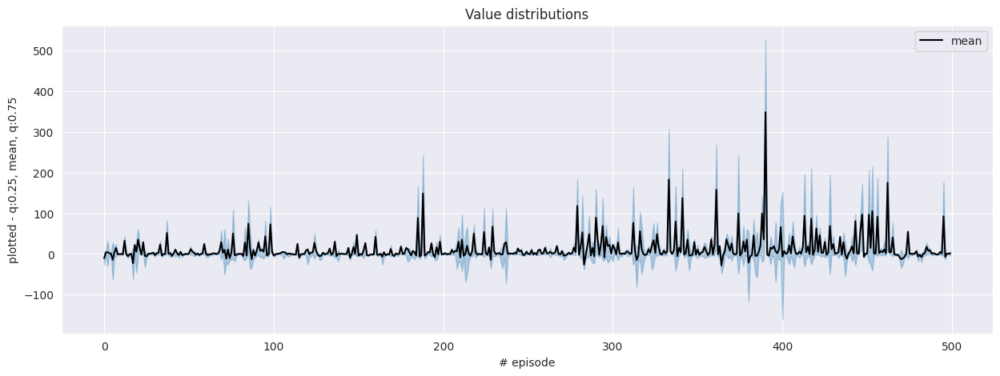

In [22]:
plot_graph(r1_list, 'Value distributions')

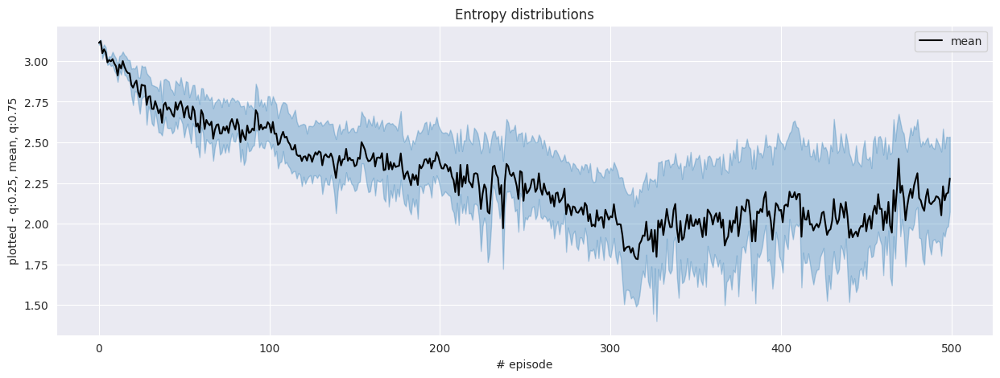

In [23]:
plot_graph(r2_list, 'Entropy distributions')

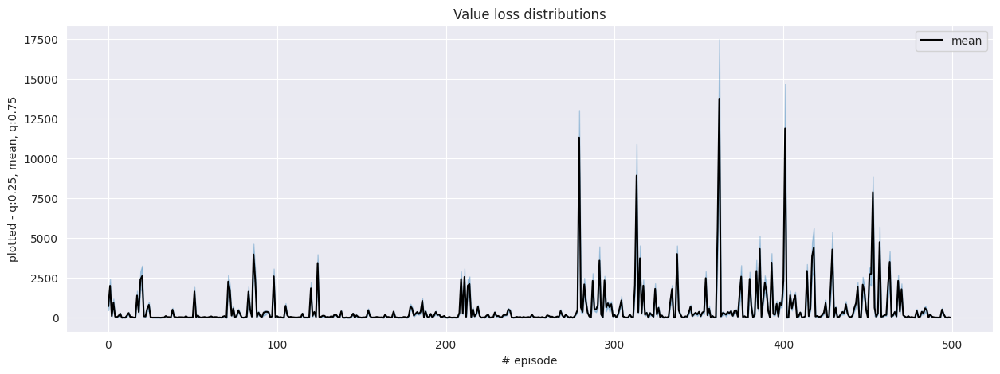

In [24]:
plot_graph(r3_list, 'Value loss distributions')

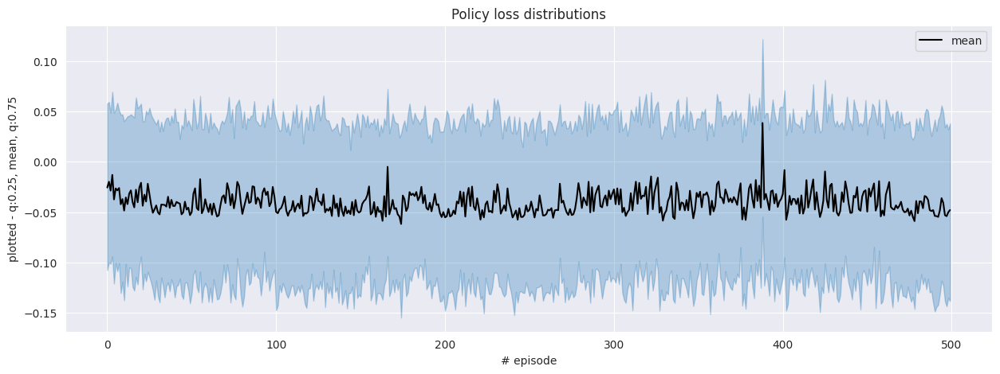

In [25]:
plot_graph(r4_list, 'Policy loss distributions')

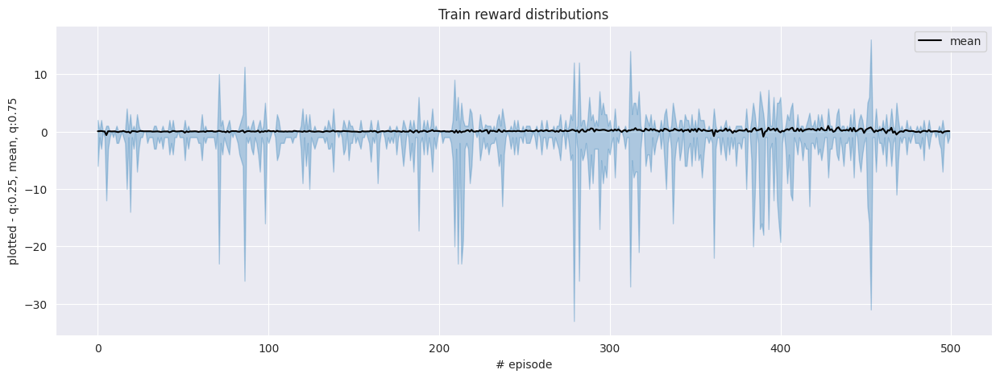

In [26]:
plot_graph(r5_list, 'Train reward distributions')

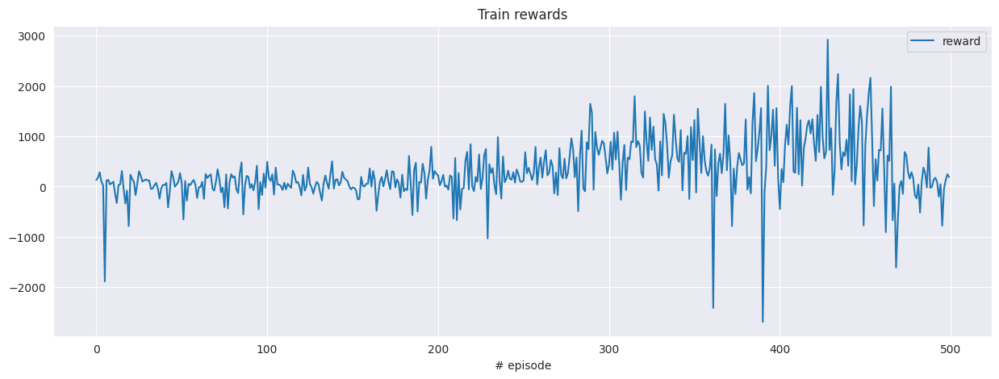

In [27]:
plot_rs(r6_list, 'Train rewards')

In [28]:
up_pickle('r1_list.pkl', agent_str, type, r1_list)
up_pickle('r2_list.pkl', agent_str, type, r2_list)
up_pickle('r3_list.pkl', agent_str, type, r3_list)
up_pickle('r4_list.pkl', agent_str, type, r4_list)
up_pickle('r5_list.pkl', agent_str, type, r5_list)
up_pickle('r6_list.pkl', agent_str, type, r6_list)

In [29]:
l1_r, l2_r = [], []

test_agent(agent, env)

  1%|          | 1/100 [00:07<12:10,  7.38s/it]

[[9994    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-4


 10%|█         | 10/100 [01:14<11:07,  7.42s/it]

[[9972    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 12%|█▏        | 12/100 [01:29<10:59,  7.50s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -5]]
0
-1


 17%|█▋        | 17/100 [02:05<10:11,  7.36s/it]

[[9949    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 22%|██▏       | 22/100 [02:43<09:43,  7.48s/it]

[[9997    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -3]]
0
-1


 23%|██▎       | 23/100 [02:50<09:37,  7.51s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 26%|██▌       | 26/100 [03:13<09:11,  7.46s/it]

[[9932    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 27%|██▋       | 27/100 [03:20<09:01,  7.41s/it]

[[9976    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -4]]
0
-2


 28%|██▊       | 28/100 [03:27<08:51,  7.38s/it]

[[9981    0    0    0    0    0    0    0    0    0    1]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 29%|██▉       | 29/100 [03:34<08:39,  7.32s/it]

[[9990    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 32%|███▏      | 32/100 [03:56<08:10,  7.21s/it]

[[9957    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 33%|███▎      | 33/100 [04:03<08:05,  7.24s/it]

[[9966    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 37%|███▋      | 37/100 [04:32<07:40,  7.31s/it]

[[9943    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-5


 43%|████▎     | 43/100 [05:15<06:49,  7.19s/it]

[[9986    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 47%|████▋     | 47/100 [05:44<06:22,  7.21s/it]

[[9953    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -2]]
0
-1


 50%|█████     | 50/100 [06:06<06:01,  7.24s/it]

[[10013     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -7]]
0
-1


 59%|█████▉    | 59/100 [07:11<04:55,  7.22s/it]

[[9992    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 61%|██████    | 61/100 [07:26<04:49,  7.42s/it]

[[10011     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -3]]
0
-7


 65%|██████▌   | 65/100 [07:55<04:19,  7.40s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


 72%|███████▏  | 72/100 [08:46<03:23,  7.26s/it]

[[10025     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0   -10]]
0
-1


 73%|███████▎  | 73/100 [08:53<03:16,  7.28s/it]

[[10008     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -5]]
0
-1


 77%|███████▋  | 77/100 [09:22<02:45,  7.20s/it]

[[9961    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 80%|████████  | 80/100 [09:43<02:23,  7.15s/it]

[[9939    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -6]]
0
-1


 81%|████████  | 81/100 [09:51<02:17,  7.21s/it]

[[10022     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -4]]
0
-1


 84%|████████▍ | 84/100 [10:12<01:55,  7.19s/it]

[[9951    0    0    0    0    0    0    0    0    0    3]
 [ -10    0    0    0    0    0    0    0    0    0    0]]
-10
1


 89%|████████▉ | 89/100 [10:49<01:20,  7.27s/it]

[[9970    0    0    0    0    0    0    0    0    0    0]
 [ -10    0    0    0    0    0    0    0    0    0   -1]]
0
-1


 91%|█████████ | 91/100 [11:03<01:04,  7.18s/it]

[[10012     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
2


 99%|█████████▉| 99/100 [12:00<00:07,  7.19s/it]

[[10009     0     0     0     0     0     0     0     0     0     0]
 [  -10     0     0     0     0     0     0     0     0     0    -1]]
0
-1


100%|██████████| 100/100 [12:08<00:00,  7.28s/it]

[[10037     0     0     0     0     0     0     0     0     0     6]
 [  -10     0     0     0     0     0     0     0     0     0     0]]
-10
1
done


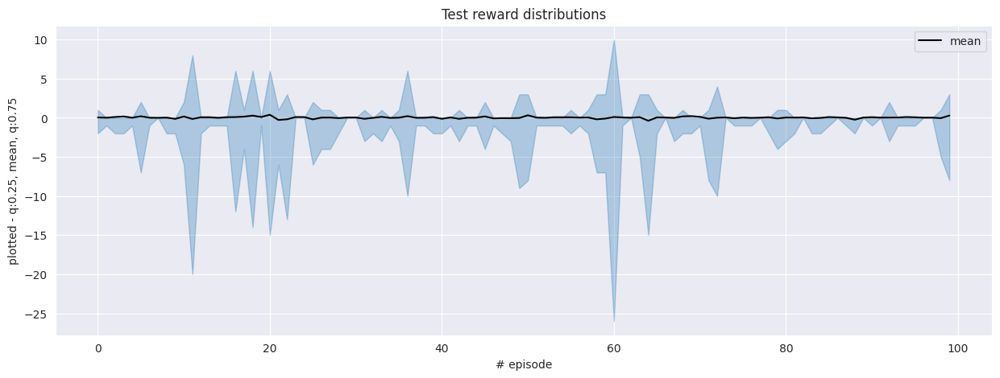

In [30]:
plot_graph(l1_r, 'Test reward distributions')

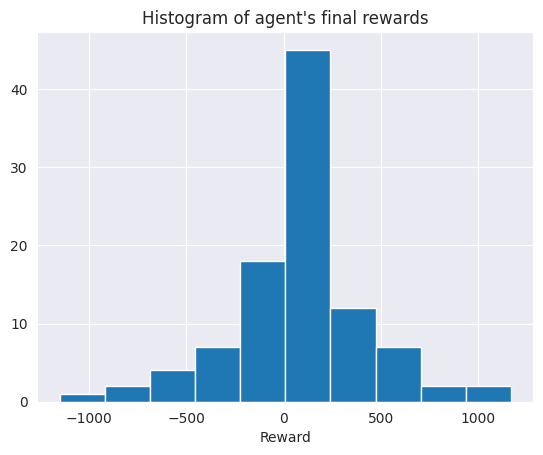

In [31]:
plot_hist(l2_r)

In [32]:
up_pickle('l1_r.pkl', agent_str, type,  l1_r)
up_pickle('l2_r.pkl', agent_str, type,  l2_r)

In [9]:
results('PPO', ['v1'])

v1 mean is 75.55
rd mean is -5.180127240676601
H0: 2 independent samples have identical average values


,categ1,categ2,tstat,pvalue
0,v1,rd,2.136406,0.034517


In [98]:
reinforce = down_pickle('l2_r.pkl', 'reinforce', 'v3')
DDQN = down_pickle('l2_r.pkl', 'DDQN', 'v1')
A2C = down_pickle('l2_r.pkl', 'A2C', 'v1')
PPO = down_pickle('l2_r.pkl', 'PPO', 'v1')

In [99]:
df = pd.DataFrame({'reinforce':reinforce,
                   'DDQN':DDQN,
                    'A2C':A2C,
                    'PPO':PPO}).describe().map(lambda x: f"{x:0.3f}")[1:]

df.style.set_table_attributes("style='display:inline'").set_caption("Agents' test rewards stats")

,reinforce,DDQN,A2C,PPO
mean,64.330,716.040,904.930,75.550
std,186.251,1348.976,2036.015,350.604
min,-398.000,-3923.000,-7182.000,-1149.000
25%,-56.500,240.000,34.250,-33.750
50%,72.500,996.500,1371.500,83.500
75%,189.750,1522.750,2101.250,225.250
max,634.000,3900.000,4493.000,1167.000


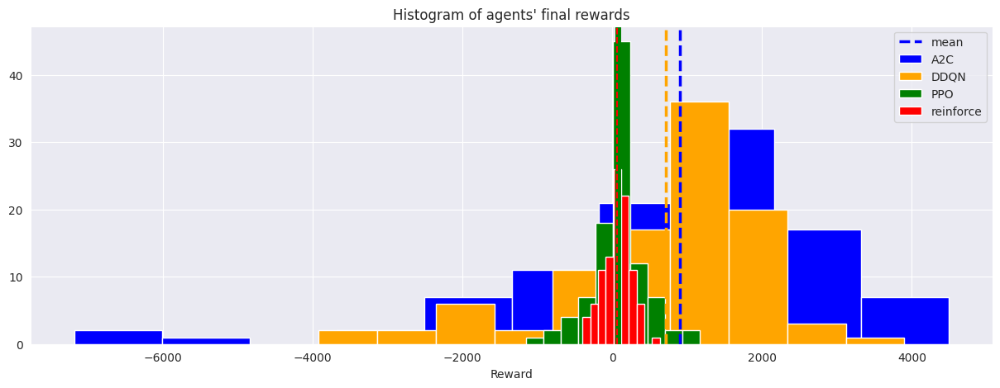

In [100]:
figure(figsize=(15, 5))
plt.hist(A2C, color='blue', label = 'A2C')
plt.axvline(np.mean(A2C), color='blue', linestyle='dashed', linewidth=2.5, label = 'mean')
plt.hist(DDQN, color='orange', label = 'DDQN')
plt.axvline(np.mean(DDQN), color='orange', linestyle='dashed', linewidth=2.5)
plt.hist(PPO, color='green', label = 'PPO')
plt.axvline(np.mean(PPO), color='green', linestyle='solid', linewidth=5)
plt.hist(reinforce, color='red', label = 'reinforce')
plt.axvline(np.mean(reinforce), color='red', linestyle='dashed', linewidth=1.5)
plt.xlabel('Reward')
plt.title("Histogram of agents' final rewards")
plt.legend(loc="upper right");

In [101]:
reinforce = down_pickle('r4_list.pkl', 'reinforce', 'v3')
DDQN = down_pickle('r4_list.pkl', 'DDQN', 'v1')
A2C = down_pickle('r5_list.pkl', 'A2C', 'v1')
PPO = down_pickle('r6_list.pkl', 'PPO', 'v1')

In [102]:
df = pd.DataFrame({'reinforce':reinforce,
                   'DDQN':DDQN,
                    'A2C':A2C,
                    'PPO':PPO}).describe().map(lambda x: f"{x:0.3f}")[1:]

df.style.set_table_attributes("style='display:inline'").set_caption("Agents' train rewards stats")

,reinforce,DDQN,A2C,PPO
mean,13.280,116.106,355.490,318.916
std,225.674,459.157,1642.226,581.133
min,-1781.000,-5483.000,-13008.000,-2691.000
25%,-59.250,15.750,-108.250,9.750
50%,57.500,127.000,149.500,192.500
75%,141.250,244.500,1265.250,578.250
max,542.000,2267.000,4480.000,2922.000


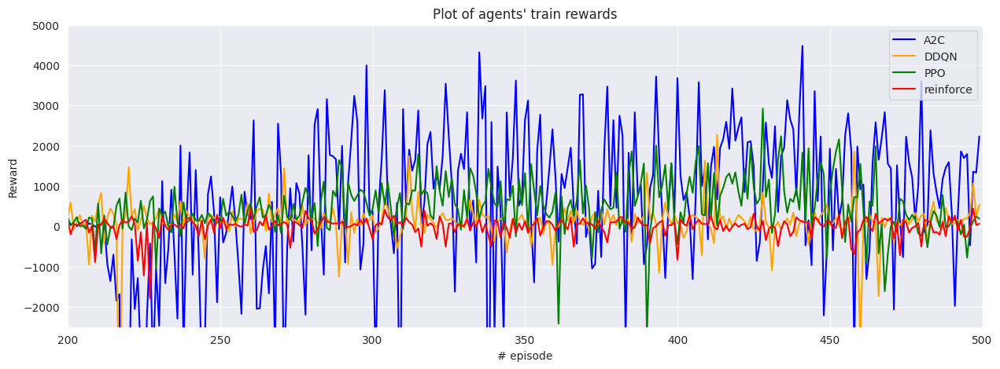

In [103]:
figure(figsize=(15, 5))
plt.plot(A2C, color='blue', label = 'A2C')
plt.plot(DDQN, color='orange', label = 'DDQN')
plt.plot(PPO, color='green', label = 'PPO')
plt.plot(reinforce, color='red', label = 'reinforce')
plt.ylim(-2500, 5000)
plt.xlim(200, 500)
plt.ylabel('Reward')
plt.xlabel('# episode')
plt.title("Plot of agents' train rewards")
plt.legend(loc="upper right");

In [104]:
def MA(interval):
    return np.convolve(interval, np.ones(int(5))/float(5), 'same')
A2C_m = MA(A2C)
DDQN_m = MA(DDQN)
PPO_m = MA(PPO)
reinforce_m = MA(reinforce)

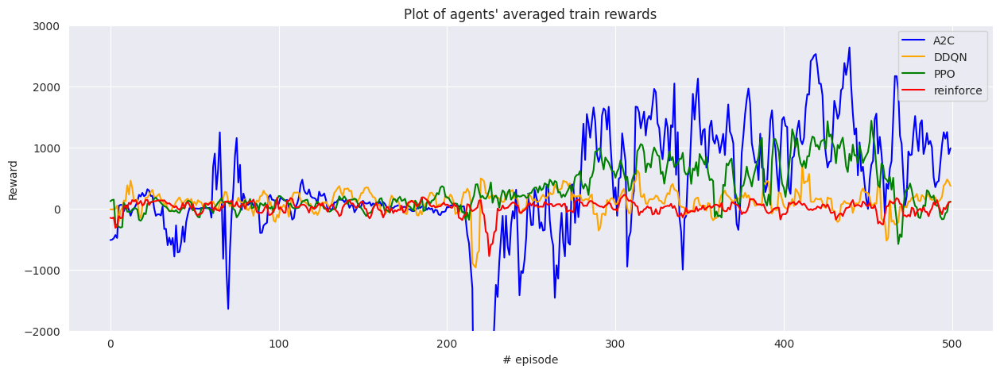

In [105]:
figure(figsize=(15, 5))
plt.plot(A2C_m, color='blue', label = 'A2C')
plt.plot(DDQN_m, color='orange', label = 'DDQN')
plt.plot(PPO_m, color='green', label = 'PPO')
plt.plot(reinforce_m, color='red', label = 'reinforce')
plt.ylim(-2000, 3000)
plt.ylabel('Reward')
plt.xlabel('# episode')
plt.title("Plot of agents' averaged train rewards")
plt.legend(loc="upper right");

# Выводы

- DDQN действительно не уступает другим агентам
- необходимо брать сложные модели с высокой волатильностью
- необходима тонкая настройка гиперпараметров данных моделей

# End